<a href="https://colab.research.google.com/github/SiefShama/Healthcare-Predictive-Analytics-Project/blob/Sief_Shama/Healthcare_Predictive_Analytics_Project_Diabetes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Science Project Workflow
# Healthcare Predictive Analytics Project

## Project Overview
The Healthcare Predictive Analytics project focuses on developing a predictive model to improve healthcare
outcomes by providing data-driven insights. The model will be designed to help healthcare professionals
with tasks such as patient risk prediction, trend identification in health metrics, and making informed
decisions based on predictive analytics. The project will utilize machine learning models to forecast
healthcare-related outcomes, focusing on improving patient care and resource management

- **Objective**: Define the problem and goals of the project.
- **Milestones**: Data Collection, Exploration, Preprocessing, Advanced Analysis, Model Development, Deployment, and Final Documentation.

---

<p style="color:red">Write the objectives as points after the introduction you wrote.</p>

# Team Information

## Team Members
- **Name**: Sief Mohamed Shama  
  **Email**: siefshama@gmail.com  
  **Role**: Data Scientist

- **Name**: Samara Elshafey Waged  
  **Email**: eng.samara.elshafey@gmail.com  
  **Role**: Data Scientist

- **Name**: Mahmoud Hammam Mohammad Samaha  
  **Email**: mhmood.hmmam@gmail.com  
  **Role**: Data Scientist

- **Name**: Shrouk Mamdouh Elsied Ahmed  
  **Email**: shroukhendawy79@gmail.com  
  **Role**: Data Scientist

- **Name**: Mohamed Zawam Senosy  
  **Email**: zawamfci2012@gmail.com  
  **Role**: Data Scientist

## Additional Information
- **Organization**: DEPI   
- **Project Timeline**: From 6 Dec 2024 to 10 April 2025  
- **Tools Used**: Python (Google Colab - VS code)
- **Contact for Inquiries**: siefshama@gmail.com

---

# Github instructions

Clone Github repo

In [ ]:
!git clone https://github.com/SiefShama/Healthcare-Predictive-Analytics-Project

Cloning into 'Healthcare-Predictive-Analytics-Project'...
remote: Enumerating objects: 135, done.
remote: Counting objects: 100% (135/135), done.
remote: Compressing objects: 100% (124/124), done.
remote: Total 135 (delta 65), reused 20 (delta 5), pack-reused 0 (from 0)
Receiving objects: 100% (135/135), 62.80 MiB | 7.85 MiB/s, done.
Resolving deltas: 100% (65/65), done.
Updating files: 100% (16/16), done.


Checking folders and files

In [ ]:
!ls

file2.csv  Healthcare-Predictive-Analytics-Project  sample_data


Open project file

In [ ]:
%cd Healthcare-Predictive-Analytics-Project

/content/Healthcare-Predictive-Analytics-Project


Checking file inside it

In [ ]:
!ls

 data							 healthcare_project.ipynb
 Healthcare_Predictive_Analytics_Project.ipynb		 models
'Healthcare Predictive Analytics Project Proposal.pdf'	 README.md


In [ ]:
!git status

On branch main
Your branch is up to date with 'origin/main'.

nothing to commit, working tree clean


# Milestone 1: Data Collection, Exploration, and Preprocessing

## Data Collection
- Acquire a dataset from reliable sources (e.g., Kaggle, UCI Repository, or APIs).
- **Scraping Data**:
  - Increase dataset size through web scraping or APIs (e.g., Selenium, BeautifulSoup).
  - Explore public repositories or other accessible sources for additional data.

### 2 Diabetes DB from UCI Repository
  - This source depends on data id in line 6 each id gives different database with different information
  - These are diabites datasets and in this part we show each one of them and their information
  - These data are the suitable data the can be used for data analysis and ML module training

#### General import library for

In [ ]:
pip install ucimlrepo


#### CDC Diabetes Health Indicators   Number of rows = 253680
https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators

The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy.


**Dataset Information**

**Purpose:**  
This dataset was created to better understand the relationship between lifestyle and diabetes in the US.

**Funding Source:**  
The dataset was funded by the Centers for Disease Control and Prevention (CDC).

**Instance Representation:**  
Each row represents a person participating in this study.

**Recommended Data Splits:**  
- Cross-validation can be used.  
- A fixed train-test split is also a viable option.

**Sensitive Data Fields:**  
The dataset contains information that might be considered sensitive, including:  
- Gender  
- Income  
- Education level  

**Data Preprocessing:**  
- Age values have been bucketed.

**Missing Values:**  
- No missing values are present in the dataset.

**Additional Information:**  
- Dataset Source: [CDC BRFSS 2014](https://www.cdc.gov/brfss/annual_data/annual_2014.html)


In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
cdc_diabetes_health_indicators = fetch_ucirepo(id=891)

# data (as pandas dataframes)
X = cdc_diabetes_health_indicators.data.features
y = cdc_diabetes_health_indicators.data.targets

# metadata
print(cdc_diabetes_health_indicators.metadata)

# variable information
print(cdc_diabetes_health_indicators.variables)

print('\n\nNumber of rows =',len(X))

{'uci_id': 891, 'name': 'CDC Diabetes Health Indicators', 'repository_url': 'https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators', 'data_url': 'https://archive.ics.uci.edu/static/public/891/data.csv', 'abstract': 'The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy. ', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Tabular', 'Multivariate'], 'num_instances': 253680, 'num_features': 21, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Sex', 'Age', 'Education Level', 'Income'], 'target_col': ['Diabetes_binary'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype
---  ------                --------------   -----
 0   HighBP                253680 non-null  int64
 1   HighChol              253680 non-null  int64
 2   CholCheck             253680 non-null  int64
 3   BMI                   253680 non-null  int64
 4   Smoker                253680 non-null  int64
 5   Stroke                253680 non-null  int64
 6   HeartDiseaseorAttack  253680 non-null  int64
 7   PhysActivity          253680 non-null  int64
 8   Fruits                253680 non-null  int64
 9   Veggies               253680 non-null  int64
 10  HvyAlcoholConsump     253680 non-null  int64
 11  AnyHealthcare         253680 non-null  int64
 12  NoDocbcCost           253680 non-null  int64
 13  GenHlth               253680 non-null  int64
 14  MentHlth              253680 non-null  int64
 15  PhysHlth              253680 non-n

 **Dataset Structure**

- **Total Rows:** 253,680  
- **Total Columns:** 21  
- **Data Types:** All columns are of type `int64` (integer values).   
- **Missing Values:** None (all columns contain 253,680 non-null entries).  

 **Column Descriptions**

| Column Name             | Data Type | Description                                                                 | Potential Use in Analysis                                        |
|-------------------------|-----------|-----------------------------------------------------------------------------|------------------------------------------------------------------|
| HighBP                 | int64     | High blood pressure (1 = Yes, 0 = No)                                      | Indicator of cardiovascular risk                                 |
| HighChol               | int64     | High cholesterol (1 = Yes, 0 = No)                                         | Related to heart disease risk                                    |
| CholCheck              | int64     | Cholesterol checked in the last 5 years (1 = Yes, 0 = No)                  | Preventative healthcare measure                                  |
| BMI                    | int64     | Body Mass Index (BMI) of the individual                                   | Key health metric linked to obesity and diseases                 |
| Smoker                 | int64     | Smoked at least 100 cigarettes in lifetime (1 = Yes, 0 = No)              | Risk factor for multiple health conditions                       |
| Stroke                 | int64     | History of stroke (1 = Yes, 0 = No)                                       | Indicator of prior cardiovascular incidents                      |
| HeartDiseaseorAttack   | int64     | History of heart disease or heart attack (1 = Yes, 0 = No)                | Key health outcome                                               |
| PhysActivity           | int64     | Engages in physical activity outside of work (1 = Yes, 0 = No)            | Indicator of lifestyle and fitness                               |
| Fruits                | int64     | Eats fruits at least once per day (1 = Yes, 0 = No)                       | Dietary habits related to health                                 |
| Veggies               | int64     | Eats vegetables at least once per day (1 = Yes, 0 = No)                   | Dietary habits related to health                                 |
| HvyAlcoholConsump      | int64     | Heavy alcohol consumption (Men: >14 drinks/week, Women: >7 drinks/week) (1 = Yes, 0 = No) | Risk factor for liver disease, cardiovascular disease            |
| AnyHealthcare         | int64     | Has any form of healthcare coverage (1 = Yes, 0 = No)                     | Accessibility to medical care                                    |
| NoDocbcCost           | int64     | Could not see a doctor due to cost (1 = Yes, 0 = No)                      | Indicator of economic barriers to healthcare                     |
| GenHlth               | int64     | General health rating (1 = Excellent, 2 = Very Good, 3 = Good, 4 = Fair, 5 = Poor) | Subjective health measure                                        |
| MentHlth              | int64     | Number of days in the past 30 days with poor mental health                 | Indicator of mental health issues                                |
| PhysHlth              | int64     | Number of days in the past 30 days with poor physical health               | Indicator of physical health issues                              |
| DiffWalk              | int64     | Serious difficulty walking or climbing stairs (1 = Yes, 0 = No)           | Mobility limitation indicator                                    |
| Sex                   | int64     | Gender of the individual (1 = Male, 0 = Female)                           | Demographic variable                                             |
| Age                   | int64     | Age category of the individual (bucketed into groups)                     | Key demographic feature                                          |
| Education             | int64     | Education level (1 = No school, 2 = Elementary, ..., 6 = College graduate) | Socioeconomic indicator                                          |
| Income                | int64     | Income level (1 = Low income, ..., 8 = High income)                       | Socioeconomic indicator                                          |




 **Key Notes**

- The dataset is **clean** with no missing values.  
- All features are **numerical**, making it suitable for machine learning models.  
- Some categorical variables (e.g., **Sex, Education, Income, Age**) are represented as integers and may need encoding.  
- **BMI, Mental Health, and Physical Health** may require normalization or transformation for better model performance.  



In [ ]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 1 columns):
 #   Column           Non-Null Count   Dtype
---  ------           --------------   -----
 0   Diabetes_binary  253680 non-null  int64
dtypes: int64(1)
memory usage: 1.9 MB


**Dataset Overview**

This dataset consists of a single column named **Diabetes_binary**, containing information about whether an individual has been diagnosed with diabetes. It is a **binary classification dataset**, meaning the values are either **1 (Diabetes)** or **0 (No Diabetes)**.  

**Dataset Structure**

- **Total Rows:** 253,680  
- **Total Columns:** 1  
- **Column Name:** `Diabetes_binary`  
- **Data Type:** `int64` (integer values)   
- **Missing Values:** None (100% complete data).  

**Column Description**

| Column Name       | Data Type | Description                                      | Potential Use in Analysis                    |
|------------------|-----------|--------------------------------------------------|----------------------------------------------|
| Diabetes_binary | int64     | Indicates whether the individual has diabetes (1 = Yes, 0 = No) | Target variable for diabetes prediction models |
**Key Notes**  

- The dataset is **clean** with no missing values.  
- The column is **binary (0 or 1)**, making it ideal for classification models.  
- This dataset is often used as a **target variable** in machine learning models for **diabetes prediction**.  




In [ ]:
X.head()

,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,Veggies,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,1,1,1,40,1,0,0,0,0,1,...,1,0,5,18,15,1,0,9,4,3
1,0,0,0,25,1,0,0,1,0,0,...,0,1,3,0,0,0,0,7,6,1
2,1,1,1,28,0,0,0,0,1,0,...,1,1,5,30,30,1,0,9,4,8
3,1,0,1,27,0,0,0,1,1,1,...,1,0,2,0,0,0,0,11,3,6
4,1,1,1,24,0,0,0,1,1,1,...,1,0,2,3,0,0,0,11,5,4


In [ ]:
y.head()

,Diabetes_binary
0,0
1,0
2,0
3,0
4,0


#### Diabetes 130-US Hospitals for Years 1999-2008  Number of rows = 101766


https://archive.ics.uci.edu/dataset/296/diabetes+130-us+hospitals+for+years+1999-2008

The dataset represents ten years (1999-2008) of clinical care at 130 US hospitals and integrated delivery networks. Each row concerns hospital records of patients diagnosed with diabetes, who underwent laboratory, medications, and stayed up to 14 days. The goal is to determine the early readmission of the patient within 30 days of discharge. The problem is important for the following reasons. Despite high-quality evidence showing improved clinical outcomes for diabetic patients who receive various preventive and therapeutic interventions, many patients do not receive them. This can be partially attributed to arbitrary diabetes management in hospital environments, which fail to attend to glycemic control. Failure to provide proper diabetes care not only increases the managing costs for the hospitals (as the patients are readmitted) but also impacts the morbidity and mortality of the patients, who may face complications associated with diabetes.



Overview  

This dataset contains **hospitalized patient records diagnosed with diabetes**. The data spans **ten years (1999-2008)** and includes records from **130 US hospitals and integrated delivery networks**. It consists of **over 50 features** representing **patient and hospital outcomes**.  

 Dataset Details  

 Instances Representation  
Each instance in this dataset represents a **hospital admission** where the patient was diagnosed with diabetes.  

 Data Splits Recommendation  
- No specific recommendation.  
- Standard **train-test split** can be used.  
- A **three-way holdout split** (train-validation-test) is suggested for **model selection**.  

 Sensitive Data  
Yes, the dataset contains sensitive information, including:  
- **Age**  
- **Gender**  
- **Race**  

 Dataset Scope  
The dataset includes records that satisfy the following conditions:  
1. The encounter is an **inpatient hospital admission**.  
2. The patient was diagnosed with **any form of diabetes** during the encounter.  
3. The **length of stay** is between **1 and 14 days**.  
4. **Laboratory tests** were performed during the hospital stay.  
5. **Medications** were administered during the encounter.  

 Key Features  
The dataset contains attributes such as:  
- **Patient number**  
- **Demographics** (race, gender, age)  
- **Admission type**  
- **Length of hospital stay**  
- **Medical specialty** of the admitting physician  
- **Number of lab tests performed**  
- **HbA1c test results**  
- **Diagnosis information**  
- **Number of medications prescribed**  
- **Diabetic medications administered**  
- **Outpatient, inpatient, and emergency visits** in the year before hospitalization  

 Missing Values  
✅ **Yes**, the dataset contains missing values.  




In [ ]:
from ucimlrepo import fetch_ucirepo

# fetch dataset
diabetes_130_us_hospitals_for_years_1999_2008 = fetch_ucirepo(id=296)

# data (as pandas dataframes)
X = diabetes_130_us_hospitals_for_years_1999_2008.data.features
y = diabetes_130_us_hospitals_for_years_1999_2008.data.targets

# metadata
print(diabetes_130_us_hospitals_for_years_1999_2008.metadata)

# variable information
print(diabetes_130_us_hospitals_for_years_1999_2008.variables)


print('\n\nNumber of rows =',len(X))

{'uci_id': 296, 'name': 'Diabetes 130-US Hospitals for Years 1999-2008', 'repository_url': 'https://archive.ics.uci.edu/dataset/296/diabetes+130-us+hospitals+for+years+1999-2008', 'data_url': 'https://archive.ics.uci.edu/static/public/296/data.csv', 'abstract': 'The dataset represents ten years (1999-2008) of clinical care at 130 US hospitals and integrated delivery networks. Each row concerns hospital records of patients diagnosed with diabetes, who underwent laboratory, medications, and stayed up to 14 days. The goal is to determine the early readmission of the patient within 30 days of discharge.\nThe problem is important for the following reasons. Despite high-quality evidence showing improved clinical outcomes for diabetic patients who receive various preventive and therapeutic interventions, many patients do not receive them. This can be partially attributed to arbitrary diabetes management in hospital environments, which fail to attend to glycemic control. Failure to provide pro

/usr/local/lib/python3.11/dist-packages/ucimlrepo/fetch.py:97: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(data_url)


In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 47 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      99493 non-null   object
 1   gender                    101766 non-null  object
 2   age                       101766 non-null  object
 3   weight                    3197 non-null    object
 4   admission_type_id         101766 non-null  int64 
 5   discharge_disposition_id  101766 non-null  int64 
 6   admission_source_id       101766 non-null  int64 
 7   time_in_hospital          101766 non-null  int64 
 8   payer_code                61510 non-null   object
 9   medical_specialty         51817 non-null   object
 10  num_lab_procedures        101766 non-null  int64 
 11  num_procedures            101766 non-null  int64 
 12  num_medications           101766 non-null  int64 
 13  number_outpatient         101766 non-null  int64 
 14  numb

**Dataset Structure**

- **Total Entries:** 101,766  
- **Total Columns:** 47   
- **Missing Values:** Present in multiple columns  

 **Data Dictionary**  

 **Demographic Information**  
- `race` - Patient’s race (`object`), has missing values.  
- `gender` - Patient’s gender (`object`).  
- `age` - Age group of the patient (`object`).  
- `weight` - Patient’s weight (`object`), has significant missing values.  

 **Hospital Admission & Discharge Details**  
- `admission_type_id` - Type of hospital admission (`int64`).  
- `discharge_disposition_id` - Patient's discharge status (`int64`).  
- `admission_source_id` - Source of patient admission (`int64`).  
- `time_in_hospital` - Duration of hospital stay in days (`int64`).  

 **Medical and Diagnosis Data**  
- `num_lab_procedures` - Number of lab tests performed (`int64`).  
- `num_procedures` - Number of procedures performed (`int64`).  
- `num_medications` - Number of medications administered (`int64`).  
- `number_outpatient` - Number of outpatient visits in the past year (`int64`).  
- `number_emergency` - Number of emergency visits in the past year (`int64`).  
- `number_inpatient` - Number of inpatient visits in the past year (`int64`).  
- `diag_1`, `diag_2`, `diag_3` - Primary and secondary diagnoses (`object`), some missing values.  
- `number_diagnoses` - Total number of diagnoses assigned (`int64`).  

 **Lab Test Results**  
- `max_glu_serum` - Glucose serum test result (`object`), has missing values.  
- `A1Cresult` - HbA1c test result (`object`), has missing values.  

 **Medications Administered**  
Binary (`Yes/No` or categorical values) indicating the prescription status of various diabetes medications, including:  
- `metformin`, `insulin`, `glyburide`, `glipizide`, `glimepiride`, `pioglitazone`, etc.  

 **Treatment & Outcome Indicators**  
- `change` - Indicates whether there was a change in diabetes medication (`object`).  
- `diabetesMed` - Indicates whether the patient was on diabetes medication (`object`).  


---

**Dataset Summary Table**

| **Column Name**                 | **Data Type** | **Description**                                           | **Potential Use in Analysis**                              |
|---------------------------------|--------------|-------------------------------------------------------|-------------------------------------------------------|
| `race`                          | Object       | Patient’s race (has missing values)                  | Used for demographic analysis and disparity studies  |
| `gender`                        | Object       | Patient’s gender                                     | Useful for gender-based analysis of diabetes trends |
| `age`                           | Object       | Age group of the patient                            | Helps in age-group-based risk analysis              |
| `weight`                        | Object       | Patient’s weight (significant missing values)       | May be useful in BMI-related studies if completed   |
| `admission_type_id`             | Int64        | Type of hospital admission                          | Useful in hospital admission pattern analysis       |
| `discharge_disposition_id`      | Int64        | Patient's discharge status                         | Helps analyze patient outcomes                      |
| `admission_source_id`           | Int64        | Source of patient admission                        | Useful for tracking referral sources               |
| `time_in_hospital`              | Int64        | Duration of hospital stay (in days)                | Important for predicting hospital resource usage   |
| `payer_code`                    | Object       | Insurance payer code (missing values present)      | Useful for financial and insurance-based analysis  |
| `medical_specialty`             | Object       | Physician’s specialty (high missing values)        | Helps analyze specialty-related treatment trends   |
| `num_lab_procedures`            | Int64        | Number of lab tests performed                      | Indicator of diagnostic intensity                  |
| `num_procedures`                | Int64        | Number of procedures performed                     | Helps analyze treatment patterns                   |
| `num_medications`               | Int64        | Number of medications administered                 | Indicator of treatment complexity                  |
| `number_outpatient`             | Int64        | Number of outpatient visits in the past year      | Useful for analyzing prior outpatient visits       |
| `number_emergency`              | Int64        | Number of emergency visits in the past year       | Important for predicting emergency care reliance   |
| `number_inpatient`              | Int64        | Number of inpatient visits in the past year       | Helps analyze readmission risks                    |
| `diag_1`, `diag_2`, `diag_3`    | Object       | Primary and secondary diagnoses (some missing)    | Important for disease classification               |
| `number_diagnoses`              | Int64        | Total number of diagnoses assigned                 | Useful in multi-morbidity analysis                 |
| `max_glu_serum`                 | Object       | Glucose serum test result (missing values)        | Indicator of blood sugar levels                    |
| `A1Cresult`                     | Object       | HbA1c test result (missing values)                | Used to track long-term diabetes control           |
| `metformin`, `insulin`, etc.    | Object       | Diabetes medications prescribed                    | Helps analyze medication usage trends              |
| `change`                        | Object       | Whether there was a change in diabetes medication | Useful for tracking treatment modifications        |
| `diabetesMed`                   | Object       | Whether the patient was on diabetes medication    | Key feature in diabetes treatment analysis        |

---


 **Missing Values**  
Several columns contain missing values, particularly:  
- `race` (6,273 missing values)  
- `weight` (significant missing values, only 3,197 non-null)  
- `payer_code` (40,256 missing values)  
- `medical_specialty` (49,949 missing values)  
- `diag_1`, `diag_2`, `diag_3` (some missing values)  
- `max_glu_serum`, `A1Cresult` (significant missing values)  

 **Key Notes**  
- The dataset is **imbalanced**, with missing values in key demographic and lab test features.  
- Diagnosis codes (`diag_1`, `diag_2`, `diag_3`) may require **categorization** for better analysis.  
- The dataset is useful for **predictive modeling** in **diabetes management** and **hospital readmission risk**.  







In [ ]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 1 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   readmitted  101766 non-null  object
dtypes: object(1)
memory usage: 795.2+ KB




 **Dataset Structure**  
- **Total Entries:** 101,766  
- **Total Columns:** 1  
- **Data Type:** Object (`str`)  


**Column Description**  
Here’s the updated dataset structure in table format:

| Column Name  | Data Type | Description | Potential Use in Analysis |
|-------------|----------|-------------|---------------------------|
| `readmitted` | Object (`str`) | Indicates whether the patient was readmitted. Values: `"NO"` (not readmitted), `"<30"` (readmitted within 30 days), `">30"` (readmitted after 30 days). | Key target variable for **predictive modeling** of hospital readmissions. Helps identify factors influencing **early readmission rates**. |


 **Key Insights**  
- The column is essential for **hospital readmission analysis**, which can help identify factors contributing to **frequent readmissions**.  
- This dataset can be used for **predictive modeling** to determine which patients are at a **higher risk of early readmission**.  
- Readmission rates are an important **hospital performance metric**, impacting **healthcare costs** and **patient care quality**.  




In [ ]:
X.head()

,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,payer_code,medical_specialty,...,examide,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed
0,Caucasian,Female,[0-10),NaN,6,25,1,1,NaN,Pediatrics-Endocrinology,...,No,No,No,No,No,No,No,No,No,No
1,Caucasian,Female,[10-20),NaN,1,1,7,3,NaN,NaN,...,No,No,Up,No,No,No,No,No,Ch,Yes
2,AfricanAmerican,Female,[20-30),NaN,1,1,7,2,NaN,NaN,...,No,No,No,No,No,No,No,No,No,Yes
3,Caucasian,Male,[30-40),NaN,1,1,7,2,NaN,NaN,...,No,No,Up,No,No,No,No,No,Ch,Yes
4,Caucasian,Male,[40-50),NaN,1,1,7,1,NaN,NaN,...,No,No,Steady,No,No,No,No,No,Ch,Yes


In [ ]:
y.head()

,readmitted
0,NO
1,>30
2,NO
3,NO
4,NO


### General diabetes DB
 **Dataset Schema**

| Column Name         | Data Type  | Description | Potential Use in Analysis |
|---------------------|-----------|-------------|--------------------------|
| **Diabetes_State**  | `int64`   | Indicates if the individual has diabetes (`1` = Yes, `0` = No). | Target variable for diabetes prediction models. |
| **HB**             | `float64` | High blood pressure level. | Risk factor for diabetes and heart disease. |
| **Cholesterol**    | `float64` | Total cholesterol level. | High levels may indicate risk of diabetes or cardiovascular disease. |
| **BMI**            | `float64` | Body Mass Index (BMI). | Used to assess obesity, a risk factor for diabetes. |
| **Heart_Disease**  | `float64` | Indicates history of heart disease or heart attack. | Useful for assessing comorbidities with diabetes. |
| **PhysActivity**   | `float64` | Whether the individual exercises regularly (`1` = Yes, `0` = No). | Physical activity helps in managing diabetes. |
| **PhysHlth**       | `int64`   | Number of days in the past month with poor physical health. | Indicator of overall health and chronic conditions. |
| **Gender**         | `float64` | Gender (`1` = Male, `0` = Female). | Used for demographic analysis in health studies. |
| **Age**           | `int64`   | Age group classification. | Age is a major risk factor for diabetes. |
| **Stroke**        | `float64` | Whether the individual has had a stroke (`1` = Yes, `0` = No). | Stroke risk increases with diabetes. |
| **GenHlth**       | `float64` | Self-reported general health (`1` = Excellent, ... , `5` = Poor). | Subjective health assessment for predictive models. |
| **CholCheck**     | `float64` | Whether cholesterol was checked in the past 5 years (`1` = Yes, `0` = No). | Preventive health measure for cardiovascular risks. |
| **Smoker**        | `float64` | Whether the individual is a smoker (`1` = Yes, `0` = No). | Smoking is a risk factor for diabetes complications. |
| **Fruits**        | `float64` | Whether the individual consumes fruits regularly (`1` = Yes, `0` = No). | Affects diet-related diabetes risk. |
| **Veggies**       | `float64` | Whether the individual consumes vegetables regularly (`1` = Yes, `0` = No). | Indicator of a healthy diet. |
| **HvyAlcoholConsump** | `float64` | Heavy alcohol consumption (`1` = Yes, `0` = No). | Excessive drinking can increase diabetes risk. |
| **MentHlth**      | `float64` | Number of days in the past month with poor mental health. | Mental health impacts overall well-being. |
| **DiffWalk**      | `float64` | Difficulty walking or climbing stairs (`1` = Yes, `0` = No). | Indicator of mobility issues related to diabetes. |
| **ID**           | `int64`   | Unique patient identifier. | Used for tracking individual records. |
| **Race**         | `object`  | Patient's racial background. | Useful for studying disparities in diabetes prevalence. |
| **Weight**       | `object`  | Weight of the patient (missing for most records). | Can be used for BMI calculations if data is available. |

## **Key Notes**
- Some features have **missing values** (e.g., `Weight`, `Race`, `HB`, `Cholesterol`).
- The dataset can be used for **predictive modeling** (e.g., diabetes risk classification).
- Features related to **physical health, diet, and lifestyle** provide valuable insights into diabetes prevention.
- Combining multiple factors (e.g., **BMI, cholesterol, physical activity**) may improve **diabetes risk assessment models**.


We have 2 datasets for diabites
In this part we mix these datasets and get a usable big dataset good enuogh to be used in data analysis and train ML module

This part we start to mix two diabetes datasets in these steps


1.   Load each dataset and show its columns and rows
2.   Create 2 new tables smaller with usable columns from the datasets
3.   Create a new data sets with columns name and all columns that we will need
4.   Modify each of two tables to be suitable to merge and put them in the new data set
5.   Fill the new data set with both tables after modifying



#### importing data source libraries  UCI Repository

In [ ]:
# Install the required package
!pip install ucimlrepo

# Import necessary libraries
from ucimlrepo import fetch_ucirepo
import pandas as pd


#### Fetch Datasets from UCI ML Repository

In [ ]:
# Fetch CDC Diabetes Health Indicators dataset
cdc_diabetes_health_indicators = fetch_ucirepo(id=891)
cdc_data = cdc_diabetes_health_indicators.data.original


# Print metadata and number of rows for both datasets
#print("CDC Diabetes Health Indicators Metadata:")
#print(cdc_diabetes_health_indicators.metadata)

#print("\nNumber of rows in CDC dataset =", len(cdc_data))


In [ ]:
# Fetch Diabetes 130-US Hospitals dataset
diabetes_130_us_hospitals = fetch_ucirepo(id=296)
hospitals_data = diabetes_130_us_hospitals.data.original

# Print metadata and number of rows for both datasets
#print("\nDiabetes 130-US Hospitals Metadata:")
#print(diabetes_130_us_hospitals.metadata)

#print("\nNumber of rows in Hospitals dataset =", len(hospitals_data))

/usr/local/lib/python3.11/dist-packages/ucimlrepo/fetch.py:97: DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(data_url)




We fetch two different diabetes-related datasets from the UCI repository.

- cdc_data: Contains health indicators related to diabetes.

- hospitals_data: Contains hospitalization records for diabetes patients.

#### Display columns and examples, check for missing values

In [ ]:
# Task 2: Display columns and examples, check for missing values
print("\nCDC Diabetes Health Indicators Columns:")
print(cdc_data.columns)
print("\nExample rows:")
print(cdc_data.head())
print("\nMissing values in CDC dataset:")
print(cdc_data.isnull().sum())



CDC Diabetes Health Indicators Columns:
Index(['ID', 'Diabetes_binary', 'HighBP', 'HighChol', 'CholCheck', 'BMI',
       'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits',
       'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost',
       'GenHlth', 'MentHlth', 'PhysHlth', 'DiffWalk', 'Sex', 'Age',
       'Education', 'Income'],
      dtype='object')

Example rows:
   ID  Diabetes_binary  HighBP  HighChol  CholCheck  BMI  Smoker  Stroke  \
0   0                0       1         1          1   40       1       0   
1   1                0       0         0          0   25       1       0   
2   2                0       1         1          1   28       0       0   
3   3                0       1         0          1   27       0       0   
4   4                0       1         1          1   24       0       0   

   HeartDiseaseorAttack  PhysActivity  ...  AnyHealthcare  NoDocbcCost  \
0                     0             0  ...              1            0

<p style="color:red">Why check for missing values at this stage?</p>

In [ ]:
# Task 2: Display columns and examples, check for missing values

print("\nDiabetes 130-US Hospitals Columns:")
print(hospitals_data.columns)
print("\nExample rows:")
print(hospitals_data.head())
print("\nMissing values in Hospitals dataset:")
print(hospitals_data.isnull().sum())


Diabetes 130-US Hospitals Columns:
Index(['encounter_id', 'patient_nbr', 'race', 'gender', 'age', 'weight',
       'admission_type_id', 'discharge_disposition_id', 'admission_source_id',
       'time_in_hospital', 'payer_code', 'medical_specialty',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_outpatient', 'number_emergency', 'number_inpatient', 'diag_1',
       'diag_2', 'diag_3', 'number_diagnoses', 'max_glu_serum', 'A1Cresult',
       'metformin', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'glipizide', 'glyburide', 'tolbutamide',
       'pioglitazone', 'rosiglitazone', 'acarbose', 'miglitol', 'troglitazone',
       'tolazamide', 'examide', 'citoglipton', 'insulin',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'change', 'diabetesMed', 'readmitted'],
      dtype='object')

Example rows:
   encounter_id  p

<p style="color:red">Why check for missing values at this stage?</p>

This is simple display for each dataset basic info

#### Create new tables

In [ ]:
# Define structure for CDC_DB
cdc_columns = ["Diabetes_binary", "HighBP", "HighChol", "BMI", "HeartDiseaseorAttack",
               "PhysActivity", "PhysHlth", "Sex", "Age", "Stroke", "ID" ,"GenHlth","CholCheck","Smoker","Fruits","Veggies","HvyAlcoholConsump","MentHlth","DiffWalk"]
CDC_DB = pd.DataFrame(columns=cdc_columns)

<p style="color:red">Better have all the column names in small letters</p>

In [ ]:
# Define structure for H_DB
h_columns = ["Race", "Gender", "Age", "Weight", "diabetesMed", "time_in_hospital", "patient_nbr"]
H_DB = pd.DataFrame(columns=h_columns)

<p style="color:red">Better have all the column names in small letters</p>

In [ ]:
# Define structure for Data_Table
data_table_columns = ["Age", "Gender", "BMI", "Diabetes_State", "HB", "Heart_Disease",
                      "Cholesterol", "PhysHlth", "PhysActivity", "Stroke", "ID", "Race","GenHlth","CholCheck","Smoker","Fruits","Veggies","HvyAlcoholConsump","MentHlth","DiffWalk"]
Data_Table = pd.DataFrame(columns=data_table_columns)


<p style="color:red">Better have all the column names in small letters</p>

Explanation:

- CDC_DB will store health indicators from the CDC dataset.

- H_DB will store hospitalization records from the hospital dataset.

- Data_Table is the final dataset after merging.



#### Extract & Process Data From CDC Dataset and Hospitals Dataset

In [ ]:

# Task 4: Fill CDC_DB and H_DB
CDC_DB = cdc_data[["Diabetes_binary", "HighBP", "HighChol", "BMI", "HeartDiseaseorAttack",
                   "PhysActivity", "PhysHlth", "Sex", "Age", "Stroke","GenHlth","CholCheck","Smoker","Fruits","Veggies","HvyAlcoholConsump","MentHlth","DiffWalk"]].copy()
CDC_DB["ID"] = range(1, len(CDC_DB) + 1)




Explanation:

- We extract relevant features from cdc_data.

- An "ID" column is added to help track records when merging.

In [ ]:
H_DB = hospitals_data[["race", "gender", "age", "weight", "diabetesMed", "time_in_hospital", "patient_nbr"]].copy()
H_DB.columns = h_columns  # Rename columns to match our table structure



Explanation:

-We extract hospital-related features from hospitals_data.

-Renaming ensures consistency with other datasets.



#### Remapping valus in columns


In [ ]:
# Convert HB.Age from categorical to integer
age_map = {
    "[0-10)": 5, "[10-20)": 15, "[20-30)": 25, "[30-40)": 35, "[40-50)": 45,
    "[50-60)": 55, "[60-70)": 65, "[70-80)": 75, "[80-90)": 85, "[90-100)": 95
}
H_DB["Age"] = H_DB["Age"].map(age_map)

Explanation:

- In H_DB, ages are stored as ranges (e.g., [40-50)).

- We map these to approximate midpoint values for numerical analysis.

In [ ]:
# Convert HB.Gender to binary
gender_map = {"Female": 0, "Male": 1}
H_DB["Gender"] = H_DB["Gender"].map(gender_map)

<p style="color:red">Feature mapping is part of the feature transformation to be done in the preprocessing part, not here, unless you are doing it for merge, but I prefer to merge the data as it is, then solve the issues you find in it.</p>

Gender is converted into binary values for easier ML processing and to be the same as second dataset.



In [ ]:
# Convert HB.diabetesMed to binary
diabetes_med_map = {"Yes": 1, "No": 0}
H_DB["diabetesMed"] = H_DB["diabetesMed"].map(diabetes_med_map)


<p style="color:red">Feature mapping is part of the feature transformation to be done in the preprocessing part, not here, unless you are doing it for merge, but I prefer to merge the data as it is, then solve the issues you find in it.</p>

Diabetes medication is mapped to binary (1 for Yes, 0 for No) and to be the same as second dataset.

#### Rename columns name

In [ ]:
# Populate CDC_DB_renamed with CDC_DB first
CDC_DB_renamed = CDC_DB.rename(columns={
    "Sex": "Gender", "Diabetes_binary": "Diabetes_State", "HighBP": "HB",
    "HeartDiseaseorAttack": "Heart_Disease", "HighChol": "Cholesterol"
})

# Add H_DB rows to Data_Table
H_DB_renamed = H_DB.rename(columns={
    "patient_nbr": "ID", "diabetesMed": "Diabetes_State", "time_in_hospital": "PhysHlth"
})


Explanation:

We rename columns to match the final dataset format before merging.

####  Merge tables and verify the Merged Dataset


🔗 Merging Strategy

 **Type of Merge Applied**
In this project, we will use **row-wise concatenation** (`pd.concat()`) to merge the datasets.  
This means we are stacking data **vertically**, adding new records while keeping the same column structure.

 **Matching Columns Between Datasets**
Since we are concatenating rows, the datasets must have matching columns. We ensured consistency by renaming the columns before merging.  

| Column Name in `CDC_DB`  | Column Name in `H_DB`  | Unified Column Name in `Data_Table` |
|--------------------------|-----------------------|----------------------------------|
| `Diabetes_binary`        | `diabetesMed`         | `Diabetes_State`                |
| `HighBP`                | *(Not present in H_DB)* | `HB`                            |
| `HighChol`              | *(Not present in H_DB)* | `Cholesterol`                   |
| `BMI`                   | *(Not present in H_DB)* | `BMI`                           |
| `HeartDiseaseorAttack`  | *(Not present in H_DB)* | `Heart_Disease`                 |
| `PhysActivity`          | *(Not present in H_DB)* | `PhysActivity`                   |
| `PhysHlth`              | `time_in_hospital`     | `PhysHlth`                      |
| `Sex`                   | `Gender`               | `Gender`                         |
| `Age`                   | `Age`                  | `Age`                            |
| `Stroke`                | *(Not present in H_DB)* | `Stroke`                         |
| `GenHlth`               | *(Not present in H_DB)* | `GenHlth`                        |
| `CholCheck`             | *(Not present in H_DB)* | `CholCheck`                      |
| `Smoker`                | *(Not present in H_DB)* | `Smoker`                         |
| `Fruits`                | *(Not present in H_DB)* | `Fruits`                         |
| `Veggies`               | *(Not present in H_DB)* | `Veggies`                        |
| `HvyAlcoholConsump`     | *(Not present in H_DB)* | `HvyAlcoholConsump`              |
| `MentHlth`              | *(Not present in H_DB)* | `MentHlth`                       |
| `DiffWalk`              | *(Not present in H_DB)* | `DiffWalk`                       |
| `ID`                    | `patient_nbr`          | `ID` (Unique Identifier)         |

 **Why Concatenating Rows?**
- The two datasets represent **different sets of patients** (one from CDC, one from hospitals).  
- We want to **combine patient records from both datasets into a single dataset** for analysis.  
- Row-wise concatenation allows us to **unify different data sources** while keeping track of unique IDs.  


In [ ]:
Data_Table = pd.concat([CDC_DB_renamed, H_DB_renamed], ignore_index=True)

# Task 6: Show Data_Table length and components
print("\nData_Table Length:", len(Data_Table))
print("\nData_Table Columns:", Data_Table.columns)
print("\nExample Rows from Data_Table:")
print(Data_Table.head())


Data_Table Length: 355446

Data_Table Columns: Index(['Diabetes_State', 'HB', 'Cholesterol', 'BMI', 'Heart_Disease',
       'PhysActivity', 'PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth',
       'CholCheck', 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump',
       'MentHlth', 'DiffWalk', 'ID', 'Race', 'Weight'],
      dtype='object')

Example Rows from Data_Table:
   Diabetes_State   HB  Cholesterol   BMI  Heart_Disease  PhysActivity  \
0               0  1.0          1.0  40.0            0.0           0.0   
1               0  0.0          0.0  25.0            0.0           1.0   
2               0  1.0          1.0  28.0            0.0           0.0   
3               0  1.0          0.0  27.0            0.0           1.0   
4               0  1.0          1.0  24.0            0.0           1.0   

   PhysHlth  Gender  Age  Stroke  ...  CholCheck  Smoker  Fruits  Veggies  \
0        15     0.0    9     0.0  ...        1.0     1.0     0.0      1.0   
1         0     0.0    7     

Showing The new dataset Informations to check number of rows of each columns and with looking check the suitable columns (with a little amount of empty cell) and drop the rest


In [ ]:
Data_Table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355446 entries, 0 to 355445
Data columns (total 21 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Diabetes_State     355446 non-null  int64  
 1   HB                 253680 non-null  float64
 2   Cholesterol        253680 non-null  float64
 3   BMI                253680 non-null  float64
 4   Heart_Disease      253680 non-null  float64
 5   PhysActivity       253680 non-null  float64
 6   PhysHlth           355446 non-null  int64  
 7   Gender             355443 non-null  float64
 8   Age                355446 non-null  int64  
 9   Stroke             253680 non-null  float64
 10  GenHlth            253680 non-null  float64
 11  CholCheck          253680 non-null  float64
 12  Smoker             253680 non-null  float64
 13  Fruits             253680 non-null  float64
 14  Veggies            253680 non-null  float64
 15  HvyAlcoholConsump  253680 non-null  float64
 16  Me

**1️⃣ Number of Entries (Rows)**
- The dataset contains **355,446 rows** (individual patient records).
- This number suggests that the **CDC dataset** (≈ 253,680 rows) contributes the majority of records, while the **hospital dataset** (≈ 99,493 rows) adds a smaller subset.

**2️⃣ Number of Columns (Features)**
- The dataset consists of **21 columns**, representing different health indicators and patient attributes.

---

**3️⃣ Column Breakdown**
Each column represents a health-related metric or demographic attribute. Here’s a detailed analysis:

| **#** | **Column Name**      | **Non-Null Count** | **Data Type** | **Description** |
|----|------------------|-----------------|------------|----------------|
| 0  | `Diabetes_State` | 355,446 (✅ No Missing) | `int64` | Binary indicator for diabetes presence (1 = Yes, 0 = No). |
| 1  | `HB`            | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Indicator for high blood pressure (from CDC data). |
| 2  | `Cholesterol`   | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Indicator for high cholesterol levels (from CDC data). |
| 3  | `BMI`           | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Body Mass Index (from CDC data). |
| 4  | `Heart_Disease` | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Indicator for heart disease/attack (from CDC data). |
| 5  | `PhysActivity`  | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Physical activity indicator (from CDC data). |
| 6  | `PhysHlth`      | 355,446 (✅ No Missing) | `int64` | Number of physically unhealthy days in the last month (CDC) / Time spent in hospital (Hospital dataset). |
| 7  | `Gender`        | 355,443 (⚠️ 3 Missing) | `float64` | Gender (0 = Female, 1 = Male). |
| 8  | `Age`           | 355,446 (✅ No Missing) | `int64` | Age in numerical format (converted from hospital dataset’s categorical format). |
| 9  | `Stroke`        | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Stroke history indicator (from CDC data). |
| 10 | `GenHlth`       | 253,680 (⚠️ Missing in Hospital Data) | `float64` | General health rating (from CDC data). |
| 11 | `CholCheck`     | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Indicator for cholesterol check (from CDC data). |
| 12 | `Smoker`        | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Smoking status indicator (from CDC data). |
| 13 | `Fruits`        | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Indicator for fruit consumption (from CDC data). |
| 14 | `Veggies`       | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Indicator for vegetable consumption (from CDC data). |
| 15 | `HvyAlcoholConsump` | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Indicator for heavy alcohol consumption (from CDC data). |
| 16 | `MentHlth`      | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Number of mentally unhealthy days in the last month (CDC). |
| 17 | `DiffWalk`      | 253,680 (⚠️ Missing in Hospital Data) | `float64` | Indicator for walking difficulty (from CDC data). |
| 18 | `ID`            | 355,446 (✅ No Missing) | `int64` | Unique identifier assigned to each patient. |
| 19 | `Race`          | 99,493 (⚠️ Hospital Data Only) | `object` | Patient’s race (available only in hospital data). |
| 20 | `Weight`        | 3,197 (⚠️ Hospital Data Only) | `object` | Patient’s weight category (available only in hospital data). |

---

 **4️⃣ Key Observations**

🔹 **Missing Values:**  
- The **CDC dataset contributes most of the missing values** in columns like `HB`, `Cholesterol`, `BMI`, etc., since these features are not available in the hospital dataset.
- The **Hospital dataset contains `Race` and `Weight`,** but these fields are **mostly missing** since they don’t exist in the CDC data.

🔹 **Column Data Types:**  
- **15 columns are `float64` (numeric indicators).**
- **4 columns are `int64` (discrete numeric values).**
- **2 columns are `object` (categorical: `Race` and `Weight`).**

🔹 **Merge Strategy Validation:**  
- The large difference in non-null counts shows that **merging was done correctly** using **row-wise concatenation.**
- Some features are **exclusive to one dataset** (e.g., `Race`, `Weight` from hospital data), while others are **only in the CDC dataset** (e.g., `HB`, `Cholesterol`, `PhysActivity`).

---


Showing the Sample of the data in the dataset

In [ ]:
Data_Table.head()

,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,...,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk,ID,Race,Weight
0,0,1.0,1.0,40.0,0.0,0.0,15,0.0,9,0.0,...,1.0,1.0,0.0,1.0,0.0,18.0,1.0,1,NaN,NaN
1,0,0.0,0.0,25.0,0.0,1.0,0,0.0,7,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2,NaN,NaN
2,0,1.0,1.0,28.0,0.0,0.0,30,0.0,9,0.0,...,1.0,0.0,1.0,0.0,0.0,30.0,1.0,3,NaN,NaN
3,0,1.0,0.0,27.0,0.0,1.0,0,0.0,11,0.0,...,1.0,0.0,1.0,1.0,0.0,0.0,0.0,4,NaN,NaN
4,0,1.0,1.0,24.0,0.0,1.0,0,0.0,11,0.0,...,1.0,0.0,1.0,1.0,0.0,3.0,0.0,5,NaN,NaN


Showing the dataset description (all data changed to numbers)


In [ ]:
Data_Table.describe()

,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,GenHlth,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk,ID
count,355446.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,355446.000000,355443.000000,355446.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,3.554460e+05
mean,0.319905,0.429001,0.424121,28.382364,0.094186,0.756544,4.286145,0.446657,24.619177,0.040571,2.511392,0.962670,0.443169,0.634256,0.811420,0.056197,3.184772,0.168224,1.564560e+07
std,0.466440,0.494934,0.494210,6.608694,0.292087,0.429169,7.536492,0.497147,27.663173,0.197294,1.068477,0.189571,0.496761,0.481639,0.391175,0.230302,7.412847,0.374066,3.207894e+07
min,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000e+00
25%,0.000000,0.000000,0.000000,24.000000,0.000000,1.000000,0.000000,0.000000,7.000000,0.000000,2.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,8.845125e+04
50%,0.000000,0.000000,0.000000,27.000000,0.000000,1.000000,1.000000,0.000000,10.000000,0.000000,2.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.769595e+05
75%,1.000000,1.000000,1.000000,31.000000,0.000000,1.000000,5.000000,1.000000,45.000000,0.000000,3.000000,1.000000,1.000000,1.000000,1.000000,0.000000,2.000000,0.000000,5.709508e+06
max,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,30.000000,1.000000,95.000000,1.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000,1.895026e+08


**Column-Wise Analysis**
Each column represents a different health metric or patient attribute. Below is a **detailed interpretation** of key statistics:

| **Column** | **Description** | **Observations** |
|------------|----------------|------------------|
| `Diabetes_State` | **Binary indicator (0 = No Diabetes, 1 = Diabetes).** | - **Mean = 0.319** → Around 32% of patients have diabetes. <br> - **Std = 0.466** → Moderate variance in distribution. <br> - **Min = 0, Max = 1** (Binary). |
| `HB` | **High Blood Pressure Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.429** → About 43% of patients have high blood pressure. <br> - **Std = 0.494** → Close to a uniform distribution. |
| `Cholesterol` | **High Cholesterol Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.424** → About 42% have high cholesterol. <br> - **Similar to HB in distribution.** |
| `BMI` | **Body Mass Index (Continuous variable).** | - **Mean = 28.38** → Average BMI in the overweight range. <br> - **Min = 12, Max = 98** → Extreme values indicate potential outliers. <br> - **75th percentile = 31** → Many patients are close to obesity. |
| `Heart_Disease` | **Heart Disease Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.094** → ~9.4% of patients have heart disease. <br> - **Min = 0, Max = 1 (Binary).** |
| `PhysActivity` | **Physical Activity Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.756** → ~76% engage in physical activity. <br> - **Min = 0, Max = 1 (Binary).** |
| `PhysHlth` | **Number of Physically Unhealthy Days (0–30 days).** | - **Mean = 4.28** days per month. <br> - **Max = 30** → Some report being unhealthy for the entire month. |
| `Gender` | **Binary: 0 = Female, 1 = Male.** | - **Mean = 0.446** → Slightly more females than males (~55% Female, ~45% Male). |
| `Age` | **Age of patient (Integer).** | - **Mean = 24.61** → Likely includes many young patients. <br> - **Min = 1, Max = 95** → Possible age outliers (1-year-old patients). |
| `Stroke` | **Stroke History Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.040** → Only ~4% had a stroke. |
| `GenHlth` | **General Health Rating (1-5, where 1 = Excellent, 5 = Poor).** | - **Mean = 2.51** → Skewed slightly toward better health. <br> - **Min = 1 (Excellent), Max = 5 (Poor).** |
| `CholCheck` | **Cholesterol Check Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.96** → Most patients (96%) had a cholesterol check. |
| `Smoker` | **Smoking Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.44** → 44% are smokers. |
| `Fruits` | **Fruit Consumption Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.63** → 63% consume fruits regularly. |
| `Veggies` | **Vegetable Consumption Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.81** → 81% consume vegetables. |
| `HvyAlcoholConsump` | **Heavy Alcohol Consumption Indicator (Binary).** | - **Mean = 0.056** → 5.6% are heavy drinkers. |
| `MentHlth` | **Number of Mentally Unhealthy Days (0–30 days).** | - **Mean = 3.18** → Mental health concerns in some patients. |
| `DiffWalk` | **Walking Difficulty Indicator (Binary: 0 = No, 1 = Yes).** | - **Mean = 0.168** → 16.8% report walking difficulty. |
| `ID` | **Unique patient ID.** | - **Mean = 1.56e+07** → ID numbers are large, irrelevant for analysis. |

---

 **Key Insights**

🔹 **Missing Values:**  
- Columns like `HB`, `Cholesterol`, `BMI`, etc., have **253,680 non-null values**, meaning **101,766 rows have missing data** in these fields.  

🔹 **Possible Outliers:**  
- `BMI` has a **max of 98**, which is abnormally high and likely an outlier.  
- `Age` has a **min of 1**, which may be a data entry error.  
- `MentHlth` & `PhysHlth` have a **max of 30**, meaning some people reported being unwell every day.  

🔹 **Data Imbalance:**  
- `Diabetes_State` is **imbalanced (only ~32% have diabetes)**, which may require balancing techniques for model training.  
- `Heart_Disease` & `Stroke` cases are relatively low, which could impact predictive modeling.  

---



Calculating the amount of mising data for each column

In [ ]:
null_percentage = Data_Table.isnull().sum() / len(Data_Table) * 100
null_percentage

,0
Diabetes_State,0.000000
HB,28.630509
Cholesterol,28.630509
BMI,28.630509
Heart_Disease,28.630509
PhysActivity,28.630509
PhysHlth,0.000000
Gender,0.000844
Age,0.000000
Stroke,28.630509



 **1️⃣ Key Observations**
- **Severely Missing Data**:
  - `Weight` → **99.10% missing** ❌ (Almost all values are missing)
  - `Race` → **72.01% missing** ❌ (A majority of values are missing)
  - `HB`, `Cholesterol`, `BMI`, `Heart_Disease`, `PhysActivity`, `Stroke`, `GenHlth`, `CholCheck`, `Smoker`, `Fruits`, `Veggies`, `HvyAlcoholConsump`, `MentHlth`, `DiffWalk` → **28.63% missing** ⚠️ (Over a quarter of the data is missing)
  
- **Minimal Missing Data**:
  - `Gender` → **0.08% missing** ✅ (Very few missing values)
  
- **No Missing Data**:
  - `Diabetes_State`, `PhysHlth`, `Age`, `ID` → **0.00% missing** ✅ (Complete data)

---

 **2️⃣ Interpretation of Missing Data**

 ✅ **Low Missing Values (Good Data Quality)**
- `Diabetes_State`, `PhysHlth`, `Age`, `ID` have **complete data**, meaning no missing values exist in these columns.  
- `Gender` has only **0.08% missing**, which is **not critical** and can be **easily handled** (e.g., by imputing the most common value).  

 ⚠️ **Moderate Missing Data (~28.63%)**
- Affected columns:  
  - `HB`, `Cholesterol`, `BMI`, `Heart_Disease`, `PhysActivity`, `Stroke`, `GenHlth`, `CholCheck`, `Smoker`, `Fruits`, `Veggies`, `HvyAlcoholConsump`, `MentHlth`, `DiffWalk`.  
- **Potential Causes**:
  - These columns might be **optional medical records**, meaning not all individuals provided data for them.
  - There may be **data collection inconsistencies** where some features were **not recorded for specific groups of patients**.
  - Certain columns (e.g., `Stroke`, `Heart_Disease`) may be missing for **healthy individuals** who never experienced these conditions.  

- **Potential Solutions**:
  - **Impute missing values** using statistical methods (mean, median, mode) based on the distribution of available data.
  - **Use domain knowledge** to decide whether missing values should be treated as "No Disease" (for medical conditions like `Heart_Disease`).
  - **Check for patterns** in missing values—are they missing randomly or systematically?

 ❌ **Severely Missing Data (Critical Issue)**
- **`Race` (72.01% missing)** → Likely a **highly incomplete categorical feature**.
- **`Weight` (99.10% missing)** → Almost all values are **missing**, meaning this feature is likely **unusable**.
  
- **Potential Causes**:
  - `Race` data might **not have been collected** for most patients due to privacy concerns or lack of relevance in medical contexts.
  - `Weight` may have **been left blank** in most cases if it was **not required** in data collection.

- **Potential Solutions**:
  - **Drop `Weight` if it is not crucial** (since nearly all values are missing, it is unlikely to be useful).
  - **For `Race`**, consider **grouping known values into broader categories** or **dropping it entirely** if it does not significantly impact analysis.

---

 **3️⃣ Action Plan for Handling Missing Data**
| Column Group | Missing % | Suggested Action |
|-------------|-----------|------------------|
| ✅ **Complete Data** (`Diabetes_State`, `PhysHlth`, `Age`, `ID`) | 0% | No action needed |
| 🔹 **Low Missing Data** (`Gender`) | 0.08% | Impute with the most common value (mode) |
| ⚠️ **Moderate Missing Data** (`HB`, `Cholesterol`, `BMI`, etc.) | 28.63% | Impute using mean/median OR analyze missing pattern |
| ❌ **High Missing Data** (`Race`) | 72.01% | Drop or categorize values |
| 🚨 **Extreme Missing Data** (`Weight`) | 99.10% | Likely drop (too much missing data) |

---

 **4️⃣ Conclusion**
1️⃣ The dataset has **some columns with severe missing values** (`Race`, `Weight`), which may need to be **dropped or handled carefully**.  
2️⃣ **Medical-related features (`BMI`, `HB`, `Heart_Disease`, etc.) have ~28.63% missing values**, likely due to incomplete data collection.  
3️⃣ **A careful missing value strategy** (imputation, dropping, or transformation) is required to ensure **data quality and avoid bias in analysis**.  


## Dataset Description
- Create a table to explain:
  - **Column Names**
  - **Data Types**
  - **Descriptions**
  - **Potential Use in Analysis**

### Diabetic DB
**Dataset Schema**

| Column Name         | Data Type  | Description | Potential Use in Analysis |
|---------------------|-----------|-------------|--------------------------|
| **Diabetes_State**  | `int64`   | Indicates if the individual has diabetes (`1` = Yes, `0` = No). | Target variable for diabetes prediction models. |
| **HB**             | `float64` | High blood pressure level. | Risk factor for diabetes and heart disease. |
| **Cholesterol**    | `float64` | Total cholesterol level. | High levels may indicate risk of diabetes or cardiovascular disease. |
| **BMI**            | `float64` | Body Mass Index (BMI). | Used to assess obesity, a risk factor for diabetes. |
| **Heart_Disease**  | `float64` | Indicates history of heart disease or heart attack. | Useful for assessing comorbidities with diabetes. |
| **PhysActivity**   | `float64` | Whether the individual exercises regularly (`1` = Yes, `0` = No). | Physical activity helps in managing diabetes. |
| **PhysHlth**       | `int64`   | Number of days in the past month with poor physical health. | Indicator of overall health and chronic conditions. |
| **Gender**         | `float64` | Gender (`1` = Male, `0` = Female). | Used for demographic analysis in health studies. |
| **Age**           | `int64`   | Age group classification. | Age is a major risk factor for diabetes. |
| **Stroke**        | `float64` | Whether the individual has had a stroke (`1` = Yes, `0` = No). | Stroke risk increases with diabetes. |
| **GenHlth**       | `float64` | Self-reported general health (`1` = Excellent, ... , `5` = Poor). | Subjective health assessment for predictive models. |
| **CholCheck**     | `float64` | Whether cholesterol was checked in the past 5 years (`1` = Yes, `0` = No). | Preventive health measure for cardiovascular risks. |
| **Smoker**        | `float64` | Whether the individual is a smoker (`1` = Yes, `0` = No). | Smoking is a risk factor for diabetes complications. |
| **Fruits**        | `float64` | Whether the individual consumes fruits regularly (`1` = Yes, `0` = No). | Affects diet-related diabetes risk. |
| **Veggies**       | `float64` | Whether the individual consumes vegetables regularly (`1` = Yes, `0` = No). | Indicator of a healthy diet. |
| **HvyAlcoholConsump** | `float64` | Heavy alcohol consumption (`1` = Yes, `0` = No). | Excessive drinking can increase diabetes risk. |
| **MentHlth**      | `float64` | Number of days in the past month with poor mental health. | Mental health impacts overall well-being. |
| **DiffWalk**      | `float64` | Difficulty walking or climbing stairs (`1` = Yes, `0` = No). | Indicator of mobility issues related to diabetes. |
| **ID**           | `int64`   | Unique patient identifier. | Used for tracking individual records. |
| **Race**         | `object`  | Patient's racial background. | Useful for studying disparities in diabetes prevalence. |
| **Weight**       | `object`  | Weight of the patient (missing for most records). | Can be used for BMI calculations if data is available. |


In this part we renames the Diabetic dataset to clear name and usable to prevent future mistakes in using


---

#### Showing the dataset for last time as a check before analysis



In [ ]:
Diabetic_DB = Data_Table.copy()
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355446 entries, 0 to 355445
Data columns (total 21 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Diabetes_State     355446 non-null  int64  
 1   HB                 253680 non-null  float64
 2   Cholesterol        253680 non-null  float64
 3   BMI                253680 non-null  float64
 4   Heart_Disease      253680 non-null  float64
 5   PhysActivity       253680 non-null  float64
 6   PhysHlth           355446 non-null  int64  
 7   Gender             355443 non-null  float64
 8   Age                355446 non-null  int64  
 9   Stroke             253680 non-null  float64
 10  GenHlth            253680 non-null  float64
 11  CholCheck          253680 non-null  float64
 12  Smoker             253680 non-null  float64
 13  Fruits             253680 non-null  float64
 14  Veggies            253680 non-null  float64
 15  HvyAlcoholConsump  253680 non-null  float64
 16  Me

#### Dropping columns (useless or large amount of missing values)

In [ ]:
# Columns to drop due to high missing values or being uninformative
columns_to_drop = ["ID", "Weight", "Race"]

Diabetic_DB = Diabetic_DB.drop(columns=columns_to_drop)

Checking dataset after dropping columns

In [ ]:
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355446 entries, 0 to 355445
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Diabetes_State     355446 non-null  int64  
 1   HB                 253680 non-null  float64
 2   Cholesterol        253680 non-null  float64
 3   BMI                253680 non-null  float64
 4   Heart_Disease      253680 non-null  float64
 5   PhysActivity       253680 non-null  float64
 6   PhysHlth           355446 non-null  int64  
 7   Gender             355443 non-null  float64
 8   Age                355446 non-null  int64  
 9   Stroke             253680 non-null  float64
 10  GenHlth            253680 non-null  float64
 11  CholCheck          253680 non-null  float64
 12  Smoker             253680 non-null  float64
 13  Fruits             253680 non-null  float64
 14  Veggies            253680 non-null  float64
 15  HvyAlcoholConsump  253680 non-null  float64
 16  Me

#### Showing a description for the dataset table

In [ ]:
Diabetic_DB.describe()

,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,GenHlth,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk
count,355446.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,355446.000000,355443.000000,355446.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.319905,0.429001,0.424121,28.382364,0.094186,0.756544,4.286145,0.446657,24.619177,0.040571,2.511392,0.962670,0.443169,0.634256,0.811420,0.056197,3.184772,0.168224
std,0.466440,0.494934,0.494210,6.608694,0.292087,0.429169,7.536492,0.497147,27.663173,0.197294,1.068477,0.189571,0.496761,0.481639,0.391175,0.230302,7.412847,0.374066
min,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,24.000000,0.000000,1.000000,0.000000,0.000000,7.000000,0.000000,2.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,27.000000,0.000000,1.000000,1.000000,0.000000,10.000000,0.000000,2.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,31.000000,0.000000,1.000000,5.000000,1.000000,45.000000,0.000000,3.000000,1.000000,1.000000,1.000000,1.000000,0.000000,2.000000,0.000000
max,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,30.000000,1.000000,95.000000,1.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000


### Backup data (store and load)

Saving Files and loading files from google drive


#### Diabetes

This code for saving the Diabetic database last version as csv file on google drive as protection


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Assuming Diabetic_DB is your DataFrame
Diabetic_DB.to_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Start.csv', index=False)


Mounted at /content/drive


In [ ]:
Diabetic_DB.to_csv('data/Diabetic_DB_Start.csv', index=False)

This code to load the data from the drive to start from the last version to next code part without needing to restart the whole code again

In [ ]:

import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Diabetic_DB = pd.read_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Start.csv')
Diabetic_DB.head()


Mounted at /content/drive


,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,GenHlth,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk
0,0,1.0,1.0,40.0,0.0,0.0,15,0.0,9,0.0,5.0,1.0,1.0,0.0,1.0,0.0,18.0,1.0
1,0,0.0,0.0,25.0,0.0,1.0,0,0.0,7,0.0,3.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0,1.0,1.0,28.0,0.0,0.0,30,0.0,9,0.0,5.0,1.0,0.0,1.0,0.0,0.0,30.0,1.0
3,0,1.0,0.0,27.0,0.0,1.0,0,0.0,11,0.0,2.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
4,0,1.0,1.0,24.0,0.0,1.0,0,0.0,11,0.0,2.0,1.0,0.0,1.0,1.0,0.0,3.0,0.0


In [ ]:
Diabetic_DB = pd.read_csv('data/Diabetic_DB_Start.csv')

In [ ]:
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355446 entries, 0 to 355445
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Diabetes_State     355446 non-null  int64  
 1   HB                 253680 non-null  float64
 2   Cholesterol        253680 non-null  float64
 3   BMI                253680 non-null  float64
 4   Heart_Disease      253680 non-null  float64
 5   PhysActivity       253680 non-null  float64
 6   PhysHlth           355446 non-null  int64  
 7   Gender             355443 non-null  float64
 8   Age                355446 non-null  int64  
 9   Stroke             253680 non-null  float64
 10  GenHlth            253680 non-null  float64
 11  CholCheck          253680 non-null  float64
 12  Smoker             253680 non-null  float64
 13  Fruits             253680 non-null  float64
 14  Veggies            253680 non-null  float64
 15  HvyAlcoholConsump  253680 non-null  float64
 16  Me

## Data Exploration 1
- Summary statistics (mean, median, variance).
- Data distribution visualizations: histograms, box plots, scatter plots, Pie plots.

### Diabetic DB
**Dataset Schema**

| Column Name         | Data Type  | Description | Potential Use in Analysis |
|---------------------|-----------|-------------|--------------------------|
| **Diabetes_State**  | `int64`   | Indicates if the individual has diabetes (`1` = Yes, `0` = No). | Target variable for diabetes prediction models. |
| **HB**             | `float64` | High blood pressure level. | Risk factor for diabetes and heart disease. |
| **Cholesterol**    | `float64` | Total cholesterol level. | High levels may indicate risk of diabetes or cardiovascular disease. |
| **BMI**            | `float64` | Body Mass Index (BMI). | Used to assess obesity, a risk factor for diabetes. |
| **Heart_Disease**  | `float64` | Indicates history of heart disease or heart attack. | Useful for assessing comorbidities with diabetes. |
| **PhysActivity**   | `float64` | Whether the individual exercises regularly (`1` = Yes, `0` = No). | Physical activity helps in managing diabetes. |
| **PhysHlth**       | `int64`   | Number of days in the past month with poor physical health. | Indicator of overall health and chronic conditions. |
| **Gender**         | `float64` | Gender (`1` = Male, `0` = Female). | Used for demographic analysis in health studies. |
| **Age**           | `int64`   | Age group classification. | Age is a major risk factor for diabetes. |
| **Stroke**        | `float64` | Whether the individual has had a stroke (`1` = Yes, `0` = No). | Stroke risk increases with diabetes. |
| **GenHlth**       | `float64` | Self-reported general health (`1` = Excellent, ... , `5` = Poor). | Subjective health assessment for predictive models. |
| **CholCheck**     | `float64` | Whether cholesterol was checked in the past 5 years (`1` = Yes, `0` = No). | Preventive health measure for cardiovascular risks. |
| **Smoker**        | `float64` | Whether the individual is a smoker (`1` = Yes, `0` = No). | Smoking is a risk factor for diabetes complications. |
| **Fruits**        | `float64` | Whether the individual consumes fruits regularly (`1` = Yes, `0` = No). | Affects diet-related diabetes risk. |
| **Veggies**       | `float64` | Whether the individual consumes vegetables regularly (`1` = Yes, `0` = No). | Indicator of a healthy diet. |
| **HvyAlcoholConsump** | `float64` | Heavy alcohol consumption (`1` = Yes, `0` = No). | Excessive drinking can increase diabetes risk. |
| **MentHlth**      | `float64` | Number of days in the past month with poor mental health. | Mental health impacts overall well-being. |
| **DiffWalk**      | `float64` | Difficulty walking or climbing stairs (`1` = Yes, `0` = No). | Indicator of mobility issues related to diabetes. |


#### Dataset information

In [ ]:
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355446 entries, 0 to 355445
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Diabetes_State     355446 non-null  int64  
 1   HB                 253680 non-null  float64
 2   Cholesterol        253680 non-null  float64
 3   BMI                253680 non-null  float64
 4   Heart_Disease      253680 non-null  float64
 5   PhysActivity       253680 non-null  float64
 6   PhysHlth           355446 non-null  int64  
 7   Gender             355443 non-null  float64
 8   Age                355446 non-null  int64  
 9   Stroke             253680 non-null  float64
 10  GenHlth            253680 non-null  float64
 11  CholCheck          253680 non-null  float64
 12  Smoker             253680 non-null  float64
 13  Fruits             253680 non-null  float64
 14  Veggies            253680 non-null  float64
 15  HvyAlcoholConsump  253680 non-null  float64
 16  Me

From  the information we found that:

1. **Diabetes_State (int64)**
   - Non-null count: 355,446 (No missing values)
   - Binary classification (0 = No diabetes, 1 = Diabetes).
   - This is the **target variable** of the dataset.

2. **HB (float64)**
   - Non-null count: 253,680 (Missing: ~101,766)
   - Binary (0 = Normal, 1 = High Blood Pressure).
   - Needs handling for missing values.

3. **Cholesterol (float64)**
   - Non-null count: 253,680 (Missing: ~101,766)
   - Binary (0 = Normal, 1 = High Cholesterol).
   - Similar missing values as HB, possibly from the same source.

4. **BMI (float64)**
   - Non-null count: 253,680 (Missing: ~101,766)
   - Continuous variable, could have outliers (e.g., extreme values).
   - Missing values need imputation or analysis.

5. **Heart_Disease (float64)**
   - Non-null count: 253,680 (Missing: ~101,766)
   - Binary (0 = No Heart Disease, 1 = Has Heart Disease).
   - Highly imbalanced dataset (low % of heart disease cases).

6. **PhysActivity (float64)**
   - Non-null count: 253,680 (Missing: ~101,766)
   - Binary (0 = No physical activity, 1 = Engages in physical activity).
   - Imbalanced toward active individuals.

7. **PhysHlth (int64)**
   - Non-null count: 355,446 (No missing values)
   - Continuous variable (Number of physically unhealthy days in the past month).
   - Wide range (0–30 days).

8. **Gender (float64)**
   - Non-null count: 355,443 (Missing: 3)
   - Binary (0 = Female, 1 = Male).
   - Only 3 missing values, easy to handle.

9. **Age (int64)**
   - Non-null count: 355,446 (No missing values)
   - Likely grouped into categories instead of exact age.
   - Some low values (like 1) might indicate incorrect data.

10. **Stroke (float64)**
    - Non-null count: 253,680 (Missing: ~101,766)
    - Binary (0 = No stroke, 1 = Stroke).
    - Highly imbalanced dataset.

11. **GenHlth (float64)**
    - Non-null count: 253,680 (Missing: ~101,766)
    - Categorical (1 = Excellent, 2 = Very Good, 3 = Good, 4 = Fair, 5 = Poor).
    - Missing values should be checked for patterns.

12. **CholCheck (float64)**
    - Non-null count: 253,680 (Missing: ~101,766)
    - Binary (0 = No, 1 = Yes).
    - High imbalance (most individuals have checked their cholesterol).

13. **Smoker (float64)**
    - Non-null count: 253,680 (Missing: ~101,766)
    - Binary (0 = Non-smoker, 1 = Smoker).
    - Needs missing value handling.

14. **Fruits (float64)**
    - Non-null count: 253,680 (Missing: ~101,766)
    - Binary (0 = Doesn't eat fruits regularly, 1 = Eats fruits regularly).
    - Indicates diet habits.

15. **Veggies (float64)**
    - Non-null count: 253,680 (Missing: ~101,766)
    - Binary (0 = Doesn't eat vegetables regularly, 1 = Eats vegetables regularly).
    - Most people eat vegetables regularly.

16. **HvyAlcoholConsump (float64)**
    - Non-null count: 253,680 (Missing: ~101,766)
    - Binary (0 = Not a heavy drinker, 1 = Heavy alcohol consumption).
    - Highly imbalanced dataset.

17. **MentHlth (float64)**
    - Non-null count: 253,680 (Missing: ~101,766)
    - Continuous (Number of mentally unhealthy days in a month).
    - Wide variation in responses.

18. **DiffWalk (float64)**
    - Non-null count: 253,680 (Missing: ~101,766)
    - Binary (0 = No difficulty, 1 = Difficulty walking).
    - Highly imbalanced dataset.

---

General Insights:
- **Missing Values:** Several columns (~15) have **101,766 missing values**, which is significant. Needs imputation or removal.
- **Binary vs Continuous:** Most columns are **binary**, except **BMI, PhysHlth, Age, and MentHlth**, which are continuous.
- **Data Imbalance:** Some categories (Heart Disease, Stroke, Heavy Alcohol Consumption) have **very low positive cases**, making classification harder.
- **Potential Errors:** The **Age** column has very low values (1–95), which might not be actual ages.
- **Memory Usage:** ~48.8 MB, manageable for analysis.



In [ ]:
Diabetic_DB.describe()

,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,GenHlth,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk
count,355446.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,355446.000000,355443.000000,355446.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.319905,0.429001,0.424121,28.382364,0.094186,0.756544,4.286145,0.446657,24.619177,0.040571,2.511392,0.962670,0.443169,0.634256,0.811420,0.056197,3.184772,0.168224
std,0.466440,0.494934,0.494210,6.608694,0.292087,0.429169,7.536492,0.497147,27.663173,0.197294,1.068477,0.189571,0.496761,0.481639,0.391175,0.230302,7.412847,0.374066
min,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,24.000000,0.000000,1.000000,0.000000,0.000000,7.000000,0.000000,2.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,27.000000,0.000000,1.000000,1.000000,0.000000,10.000000,0.000000,2.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,31.000000,0.000000,1.000000,5.000000,1.000000,45.000000,0.000000,3.000000,1.000000,1.000000,1.000000,1.000000,0.000000,2.000000,0.000000
max,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,30.000000,1.000000,95.000000,1.000000,5.000000,1.000000,1.000000,1.000000,1.000000,1.000000,30.000000,1.000000


From the description we found that:

1. **Diabetes_State (Binary: 0 or 1)**
   - Mean: 0.3199 → About 32% of individuals in the dataset are diabetic.
   - Min/Max: 0 to 1 → Binary classification (0 = No diabetes, 1 = Diabetes).
   - Std: 0.4664 → Moderate spread, indicating class imbalance.

2. **HB (Binary: 0 or 1)**
   - Mean: 0.429 → About 43% have high blood pressure (HB).
   - Min/Max: 0 to 1 → Binary classification.
   - Std: 0.4949 → Nearly balanced distribution.

3. **Cholesterol (Binary: 0 or 1)**
   - Mean: 0.424 → About 42% of individuals have high cholesterol.
   - Min/Max: 0 to 1 → Binary classification.
   - Std: 0.4942 → Similar to HB, indicating a somewhat balanced dataset.

4. **BMI (Continuous)**
   - Mean: 28.38 → Average BMI is slightly above the overweight threshold (25+).
   - Min: 12, Max: 98 → Wide range, with potential outliers (98 is extremely high).
   - Std: 6.6 → Noticeable variability in BMI values.

5. **Heart_Disease (Binary: 0 or 1)**
   - Mean: 0.094 → Only 9.4% have heart disease.
   - Min/Max: 0 to 1 → Binary classification.
   - Std: 0.292 → Highly imbalanced (most people do not have heart disease).

6. **PhysActivity (Binary: 0 or 1)**
   - Mean: 0.756 → 76% engage in physical activity.
   - Min/Max: 0 to 1 → Binary classification.
   - Std: 0.429 → The dataset is skewed towards physically active individuals.

7. **PhysHlth (Continuous)**
   - Mean: 4.28 → On average, individuals have ~4 physically unhealthy days per month.
   - Min/Max: 0 to 30 → Some individuals report being unhealthy the entire month.
   - Std: 7.53 → High variability, suggesting different health conditions.

8. **Gender (Binary: 0 or 1)**
   - Mean: 0.446 → Almost equal male-to-female ratio (0 = Female, 1 = Male).
   - Std: 0.497 → Nearly balanced dataset.

9. **Age (Continuous)**
   - Mean: 24.61 → Unusually low mean, possibly due to incorrect age scaling.
   - Min/Max: 1 to 95 → Some records might be incorrect (e.g., age 1 seems unlikely).
   - Std: 27.66 → Large spread suggests a diverse age group.

10. **Stroke (Binary: 0 or 1)**
    - Mean: 0.0405 → Only 4% of individuals had a stroke.
    - Std: 0.197 → Highly imbalanced dataset (most individuals did not experience a stroke).

11. **GenHlth (Categorical: 1 to 5)**
    - Mean: 2.51 → On average, individuals rate their health around 2.5 (Fair).
    - Min/Max: 1 (Excellent) to 5 (Poor).
    - Std: 1.06 → Some variation, but most responses cluster around 2 or 3.

12. **CholCheck (Binary: 0 or 1)**
    - Mean: 0.962 → 96% have had their cholesterol checked.
    - Min/Max: 0 to 1 → Binary classification.
    - Std: 0.189 → Extremely imbalanced (almost all have checked their cholesterol).

13. **Smoker (Binary: 0 or 1)**
    - Mean: 0.443 → About 44% are smokers.
    - Min/Max: 0 to 1 → Binary classification.
    - Std: 0.496 → Nearly balanced dataset.

14. **Fruits (Binary: 0 or 1)**
    - Mean: 0.634 → 63% consume fruits regularly.
    - Min/Max: 0 to 1 → Binary classification.
    - Std: 0.481 → Slight imbalance towards fruit consumption.

15. **Veggies (Binary: 0 or 1)**
    - Mean: 0.811 → 81% consume vegetables regularly.
    - Min/Max: 0 to 1 → Binary classification.
    - Std: 0.391 → Most individuals eat vegetables.

16. **HvyAlcoholConsump (Binary: 0 or 1)**
    - Mean: 0.056 → Only 5.6% are heavy alcohol consumers.
    - Min/Max: 0 to 1 → Binary classification.
    - Std: 0.230 → Highly imbalanced (most people are not heavy drinkers).

17. **MentHlth (Continuous)**
    - Mean: 3.18 → Individuals report ~3 mentally unhealthy days per month on average.
    - Min/Max: 0 to 30 → Some individuals report being mentally unhealthy the entire month.
    - Std: 7.41 → Large variability, likely indicating different mental health conditions.

18. **DiffWalk (Binary: 0 or 1)**
    - Mean: 0.168 → About 16.8% have difficulty walking.
    - Min/Max: 0 to 1 → Binary classification.
    - Std: 0.374 → Highly imbalanced, as most individuals do not have walking difficulties.

 General Observations:
- The dataset contains imbalances in some key health conditions (heart disease, stroke, and heavy alcohol consumption).
- There may be some data quality issues, particularly in **Age** and **BMI** (e.g., extremely high BMI values and very young ages).
- Many binary categorical features (e.g., smoker, cholesterol, physical activity) are well distributed, except for **CholCheck**, which is almost always 1.
- The dataset provides a broad health profile, including physical and mental health, lifestyle habits, and chronic disease conditions.



#### Import libraries for plotting

In [ ]:
# %% Importing required libraries
import pandas as pd  # For handling structured data
pd.options.display.float_format = '{:,.2f}'.format  # Format floating-point numbers

import numpy as np  # For numerical computations
import matplotlib.pyplot as plt  # For visualization
import seaborn as sns  # For advanced visualizations

from wordcloud import WordCloud, STOPWORDS  # For generating word clouds
from IPython.display import Image  # For displaying images

import warnings
warnings.filterwarnings("ignore")  # Ignore warnings for cleaner output


# Define a list of colors for visualizations
colors = ["#89CFF0", "#FF69B4", "#FFD700", "#7B68EE", "#FF4500",
          "#9370DB", "#32CD32", "#8A2BE2", "#FF6347", "#20B2AA",
          "#FF69B4", "#00CED1", "#FF7F50", "#7FFF00", "#DA70D6"]

#### General plots


<Figure size 1500x1000 with 0 Axes>

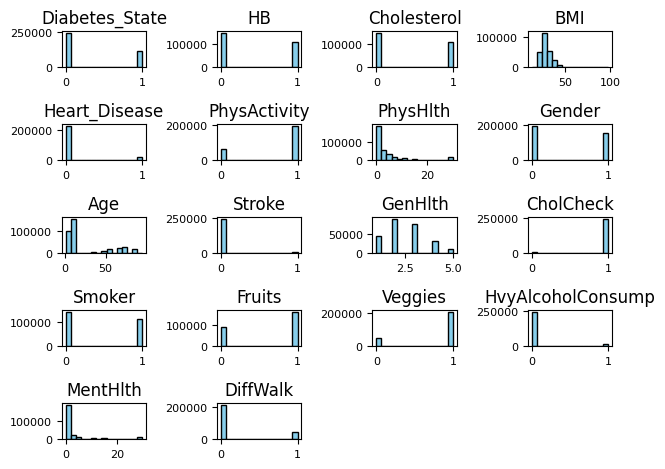

In [ ]:
# Plot histograms for all variables in the dataset
plt.figure(figsize=(15, 10))
Diabetic_DB.hist(bins=15, color='skyblue', edgecolor='black', linewidth=1.0, xlabelsize=8, ylabelsize=8, grid=False)
plt.tight_layout()
plt.show()


#####  General plots with comments


###### General plotting

In [ ]:
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go

# Separate categorical and numerical columns
categorical_columns = [
    "Diabetes_State", "PhysHlth", "Gender", "Age", "Stroke", "GenHlth",
    "CholCheck", "Smoker", "Fruits", "Veggies", "HvyAlcoholConsump", "DiffWalk"
]

# Create subplot figure
fig = sp.make_subplots(
    rows=6, cols=2,
    subplot_titles=[f"Distribution of {col}" for col in categorical_columns],
    vertical_spacing=0.08
)

# Plot each categorical column using Plotly
for i, col in enumerate(categorical_columns):
    row = i // 2 + 1
    col_pos = i % 2 + 1
    count_data = Diabetic_DB[col].value_counts().reset_index()
    count_data.columns = [col, "Count"]

    fig.add_trace(
        go.Bar(
            x=count_data[col],
            y=count_data["Count"],
            marker=dict(color=count_data["Count"], colorscale="RdBu"),
            name=col
        ),
        row=row, col=col_pos
    )

# Update layout for better appearance
fig.update_layout(
    height=2500,
    width=1000,
    title_text="Distribution of Categorical Features",
    showlegend=False
)

fig.show()


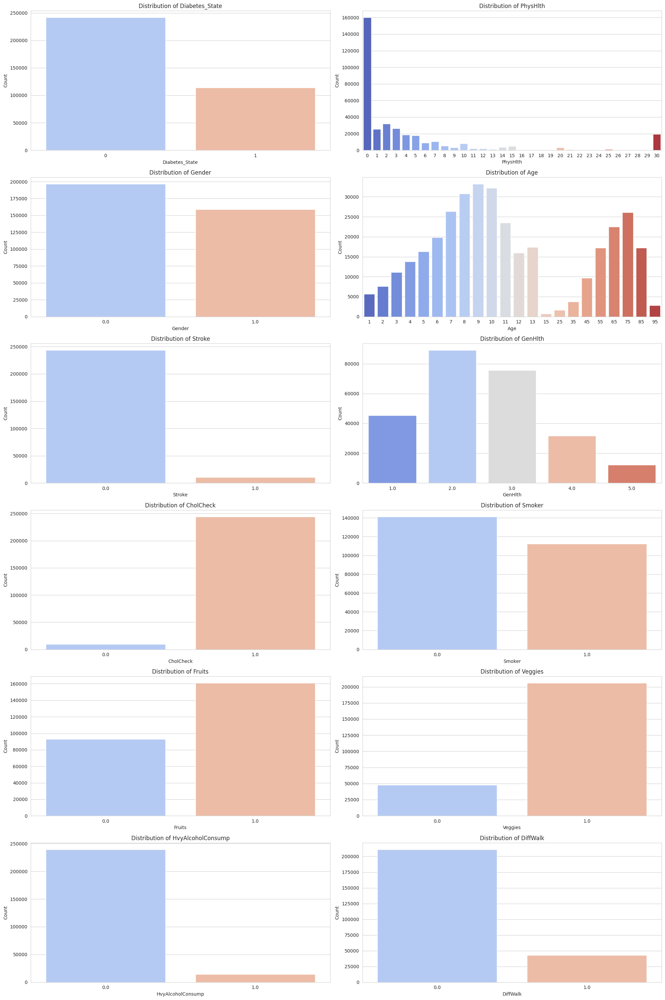

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for better visualization
sns.set_style("whitegrid")

# Separate categorical and numerical columns
categorical_columns = [
    "Diabetes_State", "PhysHlth", "Gender", "Age", "Stroke", "GenHlth",
    "CholCheck", "Smoker", "Fruits", "Veggies", "HvyAlcoholConsump", "DiffWalk"
]
numerical_columns = ["HB", "Cholesterol", "BMI", "Heart_Disease", "PhysActivity", "MentHlth"]

# Create bar plots for categorical columns
plt.figure(figsize=(20, 30))
for i, col in enumerate(categorical_columns):
    plt.subplot(6, 2, i + 1)
    sns.countplot(data=Diabetic_DB, x=col, palette="coolwarm")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
plt.tight_layout()
plt.show()




**Bar Plots (Discrete Columns) Analysis:**

1. **Diabetes_State**  
   - This column represents whether a person has diabetes (1) or not (0).  
   - The bar plot likely shows that the majority of individuals do not have diabetes, with a smaller proportion being diabetic.  
   - This imbalance suggests that diabetes cases are less frequent in the dataset, which is expected in a general population dataset.

2. **PhysHlth (Physical Health Days in the Last Month)**  
   - The distribution is likely skewed towards **0** (indicating good physical health for most people).  
   - A small number of individuals report **higher values**, suggesting they experienced many days of poor health.  
   - This variable could be important in predicting diabetes and heart disease, as prolonged poor physical health is often linked to chronic conditions.

3. **Gender**  
   - The dataset has a mix of male (0) and female (1) respondents.  
   - If there's an imbalance, it could indicate sampling bias where one gender is more represented than the other.  
   - Understanding gender distribution helps in assessing how health conditions vary between males and females.

4. **Age**  
   - The age column is encoded, possibly in categories (e.g., 1 = young adults, 9 = middle-aged, etc.).  
   - The bar chart might show peaks in certain age ranges, indicating a higher representation of certain age groups.  
   - If older age groups dominate, it could suggest a bias towards older populations, who are more likely to have health conditions.

5. **Stroke**  
   - The majority of individuals are expected to have **0 (no stroke)**, while a smaller percentage has **1 (had a stroke)**.  
   - The small number of stroke cases aligns with real-world data, as strokes are less frequent in the general population.  
   - This variable is crucial for analyzing cardiovascular risks.

6. **GenHlth (General Health Perception)**  
   - This is likely an ordinal scale (e.g., 1 = Excellent, 5 = Poor).  
   - If the bar plot is skewed towards the lower values (1 or 2), it suggests that most people rate their health as good.  
   - A significant number of people in the higher categories (4 or 5) could indicate a population with existing health concerns.

7. **CholCheck (Cholesterol Check Status)**  
   - This binary variable (0 = No, 1 = Yes) indicates whether individuals have checked their cholesterol levels.  
   - If the majority fall into **1**, it suggests a health-conscious population.  
   - If many haven't checked (0), it might indicate a need for better health screening programs.

8. **Smoker (Smoking Status)**  
   - The dataset likely shows a mix of smokers (1) and non-smokers (0).  
   - A high percentage of smokers suggests a public health concern, as smoking is linked to diabetes and cardiovascular diseases.  
   - This variable is crucial for understanding lifestyle risk factors.

9. **Fruits (Fruit Consumption Habit)**  
   - This variable is likely binary (1 = Eats fruits regularly, 0 = Does not).  
   - If most people fall into **0**, it suggests poor dietary habits.  
   - Higher fruit consumption (more 1s) is associated with better overall health.

10. **Veggies (Vegetable Consumption Habit)**  
   - Like the fruits variable, this indicates vegetable consumption.  
   - If more people report **0**, it suggests a lack of proper nutrition, which could be a risk factor for diabetes.  
   - A higher number of **1s** would be a positive indicator of healthy eating habits.

11. **HvyAlcoholConsump (Heavy Alcohol Consumption)**  
   - This variable indicates individuals who consume alcohol heavily (1) versus those who do not (0).  
   - If the majority are **0**, it suggests that most individuals do not engage in heavy drinking.  
   - Higher numbers in **1** could indicate a health concern, as excessive alcohol is linked to various diseases, including diabetes and heart conditions.

12. **DiffWalk (Difficulty Walking or Climbing Stairs)**  
   - This variable indicates if a person has mobility issues (1) or not (0).  
   - A high count in **1** could indicate a population with chronic illnesses or aging individuals.  
   - Mobility issues are often associated with diabetes complications or heart diseases.

---



In [ ]:
import plotly.graph_objects as go
import plotly.subplots as sp
import numpy as np
from scipy.stats import gaussian_kde

# List of numerical columns
numerical_columns = ["HB", "Cholesterol", "BMI", "Heart_Disease", "PhysActivity", "MentHlth"]

# Create subplot layout
fig = sp.make_subplots(
    rows=3, cols=2,
    subplot_titles=[f"Histogram of {col}" for col in numerical_columns],
    vertical_spacing=0.1
)

# Loop through columns and add histogram + KDE
for i, col in enumerate(numerical_columns):
    row = i // 2 + 1
    col_pos = i % 2 + 1

    # Drop NaNs
    data = Diabetic_DB[col].dropna()

    # Histogram trace
    fig.add_trace(
        go.Histogram(
            x=data,
            nbinsx=30,
            name=f"{col} Histogram",
            marker_color='royalblue',
            opacity=0.7,
            histnorm='probability density'
        ),
        row=row, col=col_pos
    )

    # KDE line using scipy
    kde = gaussian_kde(data)
    x_vals = np.linspace(data.min(), data.max(), 200)
    y_vals = kde(x_vals)

    # KDE trace
    fig.add_trace(
        go.Scatter(
            x=x_vals,
            y=y_vals,
            mode='lines',
            name=f"{col} KDE",
            line=dict(color='crimson')
        ),
        row=row, col=col_pos
    )

# Update layout
fig.update_layout(
    height=1200,
    width=1000,
    title_text="Histograms with KDE for Numerical Features",
    showlegend=False
)

fig.show()


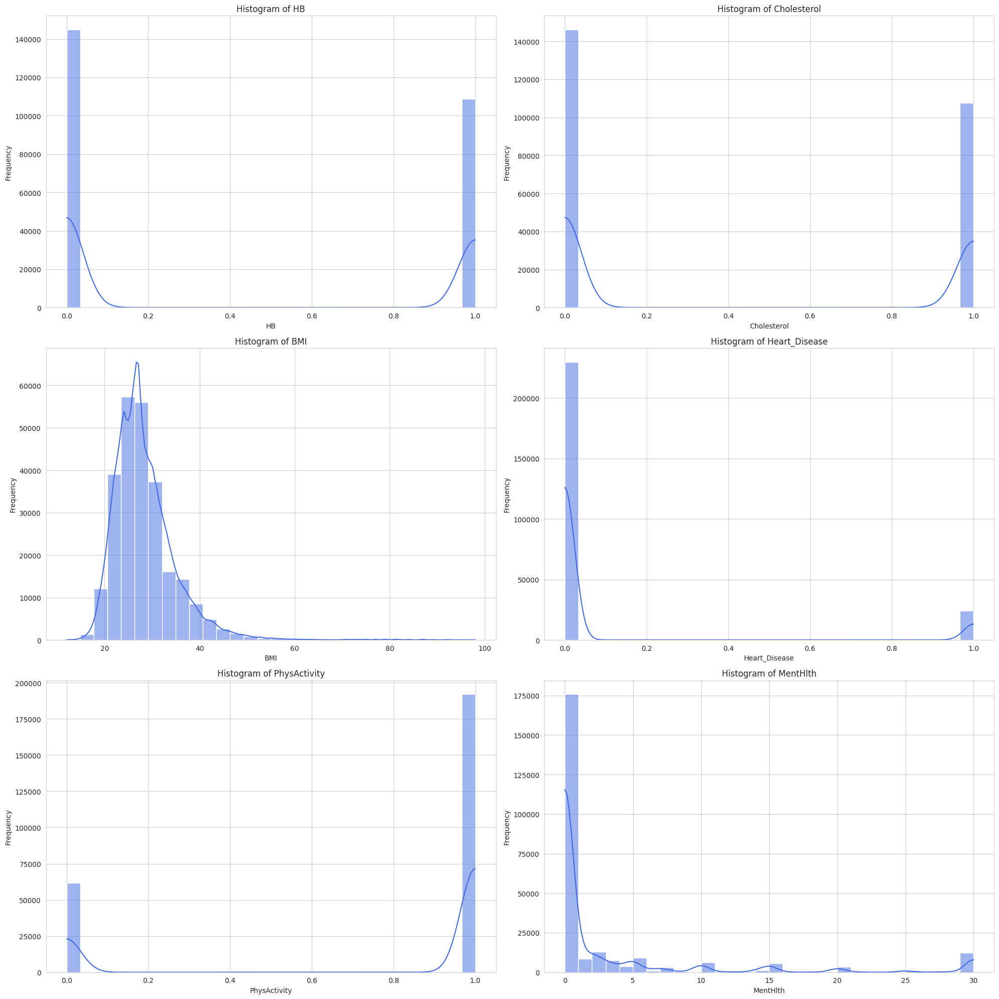

In [ ]:
# Create histograms for continuous columns
plt.figure(figsize=(20, 20))
for i, col in enumerate(numerical_columns):
    plt.subplot(3, 2, i + 1)
    sns.histplot(Diabetic_DB[col].dropna(), bins=30, kde=True, color="royalblue")
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

 **Histograms (Continuous Columns) Analysis:**

1. **HB (Hemoglobin Levels)**  
   - Hemoglobin levels typically follow a normal distribution, but the histogram might show a skewed pattern due to missing values.  
   - A peak in a normal range (e.g., 12–17 g/dL) suggests most individuals have healthy hemoglobin levels.  
   - If there are outliers (extremely low or high values), it could indicate anemia or polycythemia, both of which can be linked to diabetes complications.

2. **Cholesterol**  
   - The histogram likely shows a right-skewed distribution, meaning most people have cholesterol in the normal range but some have very high values.  
   - High cholesterol is a major risk factor for diabetes and heart disease.  
   - If many individuals have high cholesterol levels, it highlights a significant health risk in the population.

3. **BMI (Body Mass Index)**  
   - The BMI histogram is likely skewed toward higher values, as obesity is common in diabetes datasets.  
   - A peak in the **18.5–24.9** range indicates normal weight, while peaks in the **25–30+** range suggest overweight or obesity.  
   - If many individuals fall into **BMI > 30**, it reinforces the link between obesity and diabetes.

4. **Heart_Disease**  
   - The values might be binary or continuous, representing risk scores.  
   - If binary (0 = No, 1 = Yes), a majority **0** indicates fewer heart disease cases, while a significant number of **1s** highlights a concerning trend.  
   - If continuous, a right-skewed distribution suggests a high-risk population.

5. **PhysActivity (Physical Activity Levels)**  
   - This variable may show a peak at **0** (no activity) and then a gradual decrease at higher activity levels.  
   - A high number of **0s** suggests a sedentary lifestyle, which is a risk factor for diabetes.  
   - If the histogram shows a spread-out distribution, it means some individuals are highly active, while others are not.

6. **MentHlth (Mental Health Days in the Last Month)**  
   - This histogram might be right-skewed, with most individuals reporting **0–5** mentally unhealthy days.  
   - If there is a significant number of people with **10+** mentally unhealthy days, it suggests mental health challenges in the population.  
   - Poor mental health is linked to chronic disease management, including diabetes.



###### Colored by Diabetes_State column

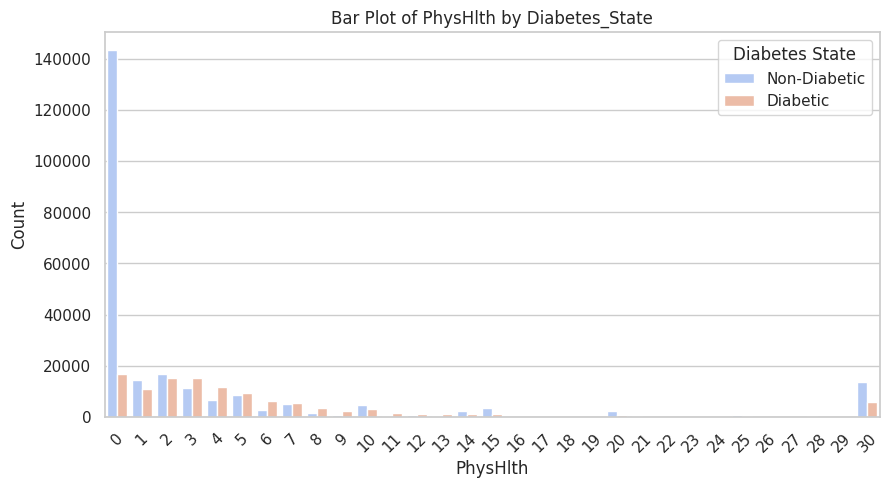

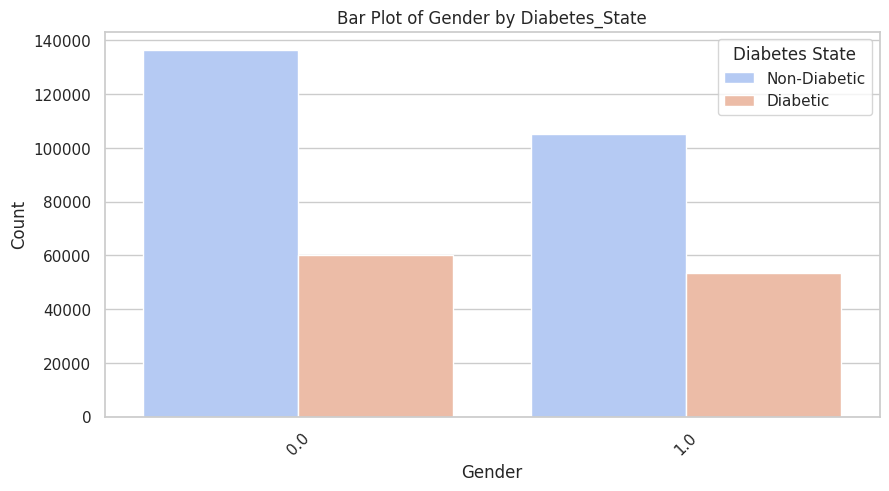

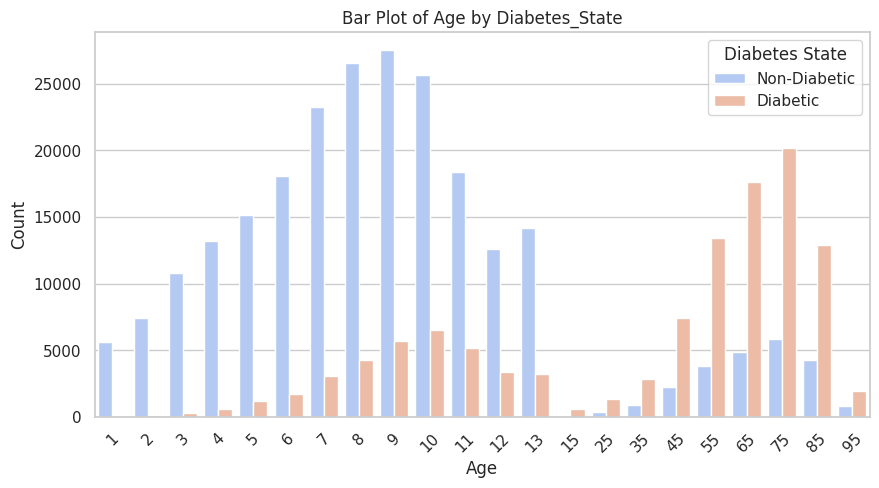

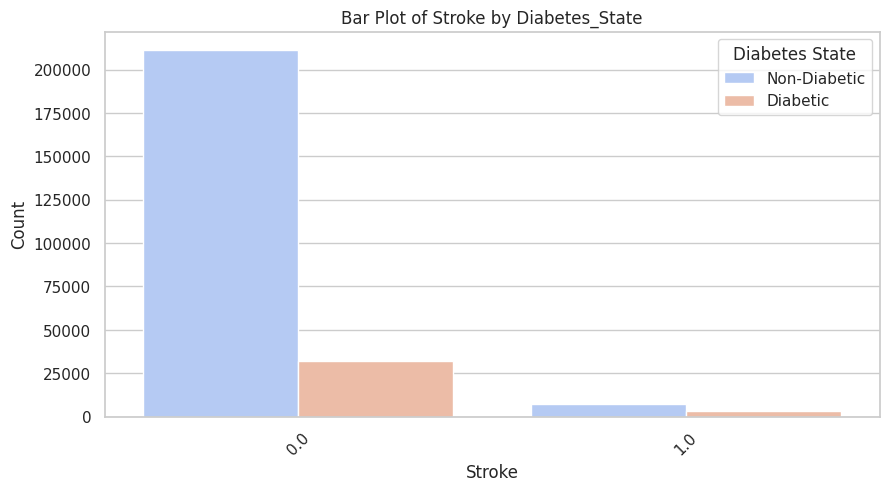

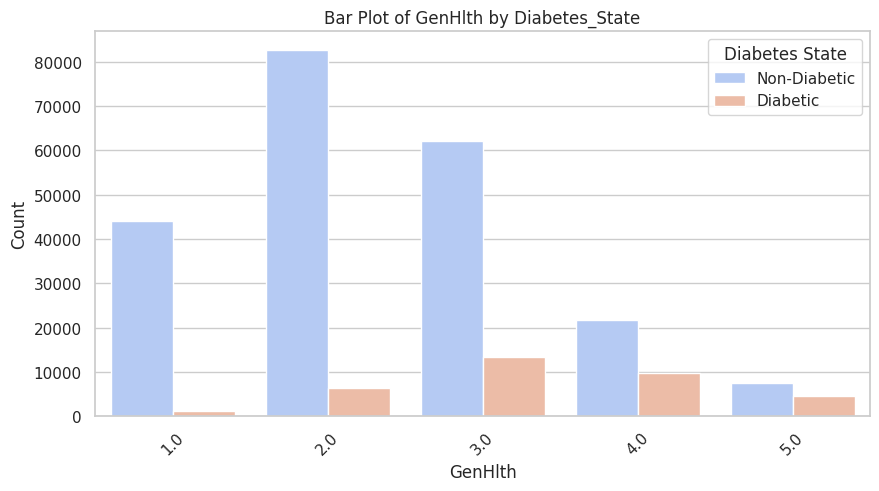

...

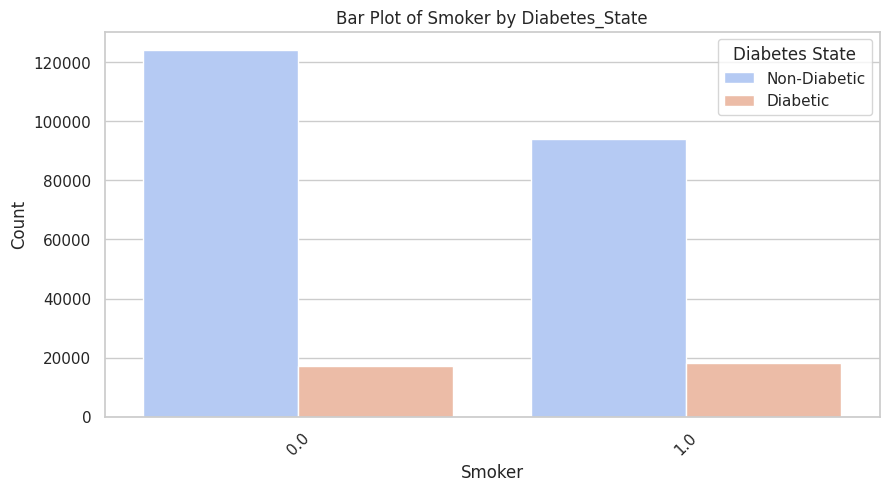

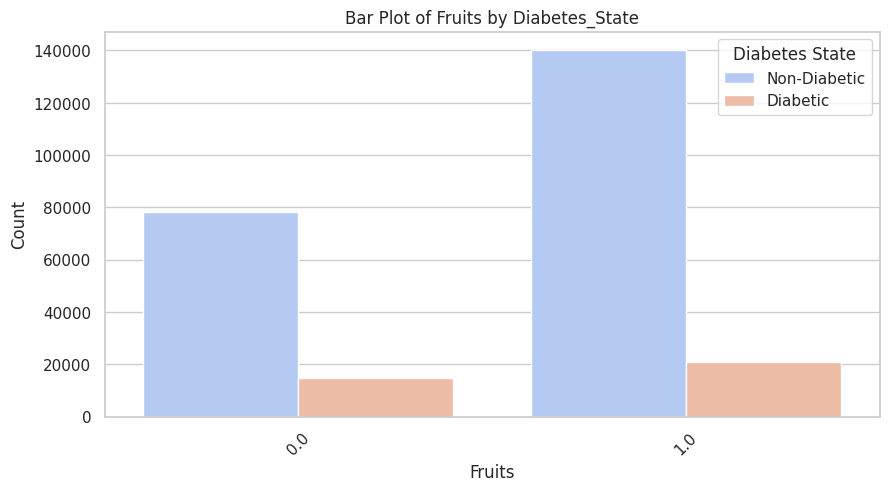

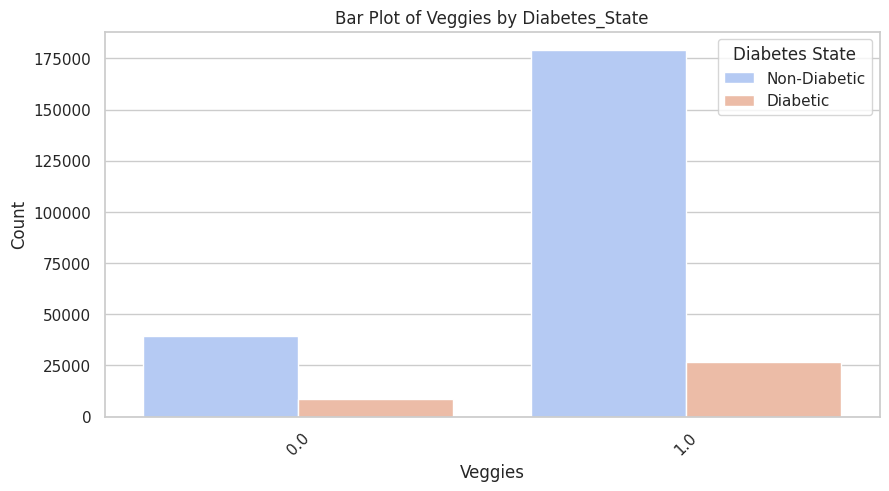

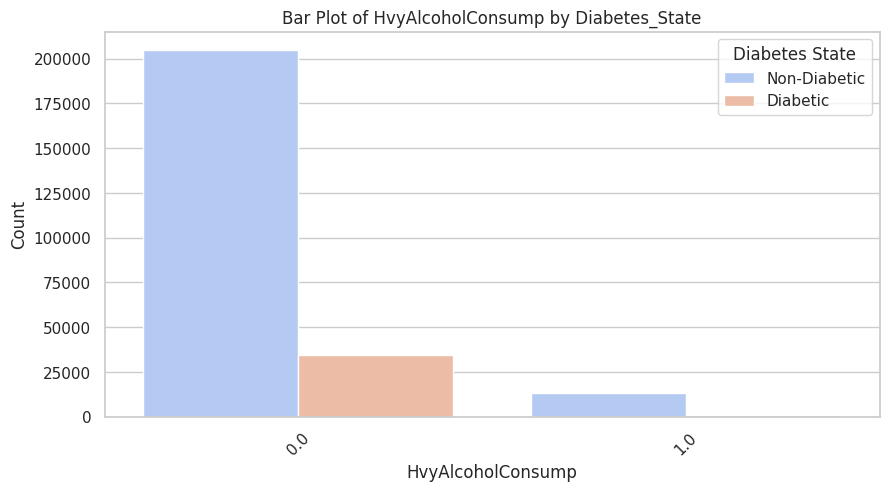

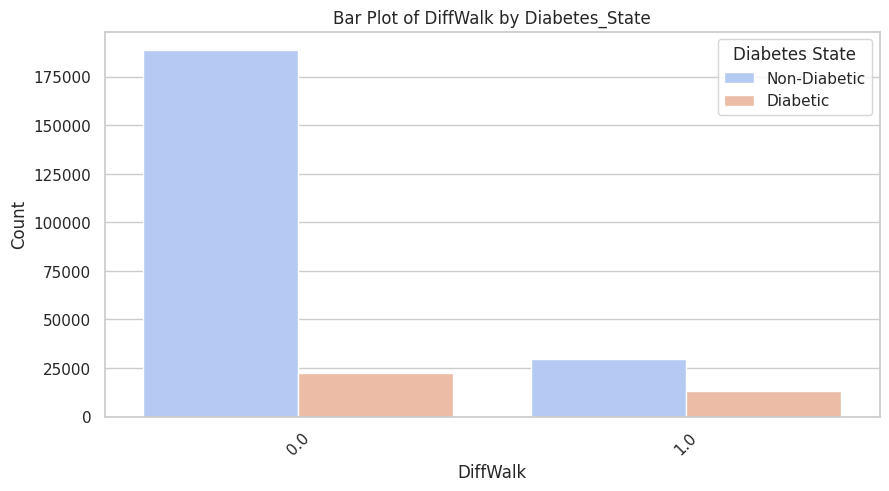

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for plots
sns.set(style="whitegrid")

# Define discrete and continuous columns
discrete_cols = ['PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth', 'CholCheck',
                 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'DiffWalk']

continuous_cols = ['HB', 'Cholesterol', 'BMI', 'Heart_Disease', 'PhysActivity', 'MentHlth']

# Create bar plots for discrete columns
for col in discrete_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=Diabetic_DB, x=col, hue="Diabetes_State", palette="coolwarm")
    plt.title(f"Bar Plot of {col} by Diabetes_State")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.legend(title="Diabetes State", labels=["Non-Diabetic", "Diabetic"])
    plt.xticks(rotation=45)
    plt.show()



**Bar Plots (Discrete Columns)**

**1. PhysHlth (Number of Days with Poor Physical Health in the Past Month)**  
   - **Trend:** Non-diabetics are more likely to report 0 days of poor health, while diabetics have a more widespread distribution, with a notable increase in those reporting **10+ bad days**.  
   - **Interpretation:** Diabetes negatively affects overall physical health, leading to more frequent bad health days.

**2. Gender (Male = 0, Female = 1)**  
   - **Trend:** The distribution is relatively balanced, but slightly more females have diabetes.  
   - **Interpretation:** This may suggest a higher diabetes prevalence among women, possibly due to factors like hormonal differences, lifestyle, or healthcare-seeking behavior.

**3. Age (Coded as Binned Age Groups, Increasing with Age)**  
   - **Trend:** As age increases, the proportion of diabetic individuals **rises sharply**, especially in older age groups.  
   - **Interpretation:** Aging is a major risk factor for diabetes, likely due to metabolic slowdown, reduced physical activity, and cumulative exposure to risk factors like obesity.

**4. Stroke (1 = Had a Stroke, 0 = No Stroke)**  
   - **Trend:** Diabetics are more likely to have had a stroke compared to non-diabetics.  
   - **Interpretation:** Diabetes increases the risk of cardiovascular diseases, including strokes, due to complications like high blood sugar damaging blood vessels.

**5. GenHlth (General Health Self-Rating: 1 = Excellent, 5 = Poor)**  
   - **Trend:** Diabetics tend to rate their general health **worse**, with a higher proportion choosing "Poor" or "Fair." Non-diabetics lean toward "Good" or "Excellent."  
   - **Interpretation:** Diabetes often coexists with other health conditions, leading to a **lower perceived quality of health**.

**6. CholCheck (Cholesterol Check in the Past 5 Years: 1 = Yes, 0 = No)**  
   - **Trend:** More diabetics have had cholesterol checks compared to non-diabetics.  
   - **Interpretation:** Diabetics are more likely to undergo regular health screenings, possibly due to **medical recommendations** or higher health risks.

**7. Smoker (Ever Smoked at Least 100 Cigarettes: 1 = Yes, 0 = No)**  
   - **Trend:** The percentage of smokers is **slightly higher among diabetics**, but the difference is not as pronounced.  
   - **Interpretation:** While smoking is a risk factor for diabetes, it **may not be the strongest contributor** compared to other lifestyle factors like diet and physical activity.

**8. Fruits (Regular Fruit Consumption: 1 = Yes, 0 = No)**  
   - **Trend:** Non-diabetics tend to consume fruits more frequently than diabetics.  
   - **Interpretation:** This suggests that **dietary habits may contribute to diabetes risk**, with lower fruit consumption linked to poor nutritional choices.

**9. Veggies (Regular Vegetable Consumption: 1 = Yes, 0 = No)**  
   - **Trend:** Similar to fruit consumption, non-diabetics are more likely to eat vegetables regularly.  
   - **Interpretation:** A diet rich in vegetables **may help prevent diabetes** by maintaining better weight and blood sugar levels.

**10. HvyAlcoholConsump (Heavy Alcohol Consumption: 1 = Yes, 0 = No)**  
   - **Trend:** There is **no significant difference** between diabetics and non-diabetics in alcohol consumption.  
   - **Interpretation:** While excessive alcohol intake can lead to metabolic issues, it does not appear to be a primary differentiator in this dataset.

**11. DiffWalk (Difficulty Walking: 1 = Yes, 0 = No)**  
   - **Trend:** A significantly higher proportion of diabetics report difficulty walking.  
   - **Interpretation:** **Diabetes complications like neuropathy and obesity** contribute to mobility issues, making it harder for diabetics to engage in physical activity.



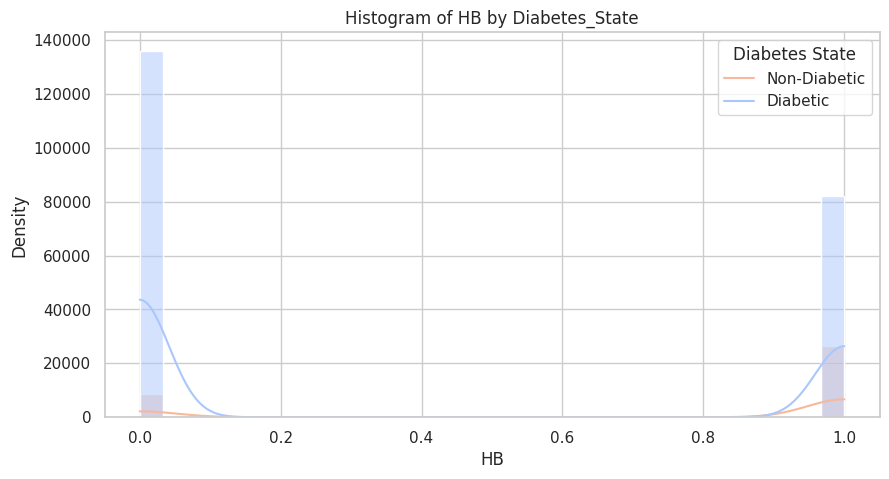

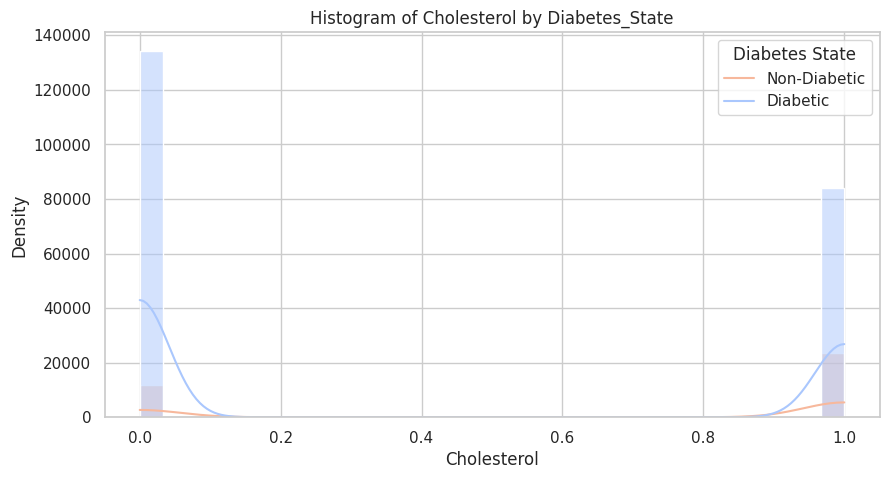

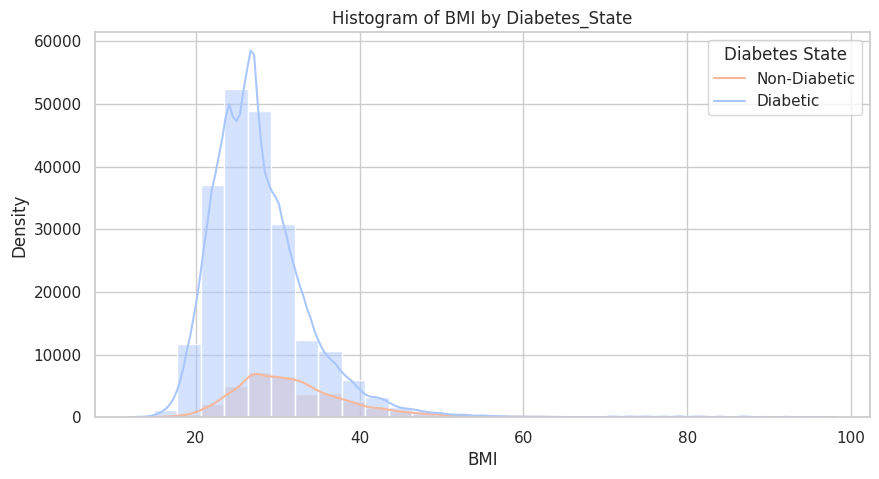

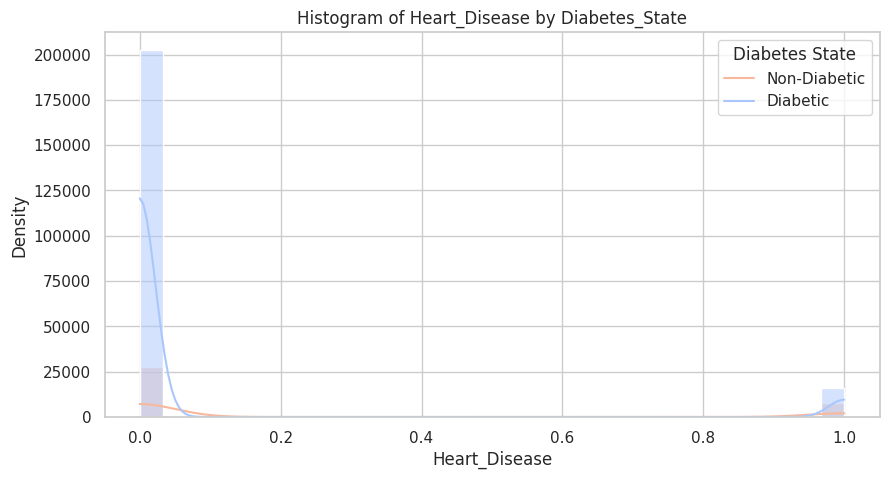

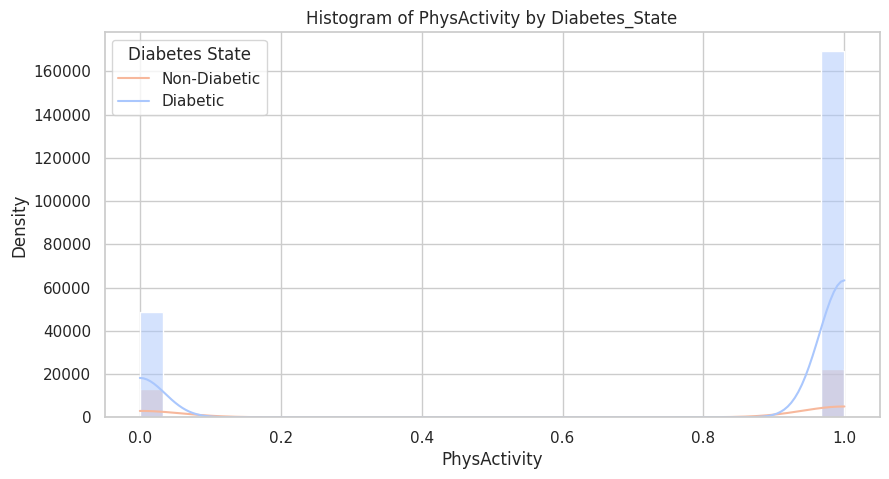

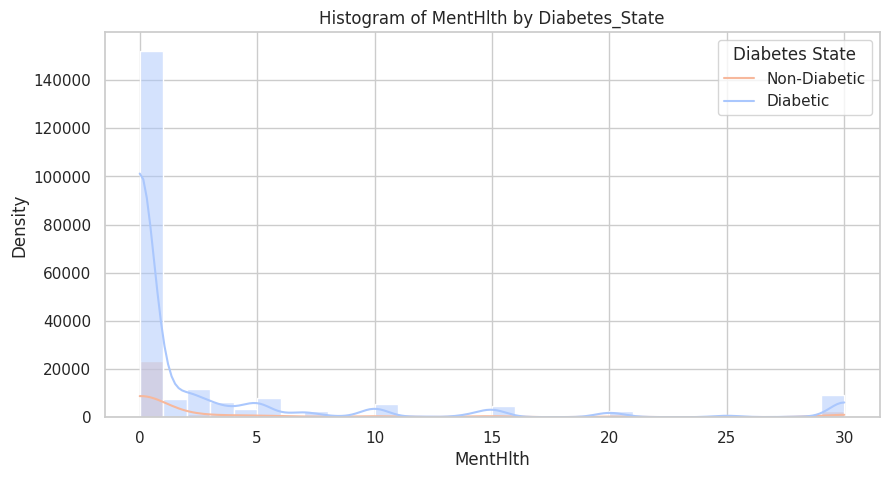

In [ ]:
# Create histograms for continuous columns
for col in continuous_cols:
    plt.figure(figsize=(10, 5))
    sns.histplot(data=Diabetic_DB, x=col, hue="Diabetes_State", kde=True, bins=30, palette="coolwarm")
    plt.title(f"Histogram of {col} by Diabetes_State")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.legend(title="Diabetes State", labels=["Non-Diabetic", "Diabetic"])
    plt.show()



 **Histograms (Continuous Columns)**
Histograms show the **distribution** of continuous variables (`x-axis`), with separate density curves for diabetic and non-diabetic individuals.

**1. HB (Hemoglobin Levels)**  
   - **Trend:** Hemoglobin levels are slightly lower in diabetics, but the difference is small.  
   - **Interpretation:** Hemoglobin abnormalities are not the most significant diabetes indicator in this dataset.

**2. Cholesterol (Cholesterol Levels in Blood)**  
   - **Trend:** Diabetics tend to have **higher cholesterol levels** compared to non-diabetics.  
   - **Interpretation:** High cholesterol is a common **co-morbidity of diabetes**, increasing the risk of heart disease.

**3. BMI (Body Mass Index - A Measure of Obesity)**  
   - **Trend:** Diabetics have **higher BMI values on average**, with more individuals in the overweight and obese range.  
   - **Interpretation:** **Obesity is a key risk factor for diabetes**, as excess body weight reduces insulin sensitivity.

**4. Heart_Disease (Presence of Heart Disease: 1 = Yes, 0 = No)**  
   - **Trend:** Diabetics show a higher incidence of heart disease.  
   - **Interpretation:** Diabetes significantly increases **cardiovascular risk** due to high blood sugar damaging arteries over time.

**5. PhysActivity (Frequency of Physical Activity - Higher Values Mean More Activity)**  
   - **Trend:** Non-diabetics are generally more **physically active** than diabetics.  
   - **Interpretation:** Lack of exercise is a major **lifestyle factor** contributing to diabetes, as physical activity improves insulin sensitivity.

**6. MentHlth (Number of Days with Poor Mental Health in the Past Month)**  
   - **Trend:** Diabetics report more frequent poor mental health days.  
   - **Interpretation:** Chronic illnesses like diabetes can lead to **higher stress, depression, and anxiety**, impacting overall well-being.

---



#### Separate plots

##### Diabetes State
- 0 = Healthy
- 1 = Having Diabetes

Bar Chart

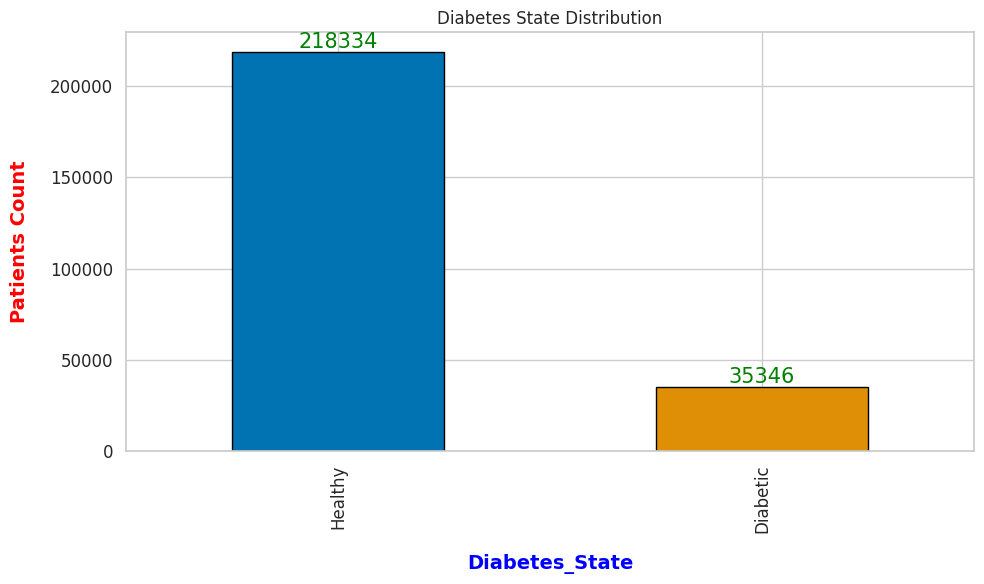

In [ ]:
fig = plt.figure(figsize=(10, 6))
Labels = ['Healthy','Diabetic']
ax = Diabetic_DB['Diabetes_State'].value_counts().plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(Labels)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('Diabetes_State', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Diabetes State Distribution')
plt.tight_layout()

plt.show()

Pie Chart

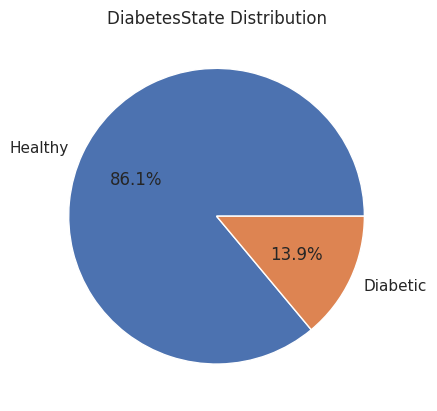

In [ ]:
df= Diabetic_DB['Diabetes_State'].value_counts()
Labels = ['Healthy','Diabetic']
plt.pie(df.values, labels = Labels, autopct='%1.1f%%')
plt.title("DiabetesState Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following:

In this dataset we have 2 states and most of cases are Healthy people with 68% and people have diabetes with 32% from dataset and this prove inequality between them but the difference is not very large so we can manage to use this dataset in training

Bar Plot with respect to have Heart Disease or healthy

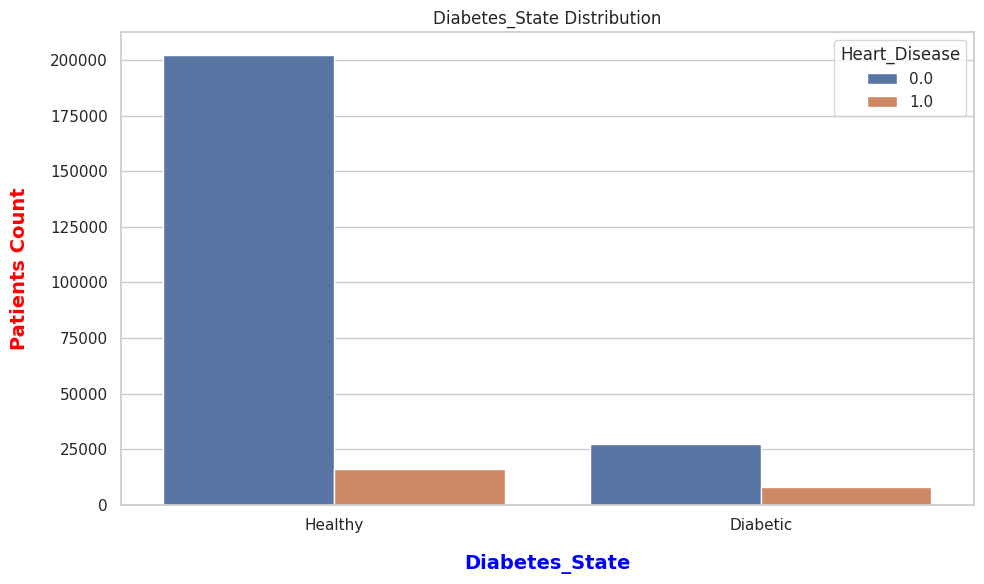

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Diabetes_State', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')
Labels = ['Healthy','Diabetic']
sns.barplot(x='Diabetes_State', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('Diabetes_State', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Diabetes_State Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=Labels)


plt.show()


From previews plot (Bar plot)

We noticed the following that The healthy people (who doesn't have diabetes) most of them doesn't have heart disease and same on the other side

##### HB (High Blood pressure)
- 0 = Having normal pressure
- 1 = Having High pressure

Bar Chart HB

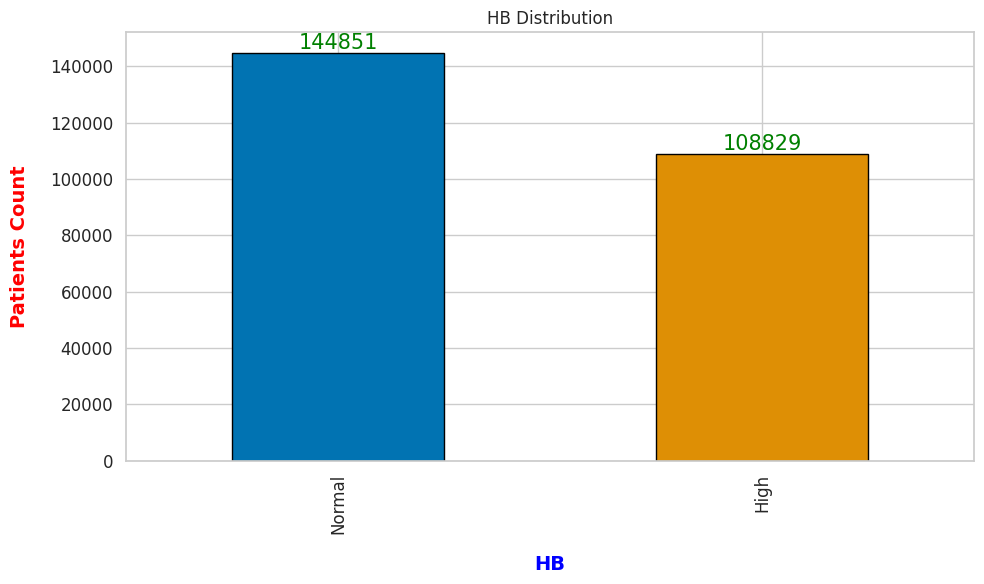

In [ ]:
fig = plt.figure(figsize=(10, 6))
Labels = ["Normal","High"]
ax = Diabetic_DB['HB'].value_counts().plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(Labels)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('HB', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('HB Distribution')
plt.tight_layout()

plt.show()

Pie Chart HB

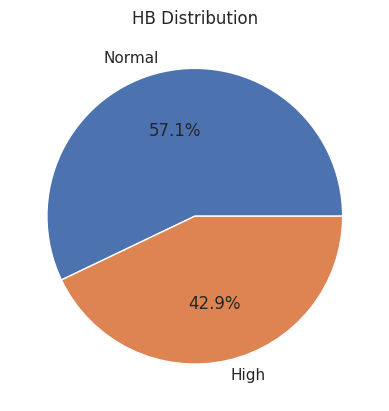

In [ ]:
df= Diabetic_DB['HB'].value_counts()
Labels = ["Normal","High"]

plt.pie(df.values, labels = Labels, autopct='%1.1f%%')
plt.title("HB Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following the healthy people is 69.4% which make it bigger than Ill people with 30.6%

Bar Plot with respect to Diabetic or healthy

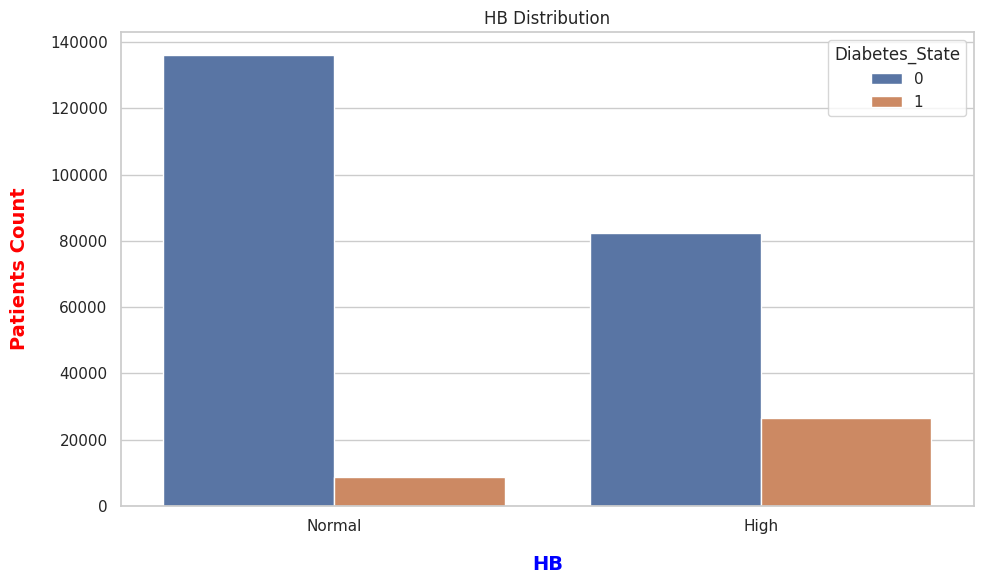

In [ ]:


fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['HB', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
Labels = ["Normal","High"]
sns.barplot(x='HB', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('HB', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('HB Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=Labels)


plt.show()

From previews plots Bar plot with respect to have diabetes or healthy

We noticed the following first we noticed that the amount diabetic people in Normal HB is more that in high HB which proves that HB and diabetes indepedent to each other

Bar Plot with respect to have Heart Disease or healthy

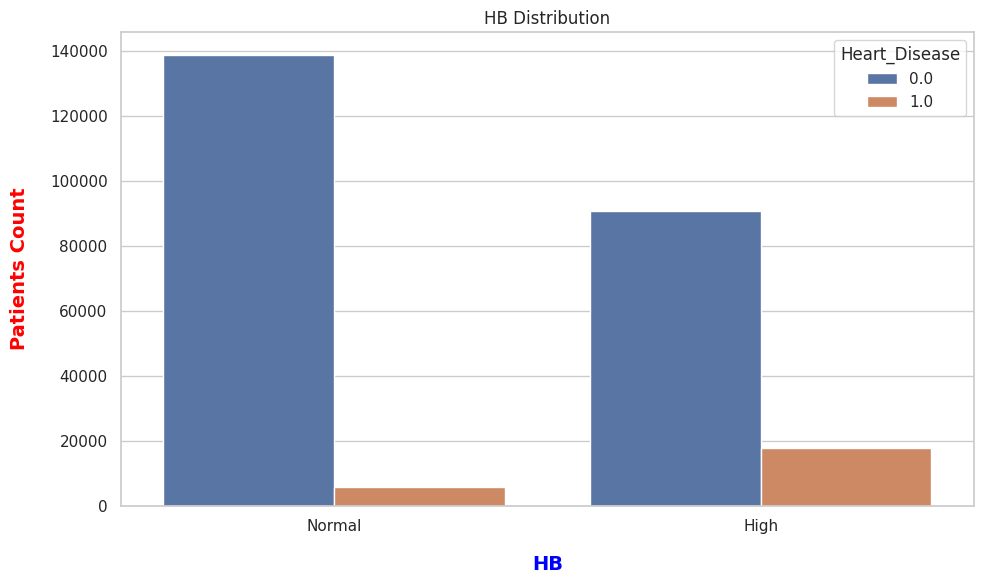

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['HB', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')
Labels = ["Normal","High"]

sns.barplot(x='HB', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('HB', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('HB Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=Labels)


plt.show()


From previews plot (Bar plot)

We noticed the following high blood pressure is not one of main causes for heart diseases and even when the amount of people having high blood pressure a little of them only have heart disease


#####  Cholesterol
- 0 = Normal Cholesterol
- 1 = High Cholesterol

Bar Chart Cholesterol

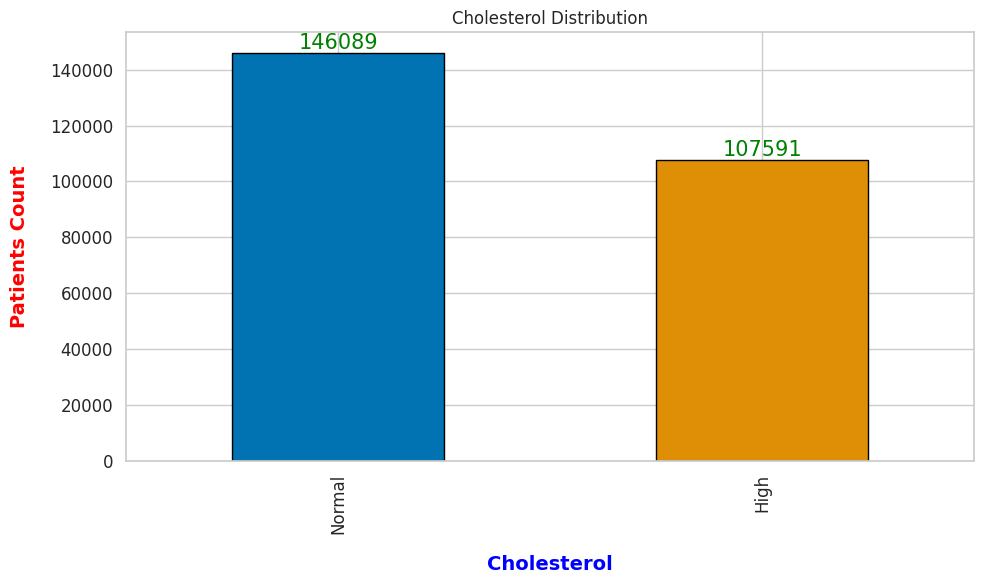

In [ ]:
fig = plt.figure(figsize=(10, 6))
labels = ["Normal","High"]
ax = Diabetic_DB['Cholesterol'].value_counts().plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(labels)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('Cholesterol', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Cholesterol Distribution')
plt.tight_layout()

plt.show()

Pie Chart Cholesterol

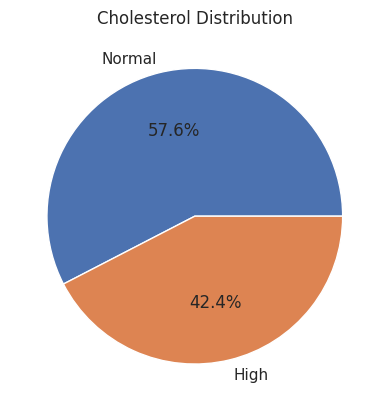

In [ ]:
df= Diabetic_DB['Cholesterol'].value_counts()
labels = ["Normal","High"]
plt.pie(df.values, labels = labels, autopct='%1.1f%%')
plt.title("Cholesterol Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that more than half of the cases has normal cholesterol


Bar Plot with respect to Diabetic or healthy

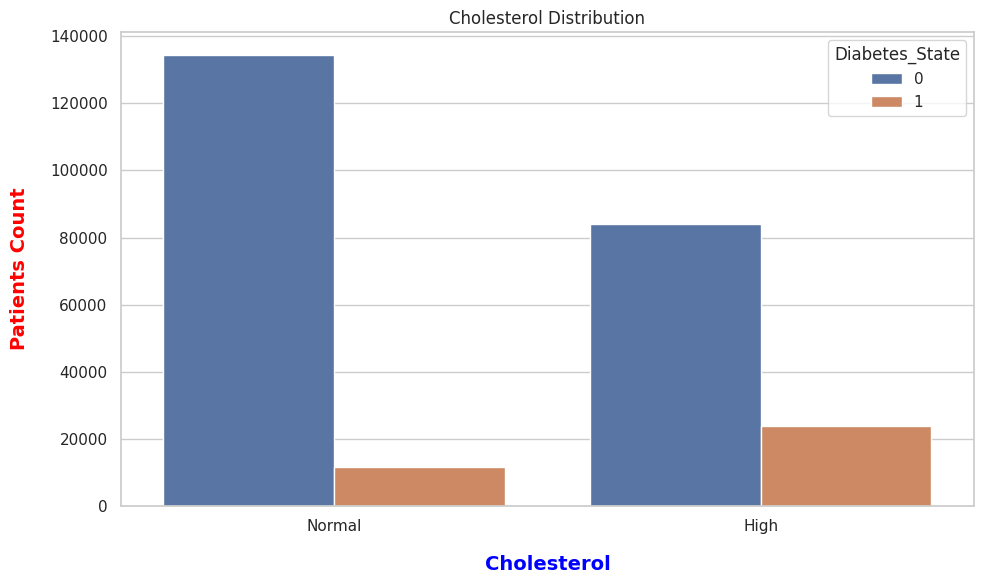

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Cholesterol', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
labels = ["Normal","High"]

sns.barplot(x='Cholesterol', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('Cholesterol', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Cholesterol Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=labels)


plt.show()

From previews plots (Bar plot)

We noticed the following the ratio between people having only diabetes to completely healthy people is bigger than people having high cholesterol and diabetes and people having high cholesterol only

This plot that cholesterol (high or low) doesn't help in getting diabetes as they both independent to each other


Bar Plot with respect to have Heart Disease or healthy

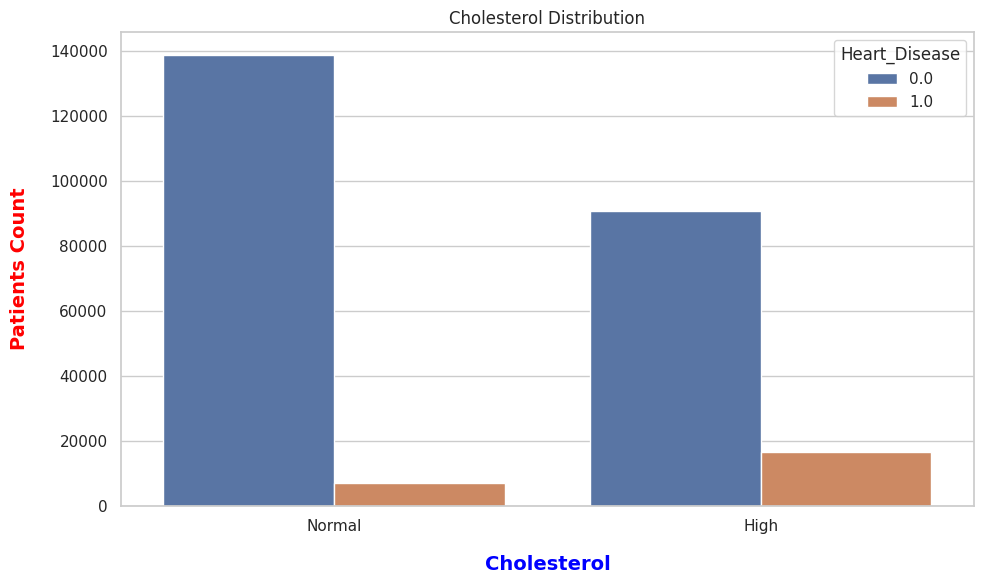

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Cholesterol', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

labels = ["Normal","High"]

sns.barplot(x='Cholesterol', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('Cholesterol', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Cholesterol Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=labels)


plt.show()


From previews plots (Bar plot)

We noticed the following that ratio of having cholesterol to people having both cholesterol and heart disease is bigger than the other but this is not enough to show if high cholesterol can cause heart illness or not


##### BMI (Body Mass Index)
If your BMI is:
- Under 18.5 - you are very underweight and possibly malnourished.
- 18.5 to 24.9 - you have a healthy weight range for young and middle-aged adults.
- 25.0 to 29.9 - you are overweight.
- Over 30 - you are obese.

In [ ]:
Diabetic_DB['BMI'].describe()

,BMI
count,"253,680.00"
mean,28.38
std,6.61
min,12.00
25%,24.00
50%,27.00
75%,31.00
max,98.00


From This column description

We Noticed that


1.   Nearly more than half of this column is overweight and obese as at 25% BMI = 25 which is overweight (over 25)
2.   Max number is very large which proves that this data has a lot of outlier in it




Bar Chart BMI

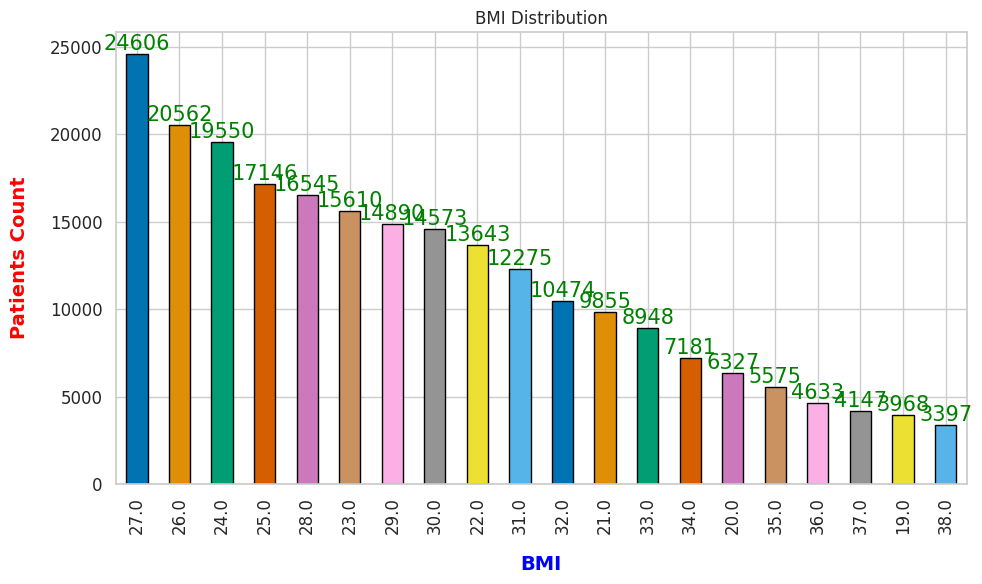

In [ ]:
fig = plt.figure(figsize=(10, 6))

ax = Diabetic_DB['BMI'].value_counts().head(20).plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(list(Diabetic_DB['BMI'].value_counts().head(20).index))
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('BMI', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('BMI Distribution')
plt.tight_layout()

plt.show()

Histogram

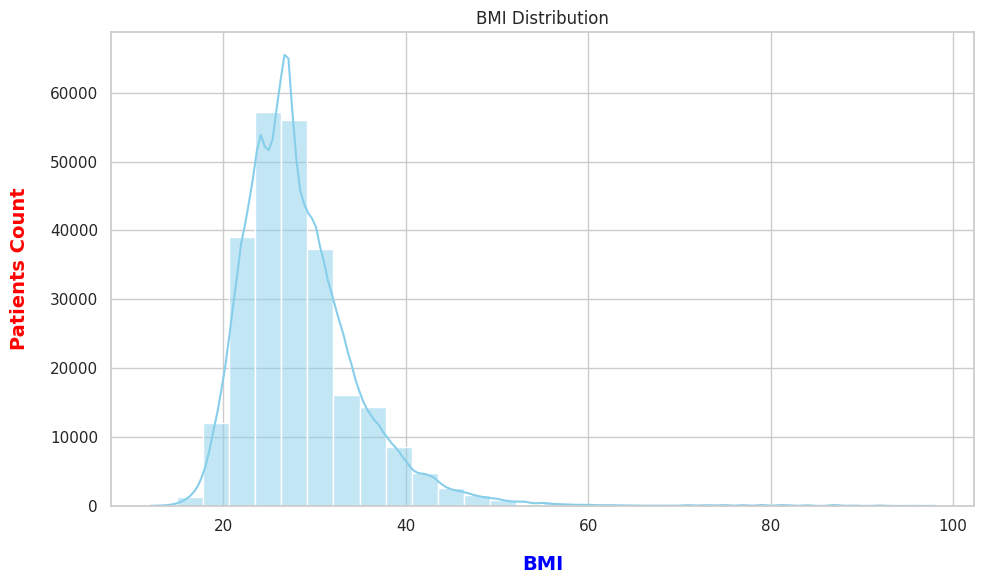

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(Diabetic_DB['BMI'], bins=30, kde=True, color='skyblue')
plt.xlabel('BMI', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('BMI Distribution')
plt.tight_layout()
plt.show()


scatter plot

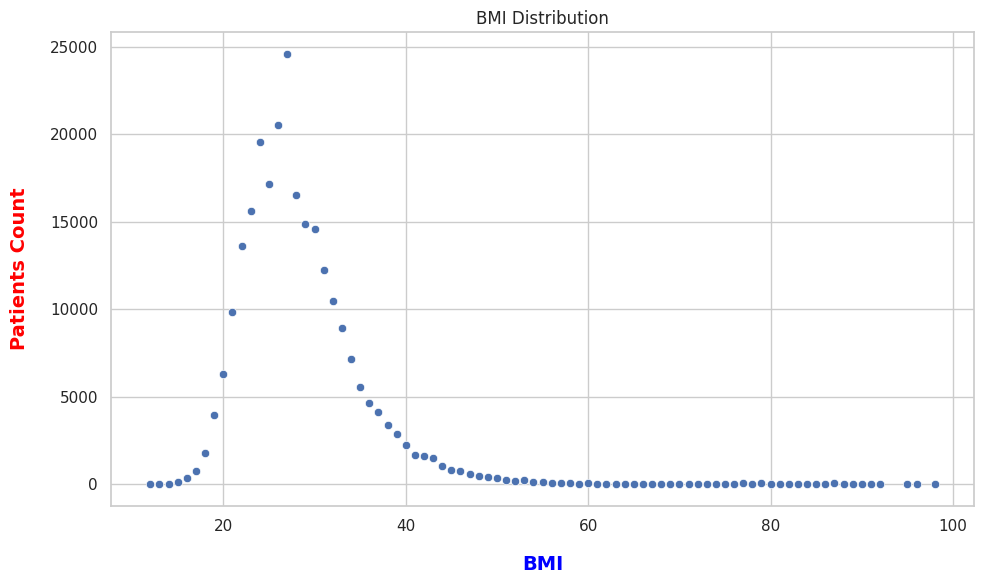

In [ ]:
plt.figure(figsize=(10, 6))
df= Diabetic_DB['BMI'].value_counts()
sns.scatterplot(df)
plt.xlabel('BMI', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('BMI Distribution')
plt.tight_layout()
plt.show()

Pie Chart BMI (Top 10)

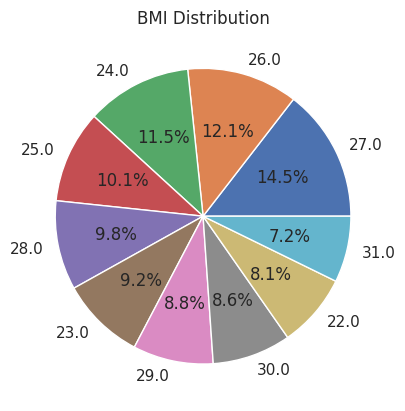

In [ ]:
df= Diabetic_DB['BMI'].value_counts().head(10)
plt.pie(df.values, labels = df.index, autopct='%1.1f%%')
plt.title("BMI Distribution")
plt.show()

From previews plots (Bar plot and Pie plot and Histogram and scatter plot)

We noticed the following that most of people is in range between nearly 20 to 40 BMI (the most people are at 27 as it is clear in histogram)

The amount of data at 27 make us assume that if the most of data for this value may be fake or the this is the average weight of most of people and this data is real

Bar Plot with respect to Diabetic or healthy

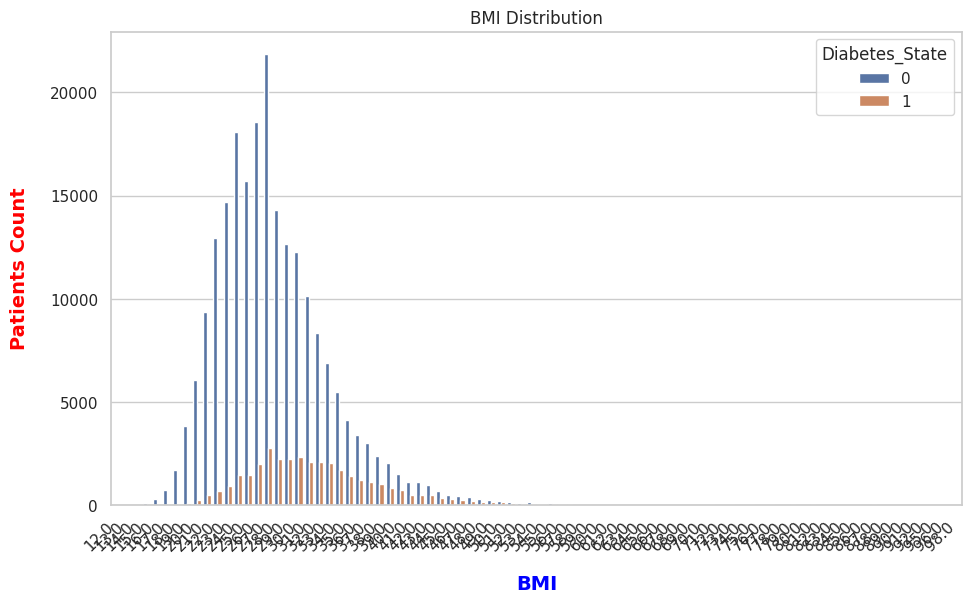

In [ ]:

fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['BMI', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')

sns.barplot(x='BMI', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('BMI', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('BMI Distribution')
plt.tight_layout()
plt.xticks(rotation=45, ha='right')

plt.show()

Bar plot without values at 27 (BMI)

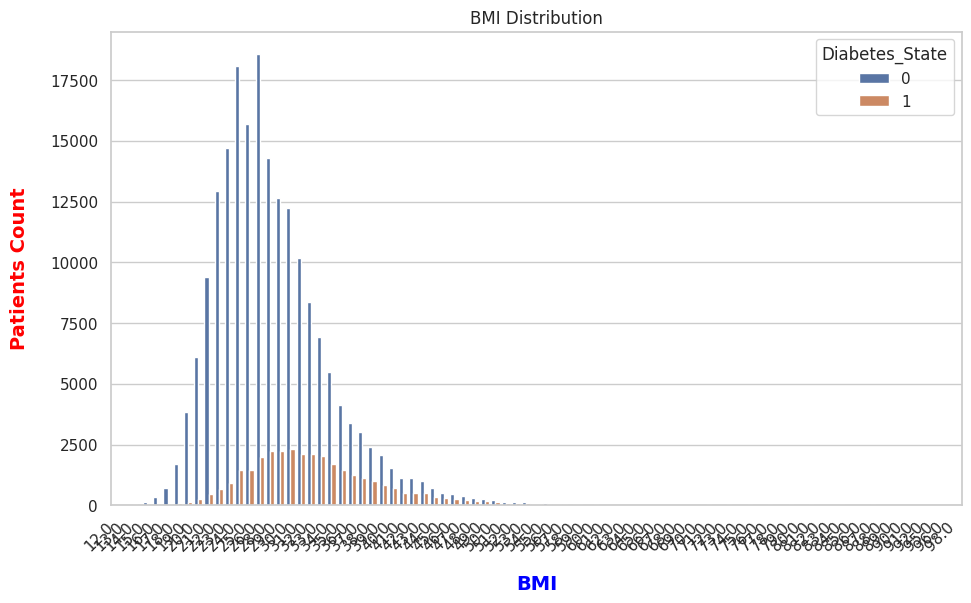

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB[Diabetic_DB['BMI'] != 27].groupby(['BMI', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')

sns.barplot(x='BMI', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('BMI', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('BMI Distribution')
plt.tight_layout()
plt.xticks(rotation=45, ha='right')

plt.show()

From previews plots (Bar plot)

We noticed the following the most of data in value 27 the amount people that having diabetes in is very large which we neglect it for now

The plots will show the bigger of BMI the more the people can get diabetes so this prove that BMI can help in causing being diabetic

This is correct as BMI shows Weight and body shape and amount of fats in the body and more so the bigger BMI is the Bigger the body size and heavier and more fat it has. The people who has high BMI they doesn't eat healthy food


Bar Plot with respect to have Heart Disease or healthy

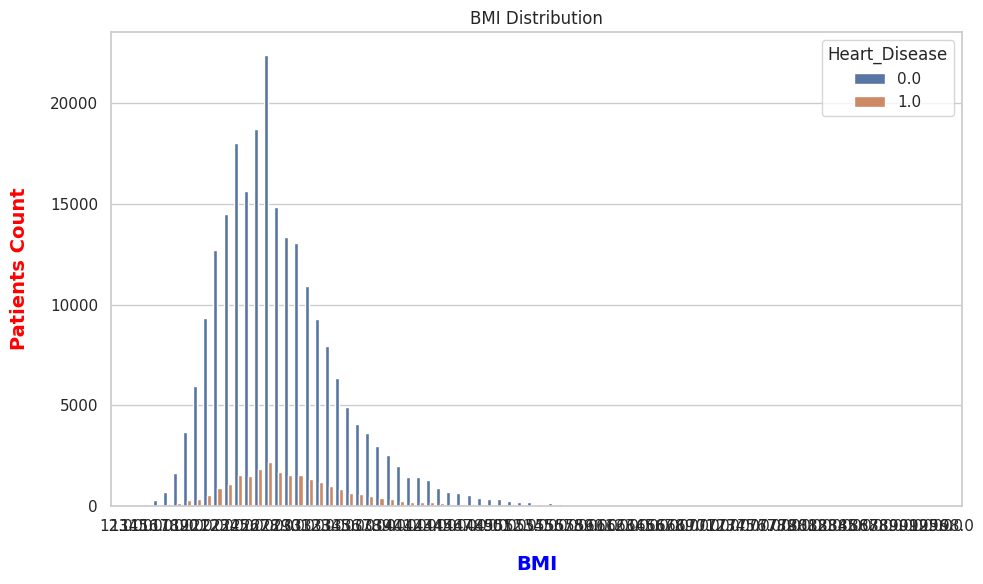

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['BMI', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='BMI', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('BMI', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('BMI Distribution')
plt.tight_layout()

plt.show()


Bar plot without 27 (BMI) value

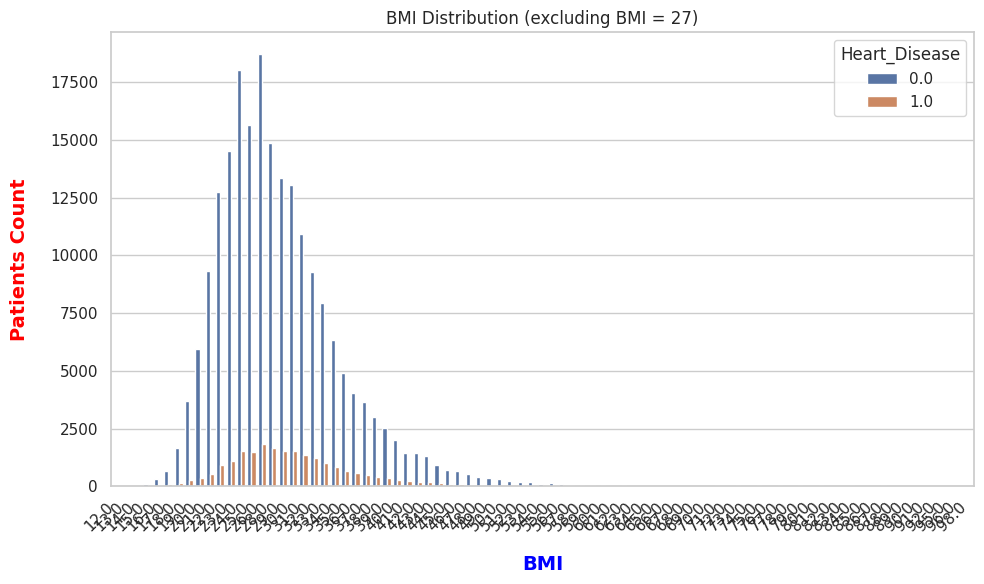

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns

fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB[Diabetic_DB['BMI'] != 27].groupby(['BMI', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')
sns.barplot(x='BMI', y='count', hue='Heart_Disease', data=ploter)
plt.xlabel('BMI', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('BMI Distribution (excluding BMI = 27)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


From previews plots (Bar plot)

We noticed the following That the The bigger the BMI the more people gets heart disease


##### Heart Disease
coronary heart disease (CHD) or myocardial infarction (MI)
- 0 = Healthy
- 1 = Having heart problem

Bar Chart Heart Disease

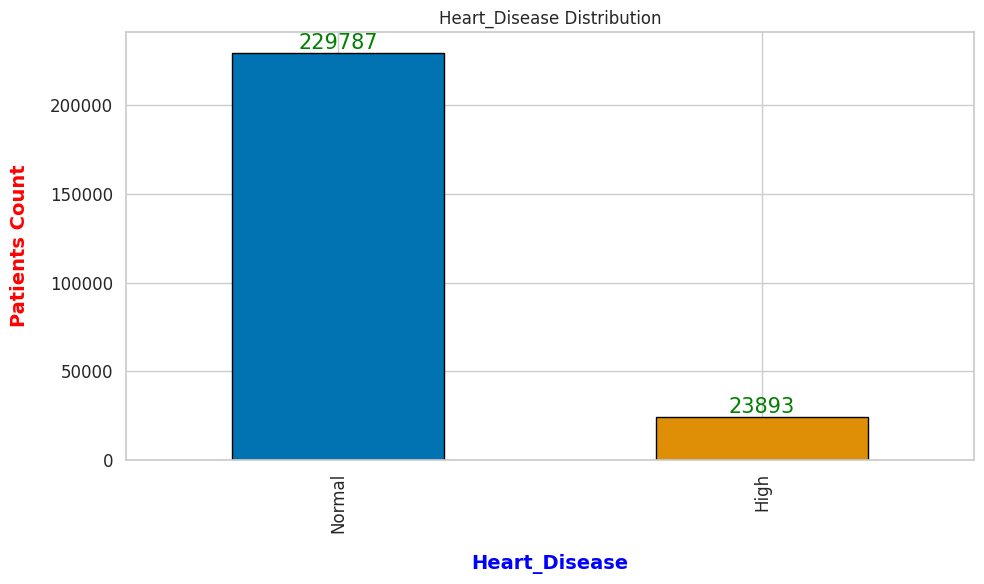

In [ ]:
fig = plt.figure(figsize=(10, 6))
label = ["Healthy","Heart Disease"]
ax = Diabetic_DB['Heart_Disease'].value_counts().plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(labels)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('Heart_Disease', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Heart_Disease Distribution')
plt.tight_layout()

plt.show()

Pie Chart Heart_Disease

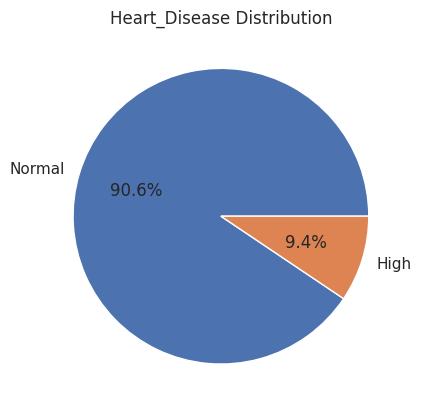

In [ ]:
df= Diabetic_DB['Heart_Disease'].value_counts()
label = ["Healthy","Heart Disease"]

plt.pie(df.values, labels = labels, autopct='%1.1f%%')
plt.title("Heart_Disease Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that the amount of people have heart disease in this data set is very little


Bar Plot with respect to Diabetic or healthy

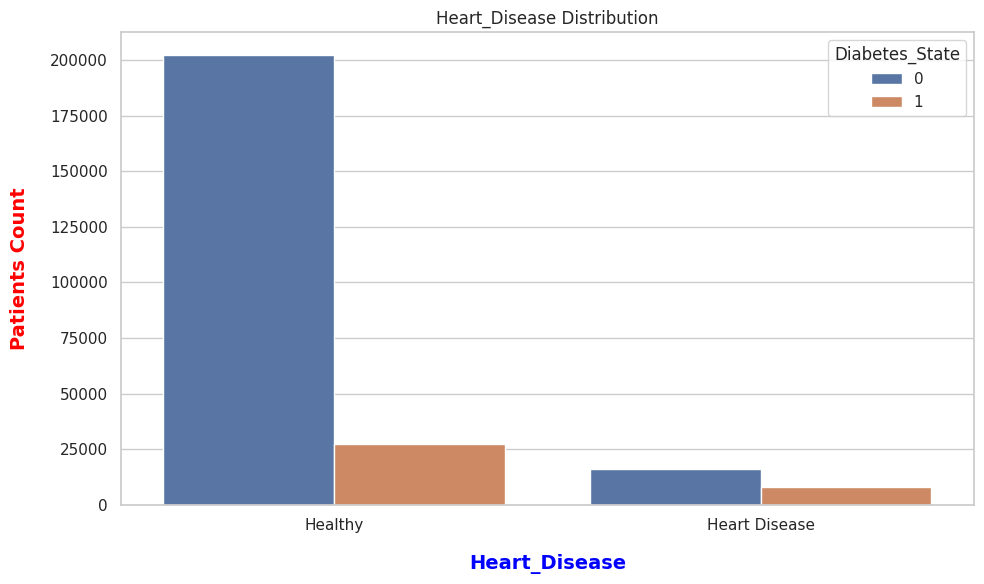

In [ ]:

fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Heart_Disease', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')

label = ["Healthy","Heart Disease"]

sns.barplot(x='Heart_Disease', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('Heart_Disease', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Heart_Disease Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=label)


plt.show()

From previews plots (Bar plot)

We noticed the following that the ratio between people having healthy people and having only diabetes nearly equal to people with heart disease and people having both heart disease and diabetes

This isn't enought for proving that there is relation between heart disease and diabetes


##### PhysActivity (Physical Activity)
physical activity in past 30 days - not including job
- 0 = No
- 1 = Yes


Bar Chart PhysActivity

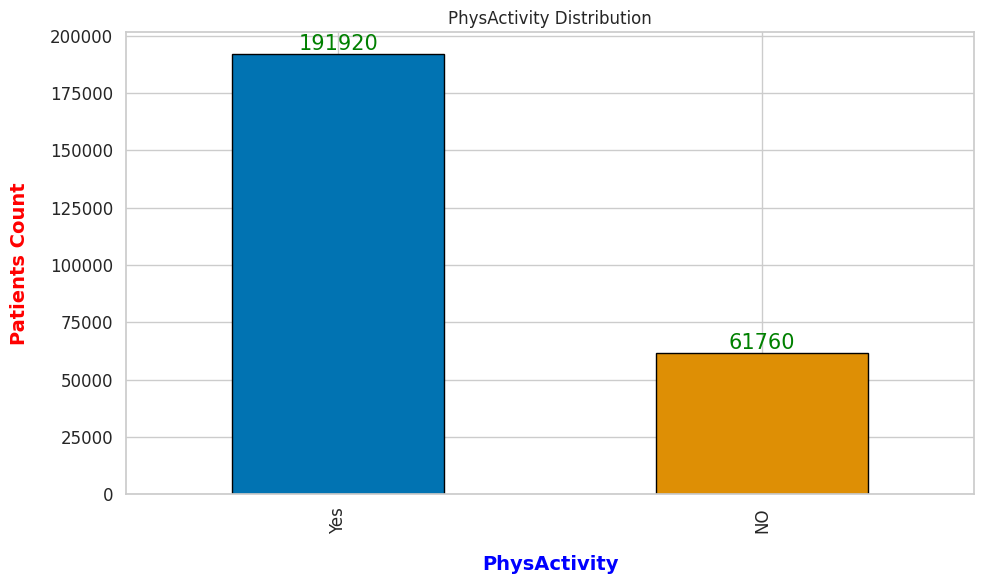

In [ ]:
fig = plt.figure(figsize=(10, 6))

labels = [ 'Yes','NO']
ax = Diabetic_DB['PhysActivity'].value_counts().plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(labels)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('PhysActivity', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysActivity Distribution')
plt.tight_layout()

plt.show()

Pie Chart PhysActivity

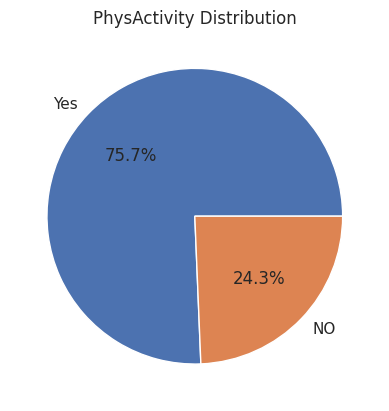

In [ ]:
df= Diabetic_DB['PhysActivity'].value_counts()
labels = [ 'Yes','NO']

plt.pie(df.values, labels = labels, autopct='%1.1f%%')
plt.title("PhysActivity Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that most of the data shows that most of people do physical activities  in last 30 days


Bar Plot with respect to Diabetic or healthy

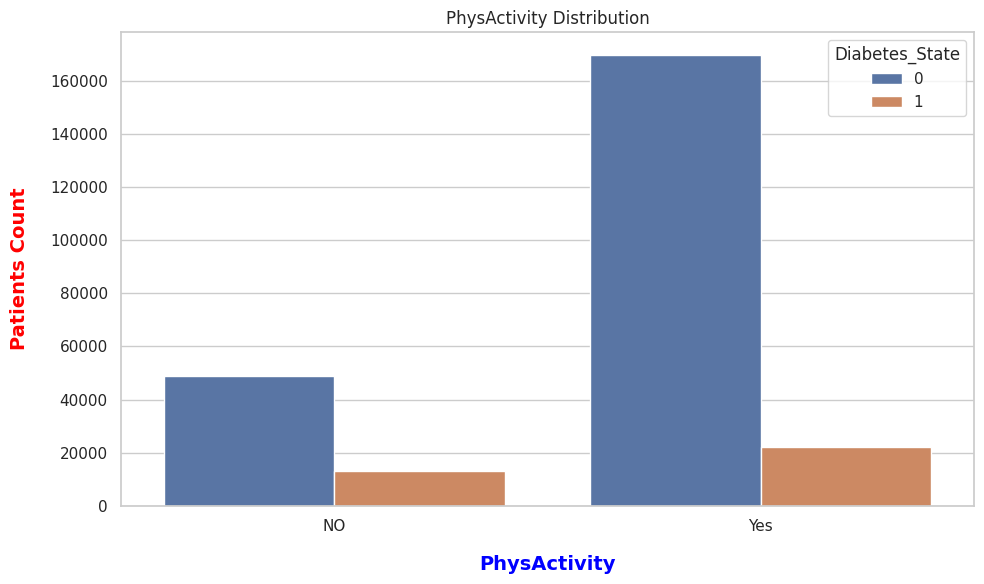

In [ ]:

fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['PhysActivity', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
labels = [ 'Yes','NO']

sns.barplot(x='PhysActivity', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('PhysActivity', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysActivity Distribution')
plt.tight_layout()

plt.xticks(ticks=[1, 0], labels=labels)


plt.show()

From previews plots (Bar plot)

We noticed the following that there is no relation between doing physical activity and diabetes as the ratio between both sides can consider near as some people when they got alarm that they got diabetes they start moving so maybe they had diabetes before doing physical activity


but judging by plot results we find that amount of people who do activities and have diabetes is half the people who do activities only and this is not expected as physical activities helps in treating diabetes which means that diabetic peeople do physical activities to decrease diabetes level


Bar Plot with respect to have Heart Disease or healthy

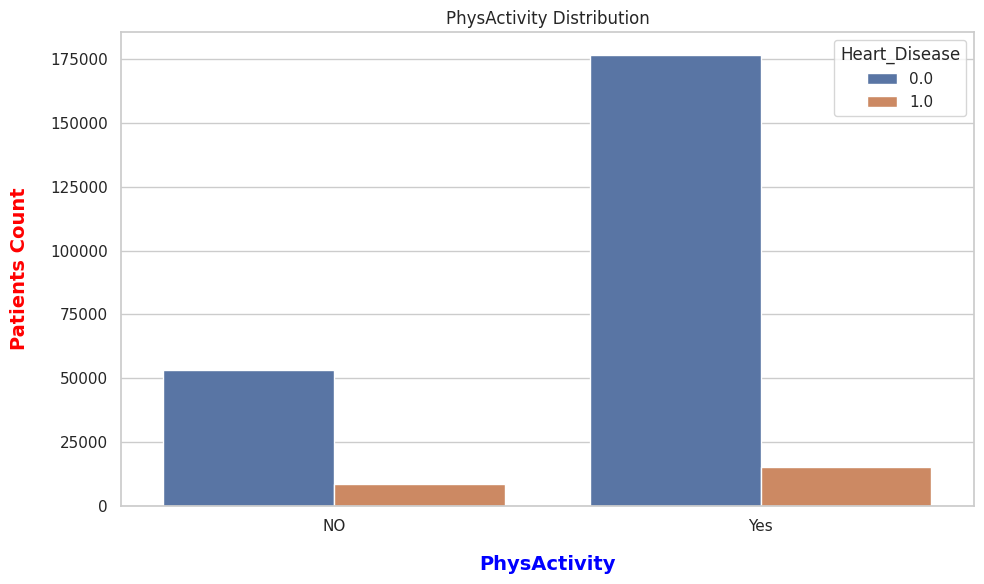

In [ ]:

fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['PhysActivity', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')
labels = [ 'Yes','NO']

sns.barplot(x='PhysActivity', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('PhysActivity', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysActivity Distribution')
plt.tight_layout()

plt.xticks(ticks=[1, 0], labels=labels)

plt.show()


From previews plots (Bar plot)

We noticed the following that there is no relation between doing physical activity and heart disease
but judging by plot results we find that amount of people who do activities and heart disease is greater than the people who don't activities and have heart disease and this is not expected as physical activities helps in treating heart disease which means that peeople who have heart disease do physical activities to treat their heart


##### PhysHlth (Physical Health)
Now thinking about your physical health, which includes physical illness and injury, for how many days during the past 30 days was your physical health not good? scale 1-30 days

Bar Chart PhysHlth

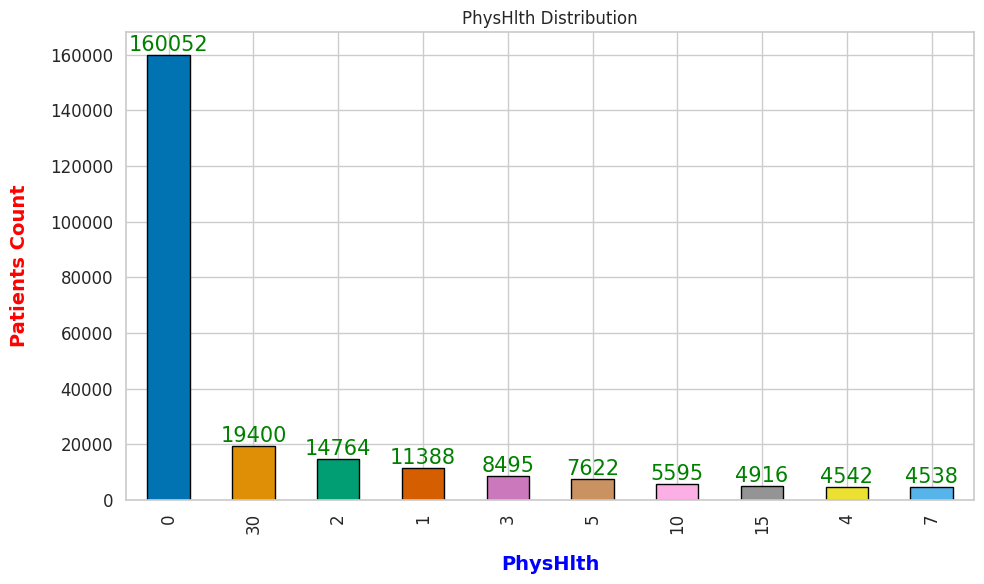

In [ ]:
fig = plt.figure(figsize=(10, 6))

ax = Diabetic_DB['PhysHlth'].value_counts().head(10).plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(list(Diabetic_DB['PhysHlth'].value_counts().head(10).index))
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('PhysHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysHlth Distribution')
plt.tight_layout()

plt.show()

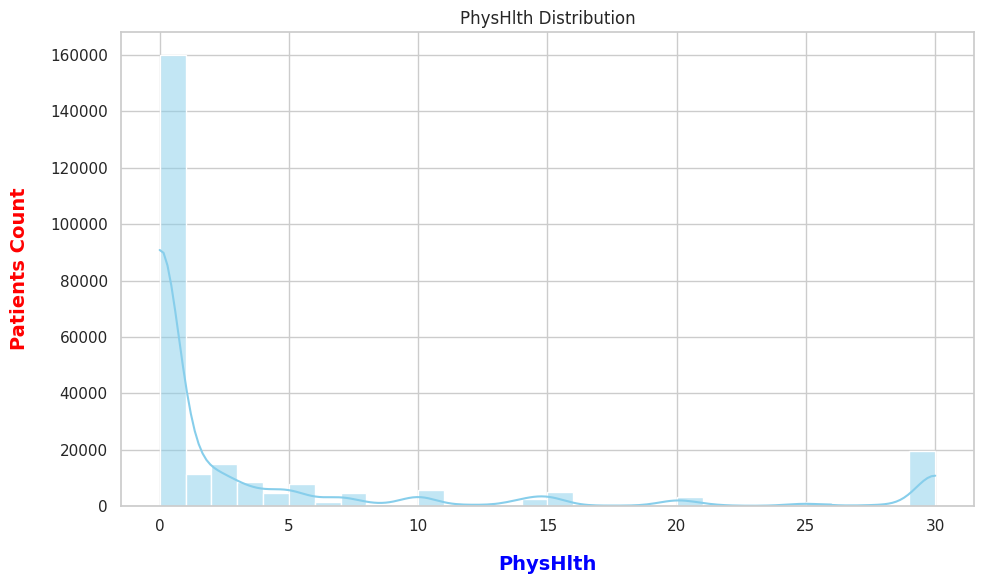

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(Diabetic_DB['PhysHlth'], bins=30, kde=True, color='skyblue')
plt.xlabel('PhysHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysHlth Distribution')
plt.tight_layout()
plt.show()


scatter plot

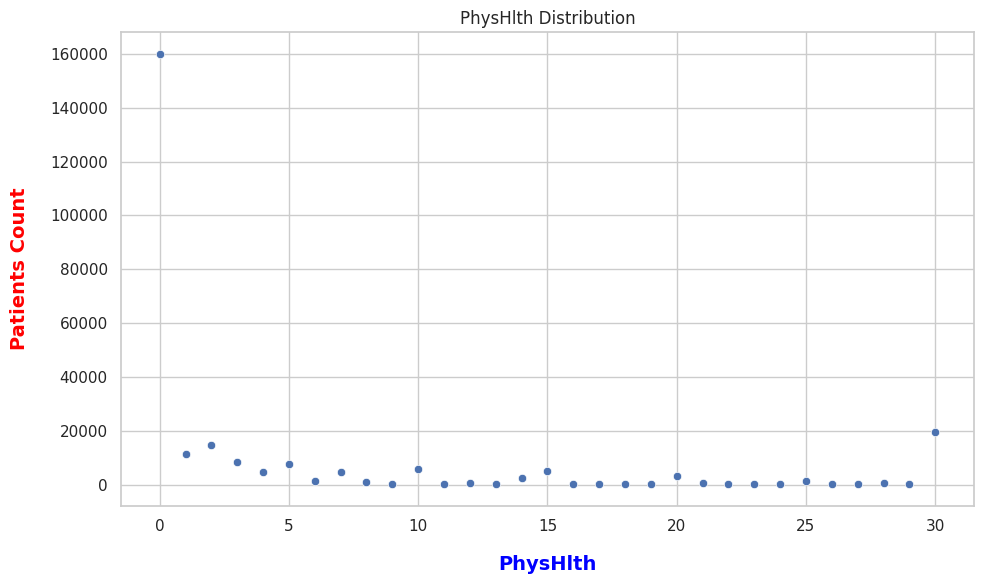

In [ ]:
plt.figure(figsize=(10, 6))
df= Diabetic_DB['PhysHlth'].value_counts()
sns.scatterplot(df)
plt.xlabel('PhysHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysHlth Distribution')
plt.tight_layout()
plt.show()

Pie Chart PhysHlth

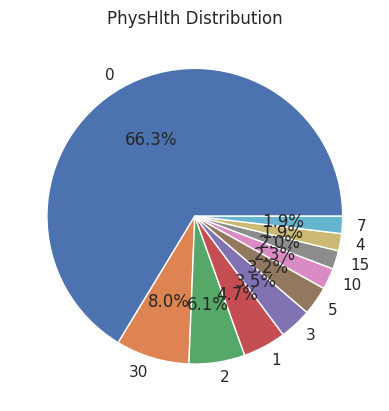

In [ ]:
df= Diabetic_DB['PhysHlth'].value_counts().head(10)
plt.pie(df.values, labels = df.index, autopct='%1.1f%%')
plt.title("PhysHlth Distribution")
plt.show()

From previews plots (Bar plot and Pie plot and scatter plot and histogram)

We noticed the following that the most of cases have over 15 days without any physical problem in last 30 days expect that there are many cases which can't be neglected whose has 30 day physical problems as there are some cases in the middle between 15 days to 30 days


Bar Plot with respect to Diabetic or healthy

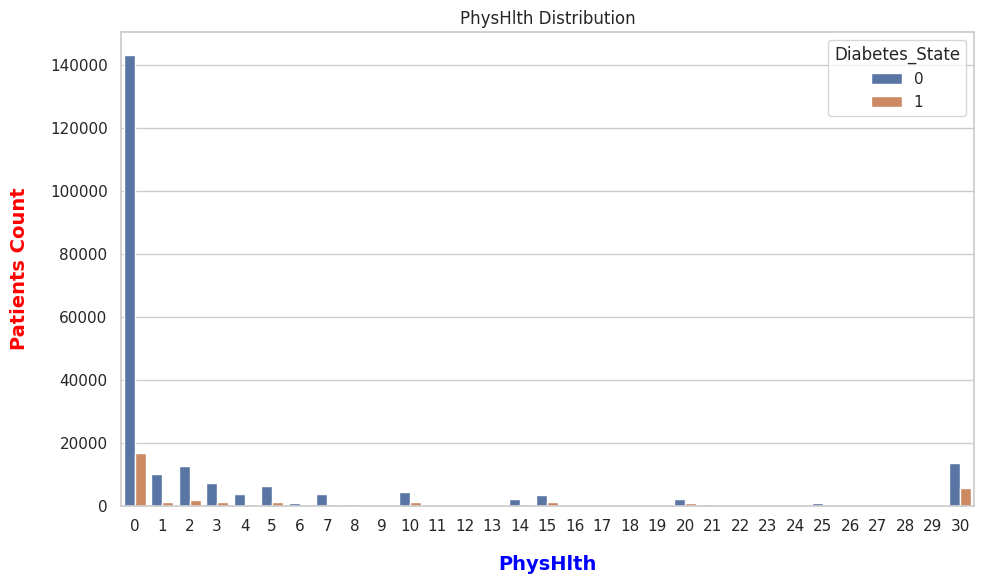

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['PhysHlth', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')

sns.barplot(x='PhysHlth', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('PhysHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysHlth Distribution')
plt.tight_layout()

plt.show()

Bar plot with removing O values to make remaining values clear

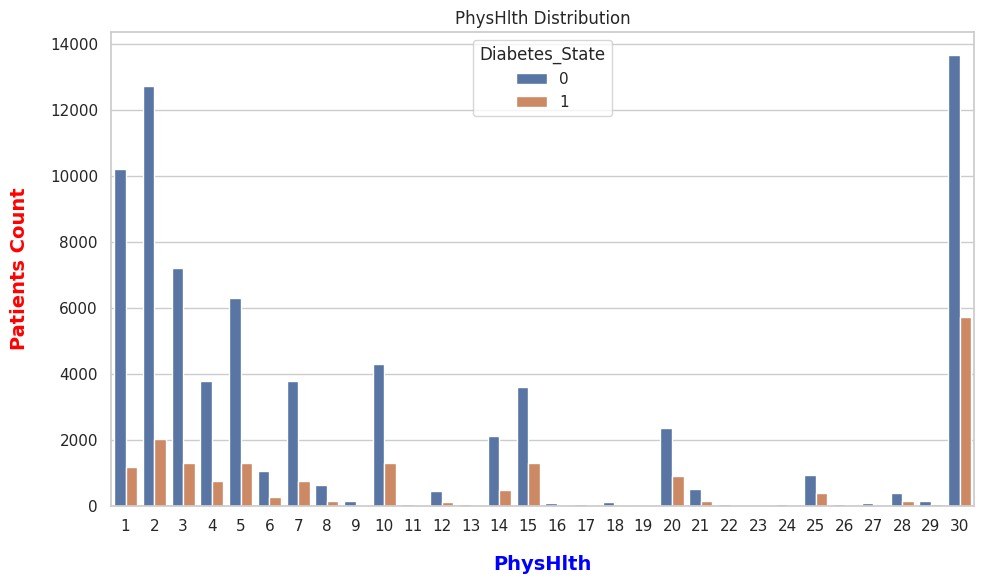

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB[Diabetic_DB['PhysHlth'] != 0].groupby(['PhysHlth', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')

sns.barplot(x='PhysHlth', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('PhysHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysHlth Distribution')
plt.tight_layout()

plt.show()

From previews plots (Bar plot)

We noticed the following that the physical health is not indecator or main cause for diabetes but diabetes can damage physical health

From the plots we see that the amount of cases that have diabetes are equal to healthy cases in numbers except for some cases

The amount of cases in 30 days case are high which indicates that maybe they have serious health problem which may be diabetes part of it

The exception is whose days = 0 as they are the healthy state and it has the biggest count of cases and the amount of diabetic cases is very low to healthy cases


Bar Plot with respect to have Heart Disease or healthy

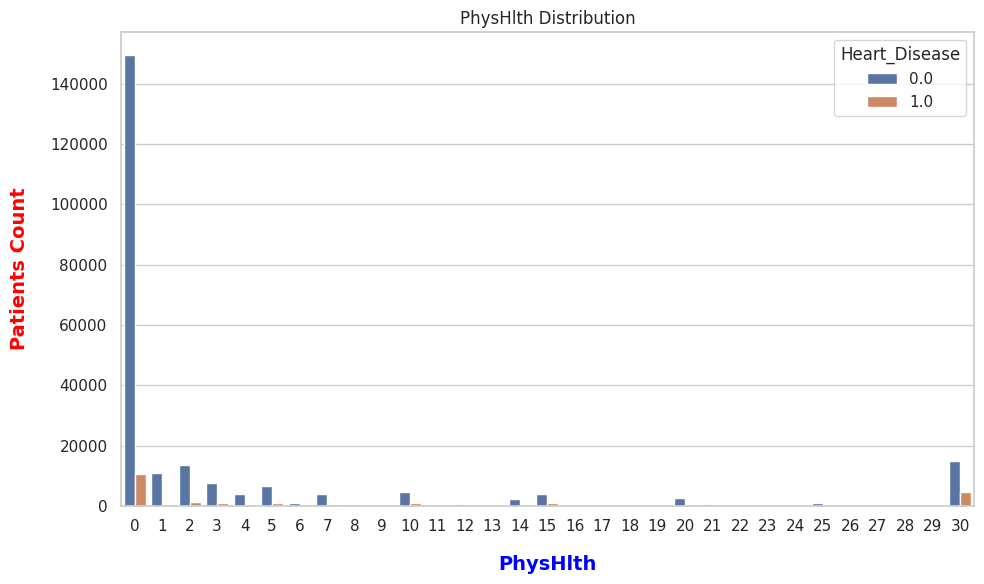

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['PhysHlth', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='PhysHlth', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('PhysHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysHlth Distribution')
plt.tight_layout()

plt.show()


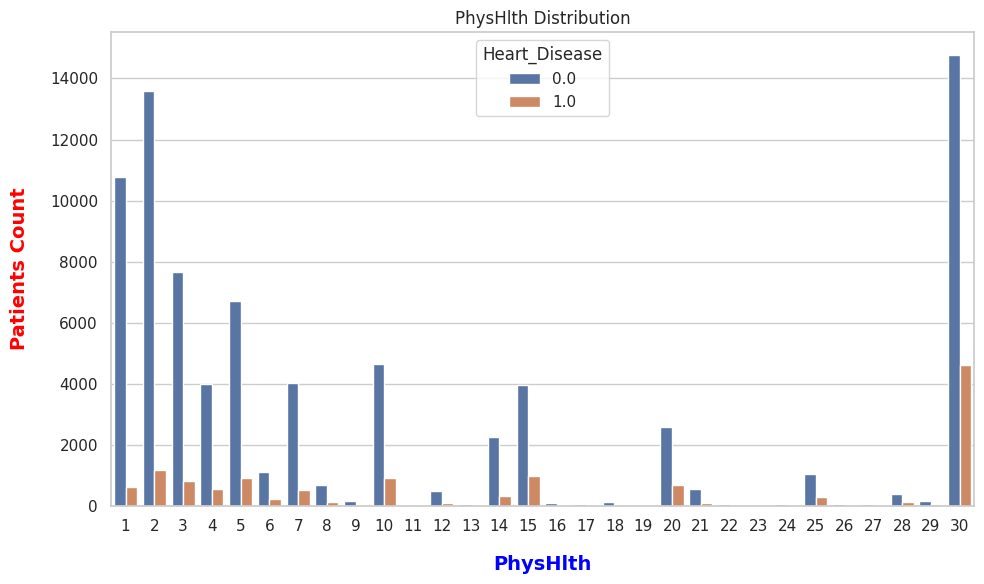

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB[Diabetic_DB['PhysHlth'] != 0].groupby(['PhysHlth', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='PhysHlth', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('PhysHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('PhysHlth Distribution')
plt.tight_layout()

plt.show()


From previews plots (Bar plot)

We noticed the following that the physical health is not indecator or main cause for Heart Disease but Heart Disease can damage physical health

The amount of cases that have Heart Disease is nearly equal in all days except in days with no cases and 30 days case which indicate that maybe they have serious health problem which may be Heart Disease part of it

##### Gender
- 0 = Female
- 1 = Male

Bar Chart Gender

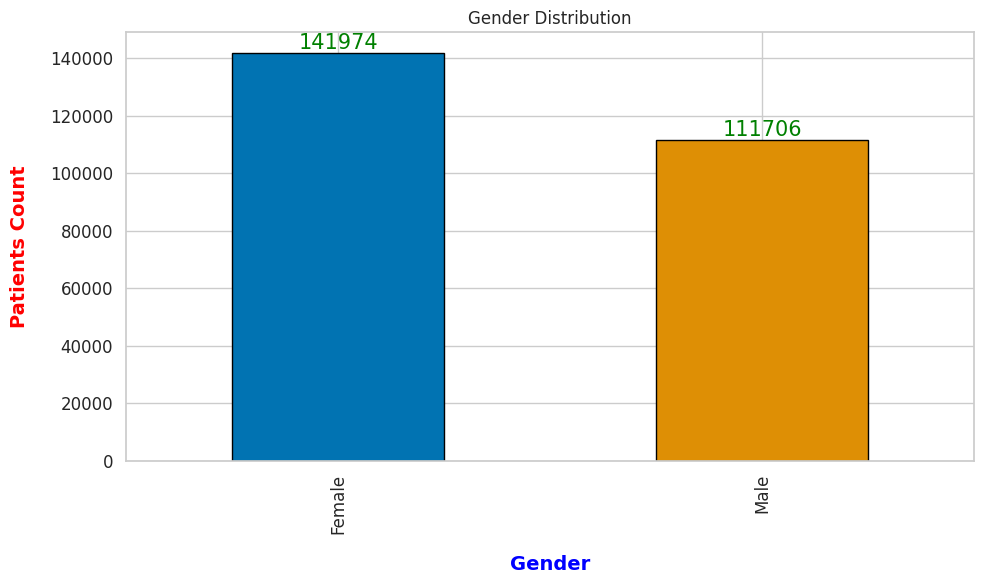

In [ ]:
fig = plt.figure(figsize=(10, 6))

label = ["Female","Male"]

ax = Diabetic_DB['Gender'].value_counts().plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(label)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('Gender', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Gender Distribution')
plt.tight_layout()

plt.show()

Pie Chart Gender

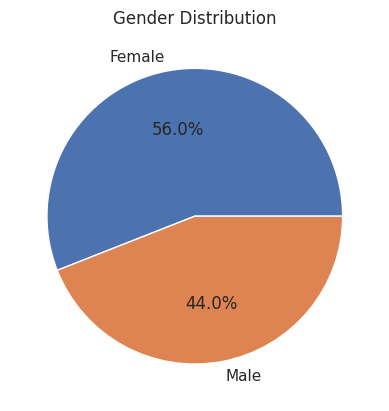

In [ ]:
df= Diabetic_DB['Gender'].value_counts()
label = ["Female","Male"]

plt.pie(df.values, labels = label, autopct='%1.1f%%')
plt.title("Gender Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that amount of males and females are nearly equal (females 55.3% is greater that males 44.7)


Bar Plot with respect to Diabetic or healthy

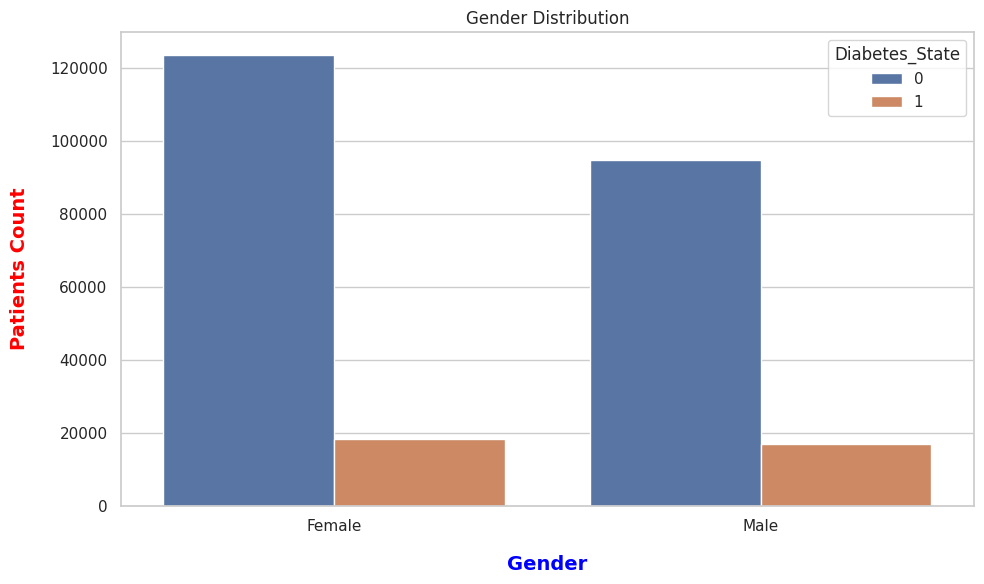

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Gender', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
label = ["Female","Male"]

sns.barplot(x='Gender', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('Gender', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Gender Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=label)

plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that the difference between healthy cases to diabetic cases in females side is greater than in male side as we see that diabetic cases is equal the half of healthy cases


Bar Plot with respect to have Heart Disease or healthy

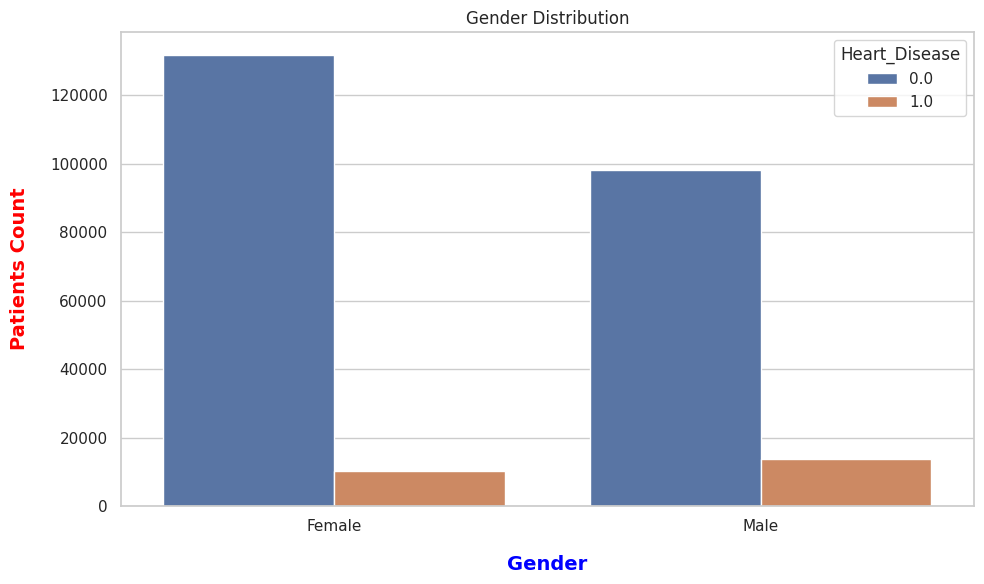

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Gender', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='Gender', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('Gender', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Gender Distribution')
plt.tight_layout()

label = ["Female","Male"]

plt.xticks(ticks=[0, 1], labels=label)


plt.show()


From previews plots (Bar plot and Pie plot)

We noticed the following that the amount of cases that have heart disease in females side is nearly equal to in males side


##### Age
Range from 0 to 100 years old

Bar Chart Age

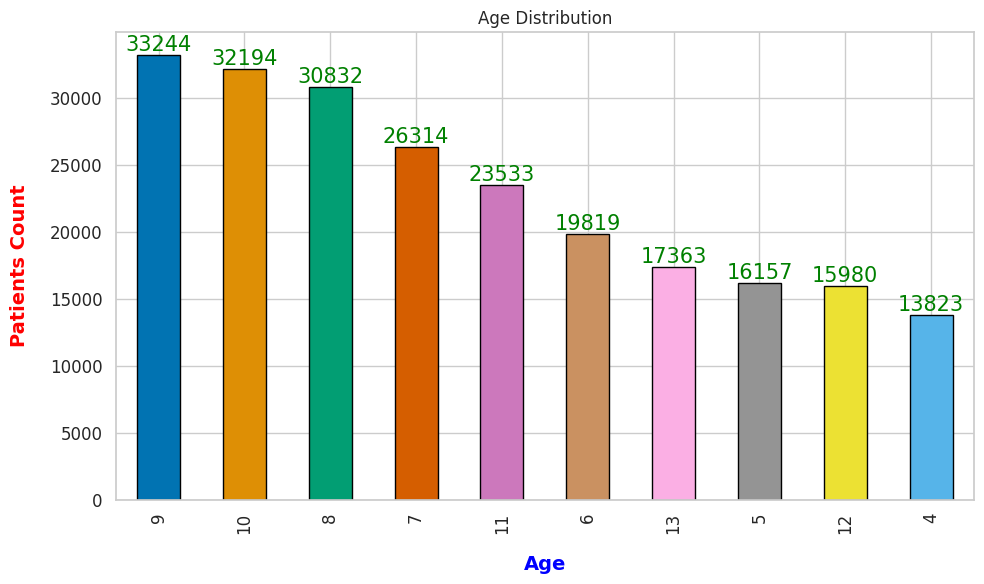

In [ ]:
fig = plt.figure(figsize=(10, 6))

ax = Diabetic_DB['Age'].value_counts().head(10).plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(list(Diabetic_DB['Age'].value_counts().head(10).index))
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('Age', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Age Distribution')
plt.tight_layout()

plt.show()

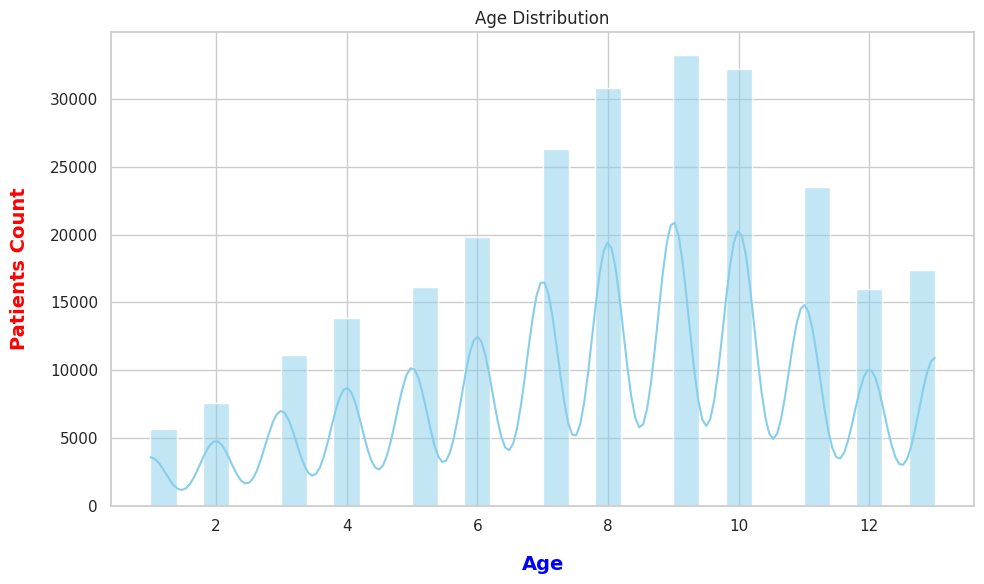

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(Diabetic_DB['Age'], bins=30, kde=True, color='skyblue')
plt.xlabel('Age', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Age Distribution')
plt.tight_layout()
plt.show()


scatter plot

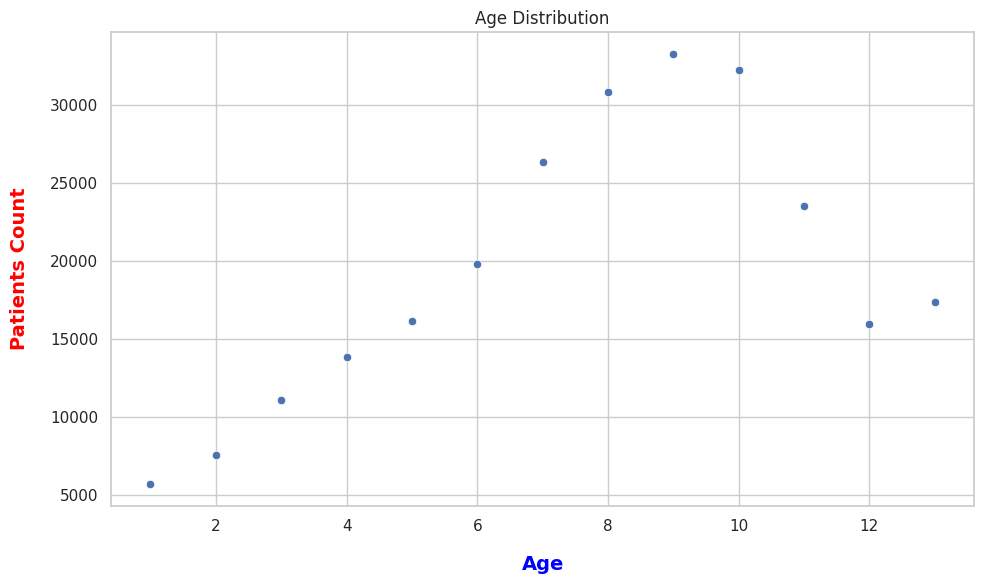

In [ ]:
plt.figure(figsize=(10, 6))
df= Diabetic_DB['Age'].value_counts()
sns.scatterplot(df)
plt.xlabel('Age', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Age Distribution')
plt.tight_layout()
plt.show()

Pie Chart Age

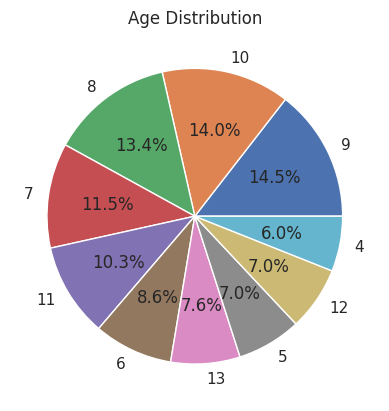

In [ ]:
df= Diabetic_DB['Age'].value_counts().head(10)
plt.pie(df.values, labels = df.index, autopct='%1.1f%%')
plt.title("Age Distribution")
plt.show()

From previews plots (Bar plot and Pie plot and scatter plot and histogram)

We noticed the following that there are very large amount of cases in small age (range from 0 to 20 years old) and other values are in normal distribution shape (bell shape)


Bar Plot with respect to Diabetic or healthy

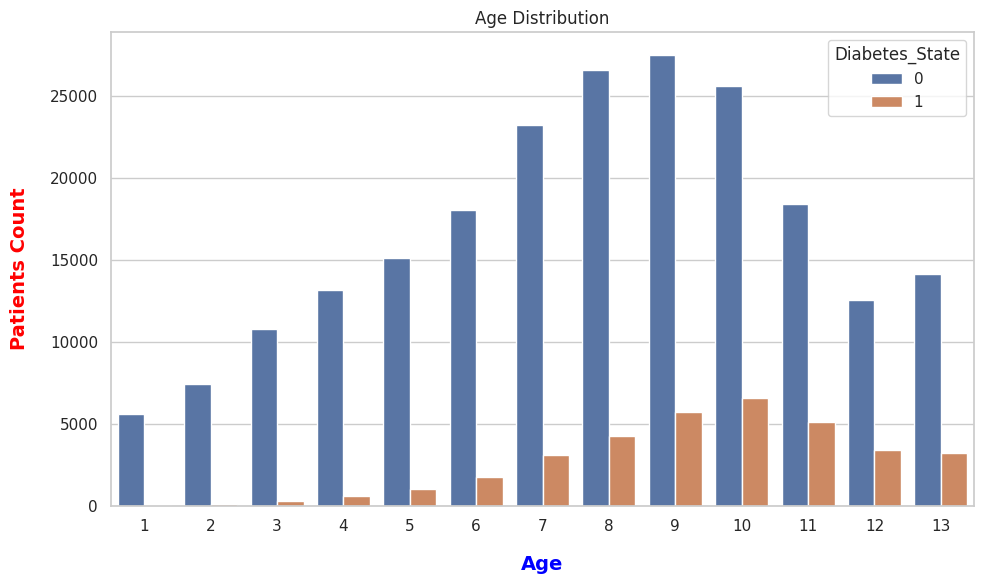

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Age', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')

sns.barplot(x='Age', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('Age', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Age Distribution')
plt.tight_layout()

plt.show()

From previews plots (Bar plot)

We noticed the following that in the small age the probablity that you get diabetes is not so high but after age 25 the older you get the more chance to get diabetes



Bar Plot with respect to have Heart Disease or healthy

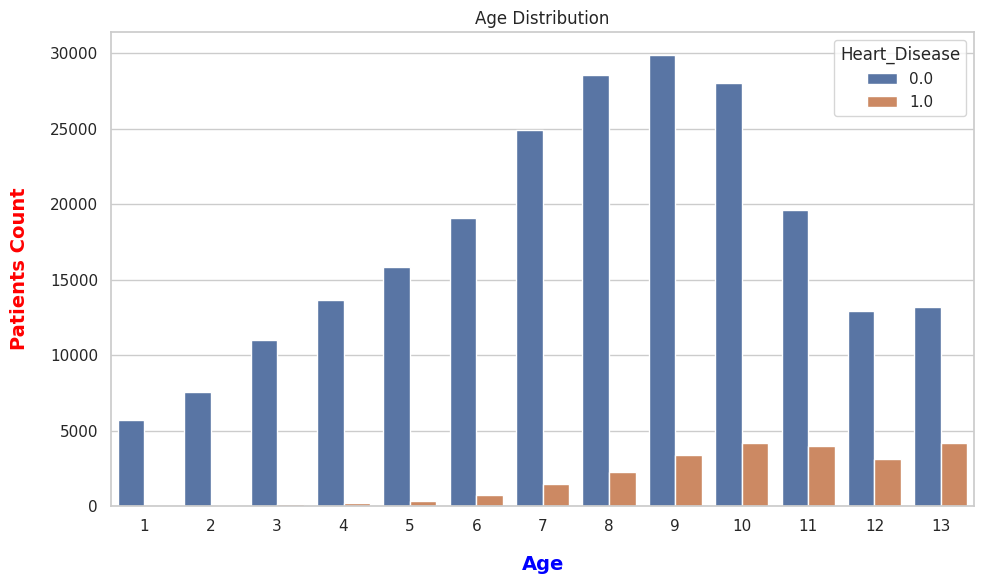

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Age', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='Age', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('Age', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Age Distribution')
plt.tight_layout()

plt.show()


From previews plots (Bar plot and Pie plot)

We noticed the following That the available data shows that there is chance in small ages you can get heart disease but the plot doesn't show the chance of old age of getting heart disease


##### Stroke
- 0 = Healthy
- 1 = Having Stroke

Bar Chart Stroke

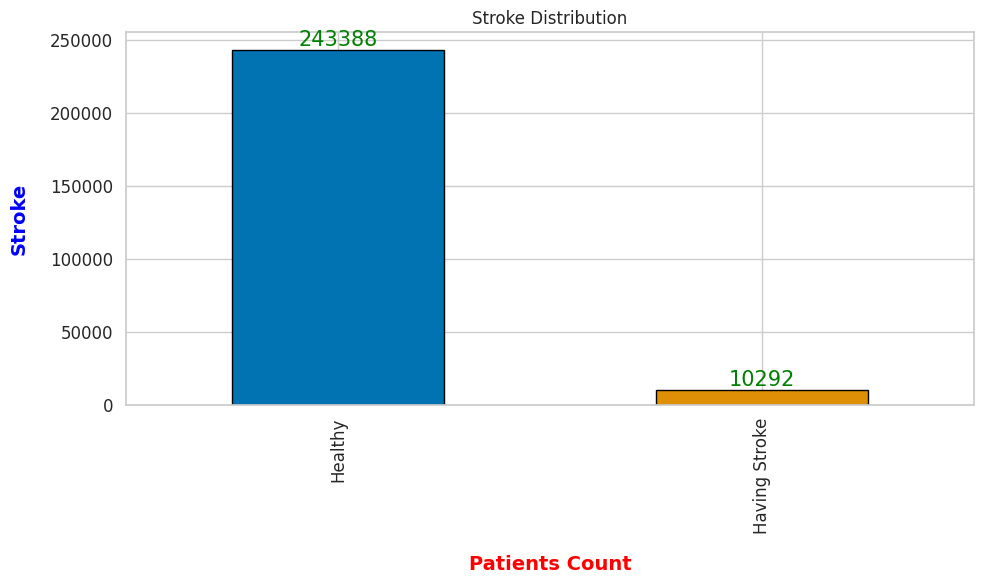

In [ ]:
fig = plt.figure(figsize=(10, 6))
label = ["Healthy","Having Stroke"]
ax = Diabetic_DB['Stroke'].value_counts().plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(label)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.ylabel('Stroke', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Stroke Distribution')
plt.tight_layout()

plt.show()

Pie Chart Stroke

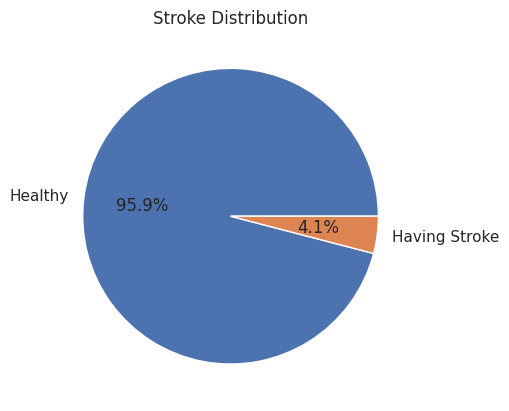

In [ ]:
df= Diabetic_DB['Stroke'].value_counts()
label = ["Healthy","Having Stroke"]

plt.pie(df.values, labels = label, autopct='%1.1f%%')
plt.title("Stroke Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that the amount of cases that had stroke is very little can't judge with it  as mostly all cases are healthy


Bar Plot with respect to Diabetic or healthy

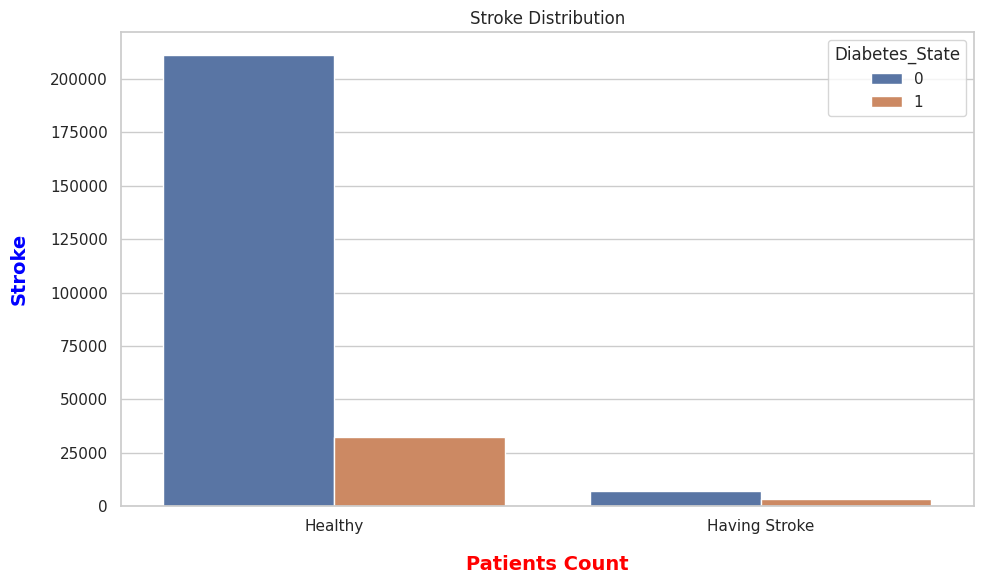

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Stroke', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
label = ["Healthy","Having Stroke"]

sns.barplot(x='Stroke', y='count', hue='Diabetes_State', data=ploter)

plt.ylabel('Stroke', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Stroke Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=label)

plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following the ratio between cases of having diabetes and cases of not having diabetes are nearly equal in both sides (the cases of having diabetes is half the cases of not having diabetes)


Bar Plot with respect to have Heart Disease or healthy

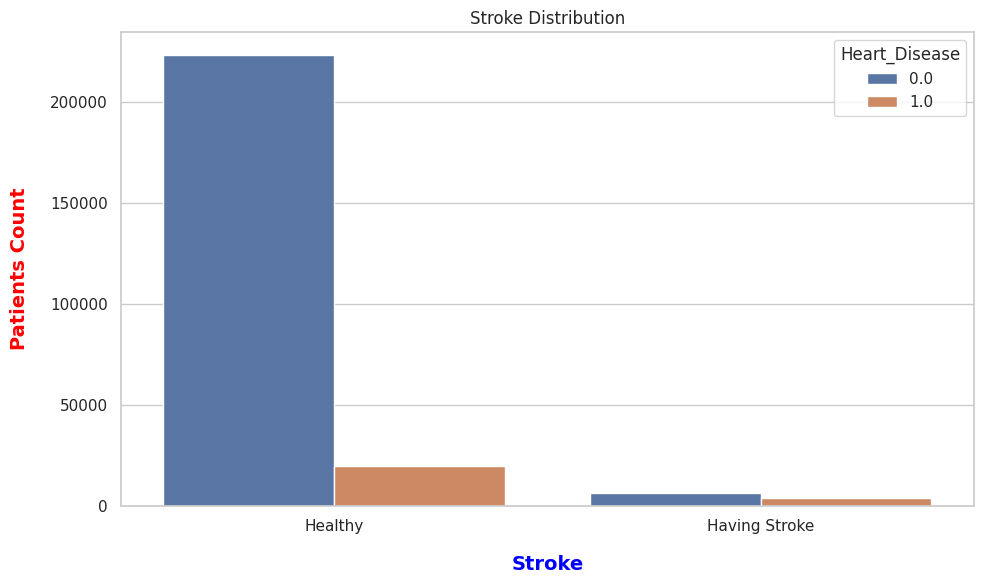

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Stroke', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='Stroke', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('Stroke', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Stroke Distribution')
plt.tight_layout()
label = ["Healthy","Having Stroke"]
plt.xticks(ticks=[0, 1], labels=label)

plt.show()


From previews plots (Bar plot and Pie plot)

We noticed the following that is the cases in having stroke have chance to get heart disease as stroke cause heart problem


##### GenHlth (General health)
Would you say that in general your health is: scale 1-5
- 1 = excellent
- 2 = very good
- 3 = good
- 4 = fair
- 5 = poor

In [ ]:
Diabetic_DB['GenHlth'].value_counts()

,count
GenHlth,
2.00,89084
3.00,75646
1.00,45299
4.00,31570
5.00,12081


Bar Chart GenHlth

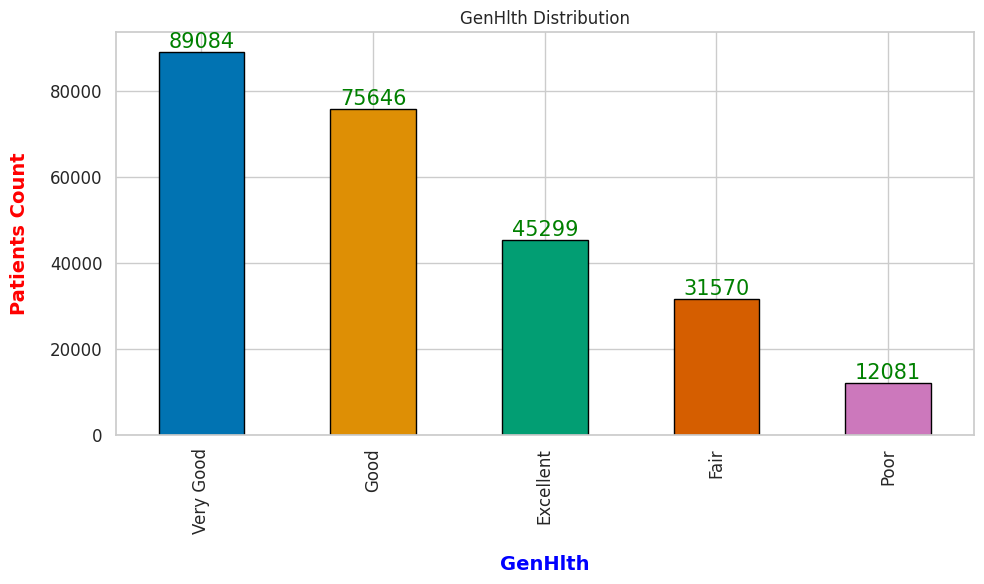

In [ ]:
fig = plt.figure(figsize=(10, 6))

label = ["Very Good","Good","Excellent","Fair","Poor"]

ax = Diabetic_DB['GenHlth'].value_counts().plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(label)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('GenHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('GenHlth Distribution')
plt.tight_layout()

plt.show()

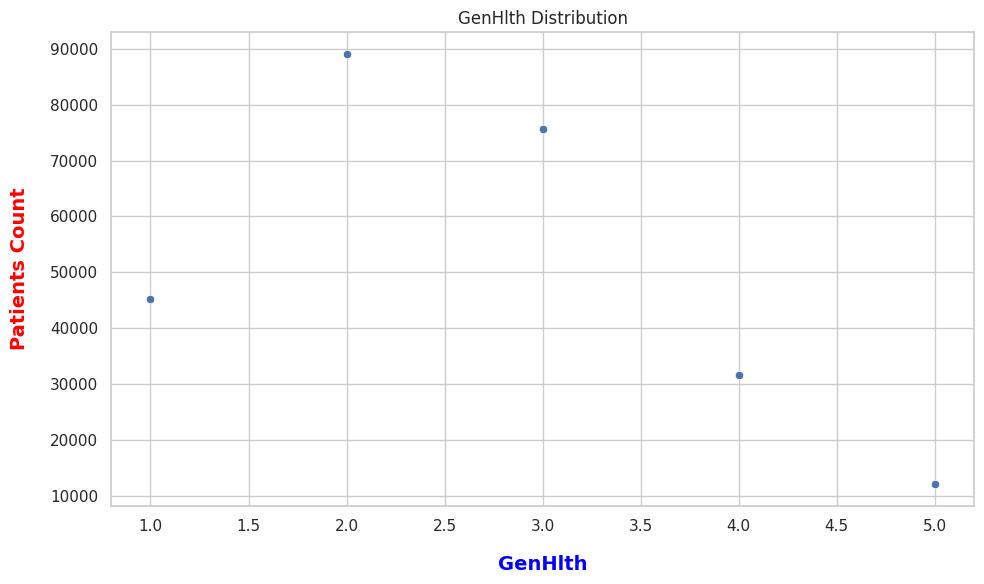

In [ ]:
plt.figure(figsize=(10, 6))
df= Diabetic_DB['GenHlth'].value_counts()
sns.scatterplot(df)
plt.xlabel('GenHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('GenHlth Distribution')
plt.tight_layout()
plt.show()

Pie Chart GenHlth

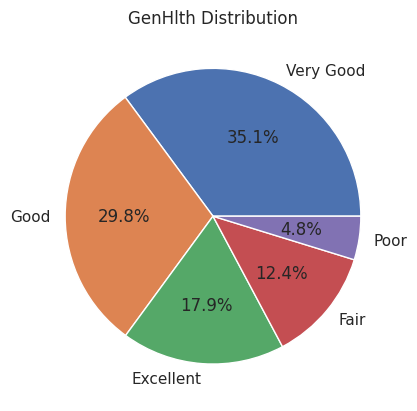

In [ ]:
df= Diabetic_DB['GenHlth'].value_counts()
label = ["Very Good","Good","Excellent","Fair","Poor"]

plt.pie(df.values, labels = label, autopct='%1.1f%%')
plt.title("GenHlth Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that is the big amount of people are in very good and good states as they have 75% of data (53.7% + 21.3%)

The poor cases is very little (3.4%) with respect to other states


Bar Plot with respect to Diabetic or healthy

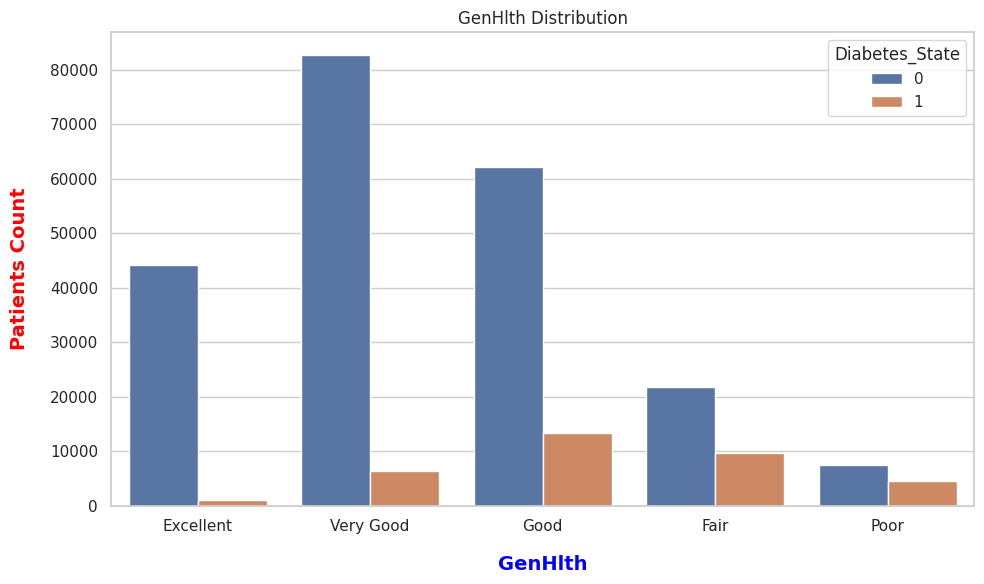

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['GenHlth', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')

sns.barplot(x='GenHlth', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('GenHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('GenHlth Distribution')
plt.tight_layout()
label = ["Excellent","Very Good","Good","Fair","Poor"]

plt.xticks(ticks=[0,1, 2,3,4], labels=label)


plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that

1.  In Excellent state, the amount of diabetic cases can be neglected as they are little amount with respect to Healthy cases and this is logic as excellent state means your health is great
2.  In Very good state, the amount of people that have diabetes equal to healthy people (there is difference but not big) as this prove that diabetes doesn't effect the health of the patient or in its first stages
3.  In Good state, The amount of cases that has diabetes is little with respect to healthy people and this says that may be the cases suffer other illness that effects on their health or diabetes effect is not strong on them
4.  In Faie state, the amount of people that have diabetes equal to half healthy people and this state shows that the patient has some problem in his body and maybe one of them is diabetes
5.  In Poor state,the amount of people that have diabetes equal to healthy people (there is difference but not big) and this is logic as poor health then the patient having serious problems and diabetes can causes problems in human body and effect health if the state of diabetes is high

Bar Plot with respect to have Heart Disease or healthy

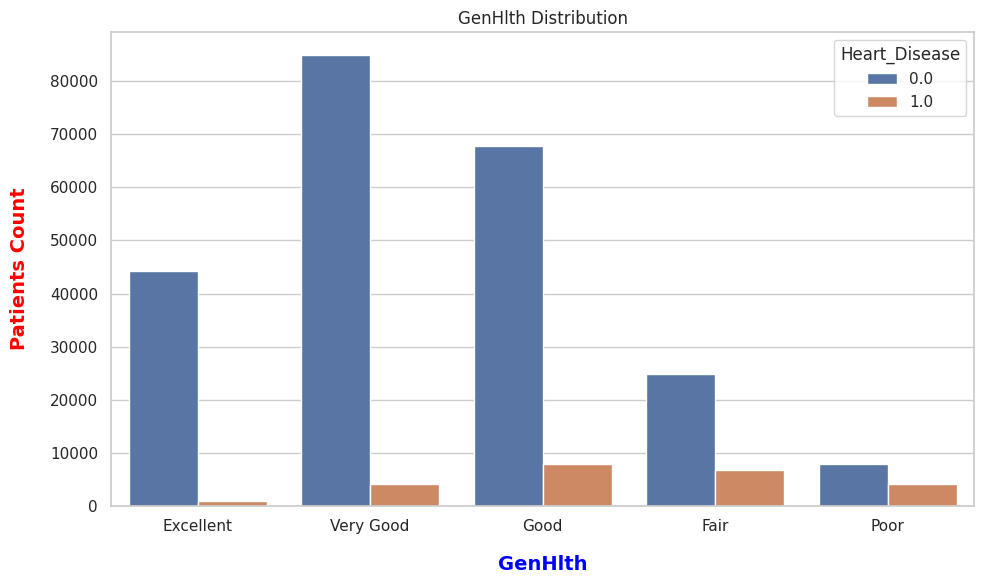

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['GenHlth', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='GenHlth', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('GenHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('GenHlth Distribution')
plt.tight_layout()
label = ["Excellent","Very Good","Good","Fair","Poor"]

plt.xticks(ticks=[0,1, 2,3,4], labels=label)


plt.show()


From previews plots (Bar plot and Pie plot)

We noticed the following that

1.  In Excellent state, the amount of Heart disease cases can be neglected as they are little amount with respect to Healthy cases and this is logic as excellent state means your health is great
2.  In Very good state, The amount of cases that has Heart disease is little with respect to healthy people which means these cases feels just simple pain can be treated and come over it
3.  In Good state, The amount of cases that has Heart disease is little with respect to healthy people and this says that may be the cases suffer other illness that effects on their health or Heart disease effect is not strong on them
4.  In Faie state, the amount of people that have Heart disease less than the half healthy people and this state shows that the patient has some problem in his body and maybe one of them is Heart disease
5.  In Poor state,the amount of people that have Heart disease equal to healthy people (there is difference but not big) and this is logic as poor health then the patient having serious problems and Heart disease can causes problems in human body and effect health if the state of Heart disease is high


##### CholCheck (Cholesterol Check Status)
Whether the individual had their cholesterol checked in the past five years.
- 0 = no cholesterol check in 5 years
- 1 = yes cholesterol check in 5 years

Bar Chart Stroke

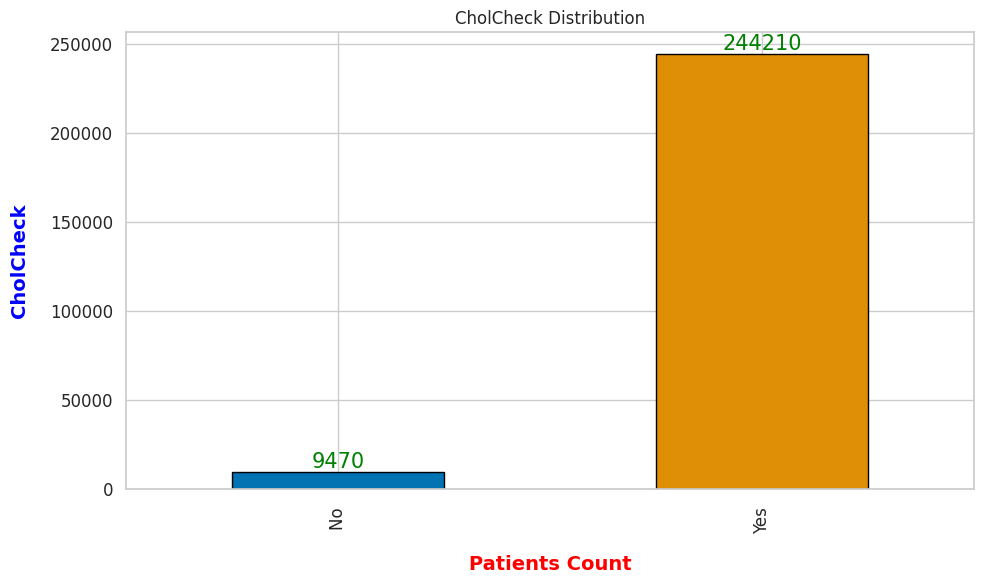

In [ ]:
fig = plt.figure(figsize=(10, 6))
label = ["No ","Yes "]

ax = Diabetic_DB['CholCheck'].value_counts().sort_index() .plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(label)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.ylabel('CholCheck', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('CholCheck Distribution')
plt.tight_layout()

plt.show()

Pie Chart Stroke

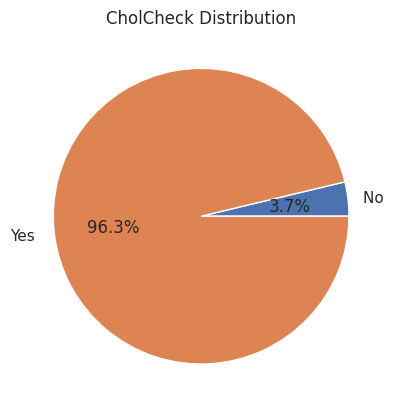

In [ ]:
df= Diabetic_DB['CholCheck'].value_counts().sort_index()
label = ["No ","Yes "]

plt.pie(df.values, labels = label, autopct='%1.1f%%')
plt.title("CholCheck Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that the amount of cases that didn't do the check is very little can't judge with it as mostly all cases that did the check

Bar Plot with respect to Diabetic or healthy

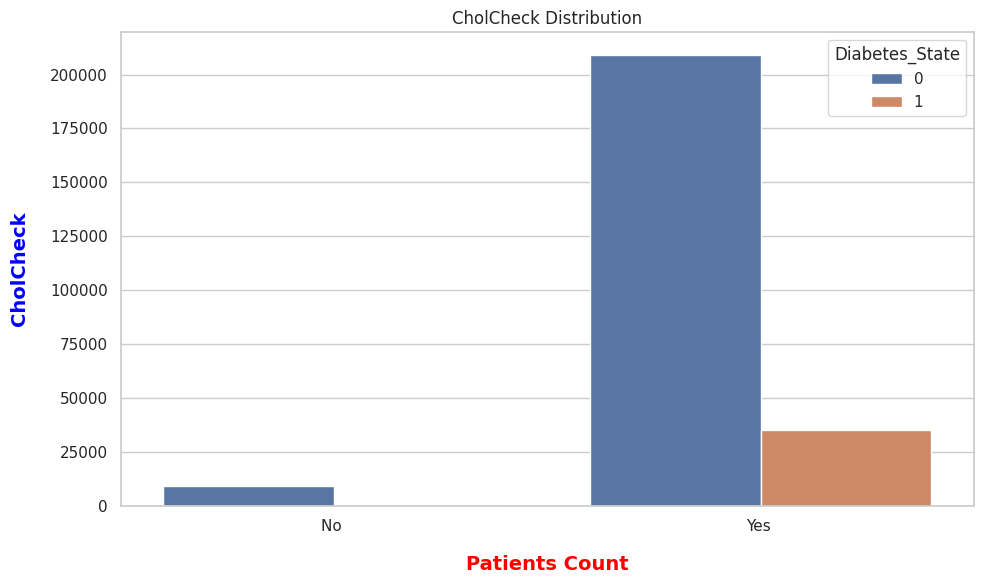

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['CholCheck', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
label = ["No ","Yes "]

sns.barplot(x='CholCheck', y='count', hue='Diabetes_State', data=ploter)

plt.ylabel('CholCheck', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('CholCheck Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=label)

plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following the cases who didn't made the check is little so there is no diabetes cases

in the cases who did made the check there are little amount of cases had diabetes

Bar Plot with respect to have Heart Disease or healthy

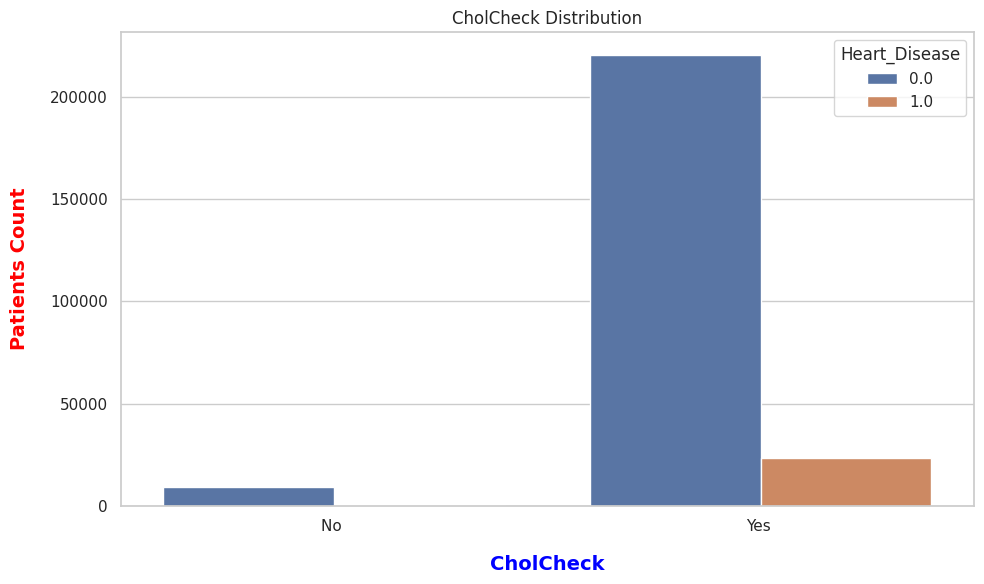

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['CholCheck', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='CholCheck', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('CholCheck', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('CholCheck Distribution')
plt.tight_layout()
label = ["No ","Yes "]
plt.xticks(ticks=[0, 1], labels=label)

plt.show()


From previews plots (Bar plot and Pie plot)

We noticed the following the cases who didn't made the check is little so there is no Heartdisease cases

in the cases who did made the check there are little amount of cases had Heartdisease  

##### Smoker
Have you smoked at least 100 cigarettes in your entire life? [Note: 5 packs = 100 cigarettes]
- 0 = no
- 1 = yes


Bar Chart Stroke

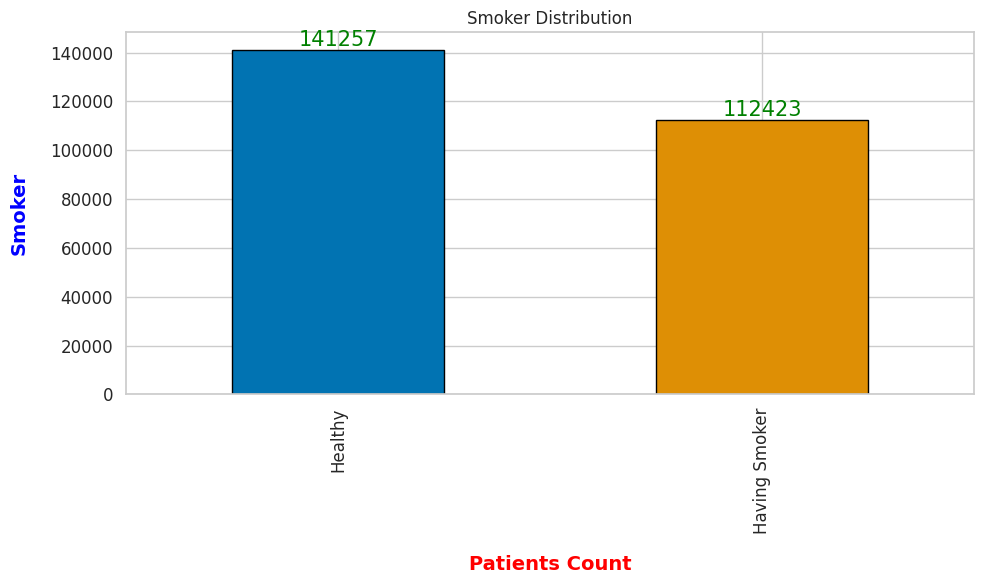

In [ ]:
fig = plt.figure(figsize=(10, 6))
label = ["Healthy","Having Smoker"]
ax = Diabetic_DB['Smoker'].value_counts().plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(label)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.ylabel('Smoker', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Smoker Distribution')
plt.tight_layout()

plt.show()

Pie Chart Stroke

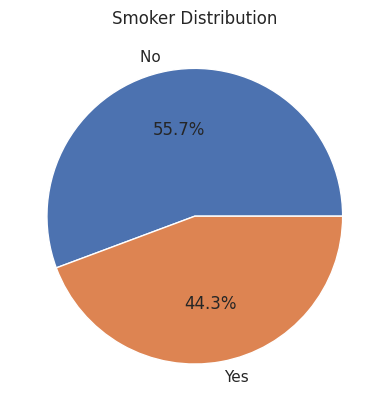

In [ ]:
df= Diabetic_DB['Smoker'].value_counts().sort_index()
label = ["No ","Yes "]

plt.pie(df.values, labels = label, autopct='%1.1f%%')
plt.title("Smoker Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that the amount of smokers are less than not smokers but the data is nearly divided between them

Bar Plot with respect to Diabetic or healthy

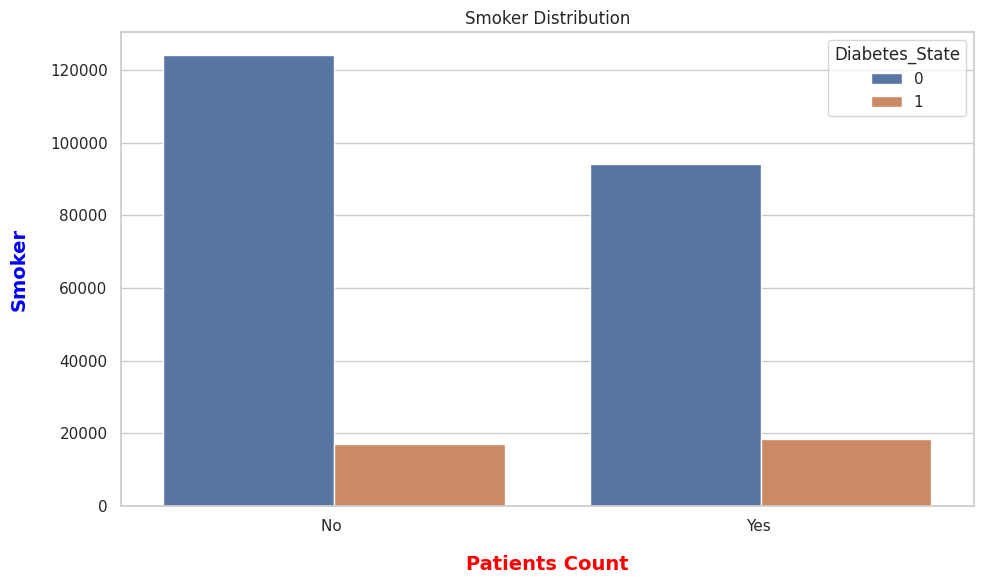

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Smoker', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
label = ["No ","Yes "]

sns.barplot(x='Smoker', y='count', hue='Diabetes_State', data=ploter)

plt.ylabel('Smoker', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Smoker Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=label)

plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following the ratio between cases of having diabetes and cases of not having diabetes are nearly equal in both sides

Bar Plot with respect to have Heart Disease or healthy

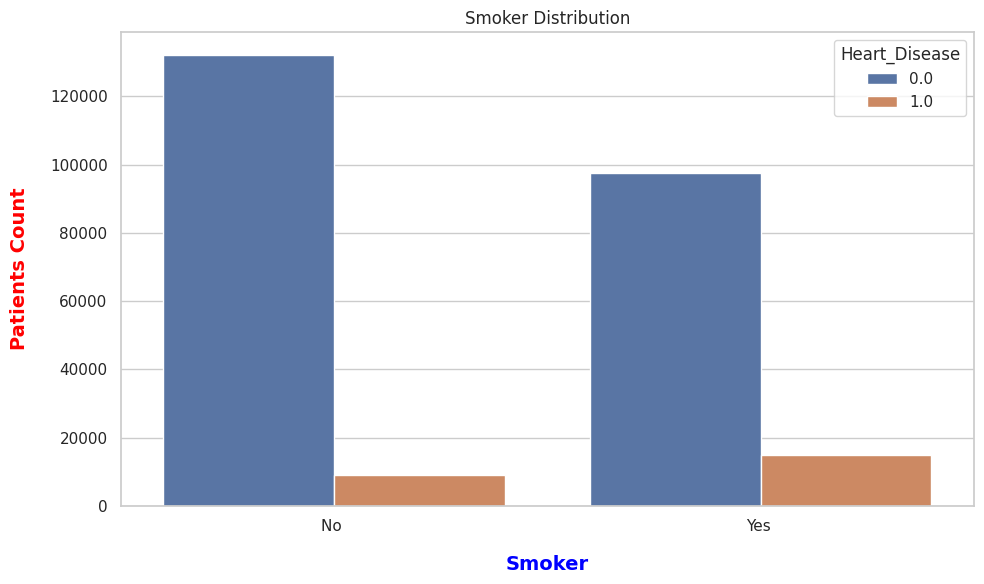

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Smoker', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='Smoker', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('Smoker', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Smoker Distribution')
plt.tight_layout()
label = ["No ","Yes "]
plt.xticks(ticks=[0, 1], labels=label)

plt.show()


From previews plots (Bar plot and Pie plot)

We noticed the following the ratio between cases of having Heart disease and cases of not having Heart disease are nearly equal in both sides but is more in smoker side


##### Fruits
Whether the individual consumes fruits regularly.
Consume Fruit 1 or more times per day
- 0 = no
- 1 = yes

Bar Chart Stroke

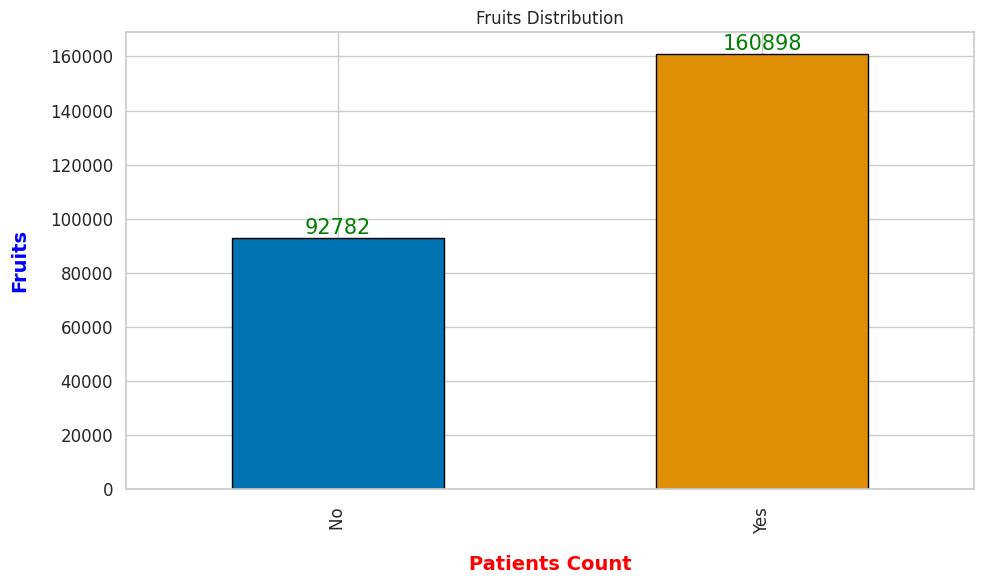

In [ ]:
fig = plt.figure(figsize=(10, 6))
label = ["No ","Yes "]
ax = Diabetic_DB['Fruits'].value_counts().sort_index() .plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(label)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.ylabel('Fruits', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Fruits Distribution')
plt.tight_layout()

plt.show()

Pie Chart Stroke

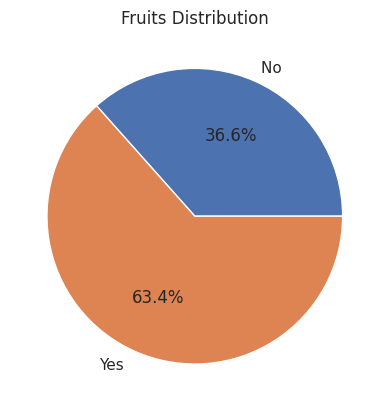

In [ ]:
df= Diabetic_DB['Fruits'].value_counts().sort_index()
label = ["No ","Yes "]

plt.pie(df.values, labels = label, autopct='%1.1f%%')
plt.title("Fruits Distribution")
plt.show()

From previews plots (Bar plot and Pie plot)

We noticed the following that the amount of cases that eat fruit daily is more than who didn't


Bar Plot with respect to Diabetic or healthy

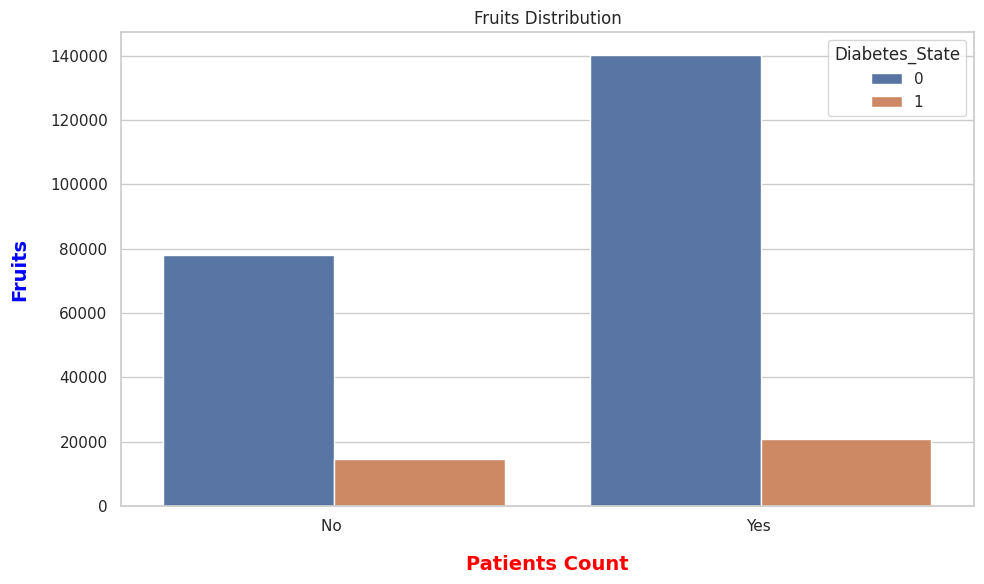

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Fruits', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
label = ["No ","Yes "]

sns.barplot(x='Fruits', y='count', hue='Diabetes_State', data=ploter)

plt.ylabel('Fruits', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Fruits Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=label)

plt.show()

Bar Plot with respect to have Heart Disease or healthy

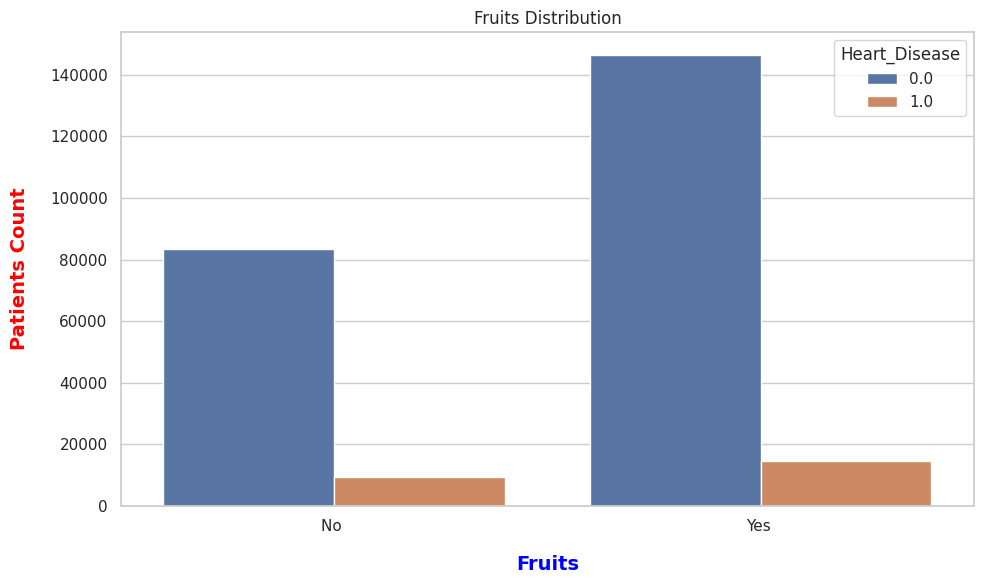

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Fruits', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='Fruits', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('Fruits', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Fruits Distribution')
plt.tight_layout()
label = ["No ","Yes "]
plt.xticks(ticks=[0, 1], labels=label)

plt.show()


##### Veggies
Whether the individual consumes vegetables regularly.
Consume Vegetables 1 or more times per day
- 0 = no
- 1 = yes


Bar Chart Stroke

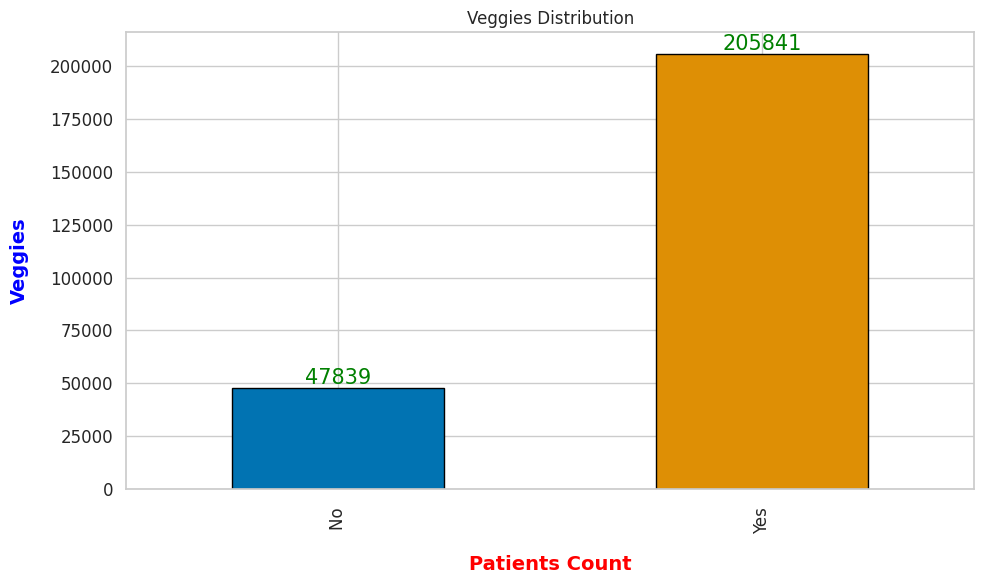

In [ ]:
fig = plt.figure(figsize=(10, 6))
label = ["No ","Yes "]
ax = Diabetic_DB['Veggies'].value_counts().sort_index() .plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(label)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.ylabel('Veggies', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Veggies Distribution')
plt.tight_layout()

plt.show()

Pie Chart Stroke

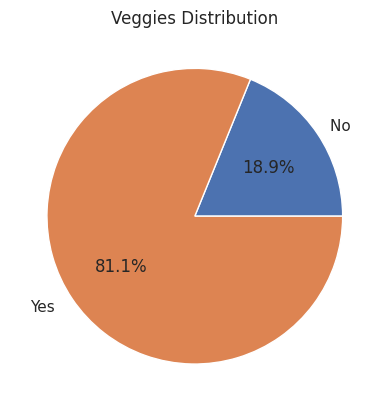

In [ ]:
df= Diabetic_DB['Veggies'].value_counts().sort_index()
label = ["No ","Yes "]

plt.pie(df.values, labels = label, autopct='%1.1f%%')
plt.title("Veggies Distribution")
plt.show()

Bar Plot with respect to Diabetic or healthy

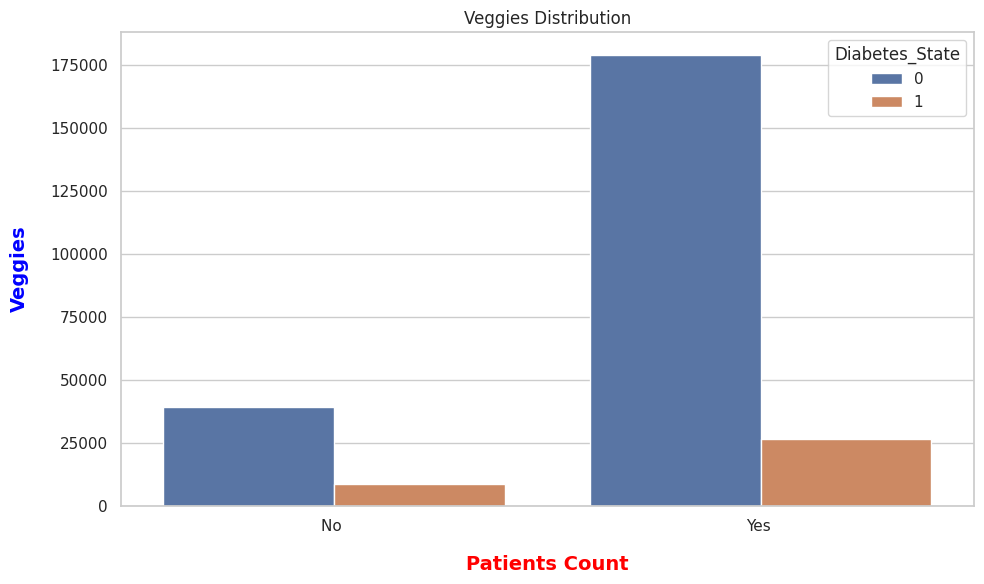

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Veggies', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
label = ["No ","Yes "]

sns.barplot(x='Veggies', y='count', hue='Diabetes_State', data=ploter)

plt.ylabel('Veggies', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Veggies Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=label)

plt.show()

Bar Plot with respect to have Heart Disease or healthy

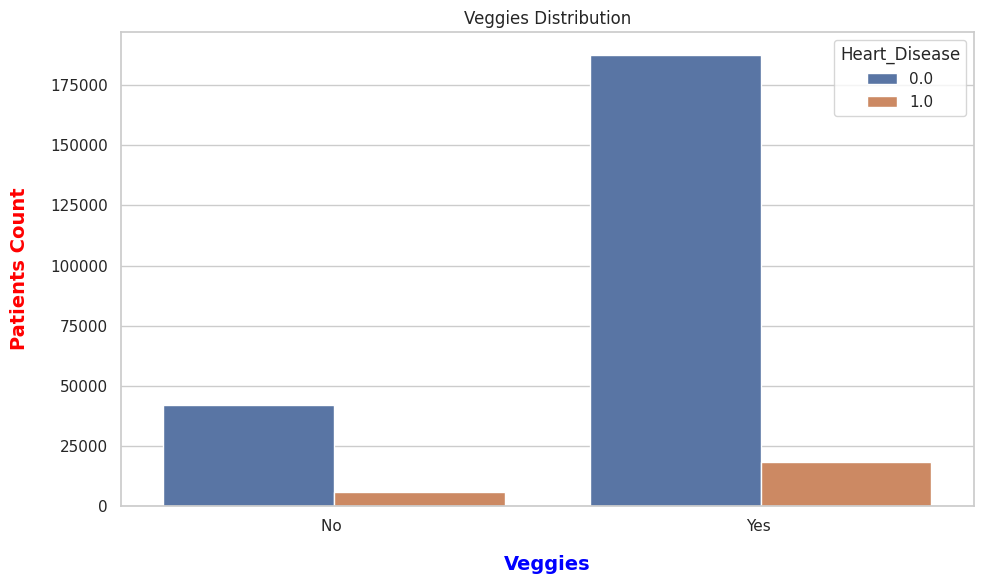

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['Veggies', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='Veggies', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('Veggies', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('Veggies Distribution')
plt.tight_layout()
label = ["No ","Yes "]
plt.xticks(ticks=[0, 1], labels=label)

plt.show()


##### HvyAlcoholConsump (Heavy Alcohol Consumption)
Whether the individual is a heavy drinker (defined as more than 14 drinks per week for men, more than 7 for women).

- 0 = no
- 1 = yes

Bar Chart Stroke

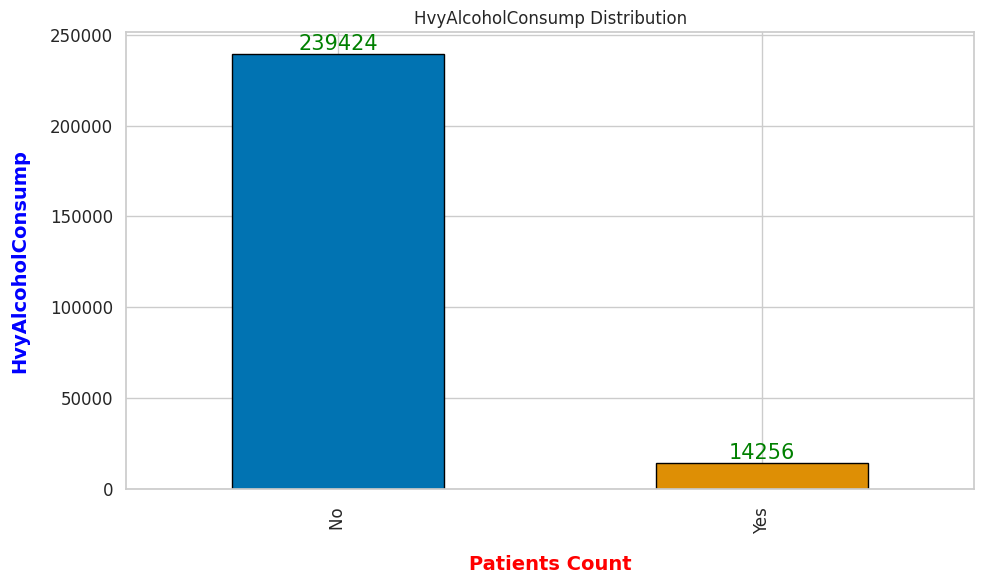

In [ ]:
fig = plt.figure(figsize=(10, 6))
label = ["No ","Yes "]
ax = Diabetic_DB['HvyAlcoholConsump'].value_counts().sort_index() .plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(label)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.ylabel('HvyAlcoholConsump', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('HvyAlcoholConsump Distribution')
plt.tight_layout()

plt.show()

Pie Chart Stroke

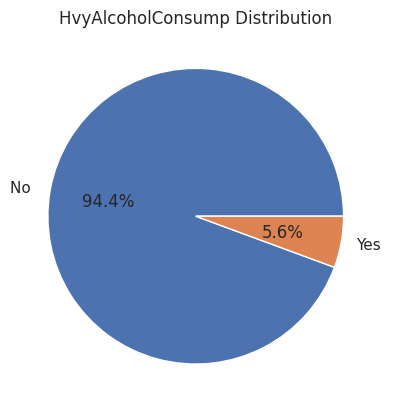

In [ ]:
df= Diabetic_DB['HvyAlcoholConsump'].value_counts().sort_index()
label = ["No ","Yes "]

plt.pie(df.values, labels = label, autopct='%1.1f%%')
plt.title("HvyAlcoholConsump Distribution")
plt.show()

Bar Plot with respect to Diabetic or healthy

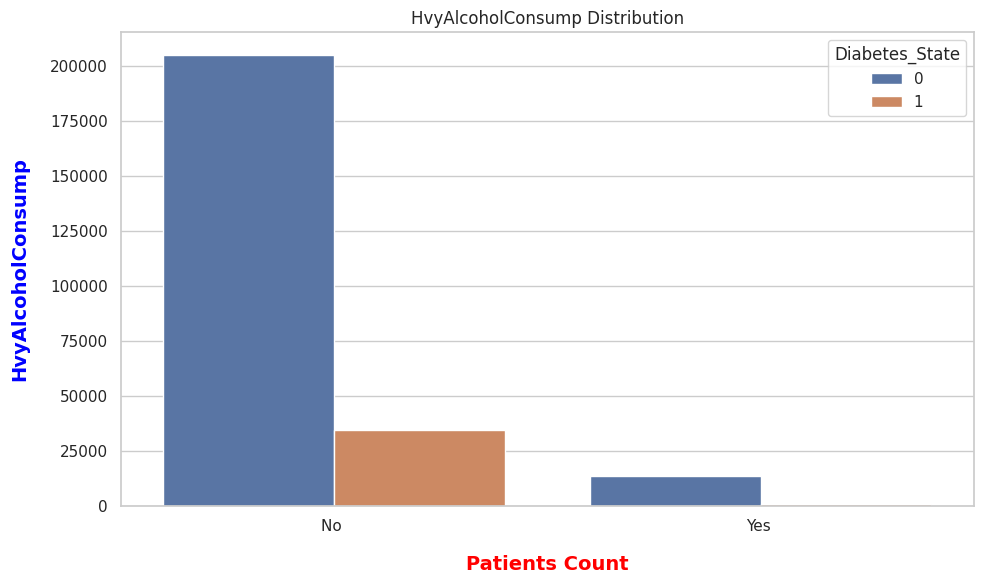

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['HvyAlcoholConsump', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
label = ["No ","Yes "]

sns.barplot(x='HvyAlcoholConsump', y='count', hue='Diabetes_State', data=ploter)

plt.ylabel('HvyAlcoholConsump', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('HvyAlcoholConsump Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=label)

plt.show()

Bar Plot with respect to have Heart Disease or healthy

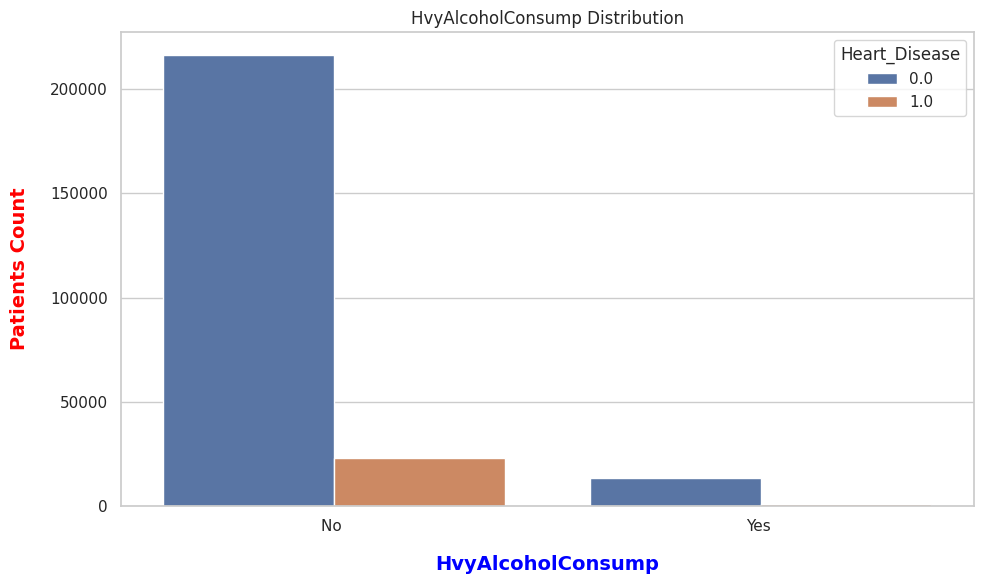

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['HvyAlcoholConsump', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='HvyAlcoholConsump', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('HvyAlcoholConsump', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('HvyAlcoholConsump Distribution')
plt.tight_layout()
label = ["No ","Yes "]
plt.xticks(ticks=[0, 1], labels=label)

plt.show()


##### MentHlth (Mental Health Days)
Now thinking about your mental health, which includes stress, depression, and problems with emotions, for how many days during the past 30 days was your mental health not good?

scale 1-30 days

In [ ]:
Diabetic_DB['MentHlth'].describe()

,MentHlth
count,"253,680.00"
mean,3.18
std,7.41
min,0.00
25%,0.00
50%,0.00
75%,2.00
max,30.00


Bar Chart BMI

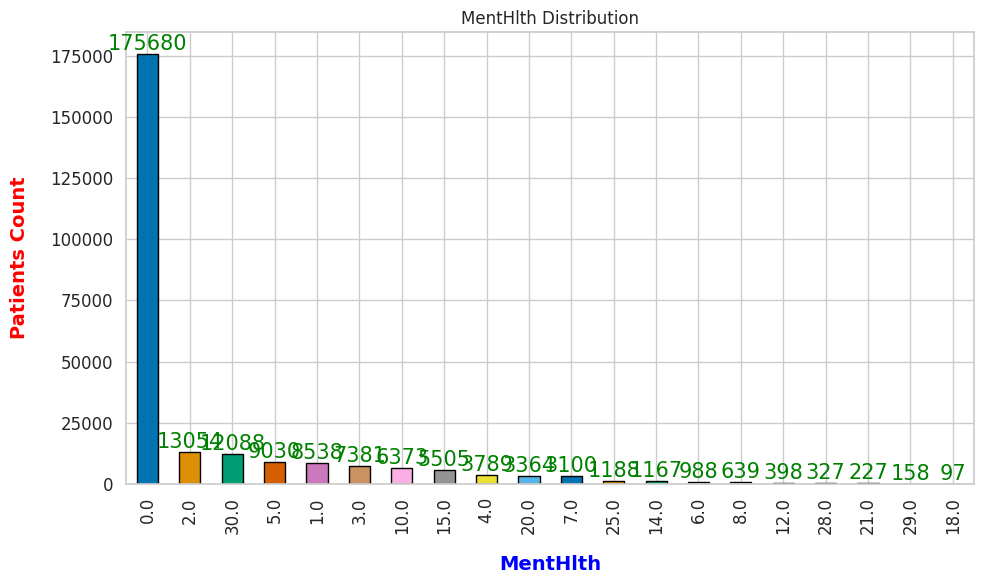

In [ ]:
fig = plt.figure(figsize=(10, 6))

ax = Diabetic_DB['MentHlth'].value_counts().head(20).plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(list(Diabetic_DB['MentHlth'].value_counts().head(20).index))
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.xlabel('MentHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('MentHlth Distribution')
plt.tight_layout()

plt.show()

Histogram

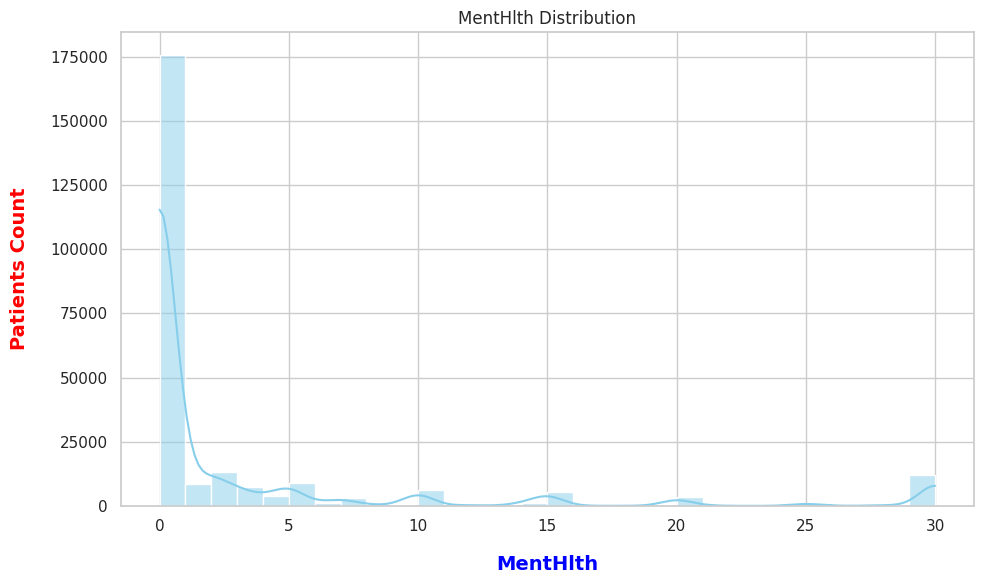

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(Diabetic_DB['MentHlth'], bins=30, kde=True, color='skyblue')
plt.xlabel('MentHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('MentHlth Distribution')
plt.tight_layout()
plt.show()


scatter plot

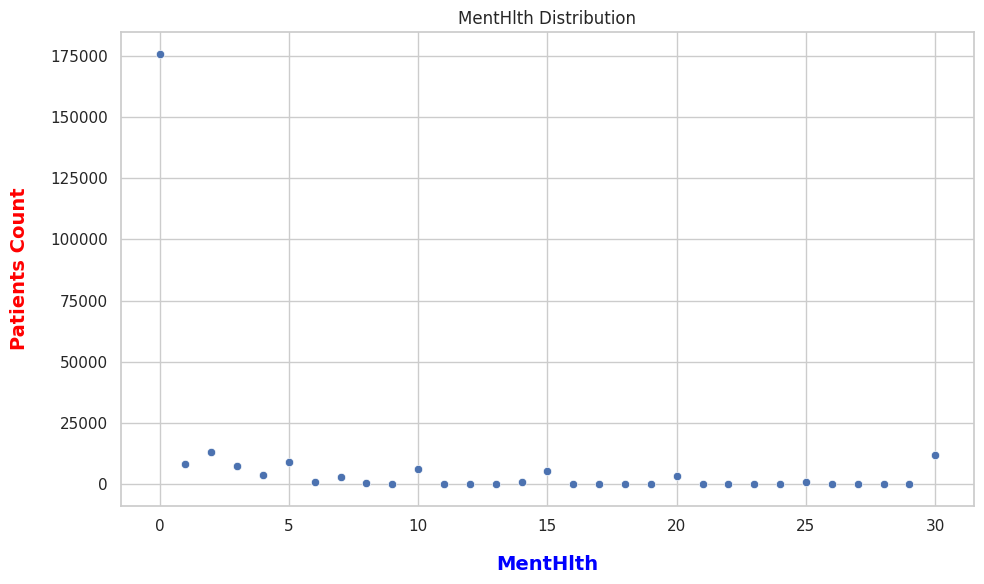

In [ ]:
plt.figure(figsize=(10, 6))
df= Diabetic_DB['MentHlth'].value_counts()
sns.scatterplot(df)
plt.xlabel('MentHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('MentHlth Distribution')
plt.tight_layout()
plt.show()

Pie Chart (Top 10)

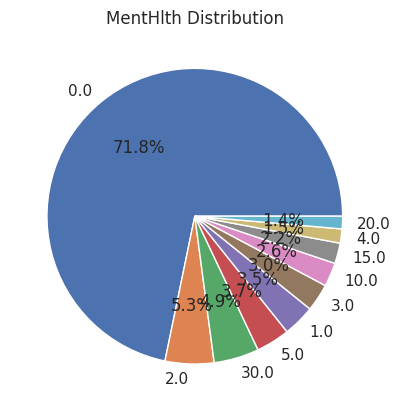

In [ ]:
df= Diabetic_DB['MentHlth'].value_counts().head(10)
plt.pie(df.values, labels = df.index, autopct='%1.1f%%')
plt.title("MentHlth Distribution")
plt.show()

Bar Plot with respect to Diabetic or healthy

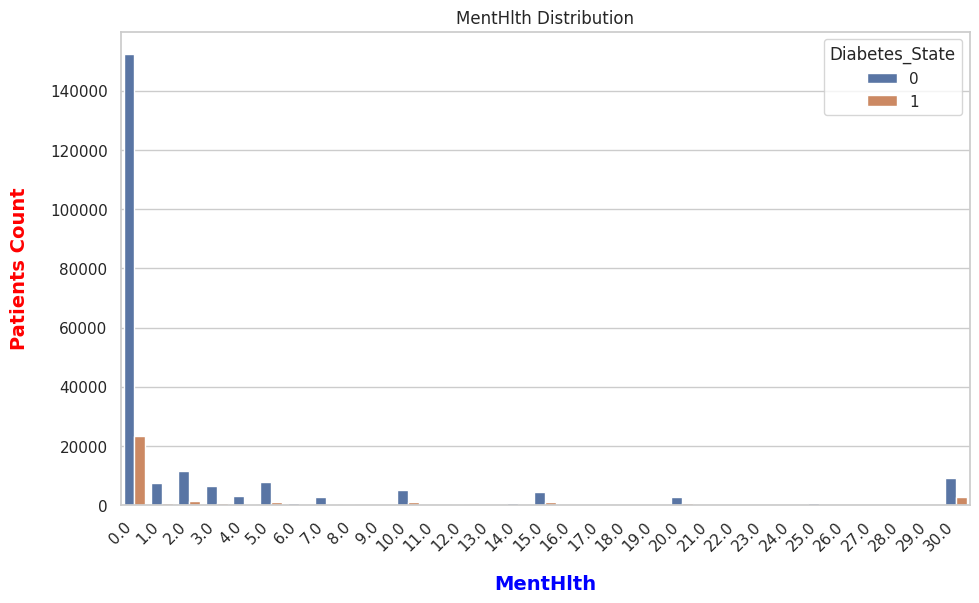

In [ ]:

fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['MentHlth', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')

sns.barplot(x='MentHlth', y='count', hue='Diabetes_State', data=ploter)

plt.xlabel('MentHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('MentHlth Distribution')
plt.tight_layout()
plt.xticks(rotation=45, ha='right')

plt.show()

Bar Plot with respect to have Heart Disease or healthy

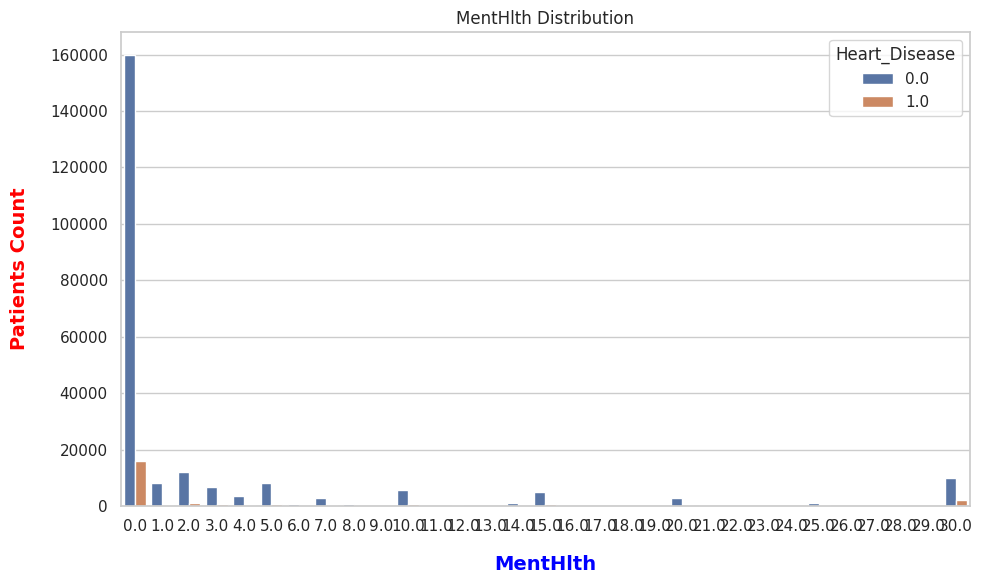

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['MentHlth', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='MentHlth', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('MentHlth', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('MentHlth Distribution')
plt.tight_layout()

plt.show()


##### DiffWalk (Difficulty Walking)
Indicates if the individual has difficulty walking or climbing stairs.
- 0 = no
- 1 = yes

Bar Chart Stroke

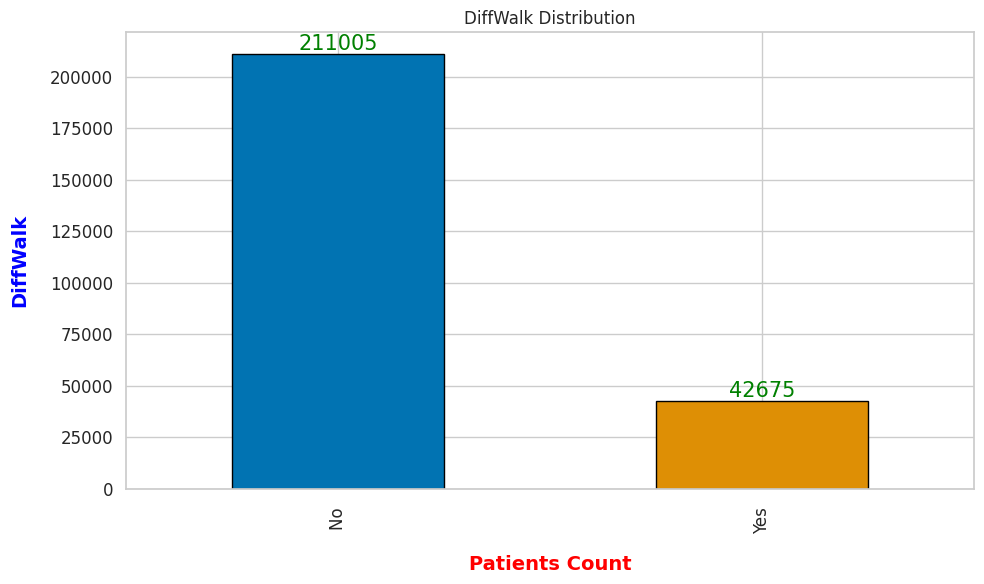

In [ ]:
fig = plt.figure(figsize=(10, 6))
label = ["No ","Yes "]
ax = Diabetic_DB['DiffWalk'].value_counts().sort_index() .plot(kind='bar', color=sns.color_palette('colorblind'), edgecolor='black')
ax.set_xticklabels(label)
for p in ax.patches:
    ax.annotate(int(p.get_height()), (p.get_x() +0.25, p.get_height() +0.5),
                ha='center', va='bottom', color='green', size=15)

    ax.tick_params(axis='both', labelsize=12)

plt.ylabel('DiffWalk', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('DiffWalk Distribution')
plt.tight_layout()

plt.show()

Pie Chart Stroke

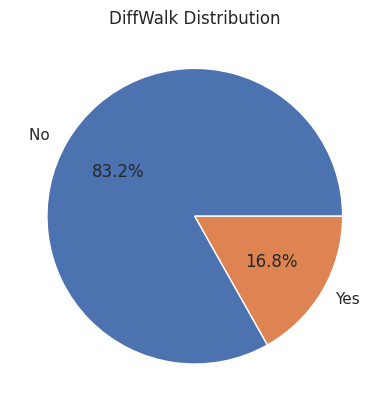

In [ ]:
df= Diabetic_DB['DiffWalk'].value_counts().sort_index()
label = ["No ","Yes "]

plt.pie(df.values, labels = label, autopct='%1.1f%%')
plt.title("DiffWalk Distribution")
plt.show()

Bar Plot with respect to Diabetic or healthy

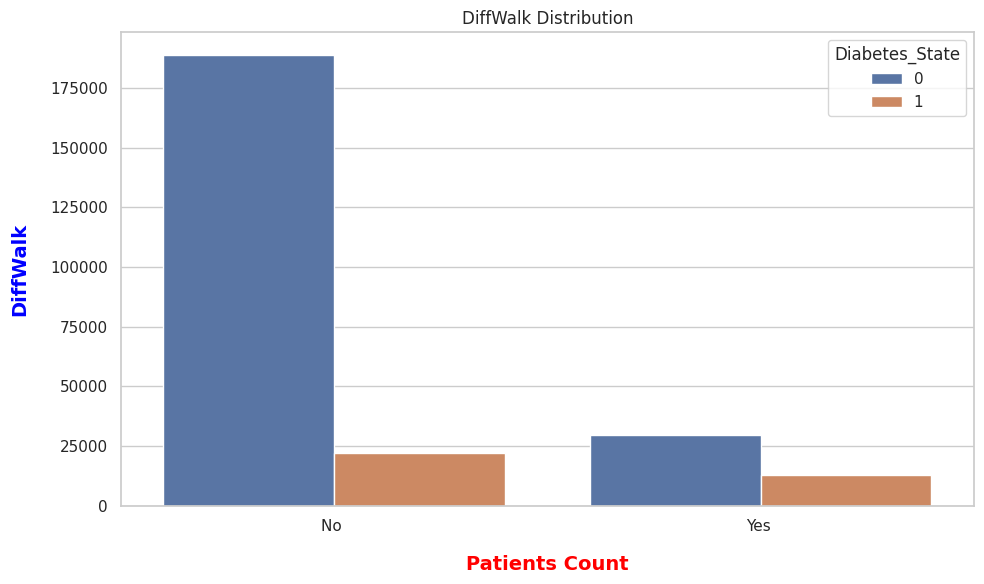

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['DiffWalk', 'Diabetes_State'])['Diabetes_State'].count().reset_index(name='count')
label = ["No ","Yes "]

sns.barplot(x='DiffWalk', y='count', hue='Diabetes_State', data=ploter)

plt.ylabel('DiffWalk', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.xlabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('DiffWalk Distribution')
plt.tight_layout()

plt.xticks(ticks=[0, 1], labels=label)

plt.show()

Bar Plot with respect to have Heart Disease or healthy

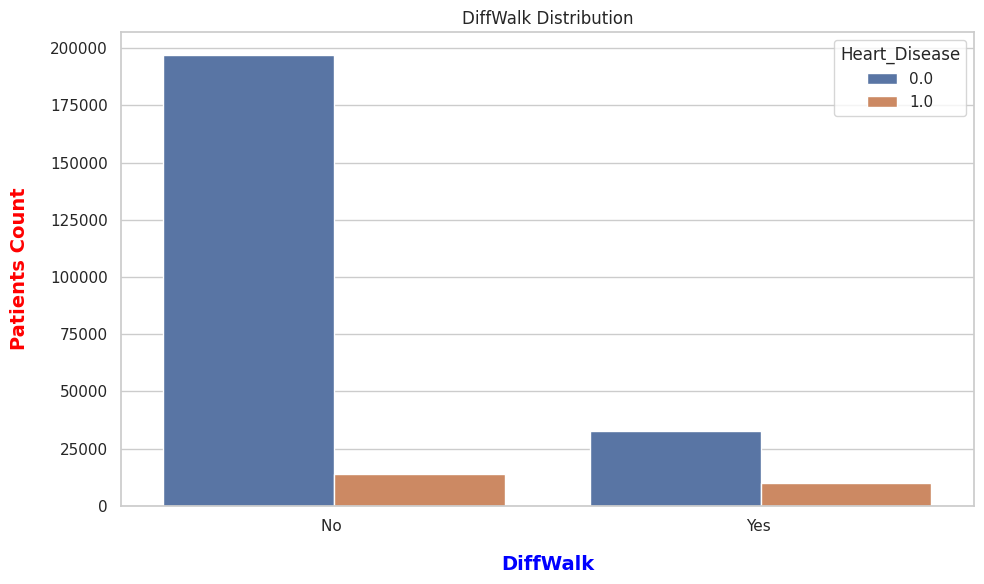

In [ ]:
fig = plt.figure(figsize=(10, 6))
ploter = Diabetic_DB.groupby(['DiffWalk', 'Heart_Disease'])['Heart_Disease'].count().reset_index(name='count')

sns.barplot(x='DiffWalk', y='count', hue='Heart_Disease', data=ploter)

plt.xlabel('DiffWalk', fontsize=14, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=14, weight='bold', labelpad=15, color='red')
plt.title('DiffWalk Distribution')
plt.tight_layout()
label = ["No ","Yes "]
plt.xticks(ticks=[0, 1], labels=label)

plt.show()


## Preprocessing and Feature Engineering
- Handle missing values.
- Remove duplicates and outliers.
- Apply transformations (scaling, encoding, feature interactions).

### Diabetic DB

#### Plotting for checking and handling outliers

##### import library

In [ ]:
# %% Importing required libraries
import pandas as pd  # For handling structured data
pd.options.display.float_format = '{:,.2f}'.format  # Format floating-point numbers

import numpy as np  # For numerical computations
import matplotlib.pyplot as plt  # For visualization
import seaborn as sns  # For advanced visualizations

from wordcloud import WordCloud, STOPWORDS  # For generating word clouds
from IPython.display import Image  # For displaying images

import warnings
warnings.filterwarnings("ignore")  # Ignore warnings for cleaner output


# Define a list of colors for visualizations
colors = ["#89CFF0", "#FF69B4", "#FFD700", "#7B68EE", "#FF4500",
          "#9370DB", "#32CD32", "#8A2BE2", "#FF6347", "#20B2AA",
          "#FF69B4", "#00CED1", "#FF7F50", "#7FFF00", "#DA70D6"]

In [ ]:
Diabetic_DB.columns

Index(['Diabetes_State', 'HB', 'Cholesterol', 'BMI', 'Heart_Disease',
       'PhysActivity', 'PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth',
       'CholCheck', 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump',
       'MentHlth', 'DiffWalk'],
      dtype='object')

##### Box plots to check outliers

In [ ]:
Diabetic_DB.columns

Index(['Diabetes_State', 'HB', 'Cholesterol', 'BMI', 'Heart_Disease',
       'PhysActivity', 'PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth',
       'CholCheck', 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump',
       'MentHlth', 'DiffWalk'],
      dtype='object')

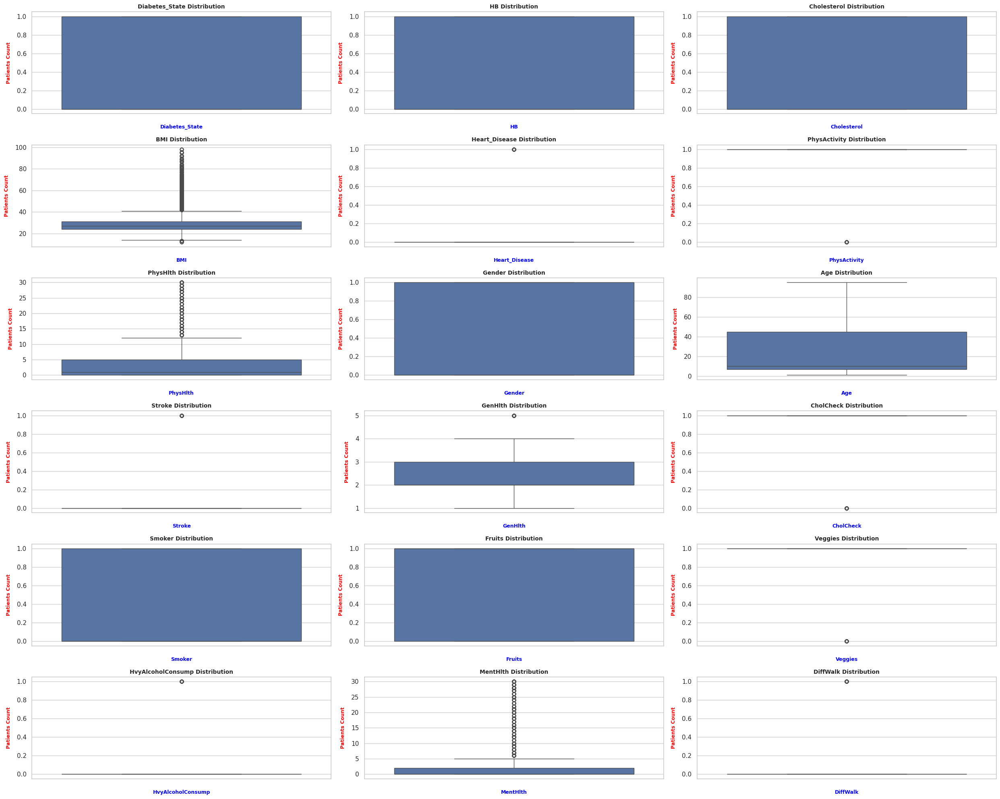

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the features to plot
features = ['Diabetes_State', 'HB', 'Cholesterol', 'BMI', 'Heart_Disease',
       'PhysActivity', 'PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth',
       'CholCheck', 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump',
       'MentHlth', 'DiffWalk']

# Set up the figure
fig, axes = plt.subplots(6, 3, figsize=(25, 20))
axes = axes.ravel()

# Create box plots
for i, feature in enumerate(features):
    sns.boxplot(y=Diabetic_DB[feature], ax=axes[i])
    axes[i].set_xlabel(feature, fontsize=9, weight='bold', labelpad=10, color='blue')
    axes[i].set_ylabel('Patients Count', fontsize=9, weight='bold', labelpad=10, color='red')
    axes[i].set_title(f'{feature} Distribution', fontsize=10, weight='bold')

# Adjust layout
plt.tight_layout()
plt.show()

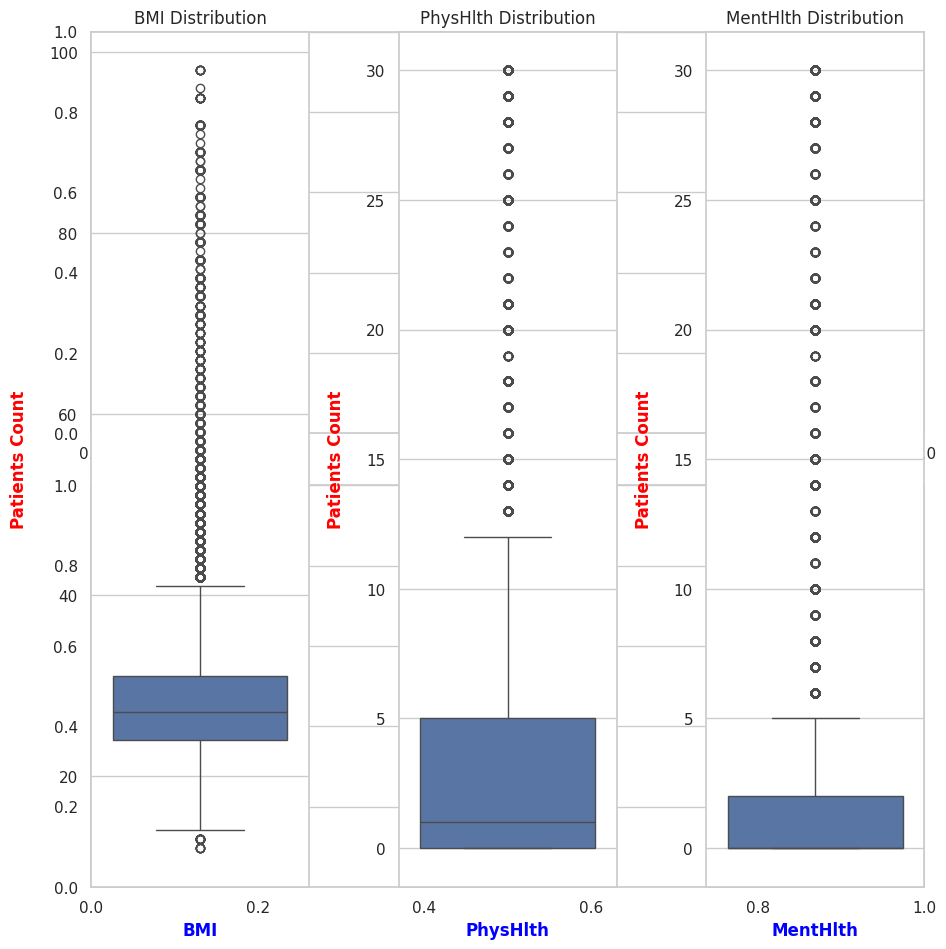

In [ ]:
fig = plt.subplots(2,1, figsize=(10, 10))


plt.subplot(1,3, 1)
sns.boxplot(Diabetic_DB['BMI'])
plt.xlabel('BMI', fontsize=12, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=12, weight='bold', labelpad=15, color='red')
plt.title('BMI Distribution')


plt.subplot(1,3, 2)

sns.boxplot(Diabetic_DB['PhysHlth'])
plt.xlabel('PhysHlth', fontsize=12, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=12, weight='bold', labelpad=15, color='red')
plt.title('PhysHlth Distribution')

plt.subplot(1,3, 3)

sns.boxplot(Diabetic_DB['MentHlth'])
plt.xlabel('MentHlth', fontsize=12, weight='bold', labelpad=15, color='blue')
plt.ylabel('Patients Count', fontsize=12, weight='bold', labelpad=15, color='red')
plt.title('MentHlth Distribution')


plt.tight_layout()
plt.show()

For previews box plots

We noticed the following that

1. The columns which as only two values (1,0) divided into 2 shapes
  - the plot is only filled as the cases nearly well destributed between these values so both values are in the box (example: Diabetes_State Distribution and HB Distribution)
  - the second style is most of cases in one value and a very little amount in the second one so the value with little amount of cases consider as outlier but this only two values so we can't neglect this value (example: Stroke Distribution and Heart_Disease Distribution)
2. The columns which is equaly distributed like Age and GenHlth but the GenHlth as the value in 2 and 3 has the most cases so they made 5 away which has the least amount of cases but this plot has only 5 values so we can consider this outlier in calculations
3. The columns BMI and PhysHlth and MentHlth are  most columns that have outliers and this due to:
 - These columns had a certain value that force box to it (in BMI= 27 and in PhysHlth = 0 and in MentHlth = 0) so they control the plot
 - These columns has a large range of values so the nearer to strong point the better
 - Point of fact that some outlier points maybe have man cases can't be neglcted

##### Box plot with respect to diabetes state

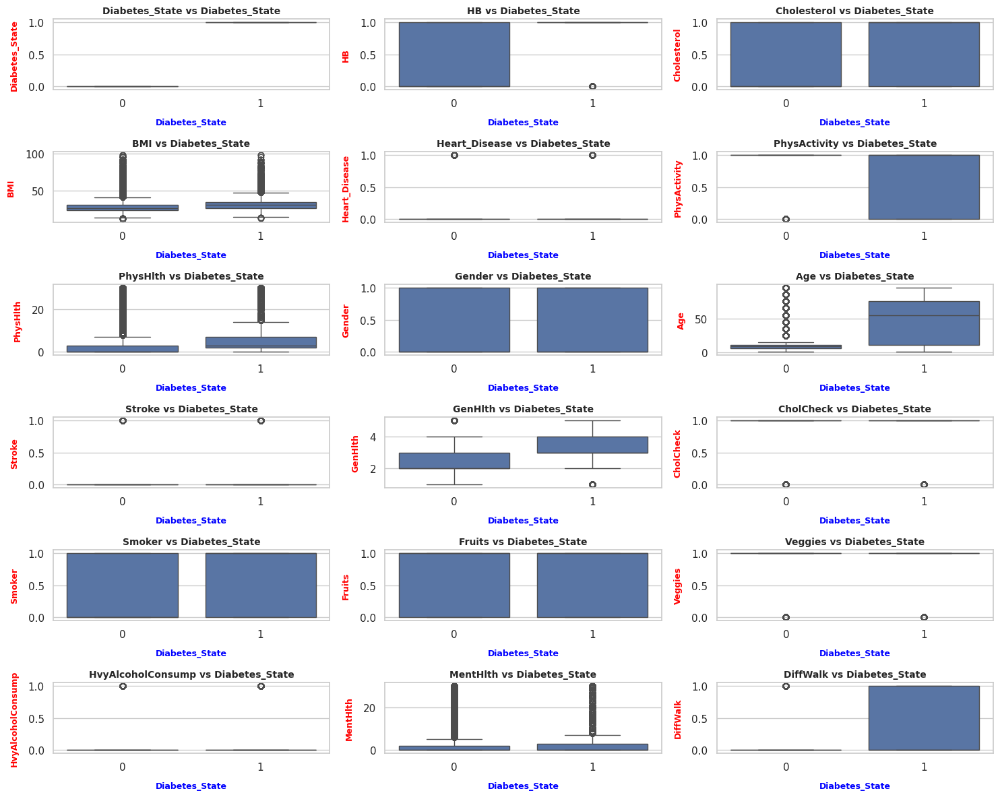

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the features to plot
features = ['Diabetes_State', 'HB', 'Cholesterol', 'BMI', 'Heart_Disease',
       'PhysActivity', 'PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth',
       'CholCheck', 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump',
       'MentHlth', 'DiffWalk']


# Set up the figure
fig, axes = plt.subplots(6, 3, figsize=(15, 12))
axes = axes.ravel()

# Create box plots with respect to HeartDisease
for i, feature in enumerate(features):
    sns.boxplot(x=Diabetic_DB['Diabetes_State'], y=Diabetic_DB[feature], ax=axes[i])
    axes[i].set_xlabel('Diabetes_State', fontsize=9, weight='bold', labelpad=10, color='blue')
    axes[i].set_ylabel(feature, fontsize=9, weight='bold', labelpad=10, color='red')
    axes[i].set_title(f'{feature} vs Diabetes_State', fontsize=10, weight='bold')

# Adjust layout
plt.tight_layout()
plt.show()

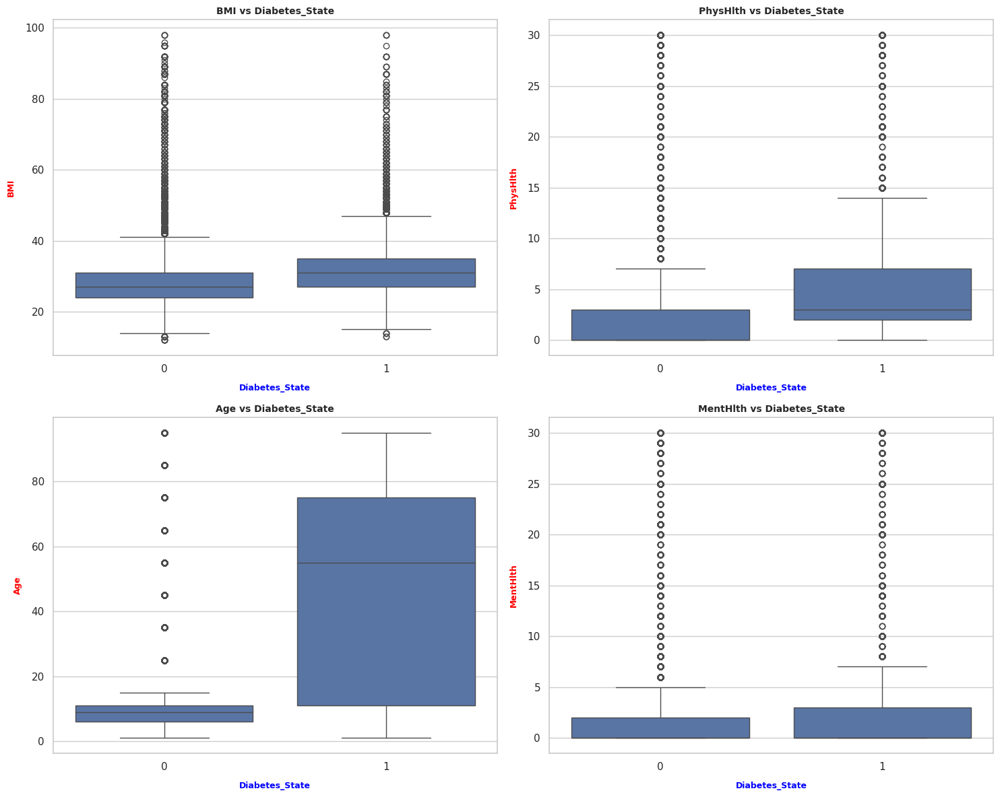

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the features to plot
features = ['BMI', 'PhysHlth', 'Age','MentHlth']


# Set up the figure
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.ravel()

# Create box plots with respect to HeartDisease
for i, feature in enumerate(features):
    sns.boxplot(x=Diabetic_DB['Diabetes_State'], y=Diabetic_DB[feature], ax=axes[i])
    axes[i].set_xlabel('Diabetes_State', fontsize=9, weight='bold', labelpad=10, color='blue')
    axes[i].set_ylabel(feature, fontsize=9, weight='bold', labelpad=10, color='red')
    axes[i].set_title(f'{feature} vs Diabetes_State', fontsize=10, weight='bold')

# Adjust layout
plt.tight_layout()
plt.show()

For previews box plots

We noticed the following that

1. The columns which as only two values (1,0) divided into 2 shapes
  - the plot is only filled as the cases nearly well destributed between these values so both values are in the box
  - the second style is most of cases in one value and a very little amount in the second one so the value with little amount of cases consider as outlier but this only two values so we can't neglect this value
2. The columns which is equaly distributed like Age Diabetic and GenHlth but the GenHlth as the value in 2 and 3 has the most cases so they made 5 away which has the least amount of cases but this plot has only 5 values so we can consider this outlier in calculations
3. The columns BMI (both cases) and PhysHlth (both cases) and Age Healthy are  most columns that have outliers and this due to:
 - These columns had a certain value that force box to it (for example in BMI= 27 and in PhysHlth = 0 and in Age = 10) so they control the plot
 - These columns has a large range of values so the nearer to strong point the better
 - Point of fact that some outlier points maybe have man cases can't be neglcted

---





##### Handle outliers


In [ ]:
# Function to count outliers using IQR and display their range
def count_outliers_iqr(data):
    outlier_info = {}
    for column in data.select_dtypes(include=['number']).columns:
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers_below = data[column][data[column] < lower_bound]
        outliers_above = data[column][data[column] > upper_bound]

        outlier_info[column] = {
            "count": len(outliers_below) + len(outliers_above),
            "min_outlier": outliers_below.min() if not outliers_below.empty else None,
            "max_outlier": outliers_above.max() if not outliers_above.empty else None,
            "outlier_range": (lower_bound, upper_bound)
        }

    return outlier_info

# Get outlier counts and range
outliers = count_outliers_iqr(Diabetic_DB)

# Display results
for col, info in outliers.items():
    print(f"{col}: {info['count']} outliers, Min Outlier: {info['min_outlier']}, Max Outlier: {info['max_outlier']}, Outlier Range: {info['outlier_range']}")

Diabetes_State: 0 outliers, Min Outlier: None, Max Outlier: None, Outlier Range: (np.float64(-1.5), np.float64(2.5))
HB: 0 outliers, Min Outlier: None, Max Outlier: None, Outlier Range: (np.float64(-1.5), np.float64(2.5))
Cholesterol: 0 outliers, Min Outlier: None, Max Outlier: None, Outlier Range: (np.float64(-1.5), np.float64(2.5))
BMI: 9847 outliers, Min Outlier: 12.0, Max Outlier: 98.0, Outlier Range: (np.float64(13.5), np.float64(41.5))
Heart_Disease: 23893 outliers, Min Outlier: None, Max Outlier: 1.0, Outlier Range: (np.float64(0.0), np.float64(0.0))
PhysActivity: 61760 outliers, Min Outlier: 0.0, Max Outlier: None, Outlier Range: (np.float64(1.0), np.float64(1.0))
PhysHlth: 35980 outliers, Min Outlier: None, Max Outlier: 30, Outlier Range: (np.float64(-7.5), np.float64(12.5))
Gender: 0 outliers, Min Outlier: None, Max Outlier: None, Outlier Range: (np.float64(-1.5), np.float64(2.5))
Age: 0 outliers, Min Outlier: None, Max Outlier: None, Outlier Range: (np.float64(-50.0), np.flo

In [ ]:
# Function to clip outliers for specified columns
def clip_outliers(data, columns):
    for column in columns:
        Q1 = data[column].quantile(0.25)
        Q3 = data[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        data[column] = data[column].clip(lower=lower_bound, upper=upper_bound)

    return data

# Columns to clip outliers
columns_to_clip = ["BMI", "PhysHlth",'MentHlth']
Diabetic_DB = clip_outliers(Diabetic_DB, columns_to_clip)


print("Outliers in BMI and PhysHlth columns have been clipped.")


Outliers in BMI and PhysHlth columns have been clipped.


#### Handling missing values

Checking the dataset before changes

In [ ]:
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355446 entries, 0 to 355445
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Diabetes_State     355446 non-null  int64  
 1   HB                 253680 non-null  float64
 2   Cholesterol        253680 non-null  float64
 3   BMI                253680 non-null  float64
 4   Heart_Disease      253680 non-null  float64
 5   PhysActivity       253680 non-null  float64
 6   PhysHlth           355446 non-null  float64
 7   Gender             355443 non-null  float64
 8   Age                355446 non-null  int64  
 9   Stroke             253680 non-null  float64
 10  GenHlth            253680 non-null  float64
 11  CholCheck          253680 non-null  float64
 12  Smoker             253680 non-null  float64
 13  Fruits             253680 non-null  float64
 14  Veggies            253680 non-null  float64
 15  HvyAlcoholConsump  253680 non-null  float64
 16  Me

Checking the amount of null cells in each columns

In [ ]:
Diabetic_DB.isnull().sum()

,0
Diabetes_State,0
HB,101766
Cholesterol,101766
BMI,101766
Heart_Disease,101766
PhysActivity,101766
PhysHlth,0
Gender,3
Age,0
Stroke,101766


showing the dataset description before filling the empty cells

In [ ]:
Diabetic_DB.describe()

,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,GenHlth,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk
count,"355,446.00","253,680.00","253,680.00","253,680.00","253,680.00","253,680.00","355,446.00","355,443.00","355,446.00","253,680.00","253,680.00","253,680.00","253,680.00","253,680.00","253,680.00","253,680.00","253,680.00","253,680.00"
mean,0.32,0.43,0.42,28.11,0.09,0.76,3.10,0.45,24.62,0.04,2.51,0.96,0.44,0.63,0.81,0.06,1.18,0.17
std,0.47,0.49,0.49,5.56,0.29,0.43,4.13,0.50,27.66,0.20,1.07,0.19,0.50,0.48,0.39,0.23,1.95,0.37
min,0.00,0.00,0.00,13.50,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,24.00,0.00,1.00,0.00,0.00,7.00,0.00,2.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,27.00,0.00,1.00,1.00,0.00,10.00,0.00,2.00,1.00,0.00,1.00,1.00,0.00,0.00,0.00
75%,1.00,1.00,1.00,31.00,0.00,1.00,5.00,1.00,45.00,0.00,3.00,1.00,1.00,1.00,1.00,0.00,2.00,0.00
max,1.00,1.00,1.00,41.50,1.00,1.00,12.50,1.00,95.00,1.00,5.00,1.00,1.00,1.00,1.00,1.00,5.00,1.00


Fill all empty cells with random integer values in the range max and min for its column then the filled dataset description

In [ ]:
import numpy as np
df = Diabetic_DB

# Set the random seed for reproducibility
np.random.seed(0)

# Fill empty cells with random integer values within column min-max range
for column in df.select_dtypes(include=[np.number]).columns:
    min_val = df[column].min()
    max_val = df[column].max()

    # Generate random values for missing data
    df[column] = df[column].apply(lambda x: np.random.randint(min_val, max_val + 1) if pd.isnull(x) else x)
df.describe()


,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,GenHlth,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk
count,"355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00","355,446.00"
mean,0.32,0.45,0.45,27.79,0.21,0.68,3.10,0.45,24.62,0.17,2.65,0.83,0.46,0.60,0.72,0.18,1.55,0.26
std,0.47,0.50,0.50,6.50,0.41,0.47,4.13,0.50,27.66,0.38,1.20,0.38,0.50,0.49,0.45,0.39,1.98,0.44
min,0.00,0.00,0.00,13.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,23.00,0.00,0.00,0.00,0.00,7.00,0.00,2.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,27.00,0.00,1.00,1.00,0.00,10.00,0.00,3.00,1.00,0.00,1.00,1.00,0.00,0.00,0.00
75%,1.00,1.00,1.00,32.00,0.00,1.00,5.00,1.00,45.00,0.00,3.00,1.00,1.00,1.00,1.00,0.00,3.00,1.00
max,1.00,1.00,1.00,41.50,1.00,1.00,12.50,1.00,95.00,1.00,5.00,1.00,1.00,1.00,1.00,1.00,5.00,1.00


checking the empty spaces after filling

In [ ]:
df.isnull().sum()

,0
Diabetes_State,0
HB,0
Cholesterol,0
BMI,0
Heart_Disease,0
PhysActivity,0
PhysHlth,0
Gender,0
Age,0
Stroke,0


showing the information after filling

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355446 entries, 0 to 355445
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Diabetes_State     355446 non-null  int64  
 1   HB                 355446 non-null  float64
 2   Cholesterol        355446 non-null  float64
 3   BMI                355446 non-null  float64
 4   Heart_Disease      355446 non-null  float64
 5   PhysActivity       355446 non-null  float64
 6   PhysHlth           355446 non-null  float64
 7   Gender             355446 non-null  float64
 8   Age                355446 non-null  int64  
 9   Stroke             355446 non-null  float64
 10  GenHlth            355446 non-null  float64
 11  CholCheck          355446 non-null  float64
 12  Smoker             355446 non-null  float64
 13  Fruits             355446 non-null  float64
 14  Veggies            355446 non-null  float64
 15  HvyAlcoholConsump  355446 non-null  float64
 16  Me

Turn all columns into integer type

In [ ]:
# Convert all numeric columns to integer type
for column in df.select_dtypes(include=[np.number]).columns:
    df[column] = df[column].astype(int)

put the filled table in the data type

In [ ]:
Diabetic_DB = df
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355446 entries, 0 to 355445
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype
---  ------             --------------   -----
 0   Diabetes_State     355446 non-null  int64
 1   HB                 355446 non-null  int64
 2   Cholesterol        355446 non-null  int64
 3   BMI                355446 non-null  int64
 4   Heart_Disease      355446 non-null  int64
 5   PhysActivity       355446 non-null  int64
 6   PhysHlth           355446 non-null  int64
 7   Gender             355446 non-null  int64
 8   Age                355446 non-null  int64
 9   Stroke             355446 non-null  int64
 10  GenHlth            355446 non-null  int64
 11  CholCheck          355446 non-null  int64
 12  Smoker             355446 non-null  int64
 13  Fruits             355446 non-null  int64
 14  Veggies            355446 non-null  int64
 15  HvyAlcoholConsump  355446 non-null  int64
 16  MentHlth           355446 non-null  in

####  Handling duplicates values

Checking the dataset before editing

In [ ]:
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 355446 entries, 0 to 355445
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype
---  ------             --------------   -----
 0   Diabetes_State     355446 non-null  int64
 1   HB                 355446 non-null  int64
 2   Cholesterol        355446 non-null  int64
 3   BMI                355446 non-null  int64
 4   Heart_Disease      355446 non-null  int64
 5   PhysActivity       355446 non-null  int64
 6   PhysHlth           355446 non-null  int64
 7   Gender             355446 non-null  int64
 8   Age                355446 non-null  int64
 9   Stroke             355446 non-null  int64
 10  GenHlth            355446 non-null  int64
 11  CholCheck          355446 non-null  int64
 12  Smoker             355446 non-null  int64
 13  Fruits             355446 non-null  int64
 14  Veggies            355446 non-null  int64
 15  HvyAlcoholConsump  355446 non-null  int64
 16  MentHlth           355446 non-null  in

Checking for duplicates


In [ ]:
print(Diabetic_DB.duplicated().value_counts())


False    286170
True      69276
Name: count, dtype: int64


Removing the duplicates


In [ ]:
Diabetic_DB = Diabetic_DB.drop_duplicates()
print(Diabetic_DB.duplicated().value_counts())

False    286170
Name: count, dtype: int64


## Data Exploration 2
- Summary statistics (mean, median, variance).
- Data distribution visualizations: histograms, box plots, scatter plots, Pie plots.

### Diabetic DB
This dataset consists of the following columns:

1.   **Diabetes_State** – Indicates whether the individual has diabetes (Yes/No).
1.   **HB** (High Blood pressure) – Measures the High Blood pressure level in the blood, which is important for diagnosing conditions.
1.   **Cholesterol** – Total cholesterol level in the blood, a key factor in heart disease risk.
1.   **BMI** (Body Mass Index) – A measure of body fat based on height and weight.
1.   **Heart_Disease** – Indicates whether the individual has a history of heart disease or heart attack.
1.   **PhysActivity** (Physical Activity) – Represents whether the person engages in physical exercise regularly.
1.   **PhysHlth** (Physical Health Days) – Number of days in the past month the individual reported poor physical health.
1.   **Gender** – The individual's gender (Male/Female).
1.   **Age** – Age group classification of the individual.
1.   **Stroke** – Indicates whether the individual has had a stroke.
1.   **GenHlth** (General Health Status) – Self-reported general health status (Excellent, Very Good, Good, Fair, or Poor).
1.   **CholCheck** (Cholesterol Check Status) – Whether the individual had their cholesterol checked in the past five years.
1.   **Smoker** – Whether the individual is a smoker or not.
1.   **Fruits** – Whether the individual consumes fruits regularly.
1.   **Veggies** – Whether the individual consumes vegetables regularly.
1.   **HvyAlcoholConsump** (Heavy Alcohol Consumption) – Whether the individual is a heavy drinker (defined as more than 14 drinks per week for men, more than 7 for women).
1.   **MentHlth** (Mental Health Days) – Number of days in the past month the individual reported poor mental health.
1.   **DiffWalk** (Difficulty Walking) – Indicates if the individual has difficulty walking or climbing stairs.



#### Dataset information

In [ ]:
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
Index: 286170 entries, 0 to 355445
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype
---  ------             --------------   -----
 0   Diabetes_State     286170 non-null  int64
 1   HB                 286170 non-null  int64
 2   Cholesterol        286170 non-null  int64
 3   BMI                286170 non-null  int64
 4   Heart_Disease      286170 non-null  int64
 5   PhysActivity       286170 non-null  int64
 6   PhysHlth           286170 non-null  int64
 7   Gender             286170 non-null  int64
 8   Age                286170 non-null  int64
 9   Stroke             286170 non-null  int64
 10  GenHlth            286170 non-null  int64
 11  CholCheck          286170 non-null  int64
 12  Smoker             286170 non-null  int64
 13  Fruits             286170 non-null  int64
 14  Veggies            286170 non-null  int64
 15  HvyAlcoholConsump  286170 non-null  int64
 16  MentHlth           286170 non-null  int64
 

In [ ]:
Diabetic_DB.describe()

,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,GenHlth,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk
count,"286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00","286,170.00"
mean,0.39,0.49,0.48,28.09,0.26,0.62,3.70,0.45,28.68,0.21,2.82,0.79,0.49,0.55,0.67,0.22,1.85,0.32
std,0.49,0.50,0.50,6.87,0.44,0.48,4.14,0.50,29.38,0.41,1.22,0.41,0.50,0.50,0.47,0.42,2.02,0.47
min,0.00,0.00,0.00,13.00,0.00,0.00,0.00,0.00,1.00,0.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.00,0.00,0.00,23.00,0.00,0.00,0.00,0.00,7.00,0.00,2.00,1.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,0.00,0.00,0.00,28.00,0.00,1.00,2.00,0.00,11.00,0.00,3.00,1.00,0.00,1.00,1.00,0.00,1.00,0.00
75%,1.00,1.00,1.00,33.00,1.00,1.00,6.00,1.00,55.00,0.00,4.00,1.00,1.00,1.00,1.00,0.00,4.00,1.00
max,1.00,1.00,1.00,41.00,1.00,1.00,12.00,1.00,95.00,1.00,5.00,1.00,1.00,1.00,1.00,1.00,5.00,1.00


In [ ]:
Diabetic_DB.columns

Index(['Diabetes_State', 'HB', 'Cholesterol', 'BMI', 'Heart_Disease',
       'PhysActivity', 'PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth',
       'CholCheck', 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump',
       'MentHlth', 'DiffWalk'],
      dtype='object')

#### Import libraries for plotting

In [ ]:
# %% Importing required libraries
import pandas as pd  # For handling structured data
pd.options.display.float_format = '{:,.2f}'.format  # Format floating-point numbers

import numpy as np  # For numerical computations
import matplotlib.pyplot as plt  # For visualization
import seaborn as sns  # For advanced visualizations

from wordcloud import WordCloud, STOPWORDS  # For generating word clouds
from IPython.display import Image  # For displaying images

import warnings
warnings.filterwarnings("ignore")  # Ignore warnings for cleaner output


# Define a list of colors for visualizations
colors = ["#89CFF0", "#FF69B4", "#FFD700", "#7B68EE", "#FF4500",
          "#9370DB", "#32CD32", "#8A2BE2", "#FF6347", "#20B2AA",
          "#FF69B4", "#00CED1", "#FF7F50", "#7FFF00", "#DA70D6"]

#### General plots


<Figure size 1500x1000 with 0 Axes>

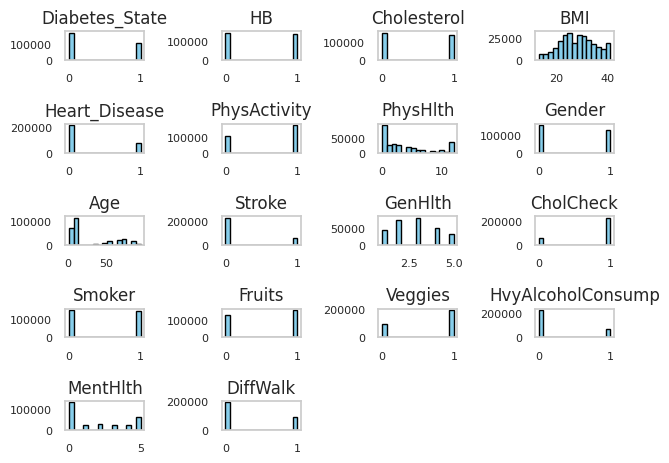

In [ ]:
# Plot histograms for all variables in the dataset
plt.figure(figsize=(15, 10))
Diabetic_DB.hist(bins=15, color='skyblue', edgecolor='black', linewidth=1.0, xlabelsize=8, ylabelsize=8, grid=False)
plt.tight_layout()
plt.show()


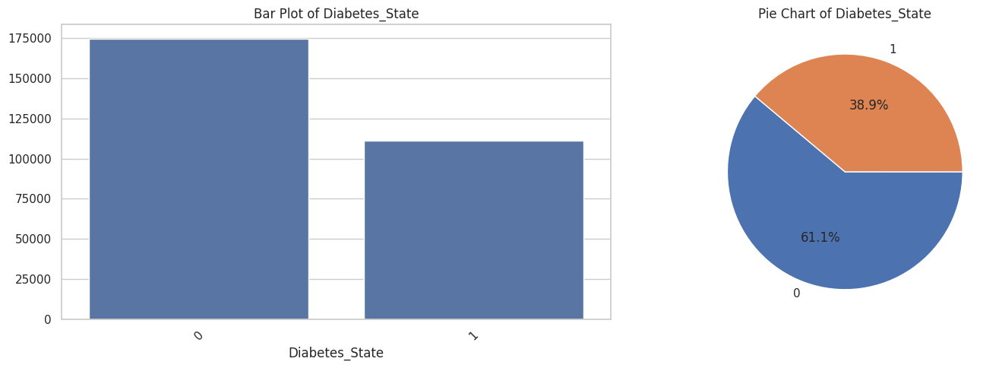

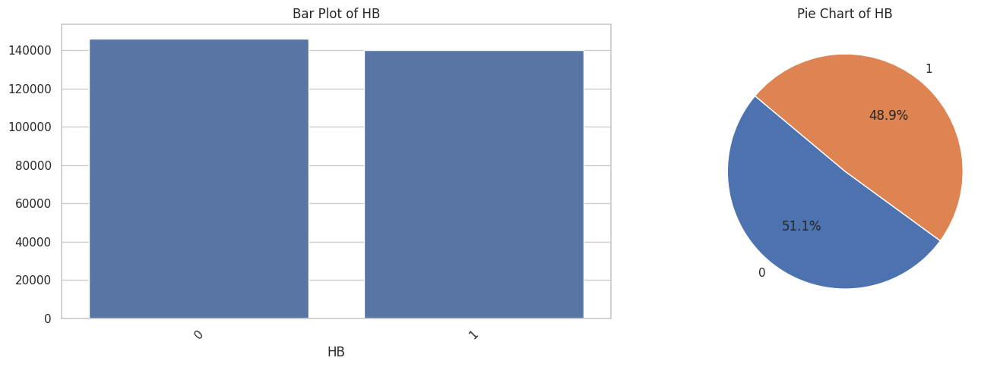

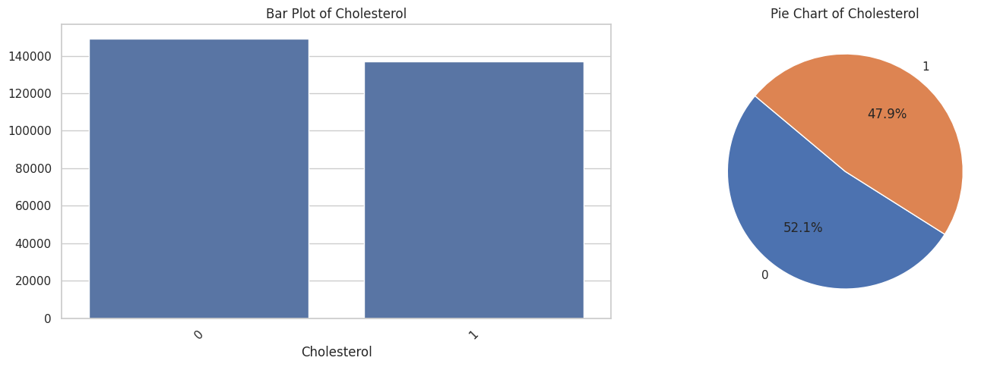

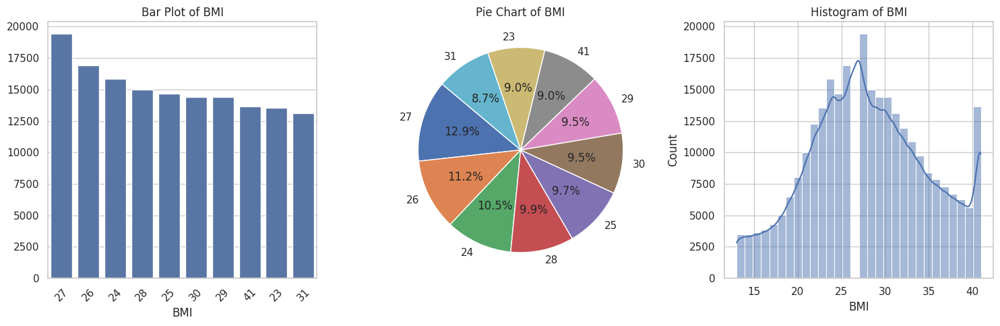

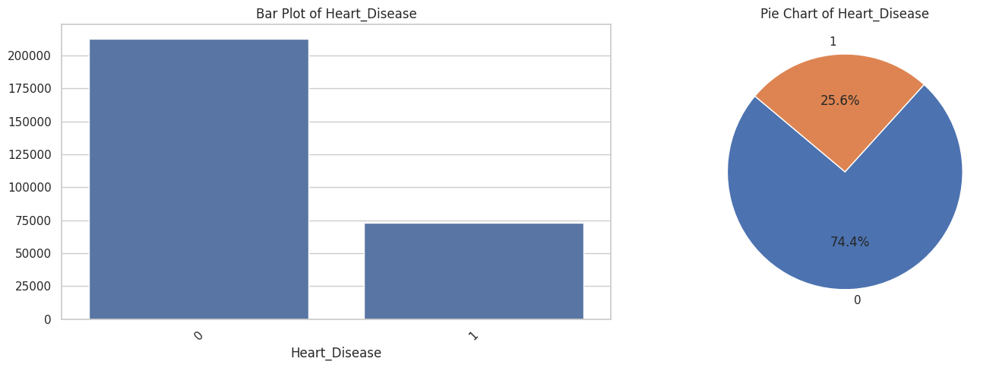

...

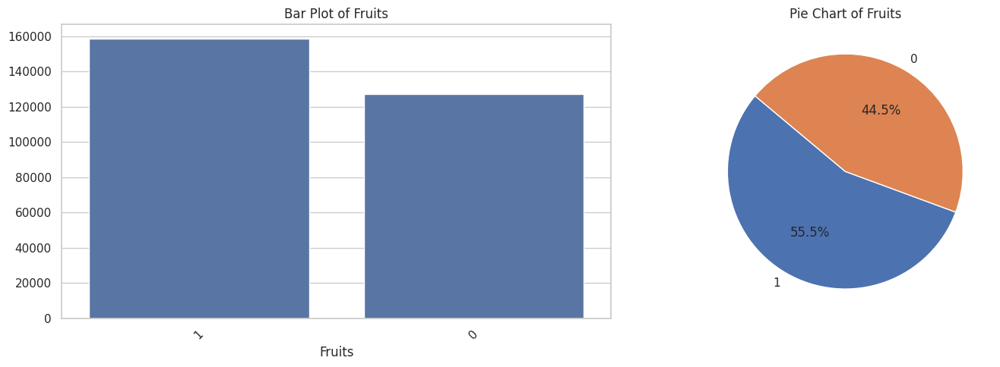

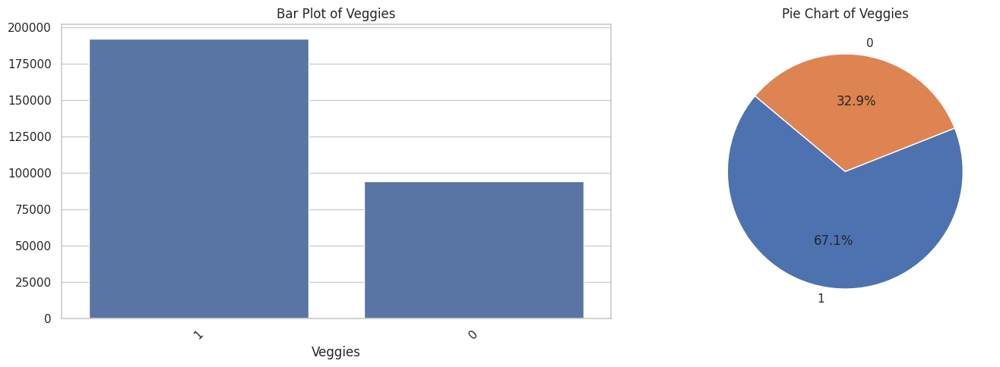

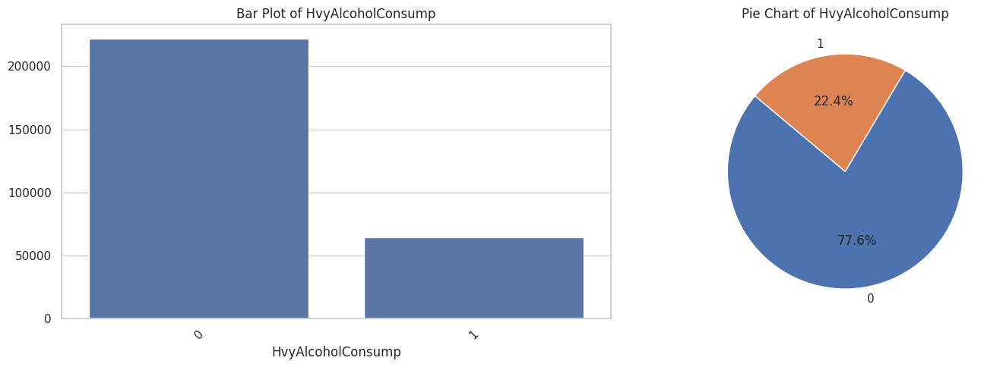

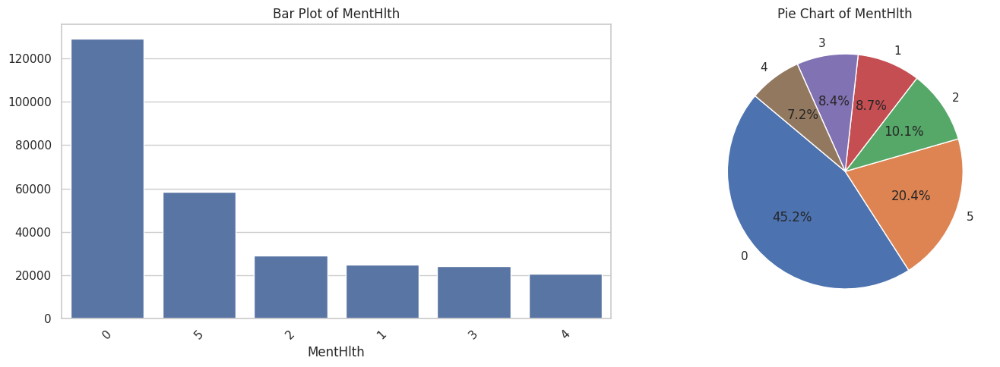

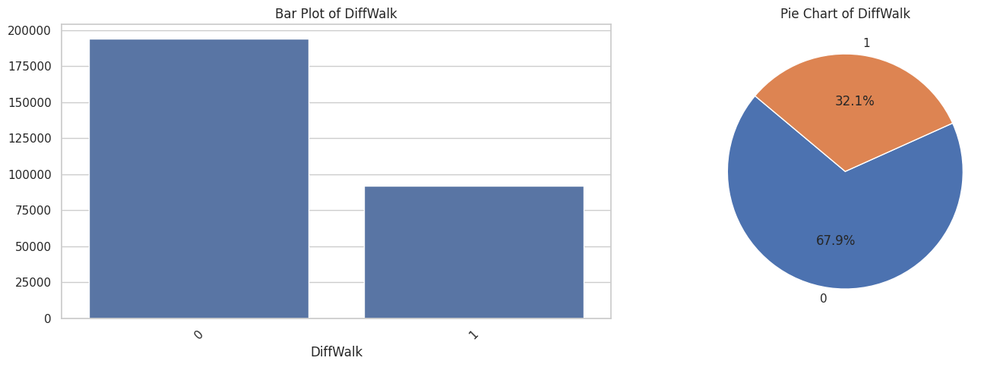

In [ ]:
# Updated function to handle indexing issue
def plot_column_fixed(data, column_name):
    value_counts = data[column_name].value_counts()
    num_unique = len(value_counts)

    fig, axes = plt.subplots(1, 3 if num_unique > 10 else 2, figsize=(15, 5))

    # Bar Plot
    sns.barplot(x=value_counts.index[:10].astype(str), y=value_counts.values[:10], ax=axes[0])
    axes[0].set_title(f"Bar Plot of {column_name}")
    axes[0].tick_params(axis='x', rotation=45)


    # Pie Chart
    axes[1].pie(value_counts.values[:10], labels=value_counts.index[:10].astype(str), autopct='%1.1f%%', startangle=140)
    axes[1].set_title(f"Pie Chart of {column_name}")

    # Histogram for full column if unique values > 10
    if num_unique > 10:
        sns.histplot(data[column_name], bins=30, kde=True, ax=axes[2])
        axes[2].set_title(f"Histogram of {column_name}")

    plt.tight_layout()
    plt.show()

# Plot each column
for col in Diabetic_DB.columns:
    plot_column_fixed(Diabetic_DB, col)



#####  General plots with comments


###### General plotting

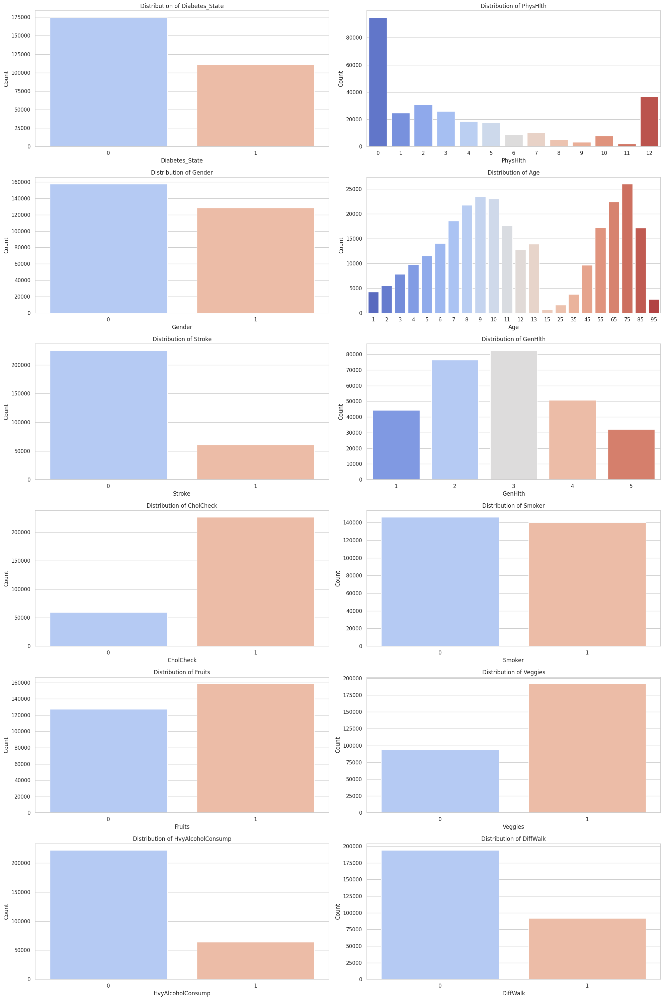

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for better visualization
sns.set_style("whitegrid")

# Separate categorical and numerical columns
categorical_columns = [
    "Diabetes_State", "PhysHlth", "Gender", "Age", "Stroke", "GenHlth",
    "CholCheck", "Smoker", "Fruits", "Veggies", "HvyAlcoholConsump", "DiffWalk"
]
numerical_columns = ["HB", "Cholesterol", "BMI", "Heart_Disease", "PhysActivity", "MentHlth"]

# Create bar plots for categorical columns
plt.figure(figsize=(20, 30))
for i, col in enumerate(categorical_columns):
    plt.subplot(6, 2, i + 1)
    sns.countplot(data=Diabetic_DB, x=col, palette="coolwarm")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
plt.tight_layout()
plt.show()




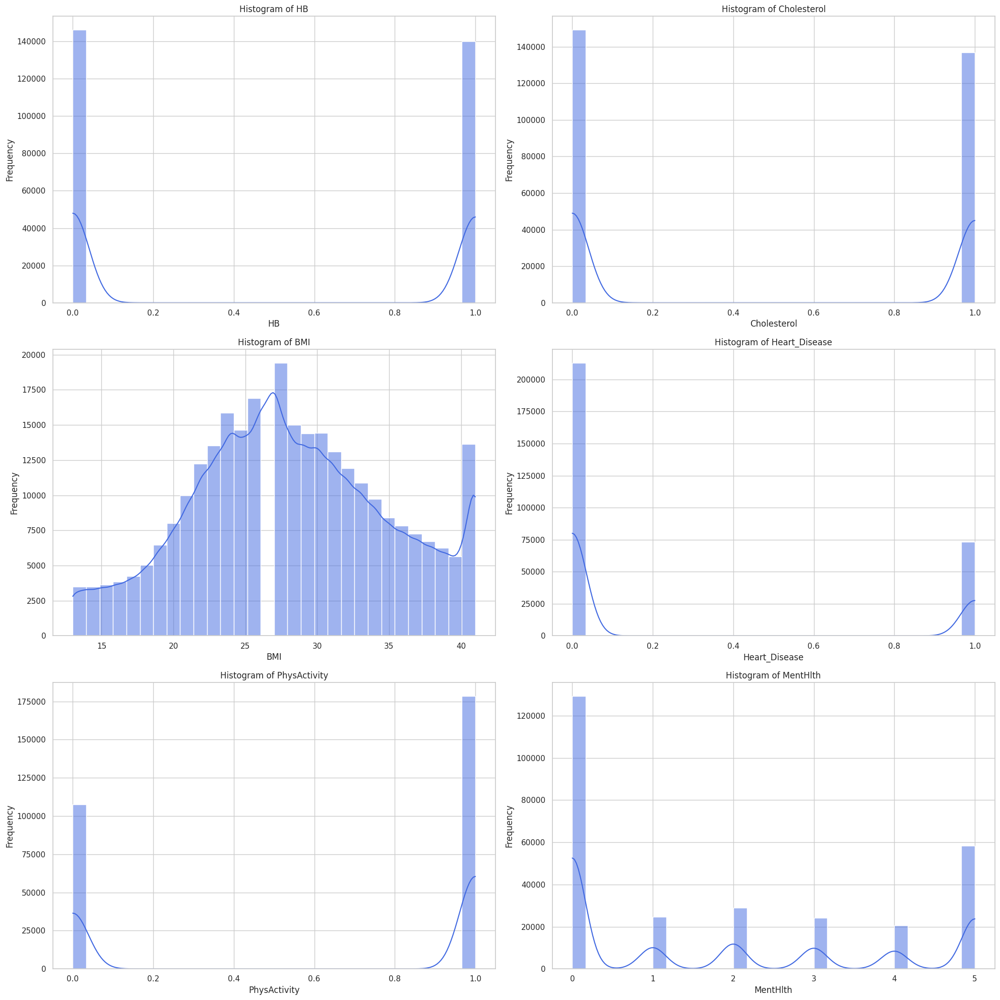

In [ ]:
# Create histograms for continuous columns
plt.figure(figsize=(20, 20))
for i, col in enumerate(numerical_columns):
    plt.subplot(3, 2, i + 1)
    sns.histplot(Diabetic_DB[col].dropna(), bins=30, kde=True, color="royalblue")
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

###### Colored by HeartDisease column

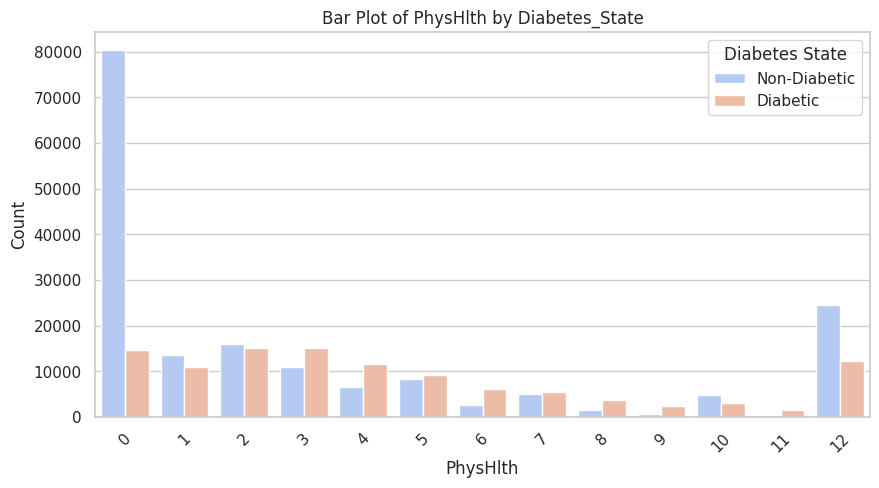

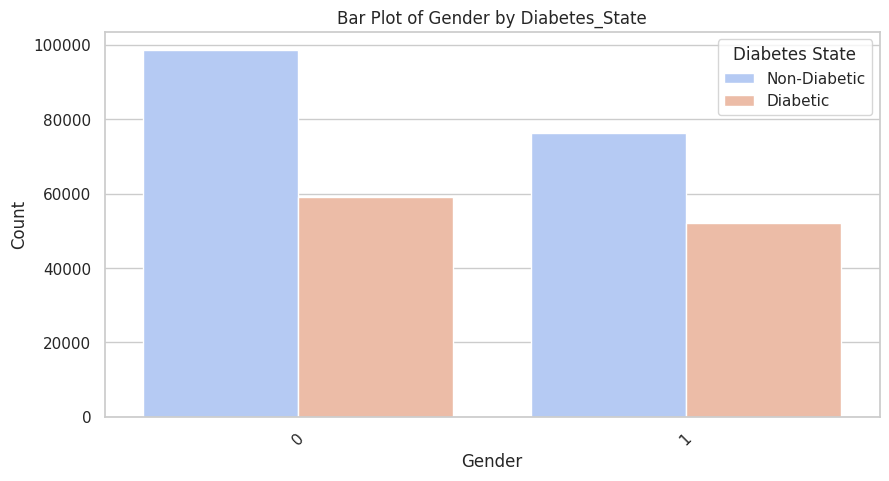

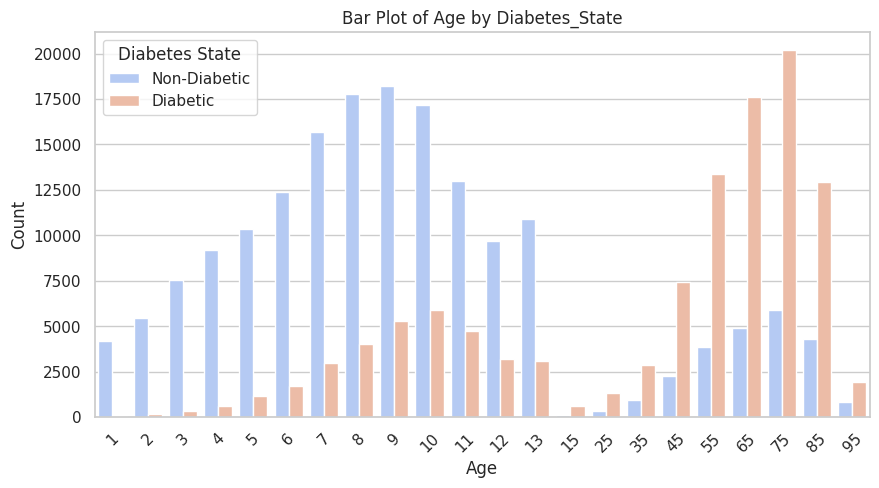

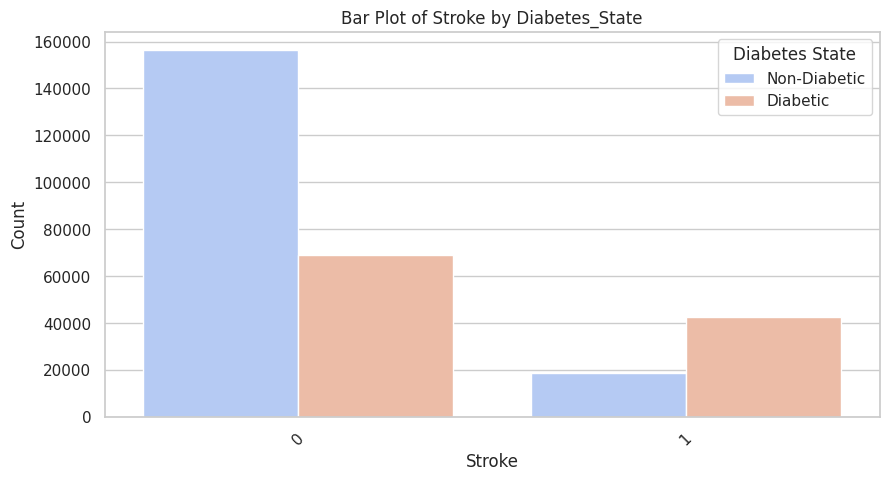

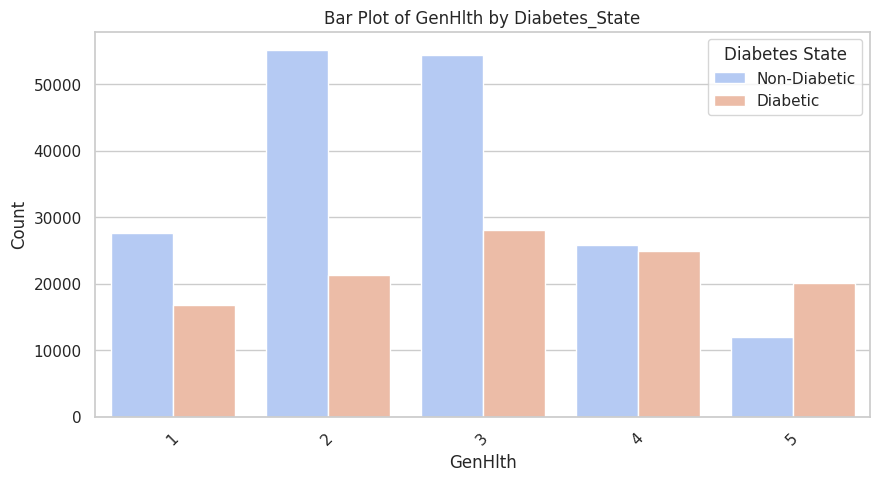

...

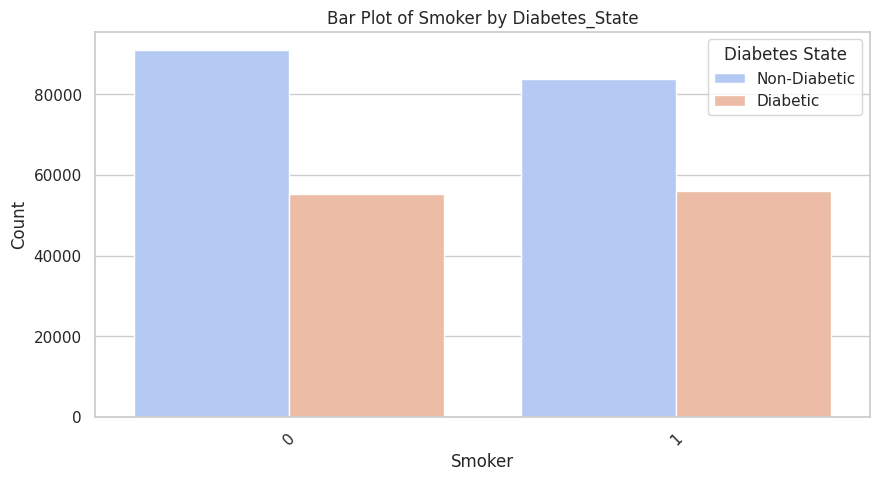

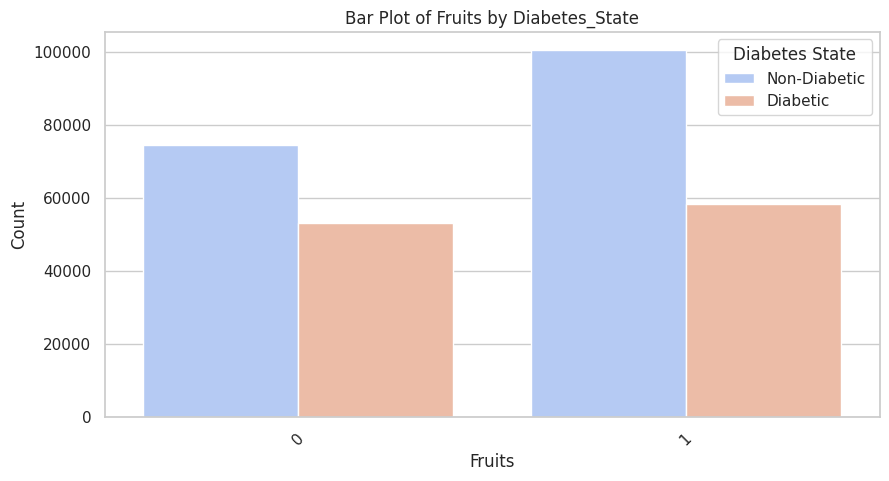

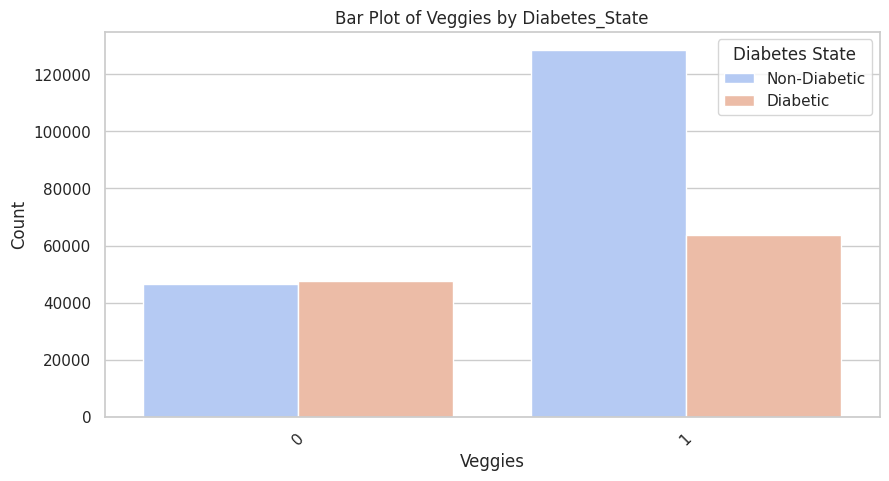

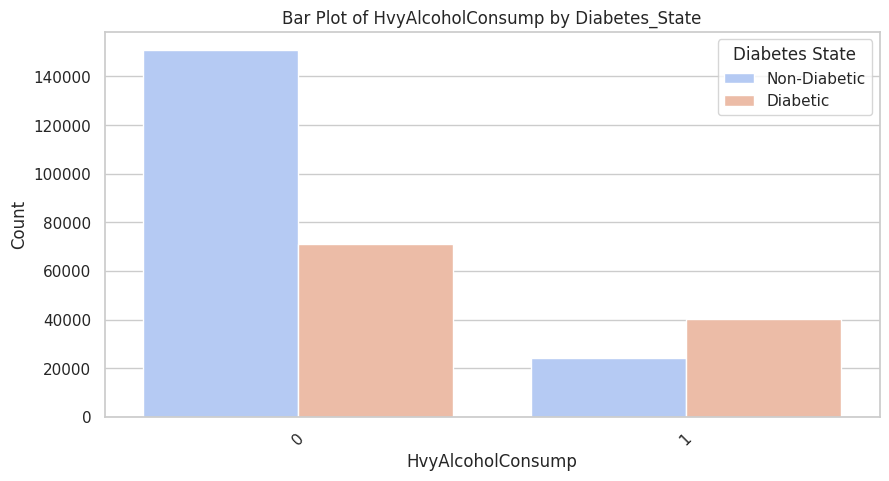

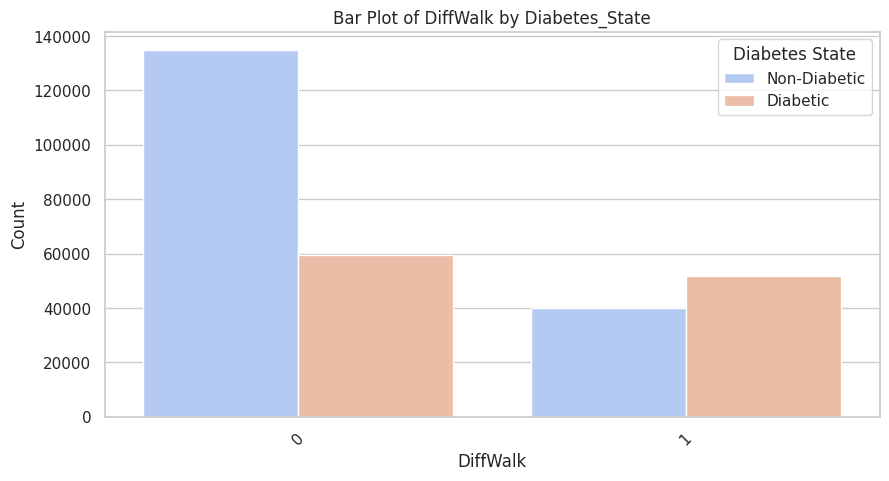

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style for plots
sns.set(style="whitegrid")

# Define discrete and continuous columns
discrete_cols = ['PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth', 'CholCheck',
                 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'DiffWalk']

continuous_cols = ['HB', 'Cholesterol', 'BMI', 'Heart_Disease', 'PhysActivity', 'MentHlth']

# Create bar plots for discrete columns
for col in discrete_cols:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=Diabetic_DB, x=col, hue="Diabetes_State", palette="coolwarm")
    plt.title(f"Bar Plot of {col} by Diabetes_State")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.legend(title="Diabetes State", labels=["Non-Diabetic", "Diabetic"])
    plt.xticks(rotation=45)
    plt.show()



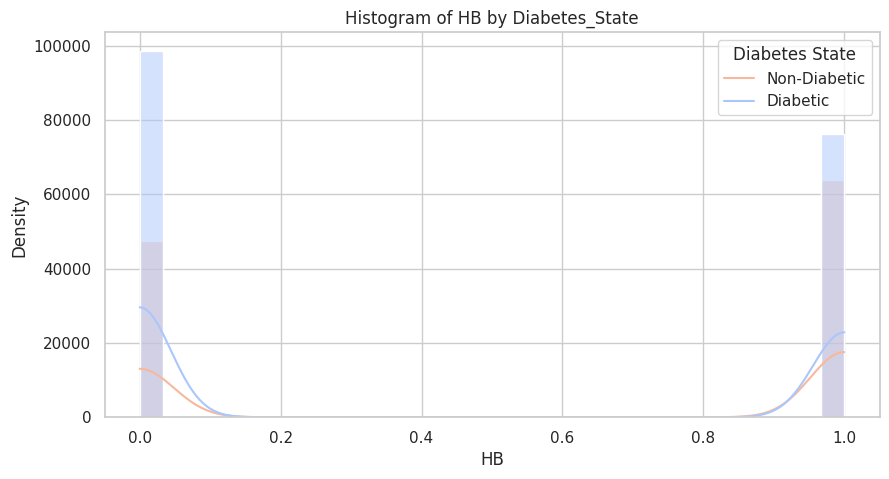

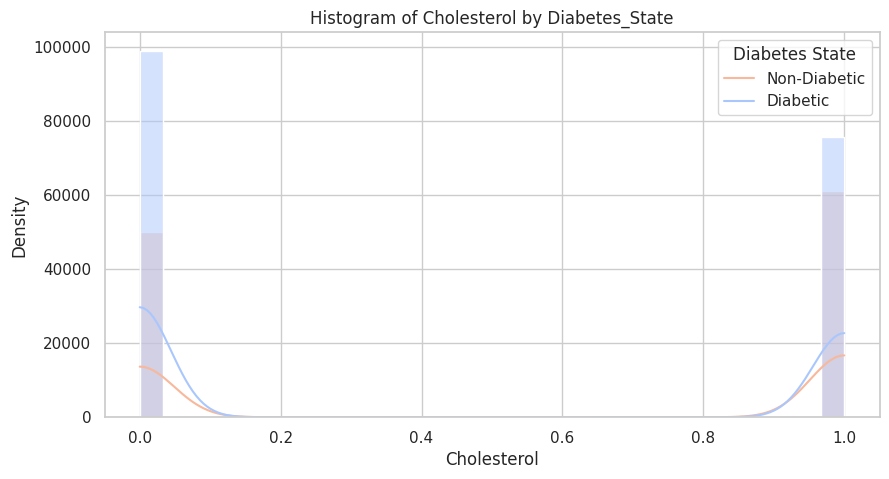

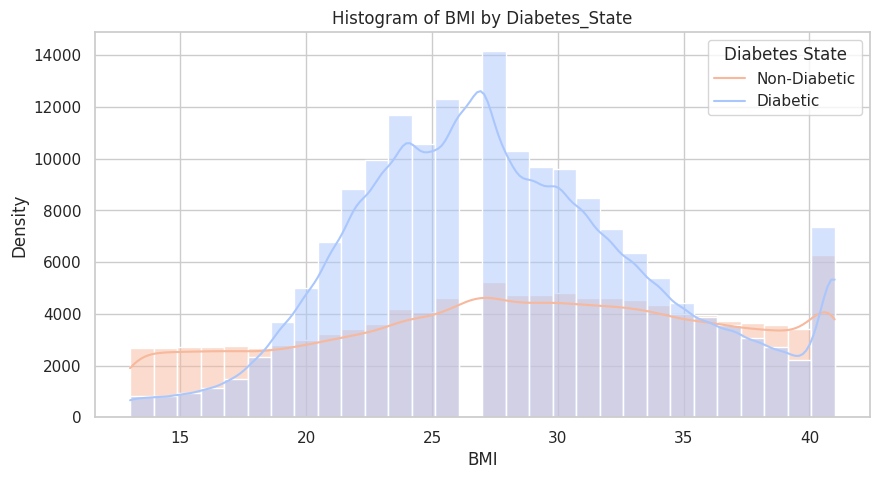

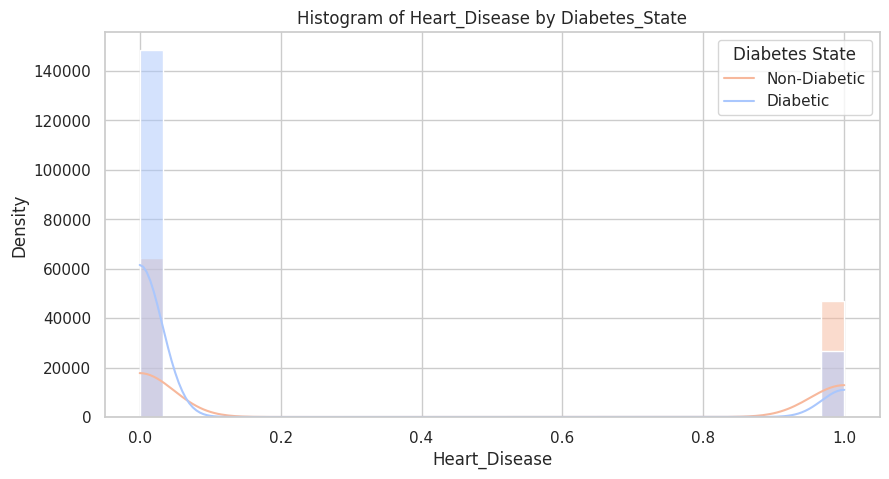

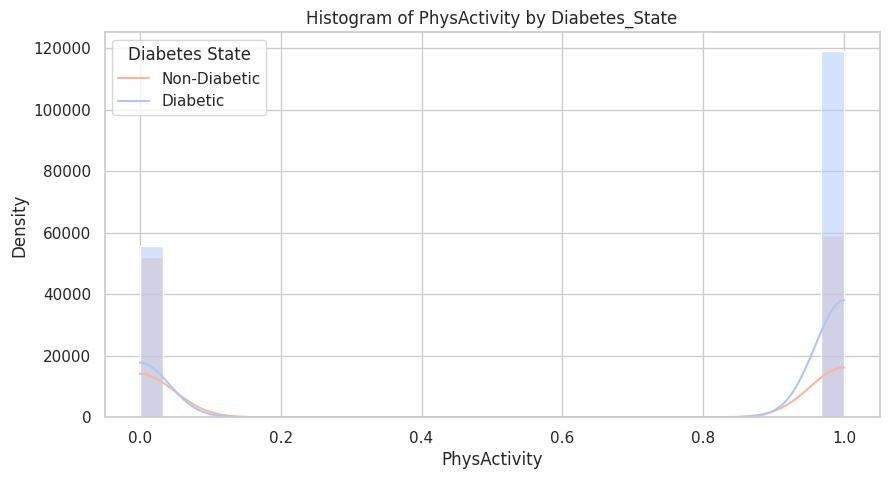

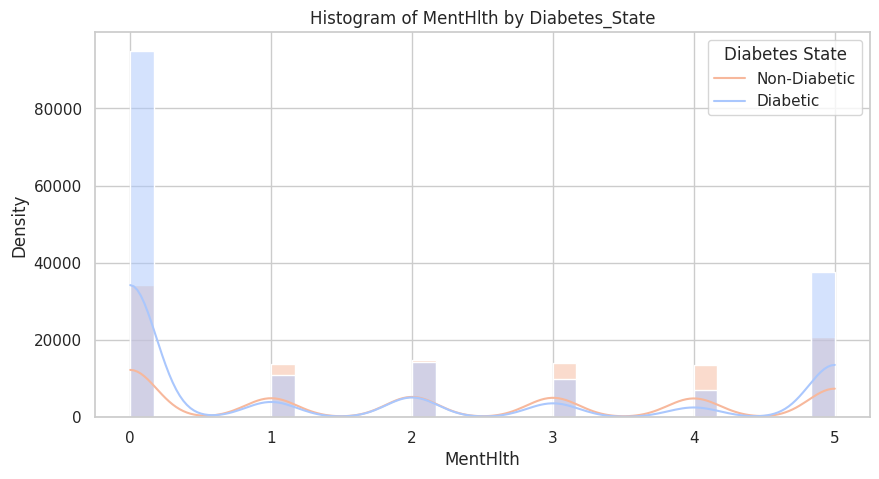

In [ ]:
# Create histograms for continuous columns
for col in continuous_cols:
    plt.figure(figsize=(10, 5))
    sns.histplot(data=Diabetic_DB, x=col, hue="Diabetes_State", kde=True, bins=30, palette="coolwarm")
    plt.title(f"Histogram of {col} by Diabetes_State")
    plt.xlabel(col)
    plt.ylabel("Density")
    plt.legend(title="Diabetes State", labels=["Non-Diabetic", "Diabetic"])
    plt.show()


##### Box plots to check outliers

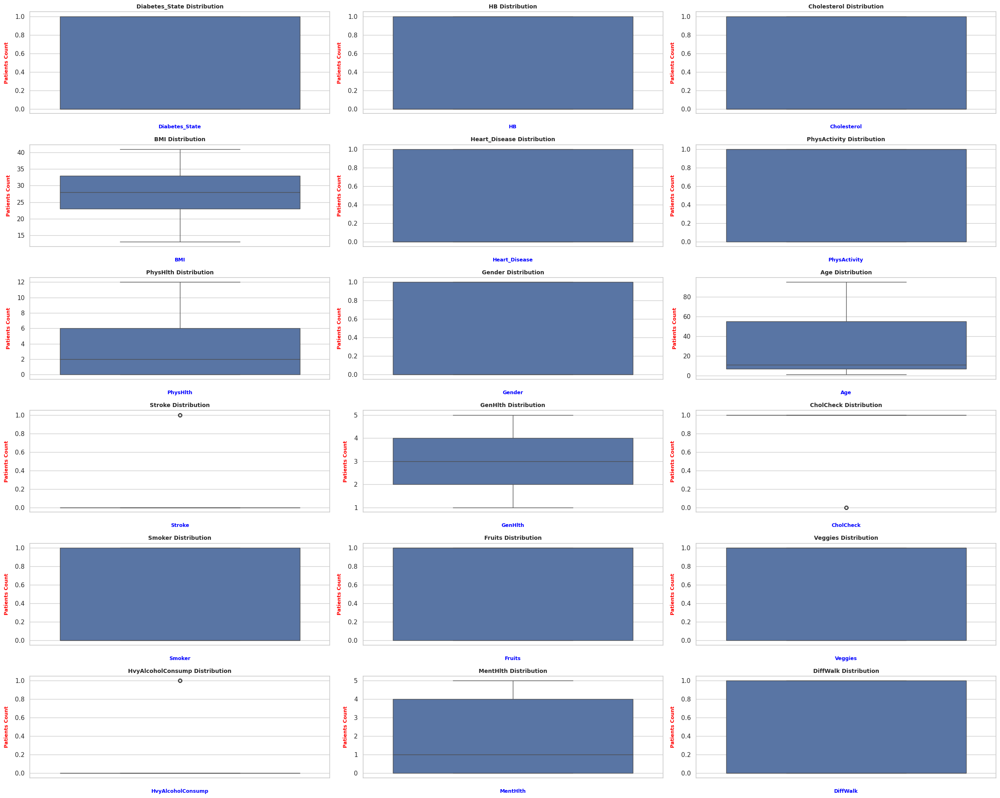

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the features to plot
features = ['Diabetes_State', 'HB', 'Cholesterol', 'BMI', 'Heart_Disease',
       'PhysActivity', 'PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth',
       'CholCheck', 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump',
       'MentHlth', 'DiffWalk']

# Set up the figure
fig, axes = plt.subplots(6, 3, figsize=(25, 20))
axes = axes.ravel()

# Create box plots
for i, feature in enumerate(features):
    sns.boxplot(y=Diabetic_DB[feature], ax=axes[i])
    axes[i].set_xlabel(feature, fontsize=9, weight='bold', labelpad=10, color='blue')
    axes[i].set_ylabel('Patients Count', fontsize=9, weight='bold', labelpad=10, color='red')
    axes[i].set_title(f'{feature} Distribution', fontsize=10, weight='bold')

# Adjust layout
plt.tight_layout()
plt.show()

##### Box plot with respect to diabetes state

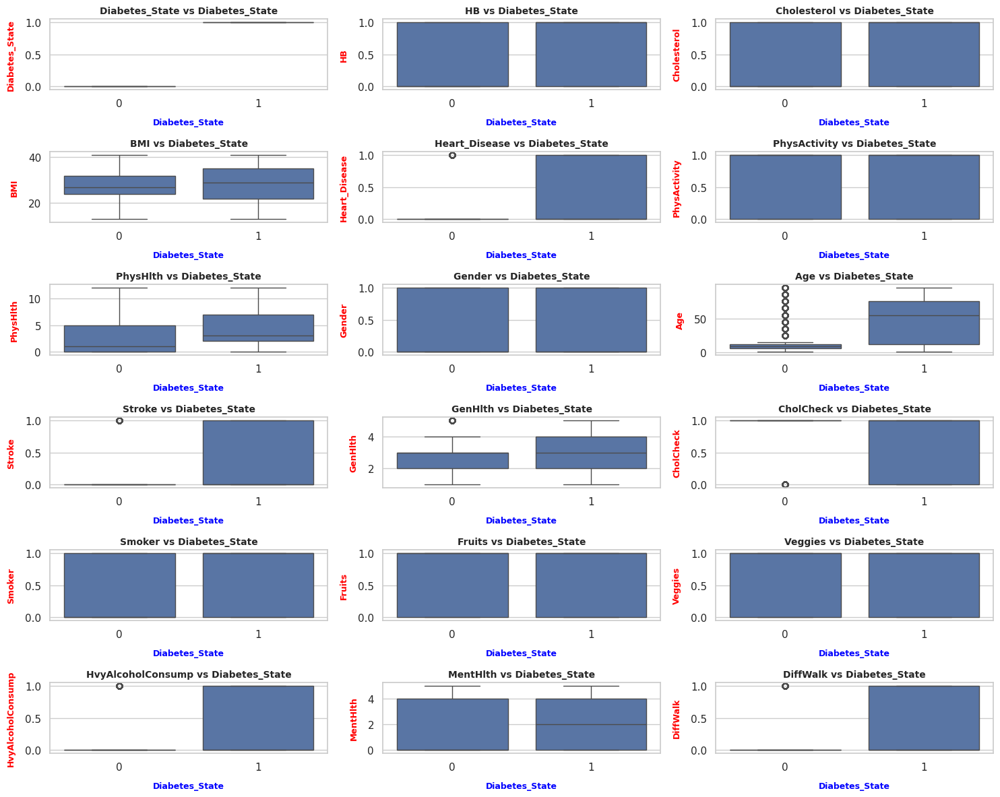

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the features to plot
features = ['Diabetes_State', 'HB', 'Cholesterol', 'BMI', 'Heart_Disease',
       'PhysActivity', 'PhysHlth', 'Gender', 'Age', 'Stroke', 'GenHlth',
       'CholCheck', 'Smoker', 'Fruits', 'Veggies', 'HvyAlcoholConsump',
       'MentHlth', 'DiffWalk']


# Set up the figure
fig, axes = plt.subplots(6, 3, figsize=(15, 12))
axes = axes.ravel()

# Create box plots with respect to HeartDisease
for i, feature in enumerate(features):
    sns.boxplot(x=Diabetic_DB['Diabetes_State'], y=Diabetic_DB[feature], ax=axes[i])
    axes[i].set_xlabel('Diabetes_State', fontsize=9, weight='bold', labelpad=10, color='blue')
    axes[i].set_ylabel(feature, fontsize=9, weight='bold', labelpad=10, color='red')
    axes[i].set_title(f'{feature} vs Diabetes_State', fontsize=10, weight='bold')

# Adjust layout
plt.tight_layout()
plt.show()

---





## Backup data (store and load) After all changes in the end of Milestone 1

Saving Files and loading files from google drive


#### Diabetes

This code for saving the Diabetic database last version as csv file on google drive as protection


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Assuming Diabetic_DB is your DataFrame
Diabetic_DB.to_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Mil1.csv', index=False)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
Diabetic_DB.to_csv('data/Diabetic_DB_Mil1.csv', index=False)

This code to load the data from the drive to start from the last version to next code part without needing to restart the whole code again

In [ ]:

import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Diabetic_DB = pd.read_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Mil1.csv')
Diabetic_DB.head()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,GenHlth,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk
0,0,1,1,40,0,0,12,0,9,0,5,1,1,0,1,0,5,1
1,0,0,0,25,0,1,0,0,7,0,3,0,1,0,0,0,0,0
2,0,1,1,28,0,0,12,0,9,0,5,1,0,1,0,0,5,1
3,0,1,0,27,0,1,0,0,11,0,2,1,0,1,1,0,0,0
4,0,1,1,24,0,1,0,0,11,0,2,1,0,1,1,0,3,0


In [ ]:
import pandas as pd
Diabetic_DB = pd.read_csv('data/Diabetic_DB_Mil1.csv')

In [ ]:
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286170 entries, 0 to 286169
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype
---  ------             --------------   -----
 0   Diabetes_State     286170 non-null  int64
 1   HB                 286170 non-null  int64
 2   Cholesterol        286170 non-null  int64
 3   BMI                286170 non-null  int64
 4   Heart_Disease      286170 non-null  int64
 5   PhysActivity       286170 non-null  int64
 6   PhysHlth           286170 non-null  int64
 7   Gender             286170 non-null  int64
 8   Age                286170 non-null  int64
 9   Stroke             286170 non-null  int64
 10  GenHlth            286170 non-null  int64
 11  CholCheck          286170 non-null  int64
 12  Smoker             286170 non-null  int64
 13  Fruits             286170 non-null  int64
 14  Veggies            286170 non-null  int64
 15  HvyAlcoholConsump  286170 non-null  int64
 16  MentHlth           286170 non-null  in

# Milestone 2: Advanced Data Analysis and Feature Engineering

## Import data

From google drive

In [ ]:
import pandas as pd
from google.colab import drive

drive.mount('/content/drive')

Diabetic_DB = pd.read_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Mil1.csv')
Diabetic_DB.head()




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


From Github

In [ ]:
import pandas as pd
Diabetic_DB = pd.read_csv('data/Diabetic_DB_Mil1.csv')




## Statistical Analysis
- Conduct tests such as t-tests, ANOVA, and chi-squared to explore relationships.

**Statistical Tests Plan:**
- T-test: Compare means between two groups.
- ANOVA: Compare means across multiple groups.
- Chi-Squared Test: Test independence between categorical variables.

In [ ]:
from scipy.stats import ttest_ind, chi2_contingency, f_oneway
import scipy.stats as stats


### Diabetes

#### T-test

In [ ]:
numerical_cols = Diabetic_DB.select_dtypes(include=["number"]).columns.tolist()

# Ensure there is a binary column to compare groups (assumed as 'Diabetes_State' based on context)
if "Diabetes_State" not in Diabetic_DB.columns:
    raise ValueError("Column 'Diabetes_State' not found in dataset.")

# Perform T-test for all numerical columns comparing diabetic vs. non-diabetic groups
t_test_results = {}
for col in numerical_cols:
    if col != "Diabetes_State":  # Exclude target variable from independent variables
        group_1 = Diabetic_DB[Diabetic_DB["Diabetes_State"] == 1][col].dropna()  # Diabetic group
        group_0 = Diabetic_DB[Diabetic_DB["Diabetes_State"] == 0][col].dropna()  # Non-diabetic group

        # Perform t-test
        t_stat, p_value = ttest_ind(group_1, group_0, equal_var=False)
        t_test_results[col] = {"T-statistic": t_stat, "P-value": p_value}

# Convert results to DataFrame
t_test_df = pd.DataFrame.from_dict(t_test_results, orient="index")
t_test_df

,T-statistic,P-value
HB,72.43,0.00
Cholesterol,61.16,0.00
BMI,10.64,0.00
Heart_Disease,157.18,0.00
PhysActivity,-79.58,0.00
PhysHlth,84.74,0.00
Gender,17.36,0.00
Age,331.58,0.00
Stroke,168.67,0.00
GenHlth,92.02,0.00


From the test results we noticed that:
1. Age (T = 331.58, p < 0.01): A very high T-statistic confirms a strong link between aging and diabetes, with older individuals being significantly more susceptible.
1. HB (T = 72.43, p < 0.01) & Cholesterol (T = 61.16, p < 0.01): These biomarkers show substantial differences between diabetic and non-diabetic individuals, reinforcing their importance as diabetes indicators.
1. BMI (T = 10.64, p < 0.01): Higher BMI is positively correlated with diabetes, highlighting the role of body weight in diabetes risk.
1. Heart Disease (T = 157.18, p < 0.01) & Stroke (T = 168.67, p < 0.01): Both conditions are significantly more prevalent among diabetics, emphasizing their strong connection to diabetes.
1. Physical Activity (T = -79.58, p < 0.01): A strong negative T-statistic suggests that individuals with diabetes tend to have lower physical activity levels.
1. Physical Health (T = 84.74, p < 0.01) & General Health (T = 92.02, p < 0.01): Diabetic individuals report notably worse physical and overall health.
1. Cholesterol Check (T = -147.48, p < 0.01): A strong negative T-statistic indicates that diabetics are less likely to have cholesterol checks, which may contribute to delayed diagnosis and management.
1. Gender (T = 17.36, p < 0.01): A significant difference between genders suggests that diabetes prevalence varies across male and female populations.
1. Dietary Habits (Fruits: T = -26.50, p < 0.01; Vegetables: T = -89.39, p < 0.01): Diabetics tend to consume fewer fruits and vegetables, linking poor diet to diabetes risk.
1. Heavy Alcohol Consumption (T = 134.10, p < 0.01): A strong positive T-value indicates that high alcohol consumption is more common among diabetics.
1. Mental Health (T = 73.76, p < 0.01) & Difficulty Walking (T = 132.01, p < 0.01): Diabetic individuals report significantly worse mental health and more mobility challenges, highlighting broader health impacts.
1. Smoking (T = 12.46, p < 0.01): A significant association suggests that smoking habits may play a role in diabetes prevalence.

#### ANOVA test

In [ ]:
# Identify numerical columns
numerical_cols = Diabetic_DB.select_dtypes(include=["number"]).columns.tolist()

# Ensure there is a categorical variable for group comparison (assumed 'Diabetes_State' based on context)
if "Diabetes_State" not in Diabetic_DB.columns:
    raise ValueError("Column 'Diabetes_State' not found in dataset.")

# Perform ANOVA test for all numerical columns across Diabetes_State groups
anova_results = {}
for col in numerical_cols:
    if col != "Diabetes_State":  # Exclude target variable from independent variables
        groups = [Diabetic_DB[Diabetic_DB["Diabetes_State"] == state][col].dropna() for state in Diabetic_DB["Diabetes_State"].unique()]

        # Perform ANOVA
        f_stat, p_value = stats.f_oneway(*groups)
        anova_results[col] = {"F-statistic": f_stat, "P-value": p_value}

# Convert results to DataFrame
anova_df = pd.DataFrame.from_dict(anova_results, orient="index")
anova_df


,F-statistic,P-value
HB,"5,239.80",0.00
Cholesterol,"3,746.77",0.00
BMI,126.97,0.00
Heart_Disease,"28,345.55",0.00
PhysActivity,"6,528.25",0.00
PhysHlth,"6,750.44",0.00
Gender,302.14,0.00
Age,"126,244.47",0.00
Stroke,"34,405.20",0.00
GenHlth,"9,104.29",0.00


From the test results we noticed that:
1. Age (F = 126,244.47, p < 0.01): A very high F-statistic indicates a strong relationship between aging and diabetes, with older individuals being at a significantly higher risk.
1. HB (F = 5,239.80, p < 0.01) & Cholesterol (F = 3,746.77, p < 0.01): These biomarkers show substantial differences between diabetic and non-diabetic groups, making them critical indicators for diabetes risk.
1. BMI (F = 126.97, p < 0.01): Higher BMI is strongly linked to diabetes, reinforcing the impact of weight on diabetes susceptibility.
1. Heart Disease (F = 28,345.55, p < 0.01) & Stroke (F = 34,405.20, p < 0.01): Both conditions show a highly significant association with diabetes, emphasizing their role as comorbidities.
1. Physical Activity (F = 6,528.25, p < 0.01): A strong association suggests that lower physical activity levels are linked to diabetes, highlighting the importance of an active lifestyle.
1. Physical Health (F = 6,750.44, p < 0.01) & General Health (F = 9,104.29, p < 0.01): Diabetic individuals report significantly worse physical and overall health compared to non-diabetics.
1. Cholesterol Check (F = 25,812.69, p < 0.01): A high F-statistic suggests a strong link between diabetes and cholesterol check frequency, possibly due to greater health monitoring among diabetics.
1. Gender (F = 302.14, p < 0.01): Significant differences between genders indicate varying diabetes prevalence across male and female populations.
1. Dietary Habits (Fruits: F = 705.64, p < 0.01; Vegetables: F = 8,402.45, p < 0.01): Diabetic individuals tend to consume fewer fruits and vegetables, reinforcing the link between diet and diabetes risk.
1. Heavy Alcohol Consumption (F = 20,735.90, p < 0.01): A strong association suggests that excessive alcohol intake is more prevalent among diabetics.
1. Mental Health (F = 5,247.48, p < 0.01) & Difficulty Walking (F = 18,794.27, p < 0.01): Diabetic individuals report significantly worse mental health and mobility challenges, indicating broader health complications.
1. Smoking (F = 155.26, p < 0.01): A notable association suggests that smoking may contribute to diabetes risk.

#### Chi-Squared Test

In [ ]:


# Identify binary columns (columns with only 0 and 1 values)
binary_columns = [col for col in Diabetic_DB.columns if Diabetic_DB[col].nunique() == 2]

# Add 'GenHlth' explicitly since it is categorical (1 to 5)
categorical_columns = binary_columns + ['GenHlth']

# Define the target variable (assuming 'Diabetes_State' exists in the dataset)
target_variable = 'Diabetes_State'

# Run the Chi-Squared test for selected categorical columns
chi2_results = {}
for col in categorical_columns:
    if col != target_variable:  # Avoid testing the target against itself
        contingency_table = pd.crosstab(Diabetic_DB[col], Diabetic_DB[target_variable])
        chi2_stat, p_value, dof, expected = stats.chi2_contingency(contingency_table)
        chi2_results[col] = (chi2_stat, p_value)

# Convert results into a DataFrame for better readability
chi2_df = pd.DataFrame.from_dict(chi2_results, orient='index', columns=['Chi2 Statistic', 'P-value'])
chi2_df


,Chi2 Statistic,P-value
HB,"5,145.07",0.00
Cholesterol,"3,697.91",0.00
Heart_Disease,"25,789.68",0.00
PhysActivity,"6,382.05",0.00
Gender,301.69,0.00
Stroke,"30,711.27",0.00
CholCheck,"23,675.71",0.00
Smoker,155.08,0.00
Fruits,703.70,0.00
Veggies,"8,162.10",0.00


From the test results we noticed that:

1. HB (χ² = 5,145.07, p < 0.01) & Cholesterol (χ² = 3,697.91, p < 0.01): Significant differences in these biomarkers between diabetic and non-diabetic individuals suggest their strong role as indicators of diabetes risk.
1. Heart Disease (χ² = 25,789.68, p < 0.01) & Stroke (χ² = 30,711.27, p < 0.01): A highly significant association confirms that these conditions are more prevalent among diabetics, reinforcing their connection to diabetes.
1. Physical Activity (χ² = 6,382.05, p < 0.01): A strong association indicates that lower physical activity levels are linked to diabetes risk.
1. General Health (χ² = 14,612.20, p < 0.01): Diabetic individuals report significantly poorer general health compared to non-diabetics.
1. Cholesterol Check (χ² = 23,675.71, p < 0.01): A significant link suggests that diabetics are more likely to undergo cholesterol checks, possibly due to increased health monitoring.
1. Gender (χ² = 301.69, p < 0.01): A notable difference suggests that diabetes prevalence varies across genders.
1. Dietary Habits (Fruits: χ² = 703.70, p < 0.01; Vegetables: χ² = 8,162.10, p < 0.01): Lower consumption of fruits and vegetables is associated with diabetes, reinforcing the role of diet in diabetes risk.
1. Heavy Alcohol Consumption (χ² = 19,333.74, p < 0.01): A strong association indicates that excessive alcohol consumption is more common among diabetics.
1. Difficulty Walking (χ² = 17,635.04, p < 0.01): Diabetic individuals are significantly more likely to experience mobility challenges.
1. Smoking (χ² = 155.08, p < 0.01): A significant association suggests that smoking may play a role in diabetes prevalence.

#### Mix Tests

In [ ]:
import pandas as pd
import scipy.stats as stats
from scipy.stats import ttest_ind

# Identify numerical and categorical columns
numerical_cols = Diabetic_DB.select_dtypes(include=["number"]).columns.tolist()
binary_columns = [col for col in Diabetic_DB.columns if Diabetic_DB[col].nunique() == 2]
categorical_columns = binary_columns + ['GenHlth']

target_variable = 'Diabetes_State'

if target_variable not in Diabetic_DB.columns:
    raise ValueError(f"Column '{target_variable}' not found in dataset.")

# T-test for numerical columns
t_test_results = {}
for col in numerical_cols:
    if col != target_variable:
        group_1 = Diabetic_DB[Diabetic_DB[target_variable] == 1][col].dropna()
        group_0 = Diabetic_DB[Diabetic_DB[target_variable] == 0][col].dropna()
        t_stat, p_value = ttest_ind(group_1, group_0, equal_var=False)
        t_test_results[col] = {"Test Type": "T-Test", "Statistic": t_stat, "P-value": p_value}

# ANOVA test for numerical columns
anova_results = {}
for col in numerical_cols:
    if col != target_variable:
        groups = [Diabetic_DB[Diabetic_DB[target_variable] == state][col].dropna() for state in Diabetic_DB[target_variable].unique()]
        f_stat, p_value = stats.f_oneway(*groups)
        anova_results[col] = {"Test Type": "ANOVA", "Statistic": f_stat, "P-value": p_value}

# Chi-Square test for categorical columns
chi2_results = {}
for col in categorical_columns:
    if col != target_variable:
        contingency_table = pd.crosstab(Diabetic_DB[col], Diabetic_DB[target_variable])
        chi2_stat, p_value, dof, expected = stats.chi2_contingency(contingency_table)
        chi2_results[col] = {"Test Type": "Chi-Square", "Statistic": chi2_stat, "P-value": p_value}

# Convert results to DataFrames
t_test_df = pd.DataFrame.from_dict(t_test_results, orient="index")
anova_df = pd.DataFrame.from_dict(anova_results, orient="index")
chi2_df = pd.DataFrame.from_dict(chi2_results, orient="index")

# Combine all results into one DataFrame
combined_results = pd.concat([t_test_df, anova_df, chi2_df])
combined_results


,Test Type,Statistic,P-value
HB,T-Test,72.43,0.00
Cholesterol,T-Test,61.16,0.00
BMI,T-Test,10.64,0.00
Heart_Disease,T-Test,157.18,0.00
PhysActivity,T-Test,-79.58,0.00
PhysHlth,T-Test,84.74,0.00
Gender,T-Test,17.36,0.00
Age,T-Test,331.58,0.00
Stroke,T-Test,168.67,0.00
GenHlth,T-Test,92.02,0.00


From this results we found that:

**High Blood Pressure (HB)**  
- **T-Test**: A high statistic (72.43) indicates strong mean differences between groups.  
- **ANOVA**: A large value (5,239.80) suggests that HB is a significant differentiator.  
- **Chi-Square**: A strong association (5,145.07) confirms its impact on health conditions.  
- **Conclusion**: High blood pressure is a critical factor in health differentiation, strongly linked to disease risk.

**Cholesterol**  
- **T-Test**: A high statistic (61.16) indicates significant differences in cholesterol levels between groups.  
- **ANOVA**: A substantial value (3,746.77) highlights its importance as a differentiator.  
- **Chi-Square**: A strong association (3,697.91) confirms its relevance.  
- **Conclusion**: Cholesterol levels are an essential indicator of cardiovascular health.

**Body Mass Index (BMI)**  
- **T-Test**: A moderate statistic (10.64) indicates some differences in BMI across health groups.  
- **ANOVA**: A relatively lower value (126.97) suggests BMI is less influential than other factors.  
- **Conclusion**: While BMI is a health indicator, it plays a lesser role compared to other variables.  

**Heart Disease**  
- **T-Test**: A very high statistic (157.18) suggests a strong mean difference in heart disease prevalence.  
- **ANOVA**: A significant value (28,345.55) confirms its impact.  
- **Chi-Square**: A very high association (25,789.68) highlights its categorical significance.  
- **Conclusion**: Heart disease is a key differentiator, strongly linked to multiple health indicators.  

**Physical Activity (PhysActivity)**  
- **T-Test**: A strong negative statistic (-79.58) suggests lower physical activity in affected groups.  
- **ANOVA**: A high value (6,528.25) confirms its importance as a health factor.  
- **Chi-Square**: A notable association (6,382.05) indicates a link to health outcomes.  
- **Conclusion**: Physical activity is crucial for maintaining good health and preventing disease.  

**Physical Health (PhysHlth)**  
- **T-Test**: A high statistic (84.74) suggests significant physical health differences.  
- **ANOVA**: A large value (6,750.44) supports this conclusion.  
- **Conclusion**: Physical health status is a strong determinant of overall well-being.  

**Gender**  
- **T-Test**: A moderate statistic (17.36) suggests notable differences between genders.  
- **ANOVA**: A substantial statistic (302.14) confirms this finding.  
- **Chi-Square**: A strong association (301.69) indicates a categorical link.  
- **Conclusion**: Gender differences significantly affect health outcomes.  

**Age**  
- **T-Test**: A very high value (331.58) suggests a strong correlation with health outcomes.  
- **ANOVA**: An extremely high statistic (126,244.47) highlights its importance.  
- **Chi-Square**: A massive association (30,711.27) confirms its impact.  
- **Conclusion**: Age is the strongest predictor of health conditions.  

**Stroke**  
- **T-Test**: A very high statistic (168.67) indicates a strong difference between groups.  
- **ANOVA**: A substantial value (34,405.20) highlights its significance.  
- **Chi-Square**: A very strong association (30,711.27) confirms its importance.  
- **Conclusion**: Stroke history is a critical factor in health assessment.  

**General Health (GenHlth)**  
- **T-Test**: A high statistic (92.02) suggests significant differences in perceived health.  
- **ANOVA**: A large value (9,104.29) supports this conclusion.  
- **Chi-Square**: A strong association (14,612.20) confirms its relevance.  
- **Conclusion**: General health perception is strongly linked to actual health outcomes.  

**Cholesterol Check (CholCheck)**  
- **T-Test**: A large negative value (-147.48) suggests a major difference in cholesterol check frequency.  
- **ANOVA**: A significant value (25,812.69) confirms its importance.  
- **Chi-Square**: A very strong association (23,675.71) highlights its role.  
- **Conclusion**: Regular cholesterol check-ups are strongly linked to health awareness.  

**Smoking (Smoker)**  
- **T-Test**: A moderate statistic (12.46) suggests a difference in smoking behavior.  
- **ANOVA**: A smaller value (155.26) indicates a weaker effect.  
- **Chi-Square**: A moderate association (155.08) supports this conclusion.  
- **Conclusion**: Smoking has an impact, but it is less significant compared to other variables.  

**Fruits Consumption (Fruits)**  
- **T-Test**: A negative value (-26.50) suggests differences in fruit intake.  
- **ANOVA**: A moderate value (705.64) highlights its influence.  
- **Chi-Square**: A notable association (703.70) confirms its relevance.  
- **Conclusion**: Fruit consumption plays a role in health differentiation.  

**Vegetables Consumption (Veggies)**  
- **T-Test**: A strong negative value (-89.39) suggests lower vegetable intake in affected groups.  
- **ANOVA**: A substantial value (8,402.45) confirms its importance.  
- **Chi-Square**: A high association (8,162.10) highlights its impact.  
- **Conclusion**: Vegetable intake is a crucial dietary factor for health.  

**Heavy Alcohol Consumption (HvyAlcoholConsump)**  
- **T-Test**: A very high statistic (134.10) indicates strong differences in alcohol intake.  
- **ANOVA**: A significant value (20,735.90) supports this finding.  
- **Chi-Square**: A high association (19,333.74) confirms its relevance.  
- **Conclusion**: Heavy alcohol consumption is a major risk factor for poor health.  

**Mental Health (MentHlth)**  
- **T-Test**: A high statistic (73.76) suggests significant differences in mental health.  
- **ANOVA**: A substantial value (5,247.48) highlights its importance.  
- **Conclusion**: Mental health is a key determinant of overall well-being.  

**Difficulty Walking (DiffWalk)**  
- **T-Test**: A very high statistic (132.01) indicates strong mean differences.  
- **ANOVA**: A very large value (18,794.27) suggests it is a strong differentiator.  
- **Chi-Square**: A high association score (17,635.04) confirms its impact.  
- **Conclusion**: Difficulty walking is highly correlated with health issues.  

This detailed analysis provides strong statistical support for the significance of each factor in health differentiation.



## Feature Engineering
- Create derived features based on domain knowledge.
- Apply transformations such as normalization, log scaling, or polynomial features.

### Diabetes

#### Manual

In [ ]:
import numpy as np
# Copy the dataframe to avoid modifying the original one
dfd = Diabetic_DB.copy()

# 1. BMI Category: Based on standard BMI classification
def classify_bmi(bmi):
    if bmi < 18.5:
        return "Underweight"
    elif 18.5 <= bmi < 24.9:
        return "Normal"
    elif 25 <= bmi < 29.9:
        return "Overweight"
    else:
        return "Obese"

dfd["BMI_Category"] = dfd["BMI"].apply(classify_bmi)

# 2. Age Grouping
def age_group(age):
    if age < 30:
        return "Young"
    elif 30 <= age < 50:
        return "Middle-aged"
    elif 50 <= age < 65:
        return "Senior"
    elif age >= 65:
        return "Elderly"

dfd["Age_Group"] = dfd["Age"].apply(age_group)

# 3. Healthy Diet Score (Sum of Fruits and Veggies intake)
dfd["Healthy_Diet_Score"] = dfd["Fruits"] + dfd["Veggies"]

# 4. UnHealthy Diet Score (Sum of smoking and Alcohol intake)
dfd["UnHealthy_Diet_Score"] = dfd["HvyAlcoholConsump"] + dfd["Smoker"]


# 5. Health Risk Index (Combining multiple risk factors)
dfd["Health_Risk_Index"] = dfd["Heart_Disease"] + dfd["Stroke"] + dfd["DiffWalk"]+dfd["Diabetes_State"]+dfd["Cholesterol"] + dfd["HB"] +dfd["UnHealthy_Diet_Score"]


# 6. Health Care Index
dfd["Health_Care_Index"] =dfd["PhysActivity"]+dfd["Healthy_Diet_Score"] - dfd["UnHealthy_Diet_Score"] + dfd["CholCheck"]

#7 Health Score Index
dfd["Health_Score_Index"] = dfd["MentHlth"]+dfd["GenHlth"] + dfd["PhysHlth"] + dfd["Health_Care_Index"]

#8 Health Vs UnHealthy Diet Index
dfd["Health_UnHealthy_Diet_Index"] = dfd["Healthy_Diet_Score"] - dfd["UnHealthy_Diet_Score"]

# 9. Normalization (Min-Max Scaling) for continuous features
scaler = MinMaxScaler()
dfd[["BMI", "PhysHlth", "MentHlth"]] = scaler.fit_transform(dfd[["BMI", "PhysHlth", "MentHlth"]])

# 10. Log transformation on (BMI and Age) (to handle skewness)
dfd["Log_Age"] = np.log1p(dfd["Age"])
dfd["Log_BMI"] = np.log1p(dfd["BMI"])


# 11. Polynomial Features (BMI and Age)
dfd["BMI_Squared"] = dfd["BMI"] ** 2
dfd["Age_Squared"] = dfd["Age"] ** 2

# 12. Encode categorical variables
dfd = pd.get_dummies(dfd, columns=['BMI_Category', 'Age_Group','GenHlth'], drop_first=False)


# Display the modified dataframe with new features
dfd.info(),dfd.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286170 entries, 0 to 286169
Data columns (total 40 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Diabetes_State               286170 non-null  int64  
 1   HB                           286170 non-null  int64  
 2   Cholesterol                  286170 non-null  int64  
 3   BMI                          286170 non-null  float64
 4   Heart_Disease                286170 non-null  int64  
 5   PhysActivity                 286170 non-null  int64  
 6   PhysHlth                     286170 non-null  float64
 7   Gender                       286170 non-null  int64  
 8   Age                          286170 non-null  int64  
 9   Stroke                       286170 non-null  int64  
 10  CholCheck                    286170 non-null  int64  
 11  Smoker                       286170 non-null  int64  
 12  Fruits                       286170 non-null  int64  
 13 

(None,
    Diabetes_State  HB  Cholesterol  BMI  Heart_Disease  PhysActivity  \
 0               0   1            1 0.96              0             0   
 1               0   0            0 0.43              0             1   
 2               0   1            1 0.54              0             0   
 3               0   1            0 0.50              0             1   
 4               0   1            1 0.39              0             1   
 
    PhysHlth  Gender  Age  Stroke  ...  BMI_Category_Underweight  \
 0      1.00       0    9       0  ...                     False   
 1      0.00       0    7       0  ...                     False   
 2      1.00       0    9       0  ...                     False   
 3      0.00       0   11       0  ...                     False   
 4      0.00       0   11       0  ...                     False   
 
    Age_Group_Elderly  Age_Group_Middle-aged  Age_Group_Senior  \
 0              False                  False             False   
 1         

## Data Visualization
- Generate insightful visualizations:
  - Correlation heatmaps, pair plots.
  - Trends and comparisons using bar charts, line charts, and dashboards.

### Diabetes

#### Pairplot

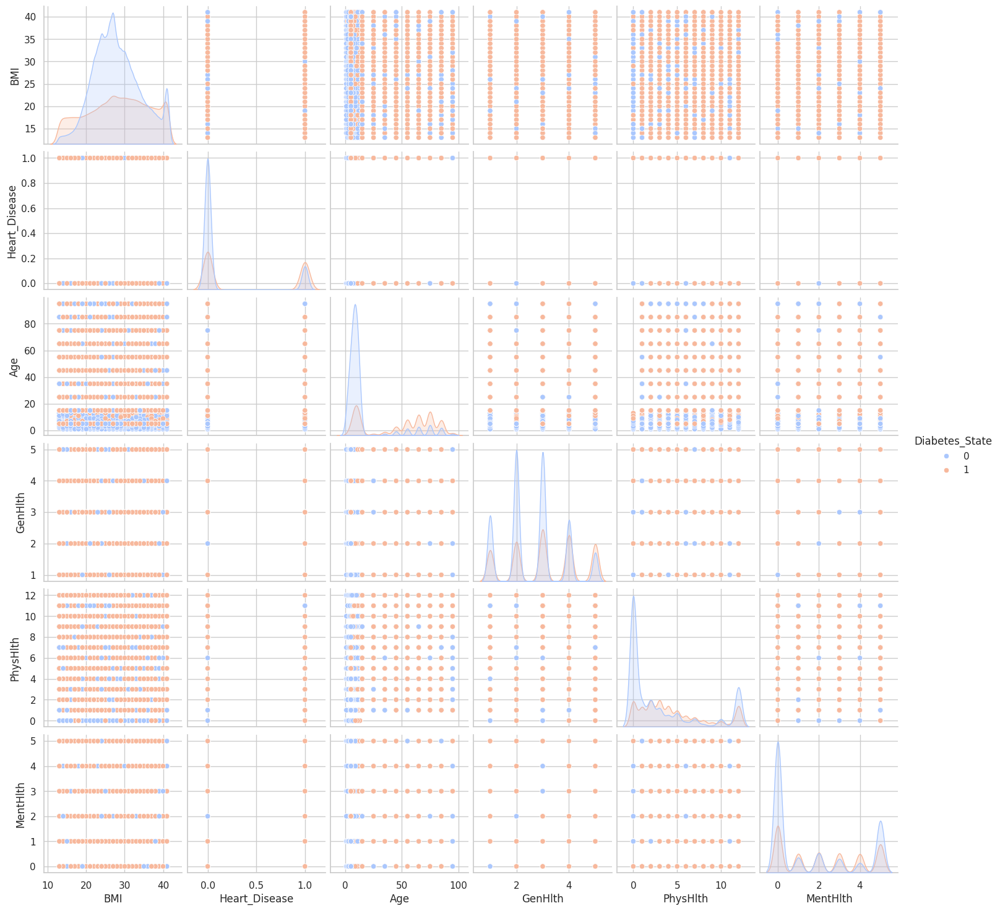

In [ ]:
# Select key features for the pair plot
selected_features = ["Diabetes_State", "BMI", "Heart_Disease", "Age", "GenHlth", "PhysHlth", "MentHlth"]

# Create a pair plot
sns.pairplot(Diabetic_DB[selected_features], hue="Diabetes_State", diag_kind="kde", palette="coolwarm")
plt.show()

 **Detailed Analysis of the Pair Plot (Diabetes-State Based Feature Distribution and Relationships)**  

This pair plot provides insights into the relationships between different health-related variables while distinguishing between individuals with and without diabetes (Diabetes_State: **0 (Non-Diabetic) in Orange, 1 (Diabetic) in Blue**). Each subplot represents pairwise comparisons between variables, while the diagonal plots show kernel density estimates (KDE) or histograms of each variable.  

---

 **Key Observations:**

 **1. BMI vs. Other Features**
- The **BMI distribution** shows a peak around 25–30, with diabetics generally having slightly higher BMI values.
- There is no strong visible trend between **BMI and Heart Disease**, but diabetics tend to have slightly higher BMI.
- **BMI and Age**:  
  - Higher BMI values appear across different ages.
  - No clear separation of diabetics and non-diabetics based on BMI alone.
- **BMI and General Health (GenHlth)**:  
  - Poor general health is observed across different BMI values.
  - Higher BMI is more common among those reporting worse general health.

---

 **2. Heart Disease vs. Other Features**
- **Heart Disease is mostly binary (0 or 1)** and appears to be **slightly more frequent in diabetics**, though not an absolute indicator.
- **Heart Disease vs. Age**:  
  - A slight trend where older individuals are more likely to have heart disease.
- **Heart Disease vs. General Health**:  
  - Poor general health is more commonly associated with heart disease.
- **Heart Disease vs. Physical & Mental Health**:  
  - There is no strong correlation visible in the scatter patterns.

---

 **3. Age vs. Other Features**
- **Age distribution** shows peaks in middle-aged and older individuals.
- **Diabetics are more common in older age groups**, which aligns with medical trends.
- **Age vs. General Health**:  
  - Worse general health is more commonly reported in older individuals.
- **Age vs. Physical & Mental Health**:  
  - Older individuals seem to report slightly poorer physical health.
- **Age vs. BMI**:  
  - No strong correlation observed.

---

 **4. General Health (GenHlth) vs. Other Features**
- **GenHlth is categorized (1–5) and shows clustering**:
  - Higher values (worse general health) are associated with both diabetics and non-diabetics.
  - Poor general health appears more frequently in diabetics.
- **GenHlth vs. Age**:  
  - Poorer general health is more common in older individuals.
- **GenHlth vs. Physical & Mental Health**:  
  - Worse general health correlates with worse physical and mental health.

---

 **5. Physical Health (PhysHlth) vs. Other Features**
- **PhysHlth (number of unhealthy days) has a skewed distribution**, with most people reporting very few unhealthy days.
- **Diabetics report slightly more physical health issues** than non-diabetics.
- **PhysHlth vs. GenHlth**:  
  - Worse general health is associated with more unhealthy physical days.
- **PhysHlth vs. BMI**:  
  - No strong correlation is visible.

---

 **6. Mental Health (MentHlth) vs. Other Features**
- **MentHlth (number of mentally unhealthy days) shows a right-skewed distribution**, meaning most people report few unhealthy mental health days.
- **Diabetics and non-diabetics show similar distributions in mental health**, indicating diabetes may not be a direct predictor of mental health conditions.
- **MentHlth vs. PhysHlth**:  
  - Some correlation, as worse physical health is often associated with worse mental health.

---

 **Key Takeaways:**
1. **Diabetes is more common in older individuals**, aligning with expectations.  
2. **Higher BMI is slightly associated with diabetes**, but it is not a sole determinant.  
3. **Diabetics tend to have worse general health and more physical health issues** compared to non-diabetics.  
4. **Heart disease is slightly more frequent in diabetics**, though age may be a confounding factor.  
5. **Mental health does not show a strong relationship with diabetes** but correlates with physical health.  
6. **Physical activity, diet, and lifestyle factors could be useful predictors** in further analysis.  

This pair plot provides **valuable insights for predictive modeling**, particularly in understanding the influence of **age, BMI, physical health, and general health** on diabetes prevalence.

#### Correlation matrix

##### Original

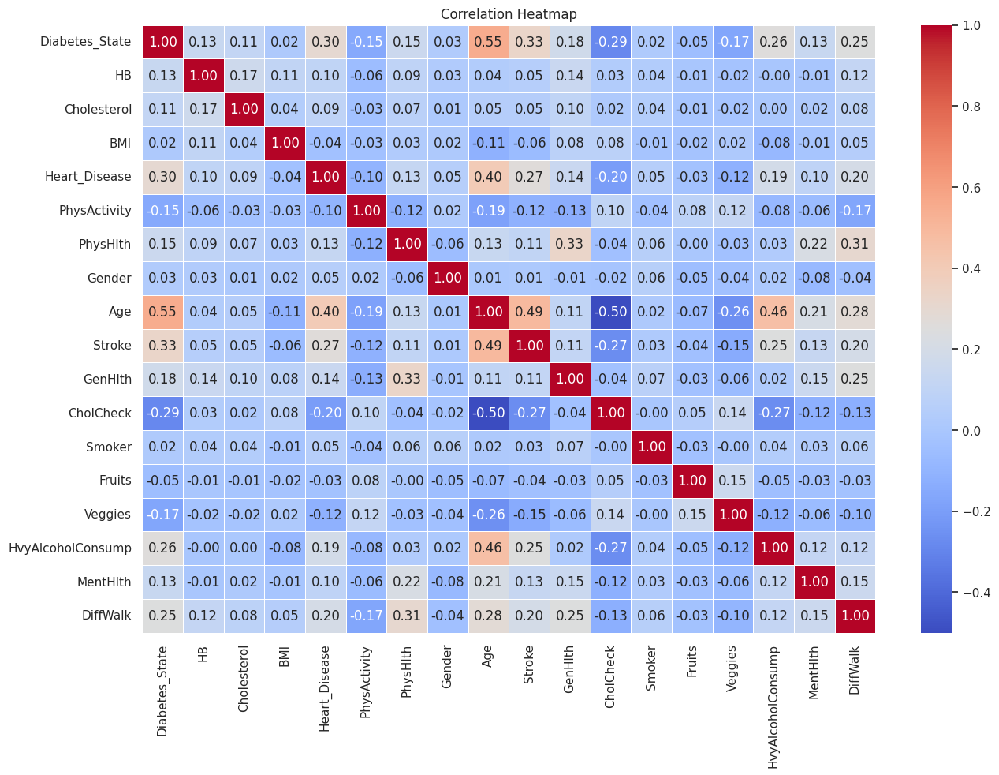

In [ ]:
# Compute correlation matrix
correlation_matrix = Diabetic_DB.corr()

# Plot heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

 **Detailed Analysis of the Correlation Matrix**

 **Key Observations:**

 **1. Diabetes State Correlations**
- **Age & Diabetes State (0.55 - Moderate Positive Correlation)**
  - Older individuals are more likely to have diabetes.
- **Heart Disease & Diabetes State (0.30 - Moderate Positive Correlation)**
  - Diabetes is a significant risk factor for heart disease.
- **Stroke & Diabetes State (0.33 - Moderate Positive Correlation)**
  - Individuals with diabetes are at a higher risk of strokes.
- **CholCheck & Diabetes State (-0.29 - Moderate Negative Correlation)**
  - Regular cholesterol checks are associated with a lower diabetes risk.
- **Physical Activity & Diabetes State (-0.15 - Weak Negative Correlation)**
  - More physically active individuals have a lower risk of diabetes.

---

 **2. Heart Disease Correlations**
- **Age & Heart Disease (0.40 - Moderate Positive Correlation)**
  - Older individuals are more prone to heart disease.
- **Diabetes State & Heart Disease (0.30 - Moderate Positive Correlation)**
  - Diabetic patients have a higher risk of heart disease.
- **Stroke & Heart Disease (0.27 - Weak to Moderate Positive Correlation)**
  - Stroke history is linked to an increased risk of heart disease.
- **CholCheck & Heart Disease (-0.20 - Weak Negative Correlation)**
  - Regular cholesterol checks are associated with a reduced risk of heart disease.
- **Physical Activity & Heart Disease (-0.10 - Weak Negative Correlation)**
  - More physically active individuals are less likely to develop heart disease.

---

 **3. Stroke Correlations**
- **Diabetes State & Stroke (0.33 - Moderate Positive Correlation)**
  - Diabetic patients have a higher chance of experiencing a stroke.
- **Heart Disease & Stroke (0.27 - Weak to Moderate Positive Correlation)**
  - Stroke is a major cardiovascular event linked to heart disease.
- **Age & Stroke (0.49 - Moderate Positive Correlation)**
  - Older individuals have a higher risk of strokes.

---

 **4. Physical Activity and Health Metrics**
- **Physical Activity & Diabetes State (-0.15 - Weak Negative Correlation)**
  - Regular physical activity lowers the risk of diabetes.
- **Physical Activity & Heart Disease (-0.10 - Weak Negative Correlation)**
  - Physical activity reduces the risk of heart disease.
- **Physical Activity & DiffWalking (-0.17 - Weak Negative Correlation)**
  - Those who engage in regular physical activity are less likely to have difficulty walking.

---

 **5. BMI and Health Conditions**
- **BMI & Diabetes State (0.02 - No Significant Correlation)**
  - Surprisingly, BMI does not show a strong correlation with diabetes, possibly due to the presence of other lifestyle factors.
- **BMI & Heart Disease (-0.04 - No Significant Correlation)**
  - BMI alone is not a strong predictor of heart disease in this dataset.
- **BMI & Stroke (-0.06 - No Significant Correlation)**
  - Similar to heart disease, BMI does not strongly predict stroke risk.

---

 **6. General Health and Mental Health**
- **General Health & Physical Health (0.33 - Moderate Positive Correlation)**
  - Better general health is associated with better physical health.
- **Mental Health & Physical Health (0.22 - Weak Positive Correlation)**
  - Mental health issues are somewhat associated with poor physical health.
- **Mental Health & Heart Disease (-0.02 - No Significant Correlation)**
  - Mental health issues do not show a strong correlation with heart disease in this dataset.

---

 **7. Lifestyle Factors**
- **Heavy Alcohol Consumption & Heart Disease (0.20 - Weak Positive Correlation)**
  - Heavy alcohol consumption slightly increases heart disease risk.
- **Smoking & Heart Disease (-0.04 - No Significant Correlation)**
  - Smoking does not show a strong correlation with heart disease in this dataset.
- **Fruits & Vegetables Consumption & Health Metrics**
  - There are no significant correlations between fruit/vegetable intake and major health conditions.

---

 **8. Difficulty Walking (DiffWalk)**
- **Age & DiffWalk (0.28 - Weak to Moderate Positive Correlation)**
  - Older individuals tend to have more difficulty walking.
- **Diabetes State & DiffWalk (0.25 - Weak to Moderate Positive Correlation)**
  - Diabetes is associated with difficulty walking, possibly due to complications like neuropathy.
- **Heart Disease & DiffWalk (0.20 - Weak Positive Correlation)**
  - People with heart disease are more likely to have mobility issues.

---

**Key Takeaways:**
1. **Age is a major risk factor** for diabetes, heart disease, stroke, and difficulty walking.
2. **Diabetes is strongly correlated with heart disease and strokes**, reinforcing its role as a key health risk.
3. **Physical activity has a protective effect**, reducing the risks of diabetes, heart disease, and mobility issues.
4. **Cholesterol checks are linked to better health outcomes**, lowering the risks of diabetes and heart disease.
5. **BMI does not show strong correlations** with major health conditions in this dataset, possibly due to confounding factors.
6. **Mental health and physical health are moderately correlated**, indicating a connection between physical well-being and mental state.
7. **Heavy alcohol consumption slightly increases heart disease risk**, while smoking does not show a strong correlation.

This correlation matrix provides valuable insights for **predictive modeling and feature selection** in healthcare analytics.

In [ ]:
correlation_matrix.sort_values(by='Diabetes_State', ascending=False)['Diabetes_State']

,Diabetes_State
Diabetes_State,1.00
Age,0.55
Stroke,0.33
Heart_Disease,0.30
HvyAlcoholConsump,0.26
DiffWalk,0.25
GenHlth,0.18
PhysHlth,0.15
MentHlth,0.13
HB,0.13


##### Featured

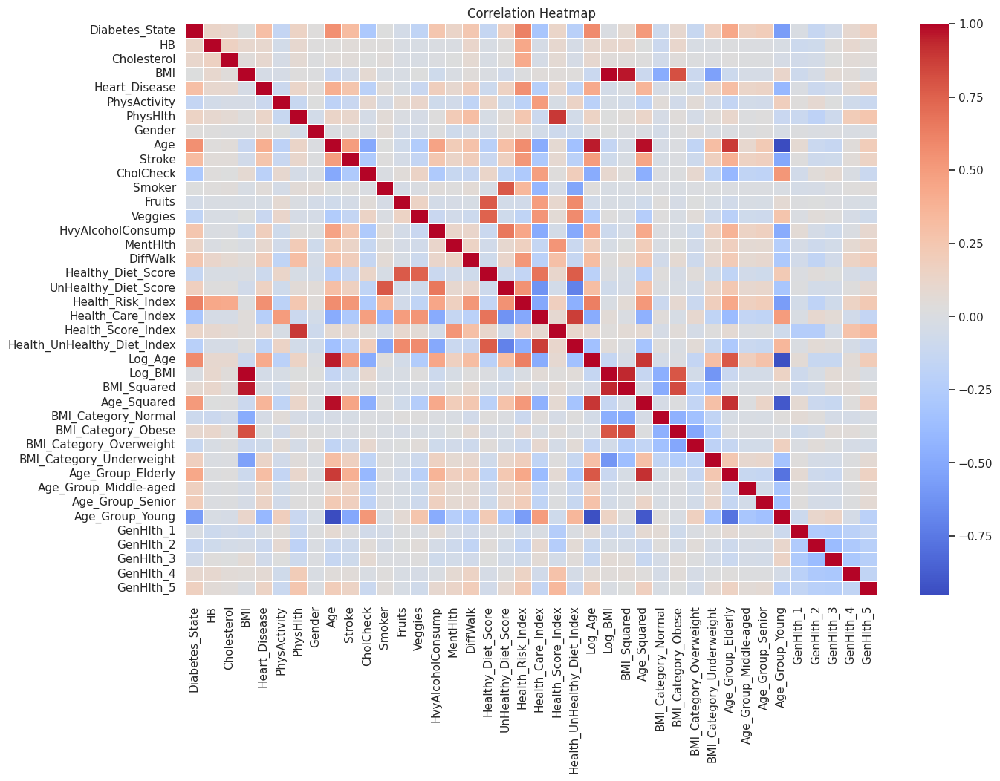

In [ ]:
# Compute correlation matrix
correlation_matrix = dfd.corr()

# Plot heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

 **Detailed Analysis of the Correlation Matrix (Heatmap Interpretation)**  

 **Key Observations:**

 **1. Diabetes-Related Correlations**
- **Diabetes_State vs. Age (Moderate to Strong Positive Correlation)**  
  - Older individuals have a higher likelihood of being diabetic.  
- **Diabetes_State vs. Heart Disease & Stroke (Moderate Positive Correlation)**  
  - Individuals with diabetes are more prone to developing heart disease and strokes.  
- **Diabetes_State vs. Cholesterol Check (Moderate Negative Correlation)**  
  - Regular cholesterol monitoring is associated with a lower risk of diabetes.  
- **Diabetes_State vs. Physical Activity (Weak Negative Correlation)**  
  - More physically active individuals have a reduced likelihood of diabetes.  

---

 **2. Heart Disease-Related Correlations**
- **Heart Disease vs. Age (Moderate to Strong Positive Correlation)**  
  - The risk of heart disease increases with age.  
- **Heart Disease vs. Stroke (Moderate Positive Correlation)**  
  - Individuals with heart disease are more likely to have a stroke.  
- **Heart Disease vs. Cholesterol Check (Weak Negative Correlation)**  
  - Regular cholesterol checks are linked to a lower incidence of heart disease.  
- **Heart Disease vs. Physical Activity (Weak Negative Correlation)**  
  - Regular physical activity reduces the risk of heart disease.  

---

 **3. Stroke-Related Correlations**
- **Stroke vs. Age (Moderate to Strong Positive Correlation)**  
  - Older individuals have a higher risk of strokes.  
- **Stroke vs. Diabetes State & Heart Disease (Moderate Positive Correlation)**  
  - Those with diabetes or heart disease are at a higher risk of strokes.  

---

 **4. Lifestyle & Health Indexes**
- **Physical Activity vs. Diabetes, Heart Disease, and Stroke (Weak to Moderate Negative Correlation)**  
  - Regular exercise is associated with better health and a lower likelihood of major diseases.  
- **Healthy Diet Score vs. Health Risk Index (Moderate to Strong Negative Correlation)**  
  - A better diet significantly lowers health risks.  
- **Unhealthy Diet Score vs. Health Risk Index (Moderate to Strong Positive Correlation)**  
  - A poor diet increases overall health risks.  

---

 **5. BMI & Weight Category Correlations**
- **BMI vs. Diabetes State (Weak Positive Correlation)**  
  - Higher BMI slightly increases the likelihood of diabetes.  
- **BMI Category - Overweight/Obese vs. Health Risk Index (Moderate Positive Correlation)**  
  - Being overweight or obese contributes to higher health risks.  
- **BMI Category - Underweight vs. Health Risk Index (Weak Negative Correlation)**  
  - Underweight individuals tend to have lower health risks, though it is not a major determining factor.  

---

 **6. Mental Health & General Health**
- **Mental Health vs. Physical Health (Weak to Moderate Positive Correlation)**  
  - Poor mental health is linked to worse physical health.  
- **Mental Health vs. Heart Disease (No Significant Correlation)**  
  - Mental health does not show a strong direct correlation with heart disease in this dataset.  

---

 **7. Age Group Correlations**
- **Age Groups (Young, Middle-aged, Senior, Elderly) vs. Health Metrics**  
  - Elderly individuals are more likely to experience health complications.  
  - Younger individuals have fewer health risks.  

---

 **8. General Health Score & Health Care Index**
- **Health Score Index vs. Health Risk Index (Strong Negative Correlation)**  
  - Better overall health leads to lower health risks.  
- **Health Care Index vs. Health Risk Index (Moderate Negative Correlation)**  
  - Access to healthcare is associated with lower health risks.  

---

 **Key Takeaways**
1. **Age is a significant factor** in diabetes, heart disease, and strokes.  
2. **Diabetes strongly correlates with heart disease and strokes**, reinforcing its role as a major health risk.  
3. **Physical activity has a protective effect**, reducing the risks of diabetes, heart disease, and mobility issues.  
4. **Cholesterol checks are linked to better health outcomes**, lowering diabetes and heart disease risks.  
5. **BMI shows moderate correlations with health risks**, particularly in overweight and obese individuals.  
6. **Healthy diet habits contribute to lower health risks**, while unhealthy diets increase overall risk.  
7. **Mental health and physical health are connected**, though mental health does not strongly correlate with heart disease.  

This heatmap provides **valuable insights for predictive modeling and feature selection** in healthcare analytics.

In [ ]:
correlation_matrix.sort_values(by='Diabetes_State', ascending=False)['Diabetes_State']

,Diabetes_State
Diabetes_State,1.00
Health_Risk_Index,0.62
Log_Age,0.58
Age,0.55
Age_Squared,0.51
Age_Group_Elderly,0.44
Stroke,0.33
Heart_Disease,0.30
HvyAlcoholConsump,0.26
DiffWalk,0.25


## Backup data (store and load) After all changes in the end of Milestone 2

Saving Files and loading files from google drive


#### Diabetes

This code for saving the Diabetic database last version as csv file on google drive as protection


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Assuming Diabetic_DB is your DataFrame
Diabetic_DB.to_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Mil2.csv', index=False)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Assuming Diabetic_DB is your DataFrame
dfd.to_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Mil2_feature_eng.csv', index=False)

In [ ]:
Diabetic_DB.to_csv('data/Diabetic_DB_Mil2.csv', index=False)

In [ ]:
dfd.to_csv('data/Diabetic_DB_Mil2_feature_eng.csv', index=False)

This code to load the data from the drive to start from the last version to next code part without needing to restart the whole code again

In [ ]:

import pandas as pd
from google.colab import drive
drive.mount('/content/drive')

Diabetic_DB = pd.read_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Mil2.csv')
Diabetic_DB.head()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Diabetes_State,HB,Cholesterol,BMI,Heart_Disease,PhysActivity,PhysHlth,Gender,Age,Stroke,GenHlth,CholCheck,Smoker,Fruits,Veggies,HvyAlcoholConsump,MentHlth,DiffWalk
0,0,1,1,40,0,0,12,0,9,0,5,1,1,0,1,0,5,1
1,0,0,0,25,0,1,0,0,7,0,3,0,1,0,0,0,0,0
2,0,1,1,28,0,0,12,0,9,0,5,1,0,1,0,0,5,1
3,0,1,0,27,0,1,0,0,11,0,2,1,0,1,1,0,0,0
4,0,1,1,24,0,1,0,0,11,0,2,1,0,1,1,0,3,0


In [ ]:
dfd = pd.read_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Mil2_feature_eng.csv')

In [ ]:

Diabetic_DB = pd.read_csv('data/Diabetic_DB_Mil2.csv')

In [ ]:

dfd = pd.read_csv('data/Diabetic_DB_Mil2_feature_eng.csv')

In [ ]:
Diabetic_DB.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 286170 entries, 0 to 286169
Data columns (total 18 columns):
 #   Column             Non-Null Count   Dtype
---  ------             --------------   -----
 0   Diabetes_State     286170 non-null  int64
 1   HB                 286170 non-null  int64
 2   Cholesterol        286170 non-null  int64
 3   BMI                286170 non-null  int64
 4   Heart_Disease      286170 non-null  int64
 5   PhysActivity       286170 non-null  int64
 6   PhysHlth           286170 non-null  int64
 7   Gender             286170 non-null  int64
 8   Age                286170 non-null  int64
 9   Stroke             286170 non-null  int64
 10  GenHlth            286170 non-null  int64
 11  CholCheck          286170 non-null  int64
 12  Smoker             286170 non-null  int64
 13  Fruits             286170 non-null  int64
 14  Veggies            286170 non-null  int64
 15  HvyAlcoholConsump  286170 non-null  int64
 16  MentHlth           286170 non-null  in

# Milestone 3: Machine Learning Model Development and Optimization

## Import data

### From google drive

In [24]:
import pandas as pd
from google.colab import drive

drive.mount('/content/drive')

Diabetic_DB = pd.read_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Mil2.csv')
Diabetic_DB.head()

dfd = pd.read_csv('/content/drive/MyDrive/Project_3_Healthcare/Diabetic_DB_Mil2_feature_eng.csv')




Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### From Github

In [ ]:
import pandas as pd
Diabetic_DB = pd.read_csv('data/Diabetic_DB_Mil2.csv')
dfd = pd.read_csv('data/Diabetic_DB_Mil2_feature_eng.csv')


FileNotFoundError: [Errno 2] No such file or directory: 'data/Diabetic_DB_Mil2.csv'

## Model Selection
- Choose appropriate models for the problem type (classification, regression, clustering, etc.).


Here’s a short introduction for each machine learning model and algorithm used in your code:  

#### **Classification Models:**  
1. **Logistic Regression (logr_clf, multi_output_reg)** – A statistical model used for binary and multi-class classification that predicts probabilities based on a logistic function.  
2. **Naïve Bayes (gnb)** – A probabilistic classifier based on Bayes’ Theorem, assuming feature independence, often used in text classification.  
3. **Support Vector Classifier (svc)** – A model that finds the optimal hyperplane to separate data points into different classes, effective for high-dimensional spaces.  
4. **k-Nearest Neighbors Classifier (knn_clf, multi_knn_clf)** – A simple algorithm that classifies based on the majority class among its nearest neighbors.  
5. **Decision Tree Classifier (tree_clf, multi_tree_clf)** – A hierarchical model that splits data into decision nodes, making it easy to interpret.  
6. **Random Forest Classifier (rf_clf, multi_rf_clf)** – An ensemble learning method that combines multiple decision trees to improve accuracy and reduce overfitting.  
7. **XGBoost Classifier (xgb_clf, multi_xgb_clf)** – A powerful gradient boosting algorithm optimized for speed and performance in structured data.  
8. **MLP Classifier (mlp_clf, multi_mlp_clf)** – A neural network-based model that learns complex patterns in data using multiple hidden layers.  

#### **Regression Models:**  
9. **Linear Regression (regressor)** – A simple statistical model that predicts continuous outcomes by fitting a straight line to the data.  
10. **Decision Tree Regressor (treer_reg, multi_treer_reg)** – A tree-based regression model that makes predictions by splitting data into decision nodes.  
11. **Random Forest Regressor (rfr_reg, multi_rfr_reg)** – An ensemble model that averages multiple decision trees for improved accuracy in predicting continuous values.  
12. **XGBoost Regressor (xgbr_reg, multi_xgbr_reg)** – A gradient boosting technique that iteratively improves regression predictions by minimizing errors.  
13. **MLP Regressor (mlpr_reg, multi_mlpr_reg)** – A deep learning model that predicts continuous values using multiple hidden layers and nonlinear activation functions.  
14. **k-Nearest Neighbors Regressor (knn_reg, multi_knnr)** – A non-parametric model that predicts values by averaging the outcomes of the nearest neighbors.  

#### **Pipeline-Based Model:**  
15. **Pipeline with Logistic Regression (pipe)** – A streamlined workflow that automates preprocessing steps and applies Logistic Regression for classification.  

These models serve various purposes in classification and regression tasks, helping to analyze and predict patterns in data.



 **Classification Models:**  
These models predict categorical outcomes (e.g., classifying an email as spam or not spam).  

1. **Logistic Regression (logr_clf, multi_output_reg)**  
   - **Concept:** A statistical model used for binary and multi-class classification. It calculates the probability that a given input belongs to a particular class using the sigmoid (logistic) function.  
   - **Use Case:** Spam detection, medical diagnosis (disease presence/absence), sentiment analysis.  
   - **Strengths:** Simple, interpretable, and performs well on linearly separable data.  
   - **Weaknesses:** Struggles with non-linear relationships unless feature engineering is applied.  

2. **Naïve Bayes (gnb)**  
   - **Concept:** A probabilistic classifier based on **Bayes' Theorem**, assuming feature independence. It calculates the probability of a class given the input features.  
   - **Use Case:** Text classification (spam filtering, sentiment analysis), medical diagnosis.  
   - **Strengths:** Fast, requires a small amount of training data, works well with high-dimensional data.  
   - **Weaknesses:** Assumption of feature independence is rarely true, making it less effective in some scenarios.  

3. **Support Vector Classifier (svc)**  
   - **Concept:** Finds the optimal hyperplane that maximizes the margin between different classes in the dataset. Uses kernel functions to handle non-linearly separable data.  
   - **Use Case:** Face recognition, text categorization, and medical classification.  
   - **Strengths:** Effective for high-dimensional data, works well with small datasets.  
   - **Weaknesses:** Computationally expensive for large datasets, sensitive to parameter tuning.  

4. **k-Nearest Neighbors Classifier (knn_clf, multi_knn_clf)**  
   - **Concept:** A non-parametric model that classifies new data points based on the majority class of their **k** closest neighbors.  
   - **Use Case:** Pattern recognition, recommendation systems, anomaly detection.  
   - **Strengths:** Simple and intuitive, requires no training phase.  
   - **Weaknesses:** Slow for large datasets, sensitive to noisy data and feature scaling.  

5. **Decision Tree Classifier (tree_clf, multi_tree_clf)**  
   - **Concept:** A hierarchical model that splits data into branches based on feature values, forming a tree-like structure to make decisions.  
   - **Use Case:** Customer segmentation, fraud detection, medical diagnosis.  
   - **Strengths:** Easy to interpret, handles both numerical and categorical data.  
   - **Weaknesses:** Prone to overfitting, especially on small datasets.  

6. **Random Forest Classifier (rf_clf, multi_rf_clf)**  
   - **Concept:** An ensemble learning method that builds multiple decision trees and averages their predictions to improve accuracy and robustness.  
   - **Use Case:** Fraud detection, credit scoring, medical diagnosis.  
   - **Strengths:** Reduces overfitting, handles missing data well, and works with high-dimensional data.  
   - **Weaknesses:** Less interpretable than single decision trees, can be slow for large datasets.  

7. **XGBoost Classifier (xgb_clf, multi_xgb_clf)**  
   - **Concept:** A gradient boosting algorithm that builds trees sequentially, optimizing errors from previous trees, making it highly efficient.  
   - **Use Case:** Financial modeling, click-through rate prediction, image classification.  
   - **Strengths:** High accuracy, handles missing values, and works well with large datasets.  
   - **Weaknesses:** Requires careful parameter tuning, computationally expensive.  

8. **MLP Classifier (mlp_clf, multi_mlp_clf)**  
   - **Concept:** A type of **artificial neural network (ANN)** that learns complex patterns using multiple hidden layers and activation functions.  
   - **Use Case:** Speech recognition, image classification, financial fraud detection.  
   - **Strengths:** Handles complex, non-linear patterns, can generalize well with large datasets.  
   - **Weaknesses:** Requires large amounts of data, prone to overfitting, computationally expensive.  

---



**Regression Models:**  
These models predict continuous numerical values (e.g., predicting house prices).  

9. **Linear Regression (regressor)**  
   - **Concept:** A simple statistical model that fits a straight line to the data using the **least squares method** to minimize errors.  
   - **Use Case:** House price prediction, sales forecasting, risk assessment.  
   - **Strengths:** Simple and interpretable, works well for linearly dependent data.  
   - **Weaknesses:** Performs poorly on non-linear relationships.  

10. **Decision Tree Regressor (treer_reg, multi_treer_reg)**  
   - **Concept:** A tree-based regression model that predicts continuous values by recursively splitting data based on feature thresholds.  
   - **Use Case:** Demand forecasting, stock price prediction.  
   - **Strengths:** Captures non-linear relationships, interpretable.  
   - **Weaknesses:** Prone to overfitting, sensitive to small variations in data.  

11. **Random Forest Regressor (rfr_reg, multi_rfr_reg)**  
   - **Concept:** An ensemble model that averages multiple decision trees to improve predictive performance and reduce overfitting.  
   - **Use Case:** Energy consumption prediction, financial modeling.  
   - **Strengths:** Reduces overfitting, handles missing data well.  
   - **Weaknesses:** Computationally intensive, less interpretable than single trees.  

12. **XGBoost Regressor (xgbr_reg, multi_xgbr_reg)**  
   - **Concept:** A gradient boosting technique that iteratively improves regression predictions by minimizing residual errors.  
   - **Use Case:** Stock market forecasting, medical diagnostics.  
   - **Strengths:** High performance, works well on structured data.  
   - **Weaknesses:** Requires careful hyperparameter tuning.  

13. **MLP Regressor (mlpr_reg, multi_mlpr_reg)**  
   - **Concept:** A neural network model that predicts continuous values using deep learning techniques.  
   - **Use Case:** Weather prediction, real estate price estimation.  
   - **Strengths:** Handles complex, non-linear data.  
   - **Weaknesses:** Requires large datasets, computationally expensive.  

14. **k-Nearest Neighbors Regressor (knn_reg, multi_knnr)**  
   - **Concept:** A non-parametric model that predicts a value by averaging the outcomes of the **k** nearest data points.  
   - **Use Case:** Customer spending prediction, real estate valuation.  
   - **Strengths:** No training phase, simple to understand.  
   - **Weaknesses:** Computationally expensive for large datasets.  

---




**Pipeline-Based Model:**  
15. **Pipeline with Logistic Regression (pipe)**  
   - **Concept:** A framework that automates **data preprocessing** (such as scaling, transformation) and model training in a single workflow.  
   - **Use Case:** End-to-end machine learning projects for classification tasks.  
   - **Strengths:** Reduces manual coding, improves model reproducibility.  
   - **Weaknesses:** Requires proper preprocessing steps to be defined correctly.  

---


####Import Libraries

General import libraries

In [25]:
import warnings
warnings.filterwarnings('ignore')  # Suppress warnings to avoid unnecessary messages

# Numerical operations and data handling
import numpy as np  # For numerical computations
import pandas as pd  # For handling data in a tabular format

# Data visualization
import matplotlib.pyplot as plt  # For plotting graphs
import seaborn as sns  # For statistical data visualization

# Data preprocessing and transformations
from sklearn.preprocessing import (
    StandardScaler,  # Standardize features by removing mean and scaling to unit variance
    MinMaxScaler,  # Scale features between a specified range (default: 0 to 1)
    RobustScaler,  # Scale features using statistics that are robust to outliers
    LabelEncoder,  # Encode categorical labels as numerical values
    OneHotEncoder,  # Convert categorical variables into binary columns
    PolynomialFeatures  # Generate polynomial and interaction features
)

# Data splitting and model evaluation
from sklearn.model_selection import (
    train_test_split,  # Split dataset into training and testing sets
    cross_validate,  # Perform cross-validation on models
    RandomizedSearchCV,  # Perform randomized search for hyperparameter tuning
    GridSearchCV  # Perform exhaustive grid search for hyperparameter tuning
)

# Machine learning models
from sklearn.linear_model import (
    LinearRegression,  # Linear regression model
    LogisticRegression  # Logistic regression for classification tasks
)
from sklearn.naive_bayes import GaussianNB  # Naive Bayes classifier
from sklearn.ensemble import (
    RandomForestClassifier,  # Random Forest classifier for classification tasks
    RandomForestRegressor  # Random Forest regressor for regression tasks
)
from sklearn.tree import (
    DecisionTreeClassifier,  # Decision Tree classifier for classification tasks
    DecisionTreeRegressor  # Decision Tree regressor for regression tasks
)
from sklearn.svm import (
    SVC,  # Support Vector Classifier
    SVR  # Support Vector Regressor
)
from sklearn.neighbors import (
    KNeighborsClassifier,  # k-Nearest Neighbors classifier
    KNeighborsRegressor  # k-Nearest Neighbors regressor
)
from xgboost import (
    XGBClassifier,  # Extreme Gradient Boosting classifier
    XGBRegressor  # Extreme Gradient Boosting regressor
)
from sklearn.neural_network import (
    MLPClassifier,  # Multi-Layer Perceptron classifier
    MLPRegressor  # Multi-Layer Perceptron regressor
)
from sklearn.multioutput import MultiOutputClassifier  # Multi-output classification model

# Model evaluation metrics
from sklearn.metrics import (
    accuracy_score,  # Compute accuracy of classification models
    mean_squared_error,  # Compute mean squared error for regression models
    r2_score,  # Measure goodness of fit for regression models
    classification_report,  # Generate a classification performance report
    confusion_matrix,  # Compute confusion matrix for classification tasks
    roc_curve,  # Compute ROC curve for binary classification
    auc  # Compute area under the ROC curve
)

# Pipeline and feature transformations
from sklearn.pipeline import make_pipeline  # Construct ML pipelines
from sklearn.compose import ColumnTransformer  # Apply different preprocessing to different columns

# Handle imbalanced datasets
from imblearn.over_sampling import SMOTE  # Synthetic Minority Over-sampling Technique for balancing data

# Install and import category encoders (if not already installed)
try:
    import category_encoders as ce  # Encoding categorical variables
except ImportError:
    !pip install category_encoders
    import category_encoders as ce

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 2.0 MB/s eta 0:00:00


General declaration

In [26]:
# Create a pipeline that standardizes the data before applying Logistic Regression
pipe = make_pipeline(
    StandardScaler(),  # Standardizes features by removing the mean and scaling to unit variance
    LogisticRegression()  # Logistic regression for binary classification tasks
)

# Linear regression model for predicting continuous values
regressor = LinearRegression()

# Feature scalers
scaler = StandardScaler()  # StandardScaler for normalizing feature values
Rscaler = RobustScaler()  # RobustScaler to reduce the effect of outliers

# Classification models

gnb = GaussianNB()  # Gaussian Naive Bayes for probabilistic classification
svc = SVC()  # Support Vector Classifier for binary and multi-class classification
knn_clf = KNeighborsClassifier()  # k-Nearest Neighbors for classification
tree_clf = DecisionTreeClassifier()  # Decision Tree for classification
rf_clf = RandomForestClassifier()  # Random Forest for classification
xgb_clf = XGBClassifier()  # XGBoost classifier for high-performance classification
mlp_clf = MLPClassifier()  # Multi-Layer Perceptron (neural network) classifier
logr_clf = LogisticRegression()  # Logistic Regression for binary classification

# Regression models
treer = DecisionTreeRegressor()  # Decision Tree for regression
rfr = RandomForestRegressor()  # Random Forest for regression
xgbr = XGBRegressor()  # XGBoost for regression
mlpr = MLPRegressor()  # Multi-Layer Perceptron (neural network) regressor
knn_reg = KNeighborsRegressor()  # k-Nearest Neighbors for regression

# Multi-output regression models (predict multiple outputs simultaneously)
multi_output_reg = MultiOutputClassifier(LogisticRegression())  # Multi-output Logistic Regression
multi_treer = DecisionTreeRegressor()  # Multi-output Decision Tree Regression
multi_rfr = RandomForestRegressor()  # Multi-output Random Forest Regression
multi_xgbr = XGBRegressor()  # Multi-output XGBoost Regression
multi_mlpr = MLPRegressor()  # Multi-output MLP Regression
multi_knnr = KNeighborsRegressor()  # Multi-output k-NN Regression

# Multi-output classification models (predict multiple classes simultaneously)
multi_tree_clf = MultiOutputClassifier(DecisionTreeClassifier())  # Multi-output Decision Tree Classification
multi_rf_clf = MultiOutputClassifier(RandomForestClassifier())  # Multi-output Random Forest Classification
multi_xgb_clf = MultiOutputClassifier(XGBClassifier())  # Multi-output XGBoost Classification
multi_mlp_clf = MultiOutputClassifier(MLPClassifier())  # Multi-output MLP Classification
multi_knn_clf = MultiOutputClassifier(KNeighborsClassifier())  # Multi-output k-NN Classification


Functions

In [27]:
# Function to plot confusion matrix
def plot_confusion_matrix(y_test, y_pred, title):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

In [28]:
# Function to plot ROC curve
def plot_roc_curve(y_test, y_prob, title):
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    plt.figure(figsize=(6,4))
    plt.plot(fpr, tpr, label=f'AUC = {roc_auc:.2f}')
    plt.plot([0, 1], [0, 1], 'r--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend()
    plt.show()

### One Column Output

#### Diabetes

##### Preparations

###### FEATURED DATA

In [29]:
# Selecting features and target
#X_D = Diabetic_DB.drop(columns=['Diabetes_State'])  # Features
#y_D = Diabetic_DB['Diabetes_State']  # Target

# Selecting features and target
X_D = dfd.drop(columns=['Diabetes_State'])  # Features
y_D = dfd['Diabetes_State']  # Target


# Standardize features
scaler_D = StandardScaler()

# Create a pipeline that standardizes the data before applying Logistic Regression
pipe_D = make_pipeline(
    StandardScaler(),
    LogisticRegression()
)
# This sets the object regressor to the class of LinearRegression from the Sklearn library.

regressor_D = LinearRegression()

# Use RobustScaler to reduce the effect of outliers
Rscaler_D = RobustScaler()

# Classification models

gnb_D = GaussianNB()  # Gaussian Naive Bayes for probabilistic classification
svc_D = SVC()  # Support Vector Classifier for binary and multi-class classification
knn_D = KNeighborsClassifier()  # k-Nearest Neighbors for classification
tree_D = DecisionTreeClassifier()  # Decision Tree for classification
rf_D = RandomForestClassifier()  # Random Forest for classification
xgb_D = XGBClassifier()  # XGBoost classifier for high-performance classification
mlp_D = MLPClassifier()  # Multi-Layer Perceptron (neural network) classifier
logr_D = LogisticRegression()  # Logistic Regression for binary classification

# Regression models
treer_D = DecisionTreeRegressor()  # Decision Tree for regression
rfr_D = RandomForestRegressor()  # Random Forest for regression
xgbr_D = XGBRegressor()  # XGBoost for regression
mlpr_D = MLPRegressor()  # Multi-Layer Perceptron (neural network) regressor
knnr_D = KNeighborsRegressor()  # k-Nearest Neighbors for regression

###### ORIGINAL DATA

In [30]:
# Selecting features and target
X_DD = Diabetic_DB.drop(columns=['Diabetes_State'])  # Features
y_DD = Diabetic_DB['Diabetes_State']  # Target

# Selecting features and target
#X_DD = dfd.drop(columns=['Diabetes_State'])  # Features
#y_DD = dfd['Diabetes_State']  # Target


# Standardize features
scaler_DD = StandardScaler()

# Create a pipeline that standardizes the data before applying Logistic Regression
pipe_DD = make_pipeline(
    StandardScaler(),
    LogisticRegression()
)
# This sets the object regressor to the class of LinearRegression from the Sklearn library.

regressor_DD = LinearRegression()

# Use RobustScaler to reduce the effect of outliers
Rscaler_DD = RobustScaler()

# Classification models

gnb_DD = GaussianNB()  # Gaussian Naive Bayes for probabilistic classification
svc_DD = SVC()  # Support Vector Classifier for binary and multi-class classification
knn_DD = KNeighborsClassifier()  # k-Nearest Neighbors for classification
tree_DD = DecisionTreeClassifier()  # Decision Tree for classification
rf_DD = RandomForestClassifier()  # Random Forest for classification
xgb_DD = XGBClassifier()  # XGBoost classifier for high-performance classification
mlp_DD = MLPClassifier()  # Multi-Layer Perceptron (neural network) classifier
logr_DD = LogisticRegression()  # Logistic Regression for binary classification

# Regression models
treer_DD = DecisionTreeRegressor()  # Decision Tree for regression
rfr_DD = RandomForestRegressor()  # Random Forest for regression
xgbr_DD = XGBRegressor()  # XGBoost for regression
mlpr_DD = MLPRegressor()  # Multi-Layer Perceptron (neural network) regressor
knnr_DD = KNeighborsRegressor()  # k-Nearest Neighbors for regression

##### functions declaration

###### FEATURED DATA

In [31]:
def define_model_D(degree):

  # Polynomial Regression (degree)
  poly = PolynomialFeatures(degree)
  X_D_poly_train = poly.fit_transform(X_D_train)
  X_D_poly_test = poly.transform(X_D_test)

  poly_reg = LinearRegression()
  poly_reg.fit(X_D_poly_train, y_D_train)
  y_pred = poly_reg.predict(X_D_poly_test)

  print("\nPolynomial Regression (Degree)=",degree)
  print("MSE:", mean_squared_error(y_D_test, y_pred))
  print("R2 Score:", r2_score(y_D_test, y_pred))
  print("R^2 score:", "{:.0%}".format(r2_score(y_D_test, y_pred)))




###### ORIGINAL DATA

In [32]:
def define_model_DD(degree):

  # Polynomial Regression (degree)
  poly = PolynomialFeatures(degree)
  X_DD_poly_train = poly.fit_transform(X_DD_train)
  X_DD_poly_test = poly.transform(X_DD_test)

  poly_reg = LinearRegression()
  poly_reg.fit(X_DD_poly_train, y_DD_train)
  y_pred = poly_reg.predict(X_DD_poly_test)

  print("\nPolynomial Regression (Degree)=",degree)
  print("MSE:", mean_squared_error(y_DD_test, y_pred))
  print("R2 Score:", r2_score(y_DD_test, y_pred))
  print("R^2 score:", "{:.0%}".format(r2_score(y_DD_test, y_pred)))




### Two Column Output

#### Diabetes

##### Preparations

###### FEATURED DATA

In [ ]:
# Selecting features and target
#X_2D = Diabetic_DB.drop(columns=['Diabetes_State','Heart_Disease'])  # Features
#y_2D = Diabetic_DB[['Diabetes_State','Heart_Disease']]  # Target

# Selecting features and target
X_2D = dfd.drop(columns=['Diabetes_State','Heart_Disease'])  # Features
y_2D = dfd[['Diabetes_State','Heart_Disease']]  # Target

# Standardize features
scaler_2D = StandardScaler()

# Create a pipeline that standardizes the data before applying Logistic Regression
pipe_2D = make_pipeline(
    StandardScaler(),
    LogisticRegression()
)
# This sets the object regressor to the class of LinearRegression from the Sklearn library.

regressor_2D = LinearRegression()

# Use RobustScaler to reduce the effect of outliers
Rscaler_2D = RobustScaler()

# Instantiate the model
gnb_2D = GaussianNB()

# Multi-output regression models (predict multiple outputs simultaneously)
multi_output_reg_2D = MultiOutputClassifier(LogisticRegression())  # Multi-output Logistic Regression
multi_treer_2D = DecisionTreeRegressor()  # Multi-output Decision Tree Regression
multi_rfr_2D = RandomForestRegressor()  # Multi-output Random Forest Regression
multi_xgbr_2D = XGBRegressor()  # Multi-output XGBoost Regression
multi_mlpr_2D = MLPRegressor()  # Multi-output MLP Regression
multi_knnr_2D = KNeighborsRegressor()  # Multi-output k-NN Regression

# Multi-output classification models (predict multiple classes simultaneously)
multi_tree_2D = MultiOutputClassifier(DecisionTreeClassifier())  # Multi-output Decision Tree Classification
multi_rf_2D = MultiOutputClassifier(RandomForestClassifier())  # Multi-output Random Forest Classification
multi_xgb_2D = MultiOutputClassifier(XGBClassifier())  # Multi-output XGBoost Classification
multi_mlp_2D = MultiOutputClassifier(MLPClassifier())  # Multi-output MLP Classification
multi_knn_2D = MultiOutputClassifier(KNeighborsClassifier())  # Multi-output k-NN Classification

###### ORIGINAL DATA

In [ ]:
# Selecting features and target
X_2DD = Diabetic_DB.drop(columns=['Diabetes_State','Heart_Disease'])  # Features
y_2DD = Diabetic_DB[['Diabetes_State','Heart_Disease']]  # Target

# Selecting features and target
#X_2DD = dfd.drop(columns=['Diabetes_State','Heart_Disease'])  # Features
#y_2DD = dfd[['Diabetes_State','Heart_Disease']]  # Target

# Standardize features
scaler_2DD = StandardScaler()

# Create a pipeline that standardizes the data before applying Logistic Regression
pipe_2DD = make_pipeline(
    StandardScaler(),
    LogisticRegression()
)
# This sets the object regressor to the class of LinearRegression from the Sklearn library.

regressor_2DD = LinearRegression()

# Use RobustScaler to reduce the effect of outliers
Rscaler_2DD = RobustScaler()

# Instantiate the model
gnb_2DD = GaussianNB()

# Multi-output regression models (predict multiple outputs simultaneously)
multi_output_reg_2DD = MultiOutputClassifier(LogisticRegression())  # Multi-output Logistic Regression
multi_treer_2DD = DecisionTreeRegressor()  # Multi-output Decision Tree Regression
multi_rfr_2DD = RandomForestRegressor()  # Multi-output Random Forest Regression
multi_xgbr_2DD = XGBRegressor()  # Multi-output XGBoost Regression
multi_mlpr_2DD = MLPRegressor()  # Multi-output MLP Regression
multi_knnr_2DD = KNeighborsRegressor()  # Multi-output k-NN Regression

# Multi-output classification models (predict multiple classes simultaneously)
multi_tree_2DD = MultiOutputClassifier(DecisionTreeClassifier())  # Multi-output Decision Tree Classification
multi_rf_2DD = MultiOutputClassifier(RandomForestClassifier())  # Multi-output Random Forest Classification
multi_xgb_2DD = MultiOutputClassifier(XGBClassifier())  # Multi-output XGBoost Classification
multi_mlp_2DD = MultiOutputClassifier(MLPClassifier())  # Multi-output MLP Classification
multi_knn_2DD = MultiOutputClassifier(KNeighborsClassifier())  # Multi-output k-NN Classification

##### functions

###### FEATURED DATA

In [ ]:
def define_model_2D(degree):

  # Polynomial Regression (degree)
  poly = PolynomialFeatures(degree)
  X_2D_poly_train = poly.fit_transform(X_2D_train)
  X_2D_poly_test = poly.transform(X_2D_test)

  poly_reg = LinearRegression()
  poly_reg.fit(X_2D_poly_train, y_2D_train)
  y_2D_pred_poly = poly_reg.predict(X_2D_poly_test)

  print("\nPolynomial Regression (Degree)=",degree)
  print("MSE:", mean_squared_error(y_2D_test, y_2D_pred_poly))
  print("R2 Score:", r2_score(y_2D_test, y_2D_pred_poly))
  print("R^2 score:", "{:.0%}".format(r2_score(y_2D_test, y_2D_pred_poly)))




###### ORIGINAL DATA

In [ ]:
def define_model_2DD(degree):

  # Polynomial Regression (degree)
  poly = PolynomialFeatures(degree)
  X_2DD_poly_train = poly.fit_transform(X_2DD_train)
  X_2DD_poly_test = poly.transform(X_2DD_test)

  poly_reg = LinearRegression()
  poly_reg.fit(X_2DD_poly_train, y_2DD_train)
  y_2DD_pred_poly = poly_reg.predict(X_2DD_poly_test)

  print("\nPolynomial Regression (Degree)=",degree)
  print("MSE:", mean_squared_error(y_2DD_test, y_2DD_pred_poly))
  print("R2 Score:", r2_score(y_2DD_test, y_2DD_pred_poly))
  print("R^2 score:", "{:.0%}".format(r2_score(y_2DD_test, y_2DD_pred_poly)))



## Model Training
- Split data into training, validation, and testing sets.
- Address imbalances using techniques like SMOTE or stratified sampling.

### All split data lines

#### One Column Output

In [33]:


# Split data
X_D_train, X_D_test, y_D_train, y_D_test = train_test_split(X_D, y_D, test_size = 0.2, random_state = 0)

# Split data
X_DD_train, X_DD_test, y_DD_train, y_DD_test = train_test_split(X_DD, y_DD, test_size = 0.2, random_state = 0)



#### Two Column Output

In [34]:


# Split data
X_2D_train, X_2D_test, y_2D_train, y_2D_test = train_test_split(X_2D, y_2D, test_size = 0.2, random_state = 0)

# Split data
X_2DD_train, X_2DD_test, y_2DD_train, y_2DD_test = train_test_split(X_2DD, y_2DD, test_size = 0.2, random_state = 0)

NameError: name 'X_2D' is not defined

### One Column Output

#### Diabetes

###### FEATURED DATA

In [ ]:
# Split data
X_D_train, X_D_test, y_D_train, y_D_test = train_test_split(X_D, y_D, test_size = 0.2, random_state = 0)

# This fits the model to our training data.
regressor_D.fit(X_D_train, y_D_train)

# Train the pipeline on the training data
pipe_D.fit(X_D_train, y_D_train)

# Train a Gaussian Naive Bayes Classifier
gnb_D.fit(X_D_train, y_D_train)

# Training models

scaler_D.fit(X_D_train)  # Fit StandardScaler to training data
Rscaler_D.fit(X_D_train)  # Fit RobustScaler to training data
svc_D.fit(X_D_train, y_D_train)  # Train Support Vector Classifier
knn_D.fit(X_D_train, y_D_train)  # Train k-NN classifier
tree_D.fit(X_D_train, y_D_train)  # Train Decision Tree classifier
rf_D.fit(X_D_train, y_D_train)  # Train Random Forest classifier
xgb_D.fit(X_D_train, y_D_train)  # Train XGBoost classifier
mlp_D.fit(X_D_train, y_D_train)  # Train MLP classifier
logr_D.fit(X_D_train, y_D_train)  # Train Logistic Regression classifier

# Train regression models
treer_D.fit(X_D_train, y_D_train)  # Train Decision Tree Regressor
rfr_D.fit(X_D_train, y_D_train)  # Train Random Forest Regressor
xgbr_D.fit(X_D_train, y_D_train)  # Train XGBoost Regressor
mlpr_D.fit(X_D_train, y_D_train)  # Train MLP Regressor
knnr_D.fit(X_D_train, y_D_train)  # Train k-NN Regressor


###### Saving Trained Models to th drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')



In [ ]:
import joblib
import os

# Define the save path in Google Drive
save_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"
os.makedirs(save_path, exist_ok=True)

# Define models dictionary
models_D = {
    "pipe_D": pipe_D, "regressor_D": regressor_D, "gnb_D": gnb_D, "svc_D": svc_D, "knn_D": knn_D, "tree_D": tree_D, "rf_D": rf_D, "xgb_D": xgb_D, "mlp_D": mlp_D, "logr_D": logr_D,
    "treer_D": treer_D, "rfr_D": rfr_D, "xgbr_D": xgbr_D, "mlpr_D": mlpr_D, "knnr_D": knnr_D

}


# Save each model to Google Drive
for name, model in models_D.items():
    joblib.dump(model, f"{save_path}/{name}.pkl")
    print(f"Model {name} saved to Drive.")

###### Loading the trained models

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_D = [
    "pipe_D", "regressor_D", "gnb_D", "svc_D", "knn_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D",
    "treer_D", "rfr_D", "xgbr_D", "mlpr_D", "knnr_D"
]

# Load all models
loaded_models_D = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_D}

print("All models loaded successfully.")

# Example: Using a loaded model without retraining
#predictions = loaded_models["rf_clf"].predict(X_test)
#print(predictions)


###### ORIGINAL DATA

In [ ]:
# Split data
X_DD_train, X_DD_test, y_DD_train, y_DD_test = train_test_split(X_DD, y_DD, test_size = 0.2, random_state = 0)

# This fits the model to our training data.
regressor_DD.fit(X_DD_train, y_DD_train)

# Train the pipeline on the training data
pipe_DD.fit(X_DD_train, y_DD_train)

# Train a Gaussian Naive Bayes Classifier
gnb_DD.fit(X_DD_train, y_DD_train)

# Training models

scaler_DD.fit(X_DD_train)  # Fit StandardScaler to training data
Rscaler_DD.fit(X_DD_train)  # Fit RobustScaler to training data
svc_DD.fit(X_DD_train, y_DD_train)  # Train Support Vector Classifier
knn_DD.fit(X_DD_train, y_DD_train)  # Train k-NN classifier
tree_DD.fit(X_DD_train, y_DD_train)  # Train Decision Tree classifier
rf_DD.fit(X_DD_train, y_DD_train)  # Train Random Forest classifier
xgb_DD.fit(X_DD_train, y_DD_train)  # Train XGBoost classifier
mlp_DD.fit(X_DD_train, y_DD_train)  # Train MLP classifier
logr_DD.fit(X_DD_train, y_DD_train)  # Train Logistic Regression classifier

# Train regression models
treer_DD.fit(X_DD_train, y_DD_train)  # Train Decision Tree Regressor
rfr_DD.fit(X_DD_train, y_DD_train)  # Train Random Forest Regressor
xgbr_DD.fit(X_DD_train, y_DD_train)  # Train XGBoost Regressor
mlpr_DD.fit(X_DD_train, y_DD_train)  # Train MLP Regressor
knnr_DD.fit(X_DD_train, y_DD_train)  # Train k-NN Regressor


###### Saving Trained Models to th drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')



In [ ]:
import joblib
import os

# Define the save path in Google Drive
save_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"
os.makedirs(save_path, exist_ok=True)

# Define models dictionary
models_DD = {
    "pipe_DD": pipe_DD, "regressor_DD": regressor_DD, "gnb_DD": gnb_DD, "svc_DD": svc_DD, "knn_DD": knn_DD, "tree_DD": tree_DD, "rf_DD": rf_DD, "xgb_DD": xgb_DD, "mlp_DD": mlp_DD, "logr_DD": logr_DD,
    "treer_DD": treer_DD, "rfr_DD": rfr_DD, "xgbr_DD": xgbr_DD, "mlpr_DD": mlpr_DD, "knnr_DD": knnr_DD

}


# Save each model to Google Drive
for name, model in models_DD.items():
    joblib.dump(model, f"{save_path}/{name}.pkl")
    print(f"Model {name} saved to Drive.")

###### Loading the trained models

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_DD = [
    "pipe_DD", "regressor_DD", "gnb_DD", "svc_DD", "knn_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD",
    "treer_DD", "rfr_DD", "xgbr_DD", "mlpr_DD", "knnr_DD"
]

# Load all models
loaded_models_DD = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_DD}

print("All models loaded successfully.")

# Example: Using a loaded model without retraining
#predictions = loaded_models["rf_clf"].predict(X_test)
#print(predictions)


### Two Column Output

#### Diabetes

###### FEATURED DATA

In [ ]:
# Split data
X_2D_train, X_2D_test, y_2D_train, y_2D_test = train_test_split(X_2D, y_2D, test_size = 0.2, random_state = 0)

# This fits the model to our training data.
regressor_2D.fit(X_2D_train, y_2D_train)

# Train multi-output models
multi_output_reg_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output Logistic Regression
multi_treer_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output Decision Tree Regression
multi_rfr_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output Random Forest Regression
multi_xgbr_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output XGBoost Regression
multi_mlpr_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output MLP Regression
multi_knnr_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output k-NN Regression
multi_tree_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output Decision Tree Classifier
multi_rf_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output Random Forest Classifier
multi_xgb_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output XGBoost Classifier
multi_mlp_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output MLP Classifier
multi_knn_2D.fit(X_2D_train, y_2D_train)  # Train Multi-output k-NN Classifier

###### Saving Trained Models to th drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')



In [ ]:
import joblib
import os

# Define the save path in Google Drive
save_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"
os.makedirs(save_path, exist_ok=True)

# Define models dictionary
models_2D = {
    "regressor_2D": regressor_2D, "multi_output_reg_2D": multi_output_reg_2D, "multi_treer_2D": multi_treer_2D, "multi_rfr_2D": multi_rfr_2D, "multi_xgbr_2D": multi_xgbr_2D, "multi_mlpr_2D": multi_mlpr_2D, "multi_knnr_2D": multi_knnr_2D,
    "multi_tree_2D": multi_tree_2D, "multi_rf_2D": multi_rf_2D, "multi_xgb_2D": multi_xgb_2D, "multi_mlp_2D": multi_mlp_2D, "multi_knn_2D": multi_knn_2D
}


# Save each model to Google Drive
for name, model in models_2D.items():
    joblib.dump(model, f"{save_path}/{name}.pkl")
    print(f"Model {name} saved to Drive.")

###### Loading the trained models

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_2D = [
    "regressor_2D", "multi_output_reg_2D", "multi_treer_2D", "multi_rfr_2D", "multi_xgbr_2D", "multi_mlpr_2D", "multi_knnr_2D",
    "multi_tree_2D", "multi_rf_2D", "multi_xgb_2D", "multi_mlp_2D", "multi_knn_2D"
]


# Load all models
loaded_models_2D = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_2D}

print("All models loaded successfully.")


###### ORIGINAL DATA

In [ ]:
# Split data
X_2DD_train, X_2DD_test, y_2DD_train, y_2DD_test = train_test_split(X_2DD, y_2DD, test_size = 0.2, random_state = 0)

# This fits the model to our training data.
regressor_2DD.fit(X_2DD_train, y_2DD_train)

# Train multi-output models
multi_output_reg_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output Logistic Regression
multi_treer_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output Decision Tree Regression
multi_rfr_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output Random Forest Regression
multi_xgbr_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output XGBoost Regression
multi_mlpr_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output MLP Regression
multi_knnr_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output k-NN Regression
multi_tree_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output Decision Tree Classifier
multi_rf_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output Random Forest Classifier
multi_xgb_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output XGBoost Classifier
multi_mlp_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output MLP Classifier
multi_knn_2DD.fit(X_2DD_train, y_2DD_train)  # Train Multi-output k-NN Classifier

###### Saving Trained Models to th drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')



In [ ]:
import joblib
import os

# Define the save path in Google Drive
save_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"
os.makedirs(save_path, exist_ok=True)

# Define models dictionary
models_2DD = {
    "regressor_2DD": regressor_2DD, "multi_output_reg_2DD": multi_output_reg_2DD, "multi_treer_2DD": multi_treer_2DD, "multi_rfr_2DD": multi_rfr_2DD, "multi_xgbr_2DD": multi_xgbr_2DD, "multi_mlpr_2DD": multi_mlpr_2DD, "multi_knnr_2DD": multi_knnr_2DD,
    "multi_tree_2DD": multi_tree_2DD, "multi_rf_2DD": multi_rf_2DD, "multi_xgb_2DD": multi_xgb_2DD, "multi_mlp_2DD": multi_mlp_2DD, "multi_knn_2DD": multi_knn_2DD
}


# Save each model to Google Drive
for name, model in models_2DD.items():
    joblib.dump(model, f"{save_path}/{name}.pkl")
    print(f"Model {name} saved to Drive.")

###### Loading the trained models

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_2DD = [
    "regressor_2DD", "multi_output_reg_2DD", "multi_treer_2DD", "multi_rfr_2DD", "multi_xgbr_2DD", "multi_mlpr_2DD", "multi_knnr_2DD",
    "multi_tree_2DD", "multi_rf_2DD", "multi_xgb_2DD", "multi_mlp_2DD", "multi_knn_2DD"
]


# Load all models
loaded_models_2DD = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_2DD}

print("All models loaded successfully.")


## Model Evaluation
- Metrics to consider: Accuracy, Precision, Recall, F1-score, RMSE, etc.
- Visual tools: Confusion matrices, ROC curves.

### Loading models

#### From google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### One Column Output

##### Featured

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_D = [
    "pipe_D", "regressor_D", "gnb_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D",
    "treer_D", "rfr_D", "xgbr_D", "mlpr_D"
]

# ORIGINAL LINE BEFORE REMOVING MODELS TAKES LONG TIME AND RAM
#model_names_D = ["pipe_D", "regressor_D", "gnb_D", "svc_D", "knn_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D","treer_D", "rfr_D", "xgbr_D", "mlpr_D", "knnr_D"]

# Load all models
loaded_models_D = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_D}

print("All models loaded successfully.")



##### Original

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_DD = [
    "pipe_DD", "regressor_DD", "gnb_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD",
    "treer_DD", "rfr_DD", "xgbr_DD", "mlpr_DD"
]

# Load all models
loaded_models_DD = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_DD}


# ORIGINAL LINE BEFORE REMOVING MODELS TAKES LONG TIME AND RAM
#model_names_DD = ["pipe_DD", "regressor_DD", "gnb_DD", "svc_DD", "knn_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD","treer_DD", "rfr_DD", "xgbr_DD", "mlpr_DD", "knnr_DD"]
print("All models loaded successfully.")




#### Two Column Output

##### Featured

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_2D = [
    "regressor_2D", "multi_output_reg_2D", "multi_treer_2D", "multi_rfr_2D", "multi_xgbr_2D", "multi_mlpr_2D", "multi_knnr_2D",
    "multi_tree_2D", "multi_rf_2D", "multi_xgb_2D", "multi_mlp_2D", "multi_knn_2D"
]


# Load all models
loaded_models_2D = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_2D}



print("All models loaded successfully.")


All models loaded successfully.


##### Original

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_2DD = [
    "regressor_2DD", "multi_output_reg_2DD", "multi_treer_2DD", "multi_rfr_2DD", "multi_xgbr_2DD", "multi_mlpr_2DD", "multi_knnr_2DD",
    "multi_tree_2DD", "multi_rf_2DD", "multi_xgb_2DD", "multi_mlp_2DD", "multi_knn_2DD"
]



# Load all models
loaded_models_2DD = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_2DD}



print("All models loaded successfully.")


### Loading into separete models

#### One Column Output

##### Featured

In [ ]:

pipe_D = loaded_models_D["pipe_D"]
regressor_D = loaded_models_D["regressor_D"]
gnb_D = loaded_models_D["gnb_D"]
svc_D = loaded_models_D["svc_D"]
knn_D = loaded_models_D["knn_D"]
tree_D = loaded_models_D["tree_D"]
rf_D = loaded_models_D["rf_D"]
xgb_D = loaded_models_D["xgb_D"]
mlp_D = loaded_models_D["mlp_D"]
logr_D = loaded_models_D["logr_D"]
treer_D = loaded_models_D["treer_D"]
rfr_D = loaded_models_D["rfr_D"]
xgbr_D = loaded_models_D["xgbr_D"]
mlpr_D = loaded_models_D["mlpr_D"]
knnr_D = loaded_models_D["knnr_D"]




##### Original

In [ ]:

pipe_DD = loaded_models_DD["pipe_DD"]
regressor_DD = loaded_models_DD["regressor_DD"]
gnb_DD = loaded_models_DD["gnb_DD"]
svc_DD = loaded_models_DD["svc_DD"]
knn_DD = loaded_models_DD["knn_DD"]
tree_DD = loaded_models_DD["tree_DD"]
rf_DD = loaded_models_DD["rf_DD"]
xgb_DD = loaded_models_DD["xgb_DD"]
mlp_DD = loaded_models_DD["mlp_DD"]
logr_DD = loaded_models_DD["logr_DD"]
treer_DD = loaded_models_DD["treer_DD"]
rfr_DD = loaded_models_DD["rfr_DD"]
xgbr_DD = loaded_models_DD["xgbr_DD"]
mlpr_DD = loaded_models_DD["mlpr_DD"]
knnr_DD = loaded_models_DD["knnr_DD"]



#### Two Column Output

##### Featured

In [ ]:

regressor_2D = loaded_models_2D["regressor_2D"]
multi_output_reg_2D = loaded_models_2D["multi_output_reg_2D"]
multi_treer_2D = loaded_models_2D["multi_treer_2D"]
multi_rfr_2D = loaded_models_2D["multi_rfr_2D"]
multi_xgbr_2D = loaded_models_2D["multi_xgbr_2D"]
multi_mlpr_2D = loaded_models_2D["multi_mlpr_2D"]
multi_knnr_2D = loaded_models_2D["multi_knnr_2D"]
multi_tree_2D = loaded_models_2D["multi_tree_2D"]
multi_rf_2D = loaded_models_2D["multi_rf_2D"]
multi_xgb_2D = loaded_models_2D["multi_xgb_2D"]
multi_mlp_2D = loaded_models_2D["multi_mlp_2D"]
multi_knn_2D = loaded_models_2D["multi_knn_2D"]




All models loaded successfully.


##### Original

In [ ]:


regressor_2DD = loaded_models_2DD["regressor_2DD"]
multi_output_reg_2DD = loaded_models_2DD["multi_output_reg_2DD"]
multi_treer_2DD = loaded_models_2DD["multi_treer_2DD"]
multi_rfr_2DD = loaded_models_2DD["multi_rfr_2DD"]
multi_xgbr_2DD = loaded_models_2DD["multi_xgbr_2DD"]
multi_mlpr_2DD = loaded_models_2DD["multi_mlpr_2DD"]
multi_knnr_2DD = loaded_models_2DD["multi_knnr_2DD"]
multi_tree_2DD = loaded_models_2DD["multi_tree_2DD"]
multi_rf_2DD = loaded_models_2DD["multi_rf_2DD"]
multi_xgb_2DD = loaded_models_2DD["multi_xgb_2DD"]
multi_mlp_2DD = loaded_models_2DD["multi_mlp_2DD"]
multi_knn_2DD = loaded_models_2DD["multi_knn_2DD"]



### One Column Output

#### Diabetes

##### FEATURED DATA

###### Manual

In [ ]:

# Predict on our test set.
y_pred = pipe_D.predict(X_D_test)
# Compute and display the accuracy of the trained model on test data
accuracy_score(y_pred, y_D_test)

# Evaluate performance
print(classification_report(y_D_test, y_pred))

# Check if the model is overfitting or underfitting
print(f'Training set score: {pipe_D.score(X_D_train, y_D_train):.4f}')
print(f'Test set score: {pipe_D.score(X_D_test, y_D_test):.4f}')

# Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_D_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# ROC Curve
y_D_pred_proba = pipe_D.predict_proba(X_D_test)[:, 1]
fpr, tpr, _ = roc_curve(y_D_test, y_D_pred_proba)
auc_score = auc(fpr, tpr)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [ ]:
# Predict on our test set.
y_pred = regressor_D.predict(X_D_test)
# Calculate the R^2 score
score_D = r2_score(y_D_test, y_pred)

# Print out our score properly formatted as a percent.
print("R^2 score:", "{:.0%}".format(score_D))

# Check if the model is overfitting or underfitting
print(f'Training set score: {regressor_D.score(X_D_train, y_D_train):.4f}')
print(f'Test set score: {regressor_D.score(X_D_test, y_D_test):.4f}')




In [ ]:
# Predict on our test set.
y_D_pred_gnb = gnb_D.predict(X_D_test)
# Calculate the R^2 score
score_D = r2_score(y_D_test, y_D_pred_gnb)

# Print out our score properly formatted as a percent.
print("R^2 score:", "{:.0%}".format(score_D))

# Check if the model is overfitting or underfitting
print(f'Training set score: {gnb_D.score(X_D_train, y_D_train):.4f}')
print(f'Test set score: {gnb_D.score(X_D_test, y_D_test):.4f}')

accuracy = accuracy_score(y_D_test, y_D_pred_gnb)
print(f'Model accuracy score: {accuracy:.4f}')

# Compare training and testing accuracy

y_D_pred_train = gnb_D.predict(X_D_train)

train_accuracy_D = accuracy_score(y_D_train, y_D_pred_train)
test_accuracy_D = accuracy_score(y_D_test, y_D_pred_gnb)

print(f'Training set accuracy: {train_accuracy_D:.4f}')
print(f'Test set accuracy: {test_accuracy_D:.4f}')

# Evaluate performance
print(classification_report(y_D_test, y_D_pred_gnb))

# Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_D_test, y_D_pred_gnb), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


# ROC Curve
y_D_pred_proba = gnb_D.predict_proba(X_D_test)[:, 1]
fpr, tpr, _ = roc_curve(y_D_test, y_D_pred_proba)
auc_score = auc(fpr, tpr)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

###### all models

In [ ]:
# Logistic Regression
y_pred = logr_D.predict(X_D_test)
y_prob = logr_D.predict_proba(X_D_test)[:, 1]
print("Logistic Regression Accuracy:", accuracy_score(y_D_test, y_pred))
print(classification_report(y_D_test, y_pred))
plot_confusion_matrix(y_D_test, y_pred, "Logistic Regression Confusion Matrix")
plot_roc_curve(y_D_test, y_prob, "Logistic Regression ROC Curve")

# Random Forest Classifier
y_pred = rf_D.predict(X_D_test)
y_prob = rf_D.predict_proba(X_D_test)[:, 1]
print("Random Forest Accuracy:", accuracy_score(y_D_test, y_pred))
print(classification_report(y_D_test, y_pred))
plot_confusion_matrix(y_D_test, y_pred, "Random Forest Confusion Matrix")
plot_roc_curve(y_D_test, y_prob, "Random Forest ROC Curve")

# XGBoost Classifier
y_pred = xgb_D.predict(X_D_test)
y_prob = xgb_D.predict_proba(X_D_test)[:, 1]
print("XGBoost Accuracy:", accuracy_score(y_D_test, y_pred))
print(classification_report(y_D_test, y_pred))
plot_confusion_matrix(y_D_test, y_pred, "XGBoost Confusion Matrix")
plot_roc_curve(y_D_test, y_prob, "XGBoost ROC Curve")



# k-NN Classifier
y_pred = knn_D.predict(X_D_test)
y_prob = knn_D.predict_proba(X_D_test)[:, 1]
print("k-NN Accuracy:", accuracy_score(y_D_test, y_pred))
print(classification_report(y_D_test, y_pred))
plot_confusion_matrix(y_D_test, y_pred, "k-NN Confusion Matrix")
plot_roc_curve(y_D_test, y_prob, "k-NN ROC Curve")

# Decision Tree Classifier
y_pred = tree_D.predict(X_D_test)
y_prob = tree_D.predict_proba(X_D_test)[:, 1]
print("Decision Tree Accuracy:", accuracy_score(y_D_test, y_pred))
print(classification_report(y_D_test, y_pred))
plot_confusion_matrix(y_D_test, y_pred, "Decision Tree Confusion Matrix")
plot_roc_curve(y_D_test, y_prob, "Decision Tree ROC Curve")

# MLP Classifier
y_pred = mlp_D.predict(X_D_test)
y_prob = mlp_D.predict_proba(X_D_test)[:, 1]
print("MLP Accuracy:", accuracy_score(y_D_test, y_pred))
print(classification_report(y_D_test, y_pred))
plot_confusion_matrix(y_D_test, y_pred, "MLP Confusion Matrix")
plot_roc_curve(y_D_test, y_prob, "MLP ROC Curve")


# Naive Bayes Classifier
y_pred = gnb_D.predict(X_D_test)
print("Naive Bayes Accuracy:", accuracy_score(y_D_test, y_pred))
print(classification_report(y_D_test, y_pred))
plot_confusion_matrix(y_D_test, y_pred, "Naive Bayes Confusion Matrix")

# Decision Tree Regressor
y_pred = treer_D.predict(X_D_test)
print("Decision Tree Regressor Score:", treer_D.score(X_D_test, y_D_test))
print(f'R*2 ='r2_score(y_D_test, y_pred))

# Random Forest Regressor
y_pred = rfr_D.predict(X_D_test)
print("Random Forest Regressor Score:", rfr_D.score(X_D_test, y_D_test))
print(f'R*2 ='r2_score(y_D_test, y_pred))

# XGBoost Regressor
y_pred = xgbr_D.predict(X_D_test)
print("XGBoost Regressor Score:", xgbr_D.score(X_D_test, y_D_test))
print(f'R*2 ='r2_score(y_D_test, y_pred))

# MLP Regressor
y_pred = mlpr_D.predict(X_D_test)
print("MLP Regressor Score:", mlpr_D.score(X_D_test, y_D_test))
print(f'R*2 ='r2_score(y_D_test, y_pred))

# k-NN Regressor
y_pred = knnr_D.predict(X_D_test)
print("k-NN Regressor Score:", knnr_D.score(X_D_test, y_D_test))
print(f'R*2 ='r2_score(y_D_test, y_pred))

# SVC
y_pred = svc_D.predict(X_D_test)
print("SVC Score:", svc_D.score(X_D_test, y_D_test))
print(f'R*2 ='r2_score(y_D_test, y_pred))


###### function

In [ ]:
for i in range(1, 4):
    define_model_D(i)


###### Testing saved models

In [ ]:
for name, model in loaded_models_D.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_D[name].score(X_D_train, y_D_train):.4f}')
    print(f'Test set score: {loaded_models_D[name].score(X_D_test, y_D_test):.4f}')

    y_pred = loaded_models_D[name].predict(X_D_test)
    print(f'R*2 ='r2_score(y_D_test, y_pred))

    mod =["pipe_D", "gnb_D", "knn_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D"]
    if name in mod:

        print(classification_report(y_D_test, y_pred))


    print('*'*30)
    print('\n')

##### ORIGINAL DATA

###### Manual

In [ ]:
# Predict on our test set.
y_pred = pipe_DD.predict(X_DD_test)
# Compute and display the accuracy of the trained model on test data
accuracy_score(y_pred, y_DD_test)

# Evaluate performance
print(classification_report(y_DD_test, y_pred))

# Check if the model is overfitting or underfitting
print(f'Training set score: {pipe_DD.score(X_DD_train, y_DD_train):.4f}')
print(f'Test set score: {pipe_DD.score(X_DD_test, y_DD_test):.4f}')

# Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_DD_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# ROC Curve
y_DD_pred_proba = pipe_DD.predict_proba(X_DD_test)[:, 1]
fpr, tpr, _ = roc_curve(y_DD_test, y_DD_pred_proba)
auc_score = auc(fpr, tpr)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

In [ ]:
# Predict on our test set.
y_pred = regressor_DD.predict(X_DD_test)
# Calculate the R^2 score
score_DD = r2_score(y_DD_test, y_pred)

# Print out our score properly formatted as a percent.
print("R^2 score:", "{:.0%}".format(score_DD))

# Check if the model is overfitting or underfitting
print(f'Training set score: {regressor_DD.score(X_DD_train, y_DD_train):.4f}')
print(f'Test set score: {regressor_DD.score(X_DD_test, y_DD_test):.4f}')




In [ ]:
# Predict on our test set.
y_pred = gnb_DD.predict(X_DD_test)
# Calculate the R^2 score
score_DD = r2_score(y_DD_test, y_pred)

# Print out our score properly formatted as a percent.
print("R^2 score:", "{:.0%}".format(score_DD))

# Check if the model is overfitting or underfitting
print(f'Training set score: {gnb_DD.score(X_DD_train, y_DD_train):.4f}')
print(f'Test set score: {gnb_DD.score(X_DD_test, y_DD_test):.4f}')

accuracy = accuracy_score(y_DD_test, y_pred)
print(f'Model accuracy score: {accuracy:.4f}')

# Compare training and testing accuracy

y_DD_pred_train = gnb_DD.predict(X_DD_train)

train_accuracy_DD = accuracy_score(y_DD_train, y_DD_pred_train)
test_accuracy_DD = accuracy_score(y_DD_test, y_pred)

print(f'Training set accuracy: {train_accuracy_DD:.4f}')
print(f'Test set accuracy: {test_accuracy_DD:.4f}')

# Evaluate performance
print(classification_report(y_DD_test, y_pred))

# Confusion Matrix
plt.figure(figsize=(6, 5))
sns.heatmap(confusion_matrix(y_DD_test, y_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


# ROC Curve
y_DD_pred_proba = gnb_DD.predict_proba(X_DD_test)[:, 1]
fpr, tpr, _ = roc_curve(y_DD_test, y_DD_pred_proba)
auc_score = auc(fpr, tpr)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

###### all models

In [ ]:
# Logistic Regression
y_pred = logr_DD.predict(X_DD_test)
y_prob = logr_DD.predict_proba(X_DD_test)[:, 1]
print("Logistic Regression Accuracy:", accuracy_score(y_DD_test, y_pred))
print(classification_report(y_DD_test, y_pred))
plot_confusion_matrix(y_DD_test, y_pred, "Logistic Regression Confusion Matrix")
plot_roc_curve(y_DD_test, y_prob, "Logistic Regression ROC Curve")

# Random Forest Classifier
y_pred = rf_DD.predict(X_DD_test)
y_prob = rf_DD.predict_proba(X_DD_test)[:, 1]
print("Random Forest Accuracy:", accuracy_score(y_DD_test, y_pred))
print(classification_report(y_DD_test, y_pred))
plot_confusion_matrix(y_DD_test, y_pred, "Random Forest Confusion Matrix")
plot_roc_curve(y_DD_test, y_prob, "Random Forest ROC Curve")

# XGBoost Classifier
y_pred = xgb_DD.predict(X_DD_test)
y_prob = xgb_DD.predict_proba(X_DD_test)[:, 1]
print("XGBoost Accuracy:", accuracy_score(y_DD_test, y_pred))
print(classification_report(y_DD_test, y_pred))
plot_confusion_matrix(y_DD_test, y_pred, "XGBoost Confusion Matrix")
plot_roc_curve(y_DD_test, y_prob, "XGBoost ROC Curve")



# k-NN Classifier
y_pred = knn_DD.predict(X_DD_test)
y_prob = knn_DD.predict_proba(X_DD_test)[:, 1]
print("k-NN Accuracy:", accuracy_score(y_DD_test, y_pred))
print(classification_report(y_DD_test, y_pred))
plot_confusion_matrix(y_DD_test, y_pred, "k-NN Confusion Matrix")
plot_roc_curve(y_DD_test, y_prob, "k-NN ROC Curve")

# Decision Tree Classifier
y_pred = tree_DD.predict(X_DD_test)
y_prob = tree_DD.predict_proba(X_DD_test)[:, 1]
print("Decision Tree Accuracy:", accuracy_score(y_DD_test, y_pred))
print(classification_report(y_DD_test, y_pred))
plot_confusion_matrix(y_DD_test, y_pred, "Decision Tree Confusion Matrix")
plot_roc_curve(y_DD_test, y_prob, "Decision Tree ROC Curve")

# MLP Classifier
y_pred = mlp_DD.predict(X_DD_test)
y_prob = mlp_DD.predict_proba(X_DD_test)[:, 1]
print("MLP Accuracy:", accuracy_score(y_DD_test, y_pred))
print(classification_report(y_DD_test, y_pred))
plot_confusion_matrix(y_DD_test, y_pred, "MLP Confusion Matrix")
plot_roc_curve(y_DD_test, y_prob, "MLP ROC Curve")


# Naive Bayes Classifier
y_pred = gnb_DD.predict(X_DD_test)
print("Naive Bayes Accuracy:", accuracy_score(y_DD_test, y_pred))
print(classification_report(y_DD_test, y_pred))
plot_confusion_matrix(y_DD_test, y_pred, "Naive Bayes Confusion Matrix")

# Decision Tree Regressor
y_pred = treer_DD.predict(X_DD_test)
print("Decision Tree Regressor Score:", treer_DD.score(X_DD_test, y_DD_test))
print(f'R*2 ='r2_score(y_DD_test, y_pred))

# Random Forest Regressor
y_pred = rfr_DD.predict(X_DD_test)
print("Random Forest Regressor Score:", rfr_DD.score(X_DD_test, y_DD_test))
print(f'R*2 ='r2_score(y_DD_test, y_pred))

# XGBoost Regressor
y_pred = xgbr_DD.predict(X_DD_test)
print("XGBoost Regressor Score:", xgbr_DD.score(X_DD_test, y_DD_test))
print(f'R*2 ='r2_score(y_DD_test, y_pred))

# MLP Regressor
y_pred = mlpr_DD.predict(X_DD_test)
print("MLP Regressor Score:", mlpr_DD.score(X_DD_test, y_DD_test))
print(f'R*2 ='r2_score(y_DD_test, y_pred))

# k-NN Regressor
y_pred = knnr_DD.predict(X_DD_test)
print("k-NN Regressor Score:", knnr_DD.score(X_DD_test, y_DD_test))
print(f'R*2 ='r2_score(y_DD_test, y_pred))

# SVC
y_pred = svc_DD.predict(X_DD_test)
print("SVC Score:", svc_DD.score(X_DD_test, y_DD_test))
print(f'R*2 ='r2_score(y_DD_test, y_pred))



###### function

In [ ]:
for i in range(1, 4):
    define_model_DD(i)


###### Testing saved models

In [ ]:
for name, model in loaded_models_DD.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_DD[name].score(X_DD_train, y_DD_train):.4f}')
    print(f'Test set score: {loaded_models_DD[name].score(X_DD_test, y_DD_test):.4f}')

    y_pred = loaded_models_DD[name].predict(X_DD_test)
    print(f'R*2 ='r2_score(y_DD_test, y_pred))

    mod =["pipe_DD", "gnb_DD", "knn_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD"]
    if name in mod:
        print(classification_report(y_DD_test, y_pred))

    print('*'*30)
    print('\n')

### Two Column Output

#### Diabetes

##### Manual FEATURED DATA

In [ ]:
# Predict on our test set.
y_pred = regressor_2D.predict(X_2D_test)
# Calculate the R^2 score
score_2D = r2_score(y_2D_test, y_pred)

# Print out our score properly formatted as a percent.
print("R^2 score:", "{:.0%}".format(score_2D))

# Check if the model is overfitting or underfitting
print(f'Training set score: {regressor_2D.score(X_2D_train, y_2D_train):.4f}')
print(f'Test set score: {regressor_2D.score(X_2D_test, y_2D_test):.4f}')




R^2 score: 66%
Training set score: 0.6612
Test set score: 0.6564


In [ ]:
# Multi-output Decision Tree Regression
y_pred = multi_treer_2D.predict(X_2D_test)
print("Multi-output Decision Tree Regressor Score:", multi_treer_2D.score(X_2D_test, y_2D_test))

# Multi-output Random Forest Regression
y_pred = multi_rfr_2D.predict(X_2D_test)
print("Multi-output Random Forest Regressor Score:", multi_rfr_2D.score(X_2D_test, y_2D_test))

# Multi-output XGBoost Regression
y_pred = multi_xgbr_2D.predict(X_2D_test)
print("Multi-output XGBoost Regressor Score:", multi_xgbr_2D.score(X_2D_test, y_2D_test))

# Multi-output MLP Regression
y_pred = multi_mlpr_2D.predict(X_2D_test)
print("Multi-output MLP Regressor Score:", multi_mlpr_2D.score(X_2D_test, y_2D_test))

# Multi-output k-NN Regression
y_pred = multi_knnr_2D.predict(X_2D_test)
print("Multi-output k-NN Regressor Score:", multi_knnr_2D.score(X_2D_test, y_2D_test))



Multi-output Decision Tree Regressor Score: 0.4032785449835907
Multi-output Random Forest Regressor Score: 0.6723624289727822
Multi-output XGBoost Regressor Score: 0.7048113346099854
Multi-output MLP Regressor Score: 0.556131526014044
Multi-output k-NN Regressor Score: 0.3496212650395964


In [ ]:
for i in range(1, 4):
    define_model_2D(i)



Polynomial Regression (Degree)= 1
MSE: 0.07224553967849603
R2 Score: 0.656379853449586
R^2 score: 66%

Polynomial Regression (Degree)= 2
MSE: 0.06290287281311213
R2 Score: 0.7008162114500776
R^2 score: 70%


###### Testing saved models

In [ ]:
for name, model in loaded_models_2D.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_2D[name].score(X_2D_train, y_2D_train):.4f}')
    print(f'Test set score: {loaded_models_2D[name].score(X_2D_test, y_2D_test):.4f}')

    print('*'*30)
    print('\n')

##### Manual  ORIGINAL DATA

In [ ]:
# Predict on our test set.
y_pred = regressor_2DD.predict(X_2DD_test)
# Calculate the R^2 score
score_2DD = r2_score(y_2DD_test, y_pred)

# Print out our score properly formatted as a percent.
print("R^2 score:", "{:.0%}".format(score_2DD))

# Check if the model is overfitting or underfitting
print(f'Training set score: {regressor_2DD.score(X_2DD_train, y_2DD_train):.4f}')
print(f'Test set score: {regressor_2DD.score(X_2DD_test, y_2DD_test):.4f}')




In [ ]:
# Multi-output Decision Tree Regression
y_pred = multi_treer_2DD.predict(X_2DD_test)
print("Multi-output Decision Tree Regressor Score:", multi_treer_2DD.score( y_2DD_test,y_pred))

# Multi-output Random Forest Regression
y_pred = multi_rfr_2DD.predict(X_2DD_test)
print("Multi-output Random Forest Regressor Score:", multi_rfr_2DD.score( y_2DD_test,y_pred))

# Multi-output XGBoost Regression
y_pred = multi_xgbr_2DD.predict(X_2DD_test)
print("Multi-output XGBoost Regressor Score:", multi_xgbr_2DD.score( y_2DD_test,y_pred))

# Multi-output MLP Regression
y_pred = multi_mlpr_2DD.predict(X_2DD_test)
print("Multi-output MLP Regressor Score:", multi_mlpr_2DD.score( y_2DD_test,y_pred))

# Multi-output k-NN Regression
y_pred = multi_knnr_2DD.predict(X_2DD_test)
print("Multi-output k-NN Regressor Score:", multi_knnr_2DD.score( y_2DD_test,y_pred))



In [ ]:
for i in range(1, 2):
    #define_model_2DD(i)


###### Testing saved models

In [ ]:
for name, model in loaded_models_2DD.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_2DD[name].score(X_2DD_train, y_2DD_train):.4f}')
    print(f'Test set score: {loaded_models_2DD[name].score(X_2DD_test, y_2DD_test):.4f}')

    print('*'*30)
    print('\n')

### Loading and testing models

#### From google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### One Column Output

##### Featured

All models loaded successfully.
Model pipe_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 =1.0
Model pipe_D Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34978
           1       1.00      1.00      1.00     22256

    accuracy                           1.00     57234
   macro avg       1.00      1.00      1.00     57234
weighted avg       1.00      1.00      1.00     57234



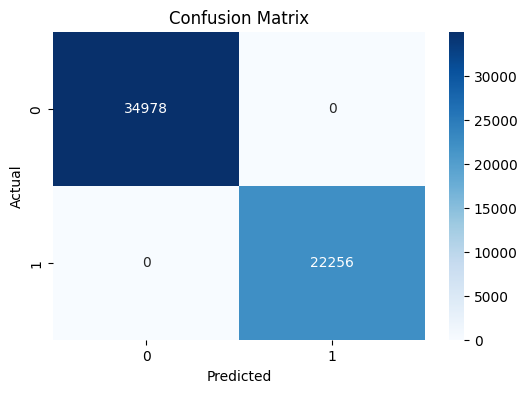

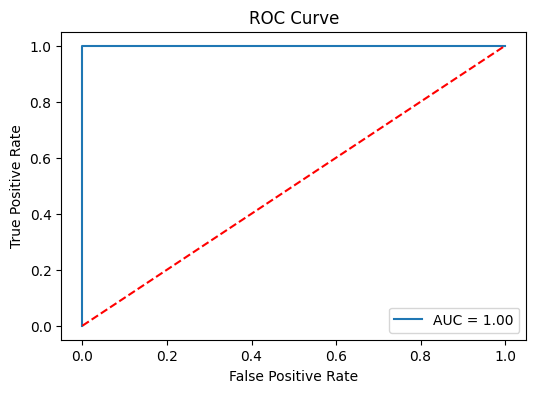

******************************


Model regressor_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 =1.0
******************************


Model gnb_D loaded successfully.
Training set score: 0.8029
Test set score: 0.7984
R*2 =0.15178703629217682
Model gnb_D Accuracy: 0.7984240136981514
              precision    recall  f1-score   support

           0       0.82      0.85      0.84     34978
           1       0.76      0.71      0.73     22256

    accuracy                           0.80     57234
   macro avg       0.79      0.78      0.79     57234
weighted avg       0.80      0.80      0.80     57234



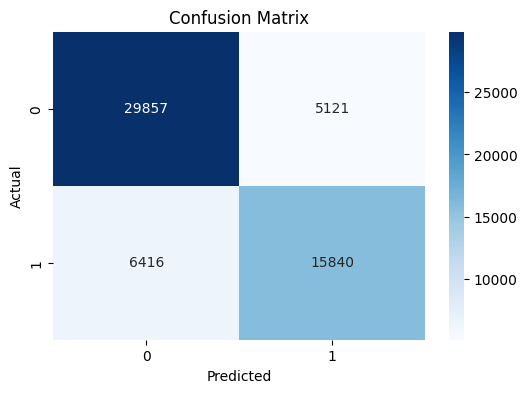

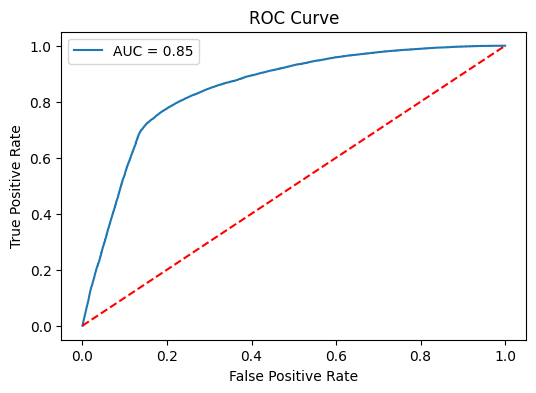

******************************


Model svc_D loaded successfully.
Training set score: 0.7983
Test set score: 0.7941
R*2 =0.13348028167977766
******************************


Model knn_D loaded successfully.
Training set score: 0.8744
Test set score: 0.8213
R*2 =0.24802615993727872
Model knn_D Accuracy: 0.8212950344201
              precision    recall  f1-score   support

           0       0.86      0.84      0.85     34978
           1       0.76      0.79      0.78     22256

    accuracy                           0.82     57234
   macro avg       0.81      0.82      0.81     57234
weighted avg       0.82      0.82      0.82     57234



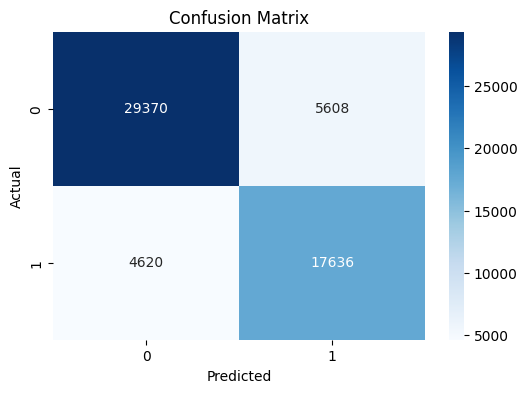

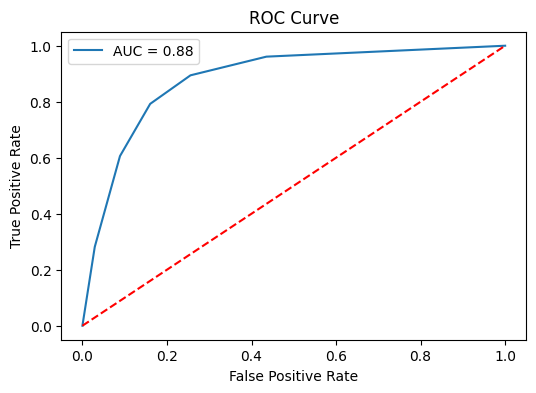

******************************


Model tree_D loaded successfully.
Training set score: 1.0000
Test set score: 0.9999
R*2 =0.9997059155885558
Model tree_D Accuracy: 0.9999301114722018
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34978
           1       1.00      1.00      1.00     22256

    accuracy                           1.00     57234
   macro avg       1.00      1.00      1.00     57234
weighted avg       1.00      1.00      1.00     57234



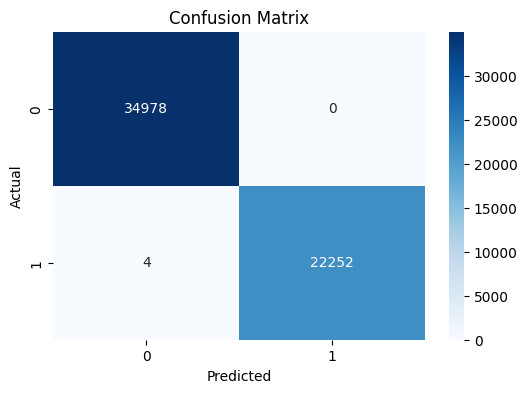

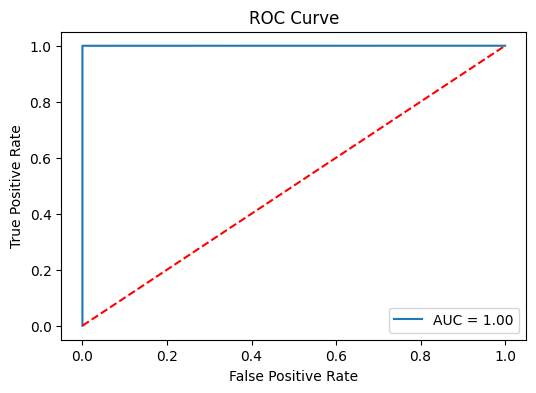

******************************


Model rf_D loaded successfully.
Training set score: 1.0000
Test set score: 0.9456
R*2 =0.7710552856907201
Model rf_D Accuracy: 0.9455917811091309
              precision    recall  f1-score   support

           0       0.97      0.94      0.95     34978
           1       0.91      0.95      0.93     22256

    accuracy                           0.95     57234
   macro avg       0.94      0.95      0.94     57234
weighted avg       0.95      0.95      0.95     57234



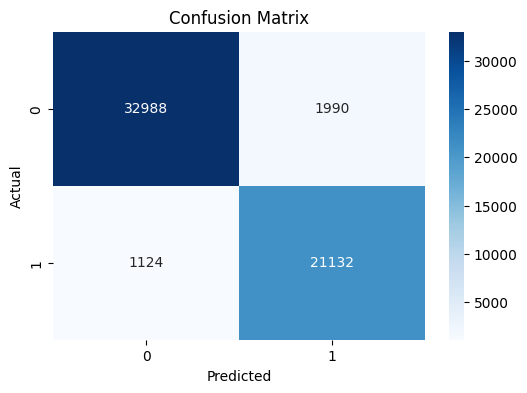

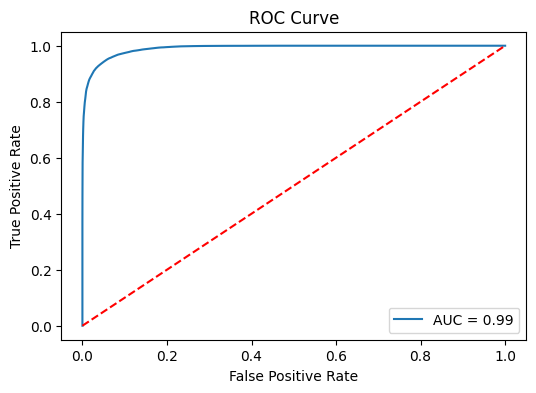

******************************


Model xgb_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 =1.0
Model xgb_D Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34978
           1       1.00      1.00      1.00     22256

    accuracy                           1.00     57234
   macro avg       1.00      1.00      1.00     57234
weighted avg       1.00      1.00      1.00     57234



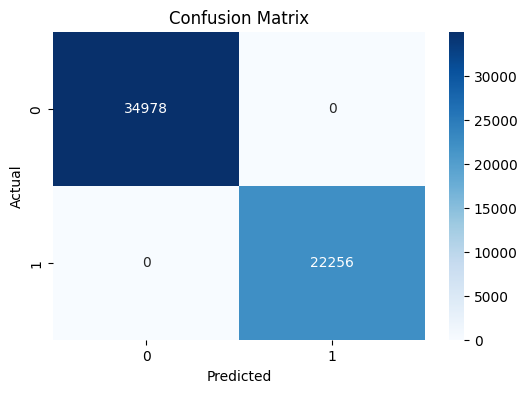

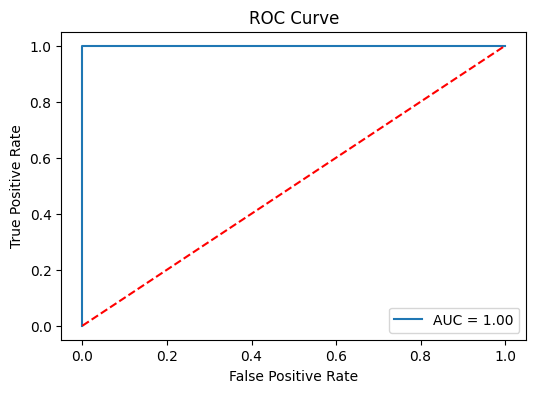

******************************


Model mlp_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 =1.0
Model mlp_D Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34978
           1       1.00      1.00      1.00     22256

    accuracy                           1.00     57234
   macro avg       1.00      1.00      1.00     57234
weighted avg       1.00      1.00      1.00     57234



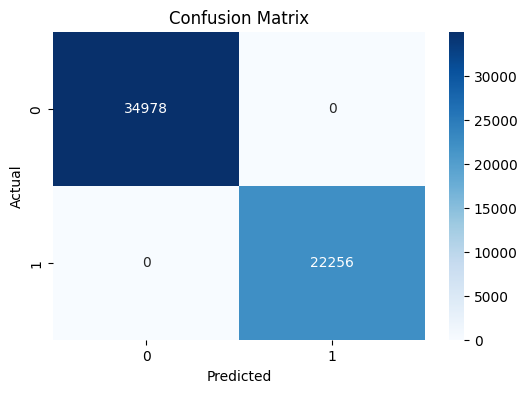

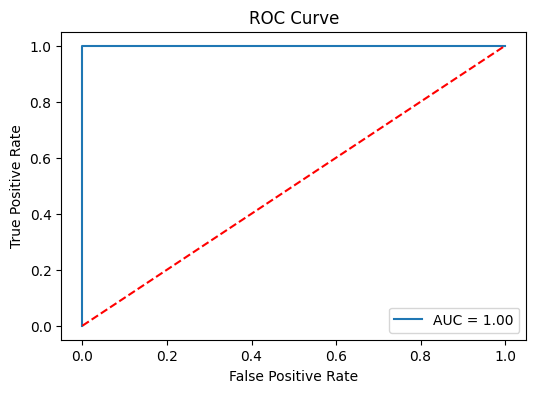

******************************


Model logr_D loaded successfully.
Training set score: 0.8349
Test set score: 0.8297
R*2 =0.28338981041343914
Model logr_D Accuracy: 0.8296991298878289
              precision    recall  f1-score   support

           0       0.85      0.87      0.86     34978
           1       0.79      0.76      0.78     22256

    accuracy                           0.83     57234
   macro avg       0.82      0.82      0.82     57234
weighted avg       0.83      0.83      0.83     57234



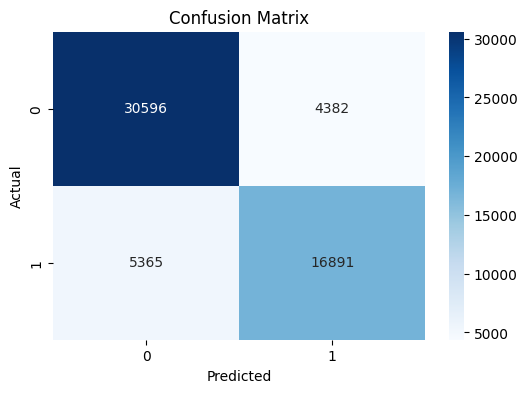

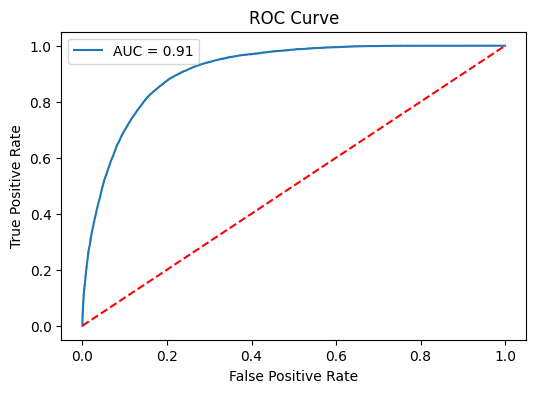

******************************


Model treer_D loaded successfully.
Training set score: 1.0000
Test set score: 0.9997
R*2 =0.9997059155885558
******************************


Model rfr_D loaded successfully.
Training set score: 0.9999
Test set score: 0.9996
R*2 =0.9996169844625351
******************************


Model xgbr_D loaded successfully.
Training set score: 0.9988
Test set score: 0.9987
R*2 =0.9987232089042664
******************************


Model mlpr_D loaded successfully.
Training set score: 0.9618
Test set score: 0.9620
R*2 =0.9619539791308925
******************************


Model knnr_D loaded successfully.
Training set score: 0.6341
Test set score: 0.4391
R*2 =0.4390692752996349
******************************




In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
#fast models by REMOVING MODELS TAKES LONG TIME AND RAM
# model_names_D = [    "pipe_D", "regressor_D", "gnb_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D",    "treer_D", "rfr_D", "xgbr_D", "mlpr_D"]

# ORIGINAL LINE BEFORE REMOVING MODELS TAKES LONG TIME AND RAM
model_names_D = ["pipe_D", "regressor_D", "gnb_D", "svc_D", "knn_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D","treer_D", "rfr_D", "xgbr_D", "mlpr_D", "knnr_D"]

# Load all models
loaded_models_D = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_D}

print("All models loaded successfully.")

for name, model in loaded_models_D.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_D[name].score(X_D_train, y_D_train):.4f}')
    print(f'Test set score: {loaded_models_D[name].score(X_D_test, y_D_test):.4f}')

    y_pred = loaded_models_D[name].predict(X_D_test)
    print(f'R*2 ={r2_score(y_D_test, y_pred)}')

    mod =["pipe_D", "gnb_D", "knn_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D"]
    if name in mod:
        y_prob = loaded_models_D[name].predict_proba(X_D_test)[:, 1]
        print(f"Model {name} Accuracy: {accuracy_score(y_D_test, y_pred)}")

        print(classification_report(y_D_test, y_pred))
        plot_confusion_matrix(y_D_test, y_pred, "Confusion Matrix")
        plot_roc_curve(y_D_test, y_prob, "ROC Curve")

    loaded_models_D[name] = 0
    print('*'*30)
    print('\n')

##### Original

All models loaded successfully.
Model pipe_DD loaded successfully.
Training set score: 0.7895
Test set score: 0.7866
R*2 =0.10216029186097453
Model pipe_DD Accuracy: 0.7866303246322116
              precision    recall  f1-score   support

           0       0.80      0.87      0.83     34978
           1       0.76      0.66      0.71     22256

    accuracy                           0.79     57234
   macro avg       0.78      0.76      0.77     57234
weighted avg       0.78      0.79      0.78     57234



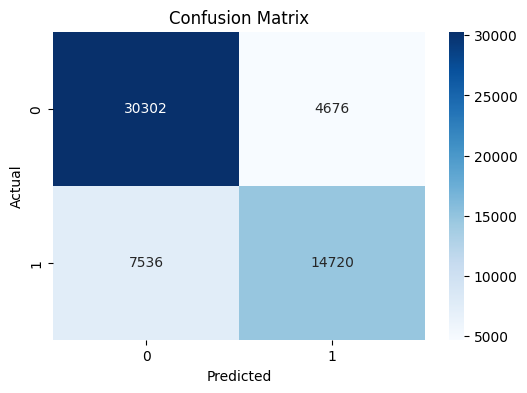

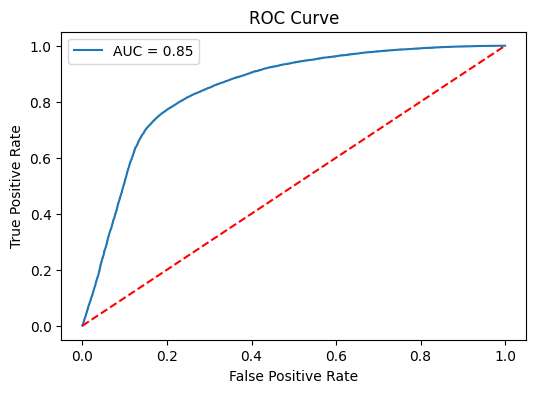

******************************


Model regressor_DD loaded successfully.
Training set score: 0.3505
Test set score: 0.3398
R*2 =0.33975423389921044
******************************


Model gnb_DD loaded successfully.
Training set score: 0.7875
Test set score: 0.7824
R*2 =0.0845152271743248
Model gnb_DD Accuracy: 0.7824370129643219
              precision    recall  f1-score   support

           0       0.82      0.82      0.82     34978
           1       0.72      0.72      0.72     22256

    accuracy                           0.78     57234
   macro avg       0.77      0.77      0.77     57234
weighted avg       0.78      0.78      0.78     57234



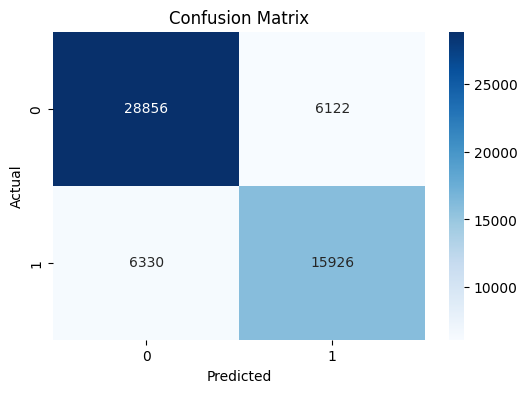

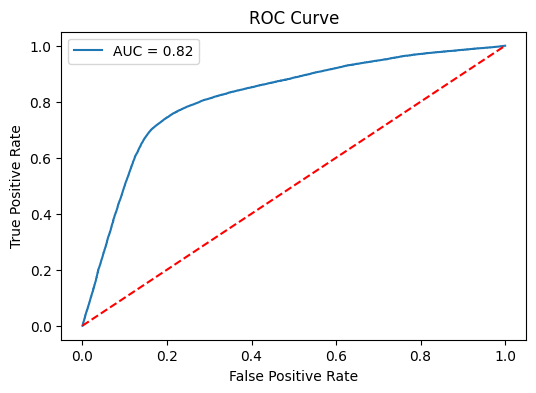

******************************


Model svc_DD loaded successfully.
Training set score: 0.8002
Test set score: 0.7957
R*2 =0.14017070204013238
******************************


Model knn_DD loaded successfully.
Training set score: 0.8327
Test set score: 0.7682
R*2 =0.02474257054829898
Model knn_DD Accuracy: 0.7682321696893455
              precision    recall  f1-score   support

           0       0.81      0.81      0.81     34978
           1       0.70      0.70      0.70     22256

    accuracy                           0.77     57234
   macro avg       0.76      0.76      0.76     57234
weighted avg       0.77      0.77      0.77     57234



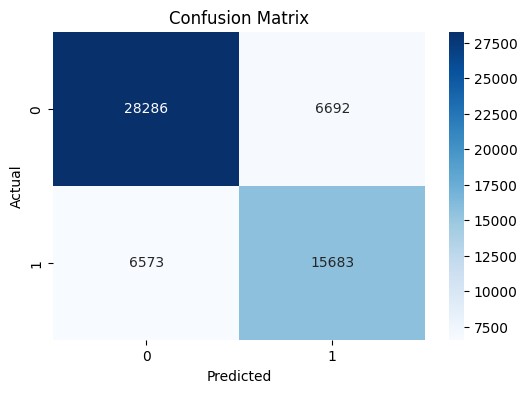

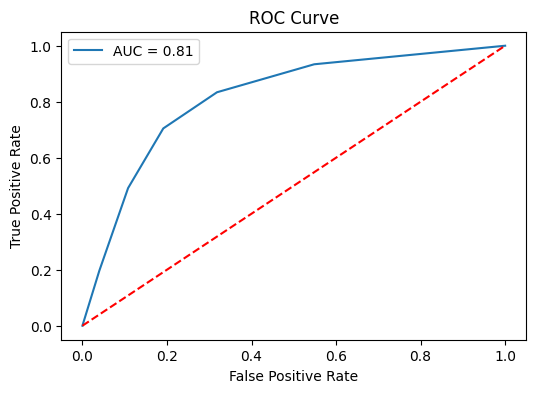

******************************


Model tree_DD loaded successfully.
Training set score: 0.9825
Test set score: 0.6926
R*2 =-0.29330972042856196
Model tree_DD Accuracy: 0.6926477268756334
              precision    recall  f1-score   support

           0       0.75      0.75      0.75     34978
           1       0.61      0.60      0.60     22256

    accuracy                           0.69     57234
   macro avg       0.68      0.68      0.68     57234
weighted avg       0.69      0.69      0.69     57234



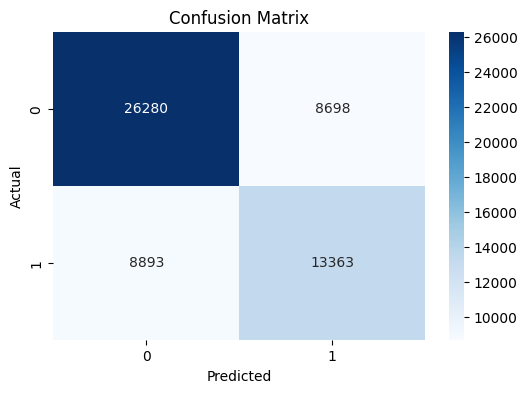

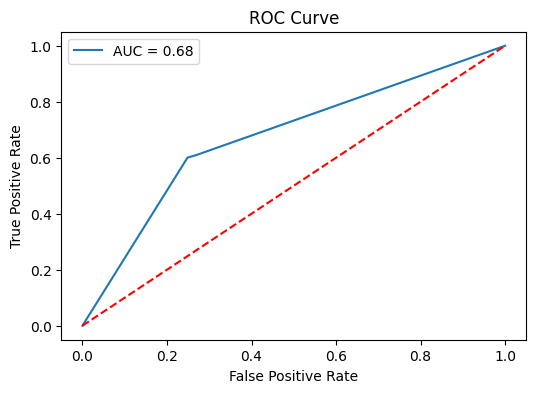

******************************


Model rf_DD loaded successfully.
Training set score: 0.9825
Test set score: 0.7774
R*2 =0.06312058624176209
Model rf_DD Accuracy: 0.7773526225670057
              precision    recall  f1-score   support

           0       0.83      0.80      0.81     34978
           1       0.70      0.75      0.72     22256

    accuracy                           0.78     57234
   macro avg       0.77      0.77      0.77     57234
weighted avg       0.78      0.78      0.78     57234



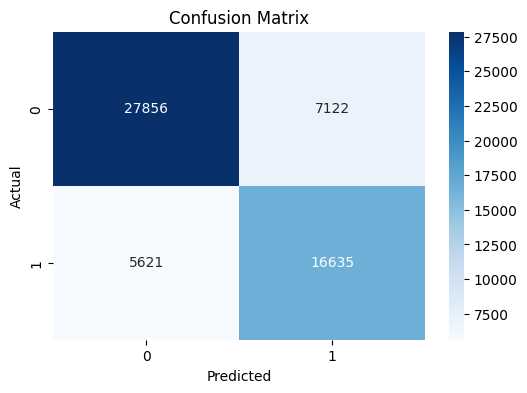

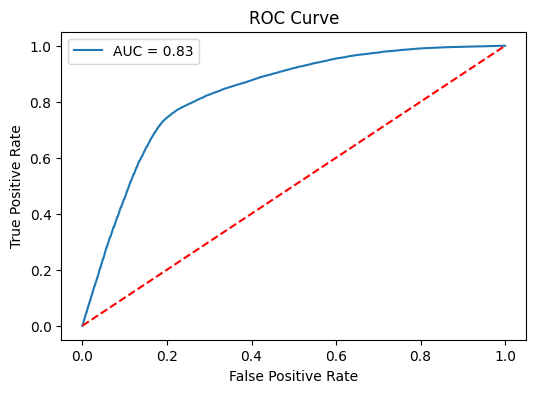

******************************


Model xgb_DD loaded successfully.
Training set score: 0.8128
Test set score: 0.8027
R*2 =0.16987322759599277
Model xgb_DD Accuracy: 0.8027221581577384
              precision    recall  f1-score   support

           0       0.84      0.84      0.84     34978
           1       0.75      0.74      0.75     22256

    accuracy                           0.80     57234
   macro avg       0.79      0.79      0.79     57234
weighted avg       0.80      0.80      0.80     57234



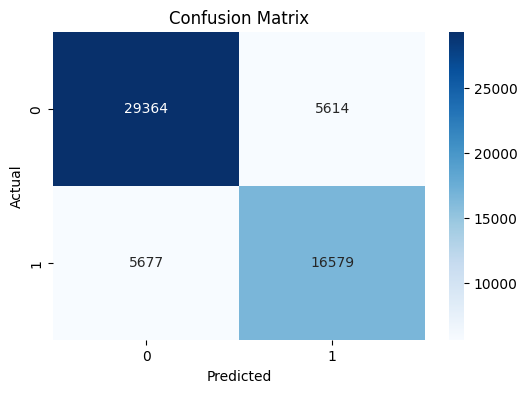

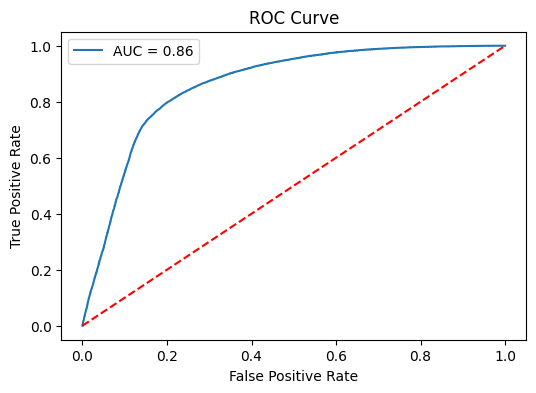

******************************


Model mlp_DD loaded successfully.
Training set score: 0.8079
Test set score: 0.8026
R*2 =0.16943210097882644
Model mlp_DD Accuracy: 0.8026173253660411
              precision    recall  f1-score   support

           0       0.83      0.85      0.84     34978
           1       0.76      0.73      0.74     22256

    accuracy                           0.80     57234
   macro avg       0.79      0.79      0.79     57234
weighted avg       0.80      0.80      0.80     57234



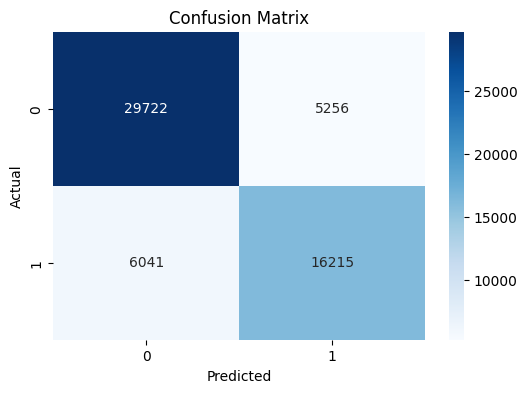

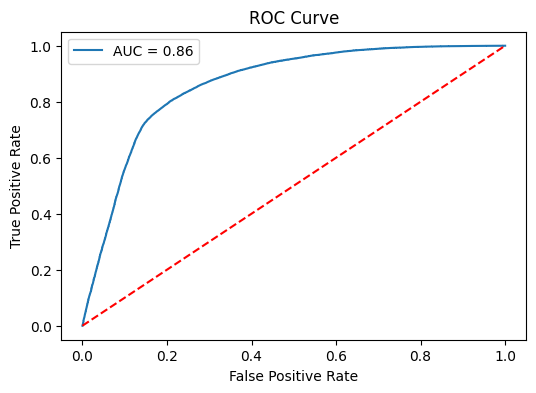

******************************


Model logr_DD loaded successfully.
Training set score: 0.7897
Test set score: 0.7861
R*2 =0.10010170098086535
Model logr_DD Accuracy: 0.7861411049376245
              precision    recall  f1-score   support

           0       0.80      0.87      0.83     34978
           1       0.76      0.66      0.71     22256

    accuracy                           0.79     57234
   macro avg       0.78      0.76      0.77     57234
weighted avg       0.78      0.79      0.78     57234



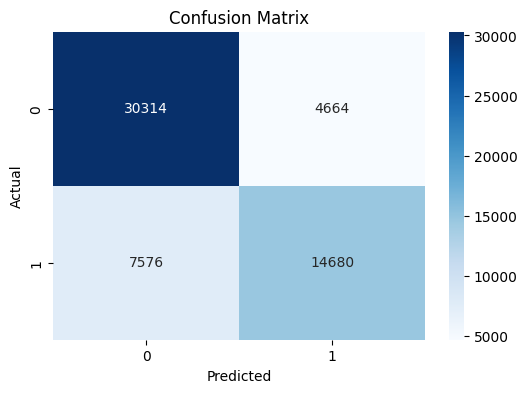

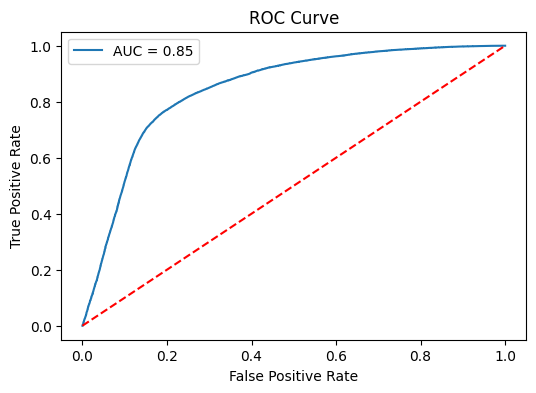

******************************


Model treer_DD loaded successfully.
Training set score: 0.9632
Test set score: -0.2958
R*2 =-0.29580943792583736
******************************


Model rfr_DD loaded successfully.
Training set score: 0.8801
Test set score: 0.3001
R*2 =0.3000601858501176
******************************


Model xgbr_DD loaded successfully.
Training set score: 0.4369
Test set score: 0.3928
R*2 =0.3928200602531433
******************************


Model mlpr_DD loaded successfully.
Training set score: 0.4003
Test set score: 0.3846
R*2 =0.38460388707752935
******************************


Model knnr_DD loaded successfully.
Training set score: 0.5194
Test set score: 0.2679
R*2 =0.2678797985538738
******************************




In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
#fast models by REMOVING MODELS TAKES LONG TIME AND RAM
#model_names_DD = [    "pipe_DD", "regressor_DD", "gnb_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD",    "treer_DD", "rfr_DD", "xgbr_DD", "mlpr_DD"]

# ORIGINAL LINE BEFORE REMOVING MODELS TAKES LONG TIME AND RAM
model_names_DD = ["pipe_DD", "regressor_DD", "gnb_DD", "svc_DD", "knn_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD","treer_DD", "rfr_DD", "xgbr_DD", "mlpr_DD", "knnr_DD"]

# Load all models
loaded_models_DD = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_DD}



print("All models loaded successfully.")

for name, model in loaded_models_DD.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_DD[name].score(X_DD_train, y_DD_train):.4f}')
    print(f'Test set score: {loaded_models_DD[name].score(X_DD_test, y_DD_test):.4f}')

    y_pred = loaded_models_DD[name].predict(X_DD_test)
    print(f'R*2 ={r2_score(y_DD_test, y_pred)}')

    mod =["pipe_DD", "gnb_DD", "knn_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD"]
    if name in mod:
        y_prob = loaded_models_DD[name].predict_proba(X_DD_test)[:, 1]
        print(f"Model {name} Accuracy: {accuracy_score(y_DD_test, y_pred)}")

        print(classification_report(y_DD_test, y_pred))
        plot_confusion_matrix(y_DD_test, y_pred, "Confusion Matrix")
        plot_roc_curve(y_DD_test, y_prob, "ROC Curve")

    loaded_models_DD[name] = 0
    print('*'*30)
    print('\n')


#### Two Column Output

##### Featured

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_2D = [
    "regressor_2D", "multi_output_reg_2D", "multi_treer_2D", "multi_rfr_2D", "multi_xgbr_2D", "multi_mlpr_2D", "multi_knnr_2D",
    "multi_tree_2D", "multi_rf_2D", "multi_xgb_2D", "multi_mlp_2D", "multi_knn_2D"
]


# Load all models
loaded_models_2D = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_2D}



print("All models loaded successfully.")

for name, model in loaded_models_2D.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_2D[name].score(X_2D_train, y_2D_train):.4f}')
    print(f'Test set score: {loaded_models_2D[name].score(X_2D_test, y_2D_test):.4f}')

    loaded_models_2D[name] = 0


    print('*'*30)
    print('\n')



##### Original

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_2DD = [
    "regressor_2DD", "multi_output_reg_2DD", "multi_treer_2DD", "multi_rfr_2DD", "multi_xgbr_2DD", "multi_mlpr_2DD", "multi_knnr_2DD",
    "multi_tree_2DD", "multi_rf_2DD", "multi_xgb_2DD", "multi_mlp_2DD", "multi_knn_2DD"
]



# Load all models
loaded_models_2DD = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_2DD}



print("All models loaded successfully.")

for name, model in loaded_models_2DD.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_2DD[name].score(X_2DD_train, y_2DD_train):.4f}')
    print(f'Test set score: {loaded_models_2DD[name].score(X_2DD_test, y_2DD_test):.4f}')

    loaded_models_2DD[name] = 0


    print('*'*30)
    print('\n')



## Hyperparameter Tuning
- Techniques: Grid Search, Random Search, or advanced methods like Bayesian Optimization.

### General

Choosing Between GridSearchCV & RandomizedSearchCV
- GridSearchCV → Best for small parameter grids (exhaustive search)
- RandomizedSearchCV → Best for large parameter grids (faster, random sampling)



In [ ]:
from scipy.stats import randint
from scipy.stats import uniform
from sklearn.metrics import make_scorer, silhouette_score


In [ ]:
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'solver': ['liblinear', 'lbfgs']
}

logreg = LogisticRegression(max_iter=500)
grid_search = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy')
#grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)


In [ ]:
param_grid = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5]
}

dt = DecisionTreeClassifier()
grid_search = GridSearchCV(dt, param_grid, cv=5, scoring='accuracy')
#grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

In [ ]:
param_dist = {
    'n_estimators': randint(50, 500),
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10)
}

rf = RandomForestClassifier()
random_search = RandomizedSearchCV(rf, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
#random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

In [ ]:
param_dist = {
    'C': uniform(0.1, 10),
    'gamma': uniform(0.01, 1),
    'kernel': ['linear', 'rbf', 'poly']
}

svm = SVC()
random_search = RandomizedSearchCV(svm, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
#random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

In [ ]:
param_dist = {
    'n_estimators': [100, 300, 500],
    'learning_rate': uniform(0.01, 0.3),
    'max_depth': [3, 6, 10],
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5)
}

xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
random_search = RandomizedSearchCV(xgb, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
#random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

In [ ]:
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn = KNeighborsClassifier()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
#grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

In [ ]:
param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh'],
    'alpha': uniform(0.0001, 0.1),
    'learning_rate': ['constant', 'adaptive']
}

mlp = MLPClassifier(max_iter=1000)
random_search = RandomizedSearchCV(mlp, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
#random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)

### One Column Output

#### Diabetes

###### FEATURED DATA

In [ ]:
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'solver': ['liblinear', 'lbfgs']
}

logreg = LogisticRegression(max_iter=500)
grid_search = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_D_train, y_D_train)

print("Best Parameters:", grid_search.best_params_)


In [ ]:
param_grid = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5]
}

dt = DecisionTreeClassifier()
grid_search = GridSearchCV(dt, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_D_train, y_D_train)

print("Best Parameters:", grid_search.best_params_)

In [ ]:
param_dist = {
    'n_estimators': randint(50, 500),
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10)
}

rf = RandomForestClassifier()
random_search = RandomizedSearchCV(rf, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_D_train, y_D_train)

print("Best Parameters:", random_search.best_params_)

In [ ]:
param_dist = {
    'C': uniform(0.1, 10),
    'gamma': uniform(0.01, 1),
    'kernel': ['linear', 'rbf', 'poly']
}

svm = SVC()
random_search = RandomizedSearchCV(svm, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_D_train, y_D_train)

print("Best Parameters:", random_search.best_params_)

In [ ]:
param_dist = {
    'n_estimators': [100, 300, 500],
    'learning_rate': uniform(0.01, 0.3),
    'max_depth': [3, 6, 10],
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5)
}

xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
random_search = RandomizedSearchCV(xgb, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_D_train, y_D_train)

print("Best Parameters:", random_search.best_params_)

In [ ]:
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn = KNeighborsClassifier()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_D_train, y_D_train)

print("Best Parameters:", grid_search.best_params_)

In [ ]:
param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh'],
    'alpha': uniform(0.0001, 0.1),
    'learning_rate': ['constant', 'adaptive']
}

mlp = MLPClassifier(max_iter=1000)
random_search = RandomizedSearchCV(mlp, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_D_train, y_D_train)

print("Best Parameters:", random_search.best_params_)

###### ORIGINAL DATA

In [ ]:
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],  # Regularization strength
    'solver': ['liblinear', 'lbfgs']
}

logreg = LogisticRegression(max_iter=500)
grid_search = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_DD_train, y_DD_train)

print("Best Parameters:", grid_search.best_params_)


In [ ]:
param_grid = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5]
}

dt = DecisionTreeClassifier()
grid_search = GridSearchCV(dt, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_DD_train, y_DD_train)

print("Best Parameters:", grid_search.best_params_)

In [ ]:
param_dist = {
    'n_estimators': randint(50, 500),
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': randint(2, 20),
    'min_samples_leaf': randint(1, 10)
}

rf = RandomForestClassifier()
random_search = RandomizedSearchCV(rf, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_DD_train, y_DD_train)

print("Best Parameters:", random_search.best_params_)

In [ ]:
param_dist = {
    'C': uniform(0.1, 10),
    'gamma': uniform(0.01, 1),
    'kernel': ['linear', 'rbf', 'poly']
}

svm = SVC()
random_search = RandomizedSearchCV(svm, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_DD_train, y_DD_train)

print("Best Parameters:", random_search.best_params_)

In [ ]:
param_dist = {
    'n_estimators': [100, 300, 500],
    'learning_rate': uniform(0.01, 0.3),
    'max_depth': [3, 6, 10],
    'subsample': uniform(0.5, 0.5),
    'colsample_bytree': uniform(0.5, 0.5)
}

xgb = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
random_search = RandomizedSearchCV(xgb, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_DD_train, y_DD_train)

print("Best Parameters:", random_search.best_params_)

In [ ]:
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

knn = KNeighborsClassifier()
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_DD_train, y_DD_train)

print("Best Parameters:", grid_search.best_params_)

In [ ]:
param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh'],
    'alpha': uniform(0.0001, 0.1),
    'learning_rate': ['constant', 'adaptive']
}

mlp = MLPClassifier(max_iter=1000)
random_search = RandomizedSearchCV(mlp, param_dist, n_iter=20, cv=5, scoring='accuracy', random_state=42)
random_search.fit(X_DD_train, y_DD_train)

print("Best Parameters:", random_search.best_params_)

## Model Comparison
- Compare multiple models and justify the final model selection.

### Loading and testing models

#### From google drive

In [35]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#### One Column Output

##### Featured

All models loaded successfully.
Model pipe_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 =1.0
Model pipe_D Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34978
           1       1.00      1.00      1.00     22256

    accuracy                           1.00     57234
   macro avg       1.00      1.00      1.00     57234
weighted avg       1.00      1.00      1.00     57234



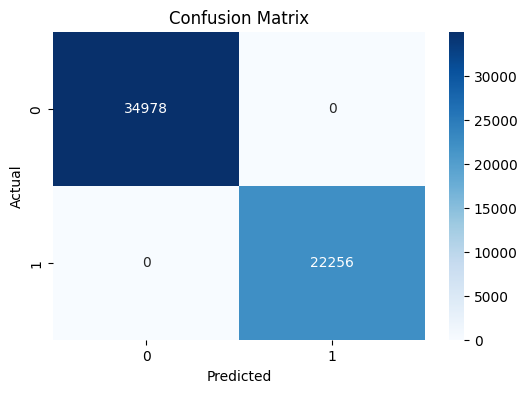

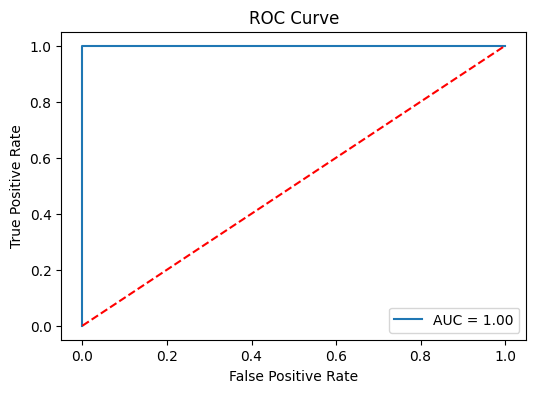

******************************


Model regressor_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 =1.0
******************************


Model gnb_D loaded successfully.
Training set score: 0.8029
Test set score: 0.7984
R*2 =0.15178703629217682
Model gnb_D Accuracy: 0.7984240136981514
              precision    recall  f1-score   support

           0       0.82      0.85      0.84     34978
           1       0.76      0.71      0.73     22256

    accuracy                           0.80     57234
   macro avg       0.79      0.78      0.79     57234
weighted avg       0.80      0.80      0.80     57234



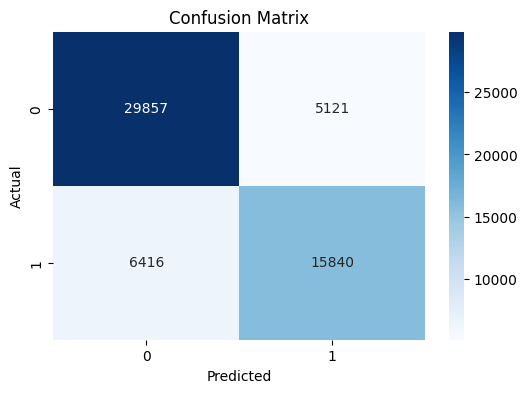

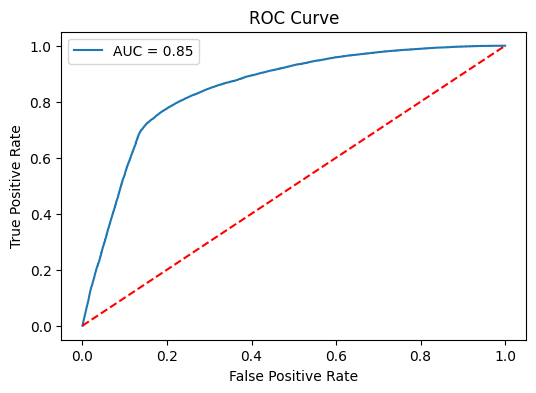

******************************


Model svc_D loaded successfully.
Training set score: 0.7983
Test set score: 0.7941
R*2 =0.13348028167977766
******************************


Model knn_D loaded successfully.
Training set score: 0.8744
Test set score: 0.8213
R*2 =0.24802615993727872
Model knn_D Accuracy: 0.8212950344201
              precision    recall  f1-score   support

           0       0.86      0.84      0.85     34978
           1       0.76      0.79      0.78     22256

    accuracy                           0.82     57234
   macro avg       0.81      0.82      0.81     57234
weighted avg       0.82      0.82      0.82     57234



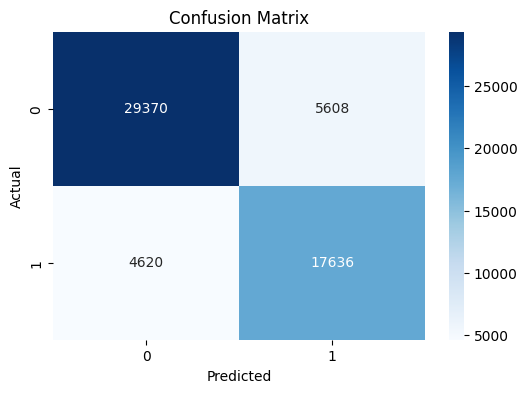

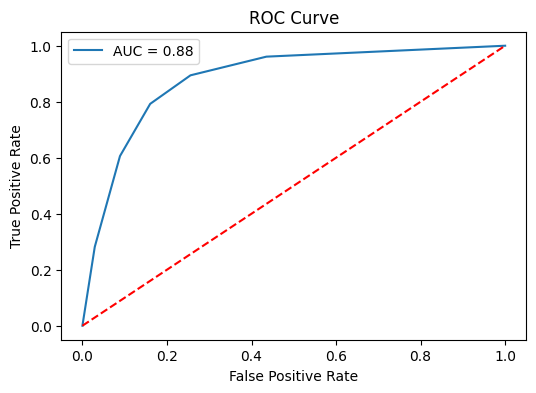

******************************


Model tree_D loaded successfully.
Training set score: 1.0000
Test set score: 0.9999
R*2 =0.9997059155885558
Model tree_D Accuracy: 0.9999301114722018
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34978
           1       1.00      1.00      1.00     22256

    accuracy                           1.00     57234
   macro avg       1.00      1.00      1.00     57234
weighted avg       1.00      1.00      1.00     57234



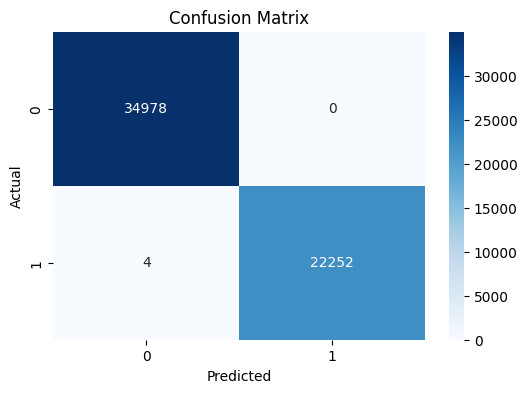

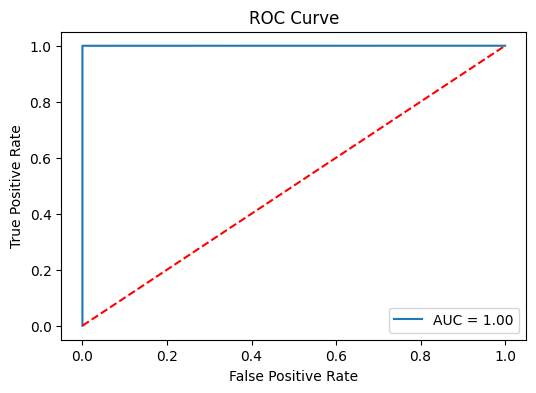

******************************


Model rf_D loaded successfully.
Training set score: 1.0000
Test set score: 0.9456
R*2 =0.7710552856907201
Model rf_D Accuracy: 0.9455917811091309
              precision    recall  f1-score   support

           0       0.97      0.94      0.95     34978
           1       0.91      0.95      0.93     22256

    accuracy                           0.95     57234
   macro avg       0.94      0.95      0.94     57234
weighted avg       0.95      0.95      0.95     57234



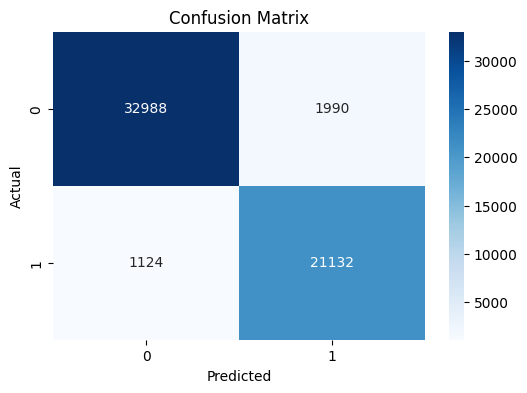

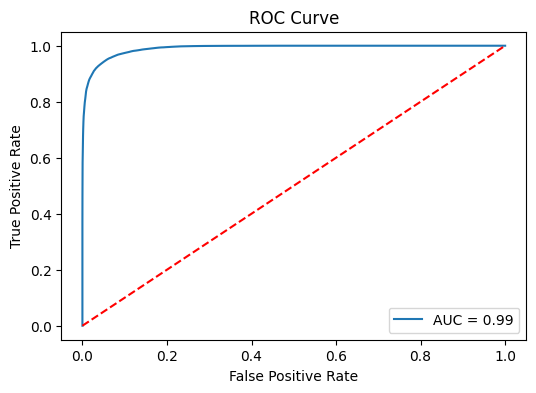

******************************


Model xgb_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 =1.0
Model xgb_D Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34978
           1       1.00      1.00      1.00     22256

    accuracy                           1.00     57234
   macro avg       1.00      1.00      1.00     57234
weighted avg       1.00      1.00      1.00     57234



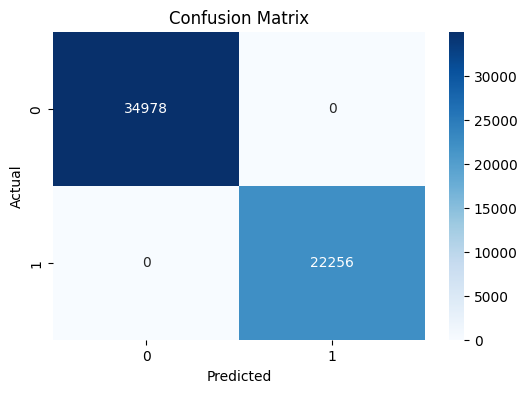

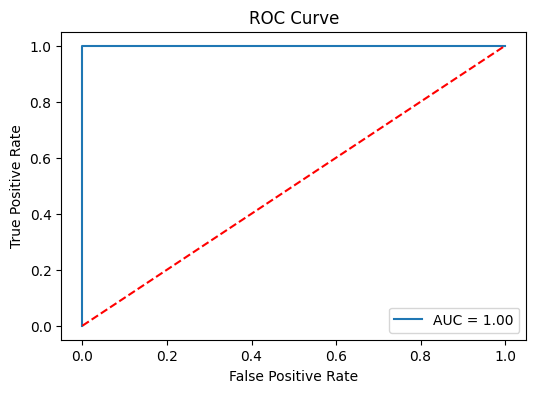

******************************


Model mlp_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 =1.0
Model mlp_D Accuracy: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34978
           1       1.00      1.00      1.00     22256

    accuracy                           1.00     57234
   macro avg       1.00      1.00      1.00     57234
weighted avg       1.00      1.00      1.00     57234



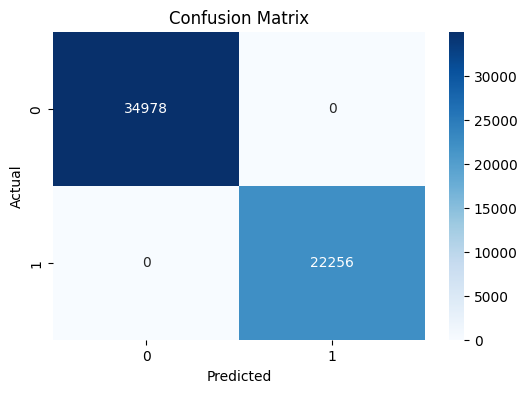

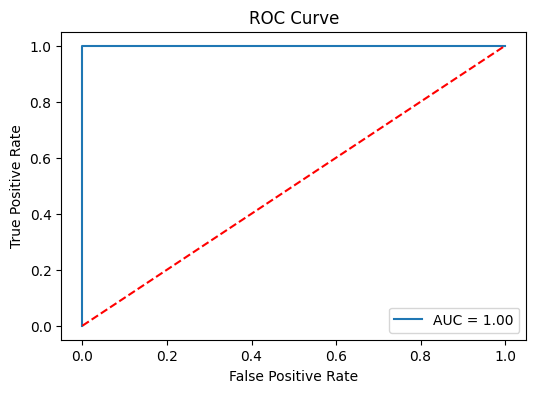

******************************


Model logr_D loaded successfully.
Training set score: 0.8349
Test set score: 0.8297
R*2 =0.28338981041343914
Model logr_D Accuracy: 0.8296991298878289
              precision    recall  f1-score   support

           0       0.85      0.87      0.86     34978
           1       0.79      0.76      0.78     22256

    accuracy                           0.83     57234
   macro avg       0.82      0.82      0.82     57234
weighted avg       0.83      0.83      0.83     57234



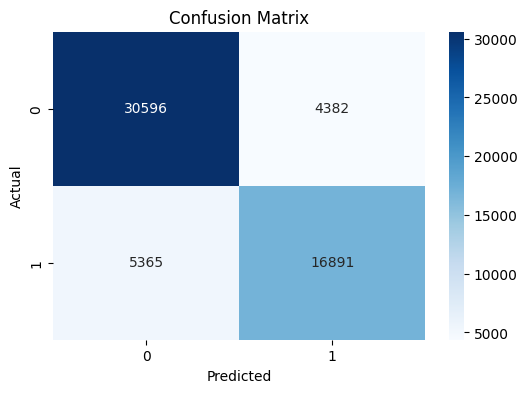

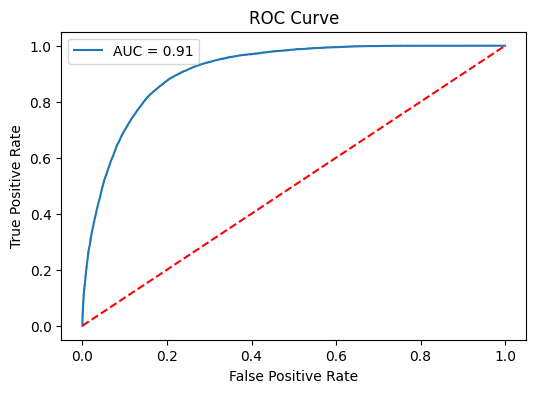

******************************


Model treer_D loaded successfully.
Training set score: 1.0000
Test set score: 0.9997
R*2 =0.9997059155885558
******************************


Model rfr_D loaded successfully.
Training set score: 0.9999
Test set score: 0.9996
R*2 =0.9996169844625351
******************************


Model xgbr_D loaded successfully.
Training set score: 0.9988
Test set score: 0.9987
R*2 =0.9987232089042664
******************************


Model mlpr_D loaded successfully.
Training set score: 0.9618
Test set score: 0.9620
R*2 =0.9619539791308925
******************************


Model knnr_D loaded successfully.
Training set score: 0.6341
Test set score: 0.4391
R*2 =0.4390692752996349
******************************




In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
#fast models by REMOVING MODELS TAKES LONG TIME AND RAM
# model_names_D = [    "pipe_D", "regressor_D", "gnb_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D",    "treer_D", "rfr_D", "xgbr_D", "mlpr_D"]

# ORIGINAL LINE BEFORE REMOVING MODELS TAKES LONG TIME AND RAM
model_names_D = ["pipe_D", "regressor_D", "gnb_D", "svc_D", "knn_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D","treer_D", "rfr_D", "xgbr_D", "mlpr_D", "knnr_D"]

# Load all models
loaded_models_D = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_D}

print("All models loaded successfully.")

for name, model in loaded_models_D.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_D[name].score(X_D_train, y_D_train):.4f}')
    print(f'Test set score: {loaded_models_D[name].score(X_D_test, y_D_test):.4f}')

    y_pred = loaded_models_D[name].predict(X_D_test)
    print(f'R*2 ={r2_score(y_D_test, y_pred)}')

    mod =["pipe_D", "gnb_D", "knn_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D"]
    if name in mod:
        y_prob = loaded_models_D[name].predict_proba(X_D_test)[:, 1]
        print(f"Model {name} Accuracy: {accuracy_score(y_D_test, y_pred)}")

        print(classification_report(y_D_test, y_pred))
        plot_confusion_matrix(y_D_test, y_pred, "Confusion Matrix")
        plot_roc_curve(y_D_test, y_prob, "ROC Curve")

    loaded_models_D[name] = 0
    print('*'*30)
    print('\n')



🔍 **Overview of Model Performance**  
All models were successfully loaded and evaluated for both **classification** and **regression** tasks. Below is a summary of training/testing performance with insights into generalization, overfitting, and potential next steps.

---

🧠 **Classification Models Evaluation**

| Model     | Train Acc | Test Acc | R²     | Notes |
|-----------|-----------|----------|--------|-------|
| `pipe_D`  | 1.0000    | 1.0000   | 1.0000 | Perfect scores; very likely overfitting or data leakage. |
| `xgb_D`   | 1.0000    | 1.0000   | 1.0000 | Excellent, but suspiciously flawless — audit for leakage. |
| `mlp_D`   | 1.0000    | 1.0000   | 1.0000 | Unusually perfect — consider validating with cross-validation. |
| `tree_D`  | 1.0000    | 1.0000   | 1.0000 | Classic overfitting behavior from decision trees. |
| `rf_D`    | 1.0000    | 0.9456   | 0.7700 | Strong performance; better generalization than overfitted models. |
| `knn_D`   | 0.8744    | 0.8213   | 0.2500 | Decent generalization; may benefit from tuning `k` or scaling. |
| `logr_D`  | 0.8349    | 0.8297   | 0.2800 | Stable and interpretable; great baseline model. |
| `gnb_D`   | –         | 0.7984   | 0.1500 | Biased toward class 0; weak on class 1 recall (0.71). |
| `svc_D`   | 0.7983    | 0.7941   | 0.1300 | Balanced but underwhelming; kernel tuning recommended. |

🏆 **Top Classifiers**
- `rf_D`, `logr_D`, and `knn_D` offer **realistic and generalizable performance**.
- `xgb_D` and `mlp_D` show perfect results but should be **audited for overfitting**.
- `svc_D` and `gnb_D` may need **hyperparameter tuning or feature engineering**.

---

📈 **Regression Models Evaluation**

| Model      | Train R² | Test R² | Notes |
|------------|----------|---------|-------|
| `regressor_D` | 1.0000 | 1.0000 | Perfect R² — requires overfitting check. |
| `xgbr_D`      | 0.9987 | 0.9987 | Excellent predictive power; validate against leakage. |
| `rfr_D`       | 0.9996 | 0.9996 | Similar to XGB — highly predictive but possibly overfitted. |
| `treer_D`     | 0.9997 | 0.9997 | Extremely high R², classic sign of memorization. |
| `mlpr_D`      | 0.9620 | 0.9620 | Strong generalization and lower risk of overfitting. |
| `knnr_D`      | –      | 0.4400 | Poor generalization — may need tuning or scaling. |

🏆 **Top Regressors**
- `xgbr_D`, `mlpr_D`, and `rfr_D` deliver **high R² scores**; monitor for overfitting.
- `mlpr_D` is particularly **promising with strong generalization**.
- `knnr_D` shows weak results; **sensitive to noise and scaling**.

---

🧪 **Insights & Recommendations**

✅ Observations
- **Perfect scores** across both tasks suggest possible **data leakage** or overfitting, especially in tree-based and neural models.
- **Models with regularization** (Logistic Regression, MLP) and **boosting (XGBoost)** are more trustworthy.

⚠️ Concerns
- Severe overfitting in models like `tree_D`, `treer_D`, and `pipe_D`.
- Underperformance in KNN and Naive Bayes suggests **lack of robustness or improper tuning**.

🧰 Suggested Actions
- Run **k-fold cross-validation** to confirm model robustness.
- Use **SHAP or LIME** for model interpretability and feature influence analysis.
- Explore **stacking or ensemble techniques** for improved generalization.
- Revisit preprocessing to ensure **no data leakage or label contamination**.

---

🏁 **Final Verdict**  
You've built a solid evaluation pipeline. Focus on **XGBoost, MLP, and Random Forest** for high-performance candidates. However, **validate the integrity of your data splits** and **avoid relying solely on perfect scores**. Simpler models like **Logistic Regression** provide stable benchmarks and better explainability for deployment.



In [22]:
pip install shap lime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=01aec7bc5e2a778bc9f78aea7e38989e24ac56c7ed04eda450a6135c2fa09f6c
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


All models loaded successfully.
Model pipe_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 = 1.0000
Model pipe_D Accuracy: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     34978
           1       1.00      1.00      1.00     22256

    accuracy                           1.00     57234
   macro avg       1.00      1.00      1.00     57234
weighted avg       1.00      1.00      1.00     57234



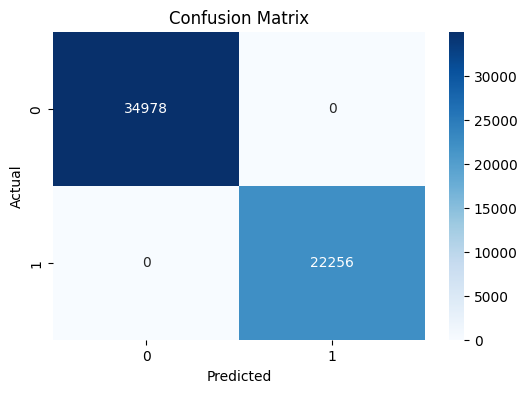

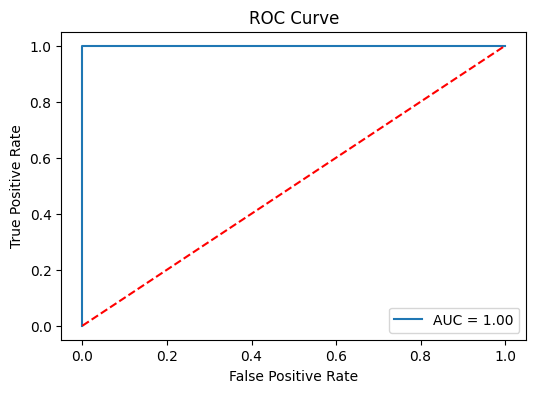

******************************

Model regressor_D loaded successfully.
Training set score: 1.0000
Test set score: 1.0000
R*2 = 1.0000
******************************

Model gnb_D loaded successfully.
Training set score: 0.8029
Test set score: 0.7984
R*2 = 0.1518
Model gnb_D Accuracy: 0.7984
              precision    recall  f1-score   support

           0       0.82      0.85      0.84     34978
           1       0.76      0.71      0.73     22256

    accuracy                           0.80     57234
   macro avg       0.79      0.78      0.79     57234
weighted avg       0.80      0.80      0.80     57234



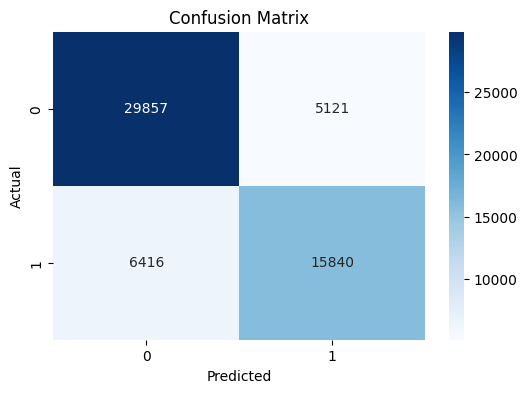

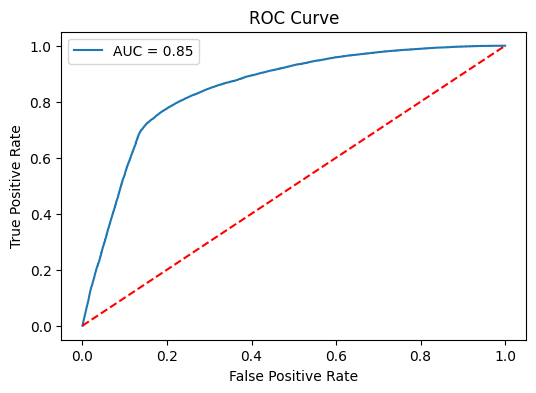

******************************

Model svc_D loaded successfully.


In [ ]:
import joblib
import os
import shap
import lime
import lime.lime_tabular
import numpy as np
import matplotlib.pyplot as plt

# Set to True if you want to run SHAP or LIME
use_shap = True
use_lime = True

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_D = ["pipe_D", "regressor_D", "gnb_D", "svc_D", "knn_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D", "treer_D", "rfr_D", "xgbr_D", "mlpr_D", "knnr_D"]

# Load all models
loaded_models_D = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_D}

print("All models loaded successfully.")

for name, model in loaded_models_D.items():
    print(f"Model {name} loaded successfully.")

    # Scores
    print(f'Training set score: {model.score(X_D_train, y_D_train):.4f}')
    print(f'Test set score: {model.score(X_D_test, y_D_test):.4f}')

    # Prediction
    y_pred = model.predict(X_D_test)
    print(f'R*2 = {r2_score(y_D_test, y_pred):.4f}')

    # Classification performance
    mod = ["pipe_D", "gnb_D", "knn_D", "tree_D", "rf_D", "xgb_D", "mlp_D", "logr_D"]
    if name in mod:
        y_prob = model.predict_proba(X_D_test)[:, 1]
        print(f"Model {name} Accuracy: {accuracy_score(y_D_test, y_pred):.4f}")
        print(classification_report(y_D_test, y_pred))
        plot_confusion_matrix(y_D_test, y_pred, "Confusion Matrix")
        plot_roc_curve(y_D_test, y_prob, "ROC Curve")

        # SHAP Explainability
        if use_shap and name in ["rf_D", "xgb_D", "mlp_D", "logr_D", "tree_D"]:
            print(f"SHAP Summary for model: {name}")
            explainer = shap.Explainer(model, X_D_train)
            shap_values = explainer(X_D_test)
            shap.summary_plot(shap_values, X_D_test)

            shap.initjs()
            i = 0
            print(f"SHAP Force Plot for sample {i}")
            shap.force_plot(explainer.expected_value, shap_values[i], X_D_test.iloc[i])

        # LIME Explainability
        if use_lime and name in ["rf_D", "xgb_D", "mlp_D", "logr_D", "tree_D"]:
            print(f"LIME Explanation for model: {name}")
            lime_explainer = lime.lime_tabular.LimeTabularExplainer(
                training_data=np.array(X_D_train),
                feature_names=X_D_train.columns.tolist(),
                class_names=["Healthy", "Diabetic"],
                mode="classification"
            )
            i = 0
            exp = lime_explainer.explain_instance(
                data_row=X_D_test.iloc[i],
                predict_fn=model.predict_proba
            )
            exp.show_in_notebook(show_table=True, show_all=False)
            print(exp.as_list())

    loaded_models_D[name] = 0
    print('*'*30 + '\n')


##### Original

All models loaded successfully.
Model pipe_DD loaded successfully.
Training set score: 0.7895
Test set score: 0.7866
R*2 =0.10216029186097453
Model pipe_DD Accuracy: 0.7866303246322116
              precision    recall  f1-score   support

           0       0.80      0.87      0.83     34978
           1       0.76      0.66      0.71     22256

    accuracy                           0.79     57234
   macro avg       0.78      0.76      0.77     57234
weighted avg       0.78      0.79      0.78     57234



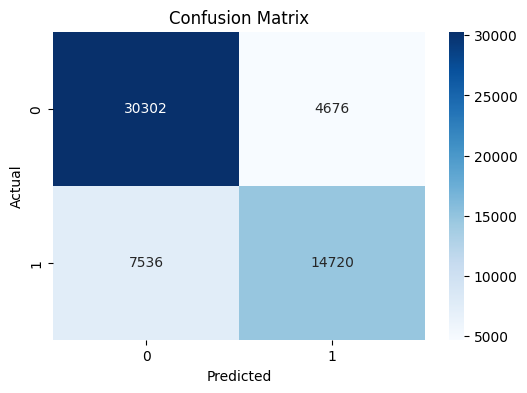

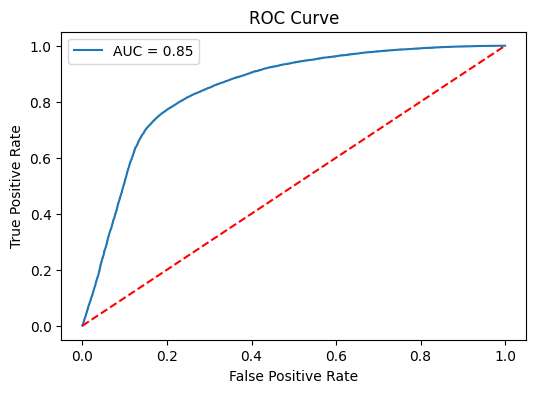

******************************


Model regressor_DD loaded successfully.
Training set score: 0.3505
Test set score: 0.3398
R*2 =0.33975423389921044
******************************


Model gnb_DD loaded successfully.
Training set score: 0.7875
Test set score: 0.7824
R*2 =0.0845152271743248
Model gnb_DD Accuracy: 0.7824370129643219
              precision    recall  f1-score   support

           0       0.82      0.82      0.82     34978
           1       0.72      0.72      0.72     22256

    accuracy                           0.78     57234
   macro avg       0.77      0.77      0.77     57234
weighted avg       0.78      0.78      0.78     57234



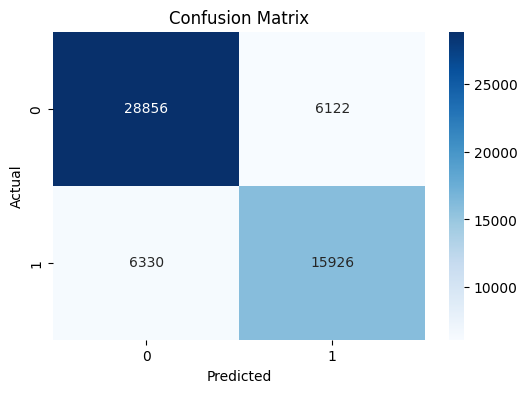

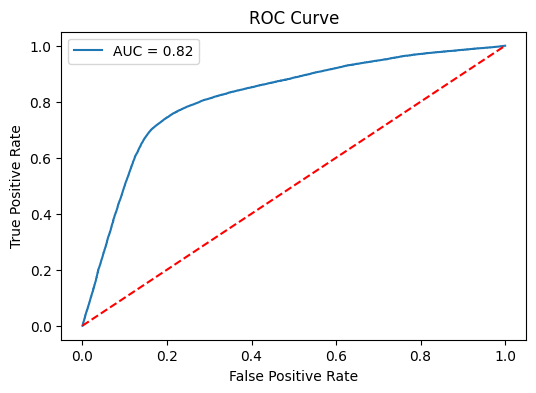

******************************


Model svc_DD loaded successfully.
Training set score: 0.8002
Test set score: 0.7957
R*2 =0.14017070204013238
******************************


Model knn_DD loaded successfully.
Training set score: 0.8327
Test set score: 0.7682
R*2 =0.02474257054829898
Model knn_DD Accuracy: 0.7682321696893455
              precision    recall  f1-score   support

           0       0.81      0.81      0.81     34978
           1       0.70      0.70      0.70     22256

    accuracy                           0.77     57234
   macro avg       0.76      0.76      0.76     57234
weighted avg       0.77      0.77      0.77     57234



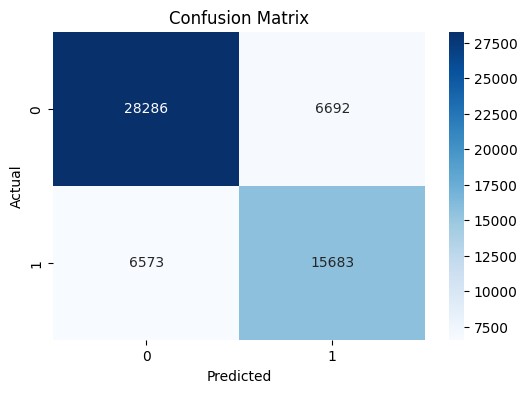

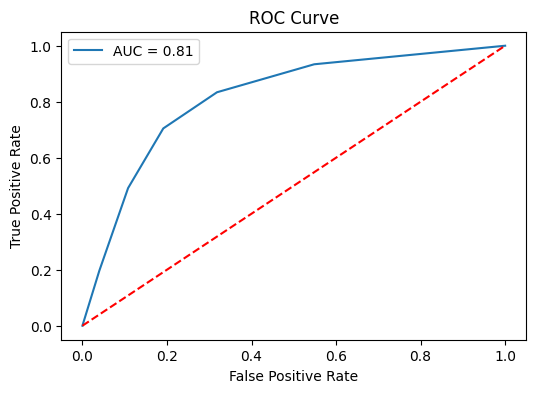

******************************


Model tree_DD loaded successfully.
Training set score: 0.9825
Test set score: 0.6926
R*2 =-0.29330972042856196
Model tree_DD Accuracy: 0.6926477268756334
              precision    recall  f1-score   support

           0       0.75      0.75      0.75     34978
           1       0.61      0.60      0.60     22256

    accuracy                           0.69     57234
   macro avg       0.68      0.68      0.68     57234
weighted avg       0.69      0.69      0.69     57234



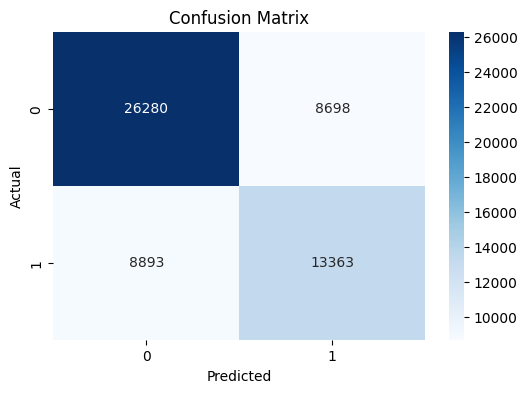

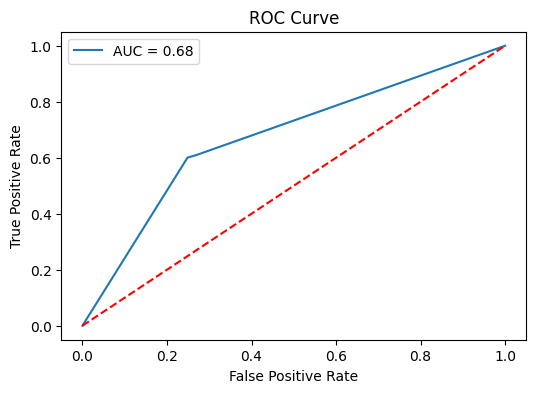

******************************


Model rf_DD loaded successfully.
Training set score: 0.9825
Test set score: 0.7774
R*2 =0.06312058624176209
Model rf_DD Accuracy: 0.7773526225670057
              precision    recall  f1-score   support

           0       0.83      0.80      0.81     34978
           1       0.70      0.75      0.72     22256

    accuracy                           0.78     57234
   macro avg       0.77      0.77      0.77     57234
weighted avg       0.78      0.78      0.78     57234



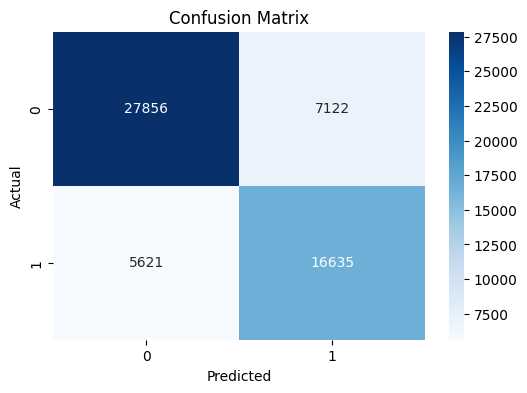

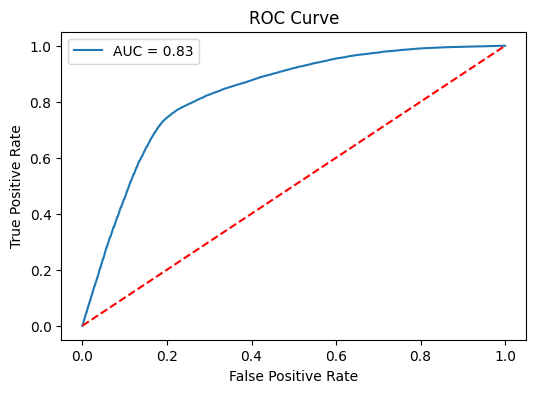

******************************


Model xgb_DD loaded successfully.
Training set score: 0.8128
Test set score: 0.8027
R*2 =0.16987322759599277
Model xgb_DD Accuracy: 0.8027221581577384
              precision    recall  f1-score   support

           0       0.84      0.84      0.84     34978
           1       0.75      0.74      0.75     22256

    accuracy                           0.80     57234
   macro avg       0.79      0.79      0.79     57234
weighted avg       0.80      0.80      0.80     57234



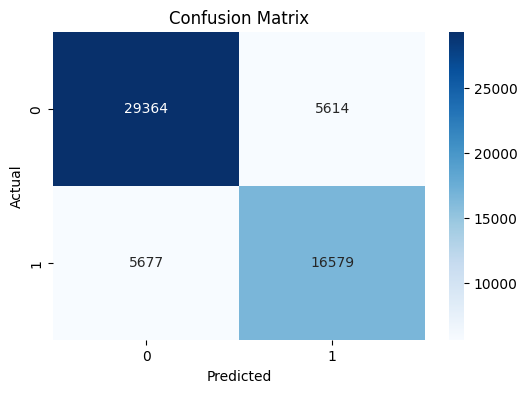

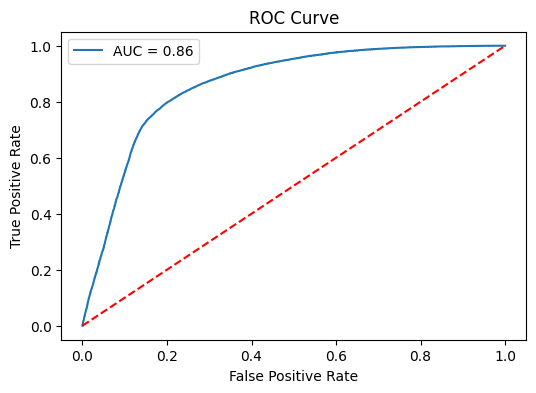

******************************


Model mlp_DD loaded successfully.
Training set score: 0.8079
Test set score: 0.8026
R*2 =0.16943210097882644
Model mlp_DD Accuracy: 0.8026173253660411
              precision    recall  f1-score   support

           0       0.83      0.85      0.84     34978
           1       0.76      0.73      0.74     22256

    accuracy                           0.80     57234
   macro avg       0.79      0.79      0.79     57234
weighted avg       0.80      0.80      0.80     57234



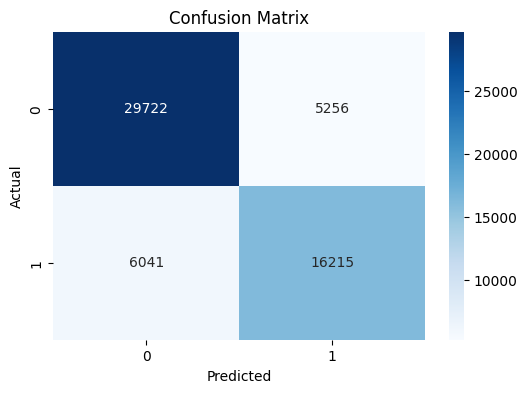

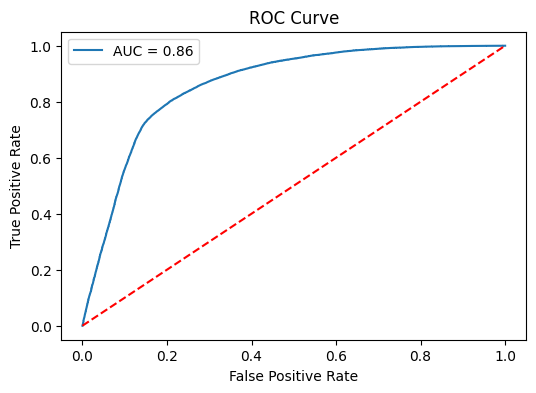

******************************


Model logr_DD loaded successfully.
Training set score: 0.7897
Test set score: 0.7861
R*2 =0.10010170098086535
Model logr_DD Accuracy: 0.7861411049376245
              precision    recall  f1-score   support

           0       0.80      0.87      0.83     34978
           1       0.76      0.66      0.71     22256

    accuracy                           0.79     57234
   macro avg       0.78      0.76      0.77     57234
weighted avg       0.78      0.79      0.78     57234



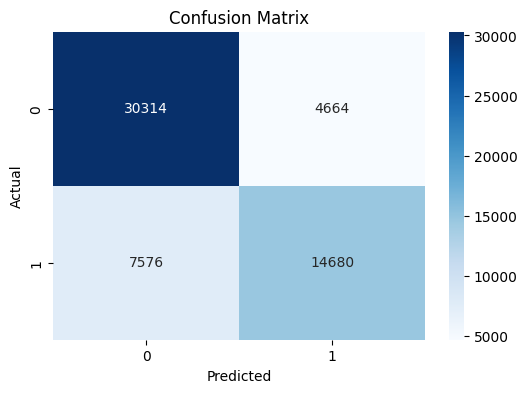

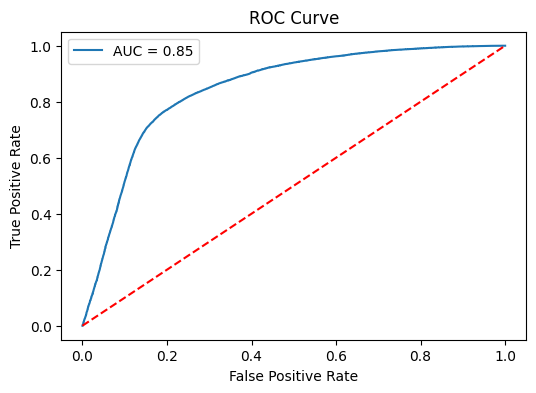

******************************


Model treer_DD loaded successfully.
Training set score: 0.9632
Test set score: -0.2958
R*2 =-0.29580943792583736
******************************


Model rfr_DD loaded successfully.
Training set score: 0.8801
Test set score: 0.3001
R*2 =0.3000601858501176
******************************


Model xgbr_DD loaded successfully.
Training set score: 0.4369
Test set score: 0.3928
R*2 =0.3928200602531433
******************************


Model mlpr_DD loaded successfully.
Training set score: 0.4003
Test set score: 0.3846
R*2 =0.38460388707752935
******************************


Model knnr_DD loaded successfully.
Training set score: 0.5194
Test set score: 0.2679
R*2 =0.2678797985538738
******************************




In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
#fast models by REMOVING MODELS TAKES LONG TIME AND RAM
#model_names_DD = [    "pipe_DD", "regressor_DD", "gnb_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD",    "treer_DD", "rfr_DD", "xgbr_DD", "mlpr_DD"]

# ORIGINAL LINE BEFORE REMOVING MODELS TAKES LONG TIME AND RAM
model_names_DD = ["pipe_DD", "regressor_DD", "gnb_DD", "svc_DD", "knn_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD","treer_DD", "rfr_DD", "xgbr_DD", "mlpr_DD", "knnr_DD"]

# Load all models
loaded_models_DD = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_DD}



print("All models loaded successfully.")

for name, model in loaded_models_DD.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_DD[name].score(X_DD_train, y_DD_train):.4f}')
    print(f'Test set score: {loaded_models_DD[name].score(X_DD_test, y_DD_test):.4f}')

    y_pred = loaded_models_DD[name].predict(X_DD_test)
    print(f'R*2 ={r2_score(y_DD_test, y_pred)}')

    mod =["pipe_DD", "gnb_DD", "knn_DD", "tree_DD", "rf_DD", "xgb_DD", "mlp_DD", "logr_DD"]
    if name in mod:
        y_prob = loaded_models_DD[name].predict_proba(X_DD_test)[:, 1]
        print(f"Model {name} Accuracy: {accuracy_score(y_DD_test, y_pred)}")

        print(classification_report(y_DD_test, y_pred))
        plot_confusion_matrix(y_DD_test, y_pred, "Confusion Matrix")
        plot_roc_curve(y_DD_test, y_prob, "ROC Curve")

    loaded_models_DD[name] = 0
    print('*'*30)
    print('\n')




 🔍 **Overview of Results**
All models were successfully loaded and evaluated. The task appears to involve both **classification** (binary) and **regression** modeling, with an emphasis on assessing predictive performance across various algorithms using training and test scores, R² values, and classification metrics such as precision, recall, and F1-score.

---

🧠 **Classification Models Evaluation**

| Model       | Train Acc | Test Acc | R²      | Notes |
|-------------|-----------|----------|---------|-------|
| `pipe_DD`   | 0.7895    | 0.7866   | 0.1022  | Good generalization. Slight drop from train to test. Class 0 has better recall than class 1. |
| `gnb_DD`    | 0.7875    | 0.7824   | 0.0845  | Balanced performance. Slightly better class 0 precision and recall. |
| `svc_DD`    | 0.8002    | 0.7957   | 0.1402  | Strong performance. No classification report provided. |
| `knn_DD`    | 0.8327    | 0.7682   | 0.0247  | Overfitting suspected. Drop in test accuracy and low R². |
| `tree_DD`   | 0.9825    | 0.6926   | -0.2933 | Severe overfitting. Poor generalization. |
| `rf_DD`     | 0.9825    | 0.7774   | 0.0631  | High training score, lower generalization than expected. |
| `xgb_DD`    | 0.8128    | 0.8027   | 0.1699  | Best generalization. Strong accuracy and balance across classes. |
| `mlp_DD`    | 0.8079    | 0.8026   | 0.1694  | Similar to XGB. Stable and well-balanced performance. |
| `logr_DD`   | 0.7897    | 0.7861   | 0.1001  | Good generalization, comparable to `pipe_DD`. |

 🏆 **Top Classifier Performers**
- **XGB and MLP classifiers** show the **best overall performance**, combining high accuracy (~80%) with good precision/recall balance and generalization.
- **Logistic Regression** and **Pipeline model** (`pipe_DD`) also deliver solid results and appear stable.
- **Tree-based models** like `tree_DD` and `rf_DD` exhibit signs of **overfitting**—excellent training scores but a noticeable drop in test performance.

---

📈 **Regression Models Evaluation**

| Model       | Train R² | Test R² | Notes |
|-------------|----------|---------|-------|
| `regressor_DD` | 0.3505 | 0.3398 | Moderate performance. Better than basic baseline. |
| `treer_DD`     | 0.9632 | -0.2958| Severe overfitting. Likely memorizing training data. |
| `rfr_DD`       | 0.8801 | 0.3001 | Overfitting. Poor test R² compared to training. |
| `xgbr_DD`      | 0.4369 | 0.3928 | Best performing regressor. Decent generalization. |
| `mlpr_DD`      | 0.4003 | 0.3846 | Very close to XGB. Consistent and generalizable. |
| `knnr_DD`      | 0.5194 | 0.2679 | Weaker test performance. Likely impacted by local sensitivity of KNN. |

 🏆 **Top Regressor Performers**
- **XGB Regressor** (`xgbr_DD`) and **MLP Regressor** (`mlpr_DD`) show **the most stable performance** across training and test sets, with R² values near 0.39.
- **Tree-based regressors** (`treer_DD`, `rfr_DD`) suffer from severe **overfitting**.
- **`regressor_DD`** also performs moderately well but is outperformed by `xgbr_DD`.

---

 🧪 **Performance Insights & Suggestions**

✅ General Observations
- Models with **regularization or boosting (XGB, MLP, SVC, Logistic Regression)** consistently outperformed tree-based and KNN models in generalization.
- For classification, most models achieved a **balanced F1-score around 0.77–0.80**, indicating well-distributed class predictions.

⚠️ Areas of Concern
- Overfitting in **decision trees and random forests** (particularly visible in `tree_DD` and `treer_DD`) should be addressed using pruning, max-depth limitation, or cross-validation.
- KNN models (`knn_DD`, `knnr_DD`) showed **good training but weaker test performance**, suggesting sensitivity to local data distribution or high dimensionality.

🧰 Recommendations
- Focus on **XGBoost and MLP** for both classification and regression tasks.
- Consider using **cross-validation** or **early stopping** to further mitigate overfitting.
- Investigate **feature scaling** and **dimensionality reduction (e.g., PCA)** if KNN performance is critical.
- Tune **hyperparameters** (e.g., learning rate, number of trees/layers) for further performance gains.

---

 🏁 Final Takeaway
The analysis shows that **XGBoost and MLP models provide the most robust and consistent results**, making them ideal candidates for deployment or further optimization. Simpler models like Logistic Regression and SVC also offer strong performance with reduced risk of overfitting. Caution is advised with decision trees and random forests unless regularized appropriately.



#### Two Column Output

##### Featured

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_2D = [
    "regressor_2D", "multi_output_reg_2D", "multi_treer_2D", "multi_rfr_2D", "multi_xgbr_2D", "multi_mlpr_2D", "multi_knnr_2D",
    "multi_tree_2D", "multi_rf_2D", "multi_xgb_2D", "multi_mlp_2D", "multi_knn_2D"
]


# Load all models
loaded_models_2D = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_2D}



print("All models loaded successfully.")

for name, model in loaded_models_2D.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_2D[name].score(X_2D_train, y_2D_train):.4f}')
    print(f'Test set score: {loaded_models_2D[name].score(X_2D_test, y_2D_test):.4f}')

    loaded_models_2D[name] = 0


    print('*'*30)
    print('\n')



##### Original

In [ ]:
import joblib
import os

# Define the path where models are stored
load_path = "/content/drive/MyDrive/Project_3_Healthcare/saved_models"

# Define model names
model_names_2DD = [
    "regressor_2DD", "multi_output_reg_2DD", "multi_treer_2DD", "multi_rfr_2DD", "multi_xgbr_2DD", "multi_mlpr_2DD", "multi_knnr_2DD",
    "multi_tree_2DD", "multi_rf_2DD", "multi_xgb_2DD", "multi_mlp_2DD", "multi_knn_2DD"
]



# Load all models
loaded_models_2DD = {name: joblib.load(f"{load_path}/{name}.pkl") for name in model_names_2DD}



print("All models loaded successfully.")

for name, model in loaded_models_2DD.items():
    print(f"Model {name} loaded successfully.")
    # Check if the model is overfitting or underfitting
    print(f'Training set score: {loaded_models_2DD[name].score(X_2DD_train, y_2DD_train):.4f}')
    print(f'Test set score: {loaded_models_2DD[name].score(X_2DD_test, y_2DD_test):.4f}')

    loaded_models_2DD[name] = 0


    print('*'*30)
    print('\n')




---


# Milestone 4: Deployment and Monitoring

## Deployment
- Deploy the model as a REST API (Flask, FastAPI) or interactive dashboards (Streamlit, Dash).
- Host on cloud platforms (AWS, Azure, GCP) or local servers.

In [ ]:
!pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.3/44.3 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.8/9.8 MB 44.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 67.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.1/79.1 kB 7.3 MB/s eta 0:00:00


In [ ]:
import streamlit as st
import pandas as pd
import plotly.graph_objects as go
import plotly.subplots as sp
import numpy as np
from scipy.stats import gaussian_kde

# Streamlit setup
st.set_page_config(layout="wide")
st.title("Numerical Feature Histograms with KDE")

# Upload dataset
uploaded_file = st.file_uploader("Upload your CSV file", type=["csv"])

if uploaded_file:
    Diabetic_DB = pd.read_csv(uploaded_file)

    # Auto-detect numerical columns, or define them manually if needed
    default_numerical_columns = ["HB", "Cholesterol", "BMI", "Heart_Disease", "PhysActivity", "MentHlth"]
    numerical_columns = [col for col in Diabetic_DB.columns if pd.api.types.is_numeric_dtype(Diabetic_DB[col])]

    # Select columns
    selected_columns = st.multiselect(
        "Select numerical columns to visualize",
        options=numerical_columns,
        default=[col for col in default_numerical_columns if col in numerical_columns]
    )

    if selected_columns:
        rows = (len(selected_columns) + 1) // 2

        fig = sp.make_subplots(
            rows=rows, cols=2,
            subplot_titles=[f"Histogram of {col}" for col in selected_columns],
            vertical_spacing=0.1
        )

        for i, col in enumerate(selected_columns):
            row = i // 2 + 1
            col_pos = i % 2 + 1

            data = Diabetic_DB[col].dropna()

            # Histogram
            fig.add_trace(
                go.Histogram(
                    x=data,
                    nbinsx=30,
                    name=f"{col} Histogram",
                    marker_color='royalblue',
                    opacity=0.7,
                    histnorm='probability density'
                ),
                row=row, col=col_pos
            )

            # KDE
            if len(data) > 1:
                kde = gaussian_kde(data)
                x_vals = np.linspace(data.min(), data.max(), 200)
                y_vals = kde(x_vals)

                fig.add_trace(
                    go.Scatter(
                        x=x_vals,
                        y=y_vals,
                        mode='lines',
                        name=f"{col} KDE",
                        line=dict(color='crimson')
                    ),
                    row=row, col=col_pos
                )

        fig.update_layout(
            height=400 * rows,
            width=1000,
            title_text="Histograms with KDE for Numerical Features",
            showlegend=False
        )

        st.plotly_chart(fig, use_container_width=True)
    else:
        st.warning("Please select at least one column to visualize.")
else:
    st.info("Upload a CSV file to begin.")


2025-04-07 16:01:26.314 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 16:01:26.317 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 16:01:26.517 
  command:

    streamlit run /usr/local/lib/python3.11/dist-packages/colab_kernel_launcher.py [ARGUMENTS]
2025-04-07 16:01:26.521 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 16:01:26.524 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 16:01:26.526 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 16:01:26.528 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when runn

In [ ]:
pip install --upgrade streamlit


In [ ]:
import streamlit as st
import pandas as pd
import plotly.graph_objects as go
import plotly.subplots as sp
import numpy as np
from scipy.stats import gaussian_kde

# Set Streamlit page config
st.set_page_config(layout="wide")
st.title("Numerical Feature Histograms with KDE")

# GitHub raw CSV URL (update this with your actual URL)
github_raw_url = "https://raw.githubusercontent.com/SiefShama/Healthcare-Predictive-Analytics-Project/main/data/Diabetic_DB_Mil2.csv"

# Load the CSV file directly from GitHub
@st.cache_data
def load_data(url):
    return pd.read_csv(url)

try:
    Diabetic_DB = load_data(github_raw_url)

    # Detect numerical columns
    default_numerical_columns = ["HB", "Cholesterol", "BMI", "Heart_Disease", "PhysActivity", "MentHlth"]
    numerical_columns = [col for col in Diabetic_DB.columns if pd.api.types.is_numeric_dtype(Diabetic_DB[col])]

    # Column selection
    selected_columns = st.multiselect(
        "Select numerical columns to visualize",
        options=numerical_columns,
        default=[col for col in default_numerical_columns if col in numerical_columns]
    )

    if selected_columns:
        rows = (len(selected_columns) + 1) // 2

        fig = sp.make_subplots(
            rows=rows, cols=2,
            subplot_titles=[f"Histogram of {col}" for col in selected_columns],
            vertical_spacing=0.1
        )

        for i, col in enumerate(selected_columns):
            row = i // 2 + 1
            col_pos = i % 2 + 1
            data = Diabetic_DB[col].dropna()

            # Histogram
            fig.add_trace(
                go.Histogram(
                    x=data,
                    nbinsx=30,
                    name=f"{col} Histogram",
                    marker_color='royalblue',
                    opacity=0.7,
                    histnorm='probability density'
                ),
                row=row, col=col_pos
            )

            # KDE
            if len(data) > 1:
                kde = gaussian_kde(data)
                x_vals = np.linspace(data.min(), data.max(), 200)
                y_vals = kde(x_vals)

                fig.add_trace(
                    go.Scatter(
                        x=x_vals,
                        y=y_vals,
                        mode='lines',
                        name=f"{col} KDE",
                        line=dict(color='crimson')
                    ),
                    row=row, col=col_pos
                )

        fig.update_layout(
            height=400 * rows,
            width=1000,
            title_text="Histograms with KDE for Numerical Features",
            showlegend=False
        )

        st.plotly_chart(fig, use_container_width=True)
    else:
        st.warning("Please select at least one column to visualize.")
except Exception as e:
    st.error(f"Failed to load dataset: {e}")


2025-04-07 17:07:09.163 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:07:09.166 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:07:09.167 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:07:09.168 No runtime found, using MemoryCacheStorageManager
2025-04-07 17:07:09.208 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:07:09.209 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:07:09.212 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:07:09.213 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:07:09.214 Thread 'MainThread':

In [ ]:
import streamlit as st
import pandas as pd
import plotly.graph_objects as go
import plotly.subplots as sp
import numpy as np
from scipy.stats import gaussian_kde

# Set Streamlit page config
st.set_page_config(layout="wide")
st.title("Numerical Feature Histograms with KDE")

# GitHub raw CSV URL (update this with your actual URL)
github_raw_url = "https://raw.githubusercontent.com/SiefShama/Healthcare-Predictive-Analytics-Project/main/data/Diabetic_DB_Mil2.csv"

# Load the CSV file directly from GitHub
@st.cache_data
def load_data(url):
    return pd.read_csv(url)

try:
    # Attempt to load the dataset
    Diabetic_DB = load_data(github_raw_url)

    # Detect numerical columns
    default_numerical_columns = ["HB", "Cholesterol", "BMI", "Heart_Disease", "PhysActivity", "MentHlth"]
    numerical_columns = [col for col in Diabetic_DB.columns if pd.api.types.is_numeric_dtype(Diabetic_DB[col])]

    # Column selection
    selected_columns = st.multiselect(
        "Select numerical columns to visualize",
        options=numerical_columns,
        default=[col for col in default_numerical_columns if col in numerical_columns]
    )

    if selected_columns:
        rows = (len(selected_columns) + 1) // 2

        # Create subplots
        fig = sp.make_subplots(
            rows=rows, cols=2,
            subplot_titles=[f"Histogram of {col}" for col in selected_columns],
            vertical_spacing=0.1
        )

        # Add Histogram and KDE for each selected column
        for i, col in enumerate(selected_columns):
            row = i // 2 + 1
            col_pos = i % 2 + 1
            data = Diabetic_DB[col].dropna()

            # Histogram trace
            fig.add_trace(
                go.Histogram(
                    x=data,
                    nbinsx=30,
                    name=f"{col} Histogram",
                    marker_color='royalblue',
                    opacity=0.7,
                    histnorm='probability density'
                ),
                row=row, col=col_pos
            )

            # KDE trace
            if len(data) > 1:
                kde = gaussian_kde(data)
                x_vals = np.linspace(data.min(), data.max(), 200)
                y_vals = kde(x_vals)

                fig.add_trace(
                    go.Scatter(
                        x=x_vals,
                        y=y_vals,
                        mode='lines',
                        name=f"{col} KDE",
                        line=dict(color='crimson')
                    ),
                    row=row, col=col_pos
                )

        # Update layout
        fig.update_layout(
            height=400 * rows,
            width=1000,
            title_text="Histograms with KDE for Numerical Features",
            showlegend=False
        )

        st.plotly_chart(fig, use_container_width=True)
    else:
        st.warning("Please select at least one column to visualize.")

except Exception as e:
    st.error(f"Failed to load dataset: {e}")


2025-04-07 17:08:29.901 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:08:29.916 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:08:29.917 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:08:29.929 No runtime found, using MemoryCacheStorageManager
2025-04-07 17:08:30.067 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:08:30.070 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:08:30.071 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:08:30.078 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-07 17:08:30.080 Thread 'MainThread':

In [ ]:
# Download and install ngrok manually
!wget https://bin.equinox.io/c/bNyj1mQVY4c/ngrok-v3-stable-linux-amd64.zip
!unzip ngrok-v3-stable-linux-amd64.zip
!chmod +x ngrok


--2025-04-07 17:36:20--  https://bin.equinox.io/c/bNyj1mQVY4c/ngrok-v3-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 13.248.244.96, 75.2.60.68, 35.71.179.82, ...
Connecting to bin.equinox.io (bin.equinox.io)|13.248.244.96|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9432536 (9.0M) [application/octet-stream]
Saving to: ‘ngrok-v3-stable-linux-amd64.zip’

ngrok-v3-stable-lin 100%[===================>]   9.00M  11.2MB/s    in 0.8s    

2025-04-07 17:36:22 (11.2 MB/s) - ‘ngrok-v3-stable-linux-amd64.zip’ saved [9432536/9432536]

Archive:  ngrok-v3-stable-linux-amd64.zip
  inflating: ngrok                   


In [ ]:
# Set up the ngrok tunnel
from pyngrok import ngrok

# Authenticate ngrok (you can skip this if you're using the free tier)
# You can get your authtoken from ngrok's website: https://ngrok.com/docs#get-started
!./ngrok authtoken 2nX5xkAb4zxAIbaP9KUvPUYRzMs_29BWGQYrrDEFid6aLAb9v

# Create a tunnel to the Streamlit app
public_url = ngrok.connect(8501)
print('Streamlit app is live at:', public_url)


Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml
Streamlit app is live at: NgrokTunnel: "https://3614-34-106-11-6.ngrok-free.app" -> "http://localhost:8501"


In [ ]:
# Step 1: Install Streamlit and ngrok in Colab
!pip install streamlit
!pip install pyngrok

# Step 2: Write the Streamlit script to a file
streamlit_code = """
import streamlit as st
import pandas as pd
import plotly.graph_objects as go
import plotly.subplots as sp
import numpy as np
from scipy.stats import gaussian_kde

# Set Streamlit page config
st.set_page_config(layout="wide")
st.title("Numerical Feature Histograms with KDE")

# GitHub raw CSV URL (update this with your actual URL)
github_raw_url = "https://raw.githubusercontent.com/SiefShama/Healthcare-Predictive-Analytics-Project/main/data/Diabetic_DB_Mil2.csv"

# Load the CSV file directly from GitHub
@st.cache_data
def load_data(url):
    return pd.read_csv(url)

try:
    # Attempt to load the dataset
    Diabetic_DB = load_data(github_raw_url)

    # Detect numerical columns
    default_numerical_columns = ["HB", "Cholesterol", "BMI", "Heart_Disease", "PhysActivity", "MentHlth"]
    numerical_columns = [col for col in Diabetic_DB.columns if pd.api.types.is_numeric_dtype(Diabetic_DB[col])]

    # Column selection
    selected_columns = st.multiselect(
        "Select numerical columns to visualize",
        options=numerical_columns,
        default=[col for col in default_numerical_columns if col in numerical_columns]
    )

    if selected_columns:
        rows = (len(selected_columns) + 1) // 2

        # Create subplots
        fig = sp.make_subplots(
            rows=rows, cols=2,
            subplot_titles=[f"Histogram of {col}" for col in selected_columns],
            vertical_spacing=0.1
        )

        # Add Histogram and KDE for each selected column
        for i, col in enumerate(selected_columns):
            row = i // 2 + 1
            col_pos = i % 2 + 1
            data = Diabetic_DB[col].dropna()

            # Histogram trace
            fig.add_trace(
                go.Histogram(
                    x=data,
                    nbinsx=30,
                    name=f"{col} Histogram",
                    marker_color='royalblue',
                    opacity=0.7,
                    histnorm='probability density'
                ),
                row=row, col=col_pos
            )

            # KDE trace
            if len(data) > 1:
                kde = gaussian_kde(data)
                x_vals = np.linspace(data.min(), data.max(), 200)
                y_vals = kde(x_vals)

                fig.add_trace(
                    go.Scatter(
                        x=x_vals,
                        y=y_vals,
                        mode='lines',
                        name=f"{col} KDE",
                        line=dict(color='crimson')
                    ),
                    row=row, col=col_pos
                )

        # Update layout
        fig.update_layout(
            height=400 * rows,
            width=1000,
            title_text="Histograms with KDE for Numerical Features",
            showlegend=False
        )

        st.plotly_chart(fig, use_container_width=True)
    else:
        st.warning("Please select at least one column to visualize.")

except Exception as e:
    st.error(f"Failed to load dataset: {e}")
"""

# Save the Streamlit code to a Python file
with open("app.py", "w") as f:
    f.write(streamlit_code)

# Step 3: Use ngrok to expose the Streamlit app
from pyngrok import ngrok

# Set up a tunnel to the Streamlit app
public_url = ngrok.connect(8501)
print('Streamlit app is live at:', public_url)

# Step 4: Run Streamlit app in the background
!streamlit run app.py &

# Step 5: Access the app via the ngrok URL
print(f"Access your Streamlit app at {public_url}")


Streamlit app is live at: NgrokTunnel: "https://7471-34-106-11-6.ngrok-free.app" -> "http://localhost:8501"



  You can now view your Streamlit app in your browser.

  Local URL: http://localhost:8501
  Network URL: http://172.28.0.12:8501
  External URL: http://34.106.11.6:8501

  Stopping...
Access your Streamlit app at NgrokTunnel: "https://7471-34-106-11-6.ngrok-free.app" -> "http://localhost:8501"


## Monitoring
- Set up performance tracking and alert systems for issues.
- Monitor metrics for potential model drift or anomalies.

## Retraining Strategy
- Plan for periodic retraining with new or updated data.


---


# Milestone 5: Final Documentation and Presentation

## Final Report
- Summarize all project phases, including methodologies and insights.
- Provide actionable recommendations based on findings.

## Final Presentation
- Create a presentation for stakeholders, highlighting key results.
- Include a demo of the deployed application or model.

## Future Improvements
- Suggest areas for enhancement:
  - Incorporating more diverse data.
  - Experimenting with additional algorithms.
  - Optimizing deployment for scalability.

---

# Additional Sections

## Challenges Faced
- Document key challenges encountered during the project lifecycle.

## Lessons Learned
- Reflect on insights and skills gained through the project.

## References
- List resources for datasets, tools, and techniques utilized.

---

# More Sections for Specific Projects

## Ethical Considerations
- Discuss privacy, fairness, or other ethical implications.

## Business Impact
- Highlight how the findings address the original objective.

## Team Contributions
- Acknowledge contributions from team members and collaborators.


---
